unit global alignment を単位として read all-vs-all overlap を取る。

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from IPython.display import display
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.io as pio
pio.templates.default = 'plotly_white'
import logging
import logzero
logzero.loglevel(logging.DEBUG)

In [2]:
from dataclasses import dataclass
from typing import List, Tuple
from collections import Counter, defaultdict
import random
from copy import copy, deepcopy
import numpy as np
import pandas as pd
import igraph as ig
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from logzero import logger
import consed
from BITS.clustering.seq import ClusteringSeq
from BITS.seq.io import save_fasta
from BITS.seq.align import EdlibRunner
from BITS.seq.consed import ConsedRunner
from BITS.seq.utils import revcomp
from BITS.util.io import save_pickle, load_pickle
from BITS.util.proc import run_command, NoDaemonPool
from BITS.plot.plotly import make_line, make_hist, make_scatter, make_layout, show_plot
from vca.types import TRUnit, TRRead

In [3]:
dir_fname = 'work/'
import os
os.chdir(dir_fname)

In [4]:
sync_reads_master = load_pickle("centromere_reads_incl_low_cover_rate_master.pkl")

In [5]:
sync_reads_by_id_master = {read.id: read for read in sync_reads_master}

## k-units as seeds

k個のユニットの列を seed として使うことで、リード全体の alignment を取らずにある程度 overlap 候補を減らせる。

In [6]:
def _find_cand(unit_seq_a, read_id_a, all_sync_units, max_diff=0.02):
    cands = set()
    for unit_seq_b, read_id_b in all_sync_units:
        if read_id_a == read_id_b:
            continue
        if tuple(sorted((read_id_a, read_id_b))) in cands:
            continue
        alignment = er.align(unit_seq_b, unit_seq_a)
        if alignment.diff < max_diff:
            logger.info(f"{read_id_a}~{read_id_b} ({round(100 * alignment.diff, 1)}% diff)")
            cands.add(tuple(sorted((read_id_a, read_id_b))))
    return cands

def find_cand(read_a, k, all_sync_units):
    logger.info(f"Read {read_a.id} prefix")
    start = read_a.units[1].start
    end = read_a.units[k].end
    unit_seq_a = read_a.seq[start:end]
    cands = _find_cand(unit_seq_a, read_a.id, all_sync_units)
    
    logger.info(f"Read {read_a.id} suffix")
    start = read_a.units[-1 - k].start
    end = read_a.units[-2].end
    unit_seq_a = read_a.seq[start:end]
    cands.update(_find_cand(revcomp(unit_seq_a), read_a.id, all_sync_units))
    return cands

In [7]:
er = EdlibRunner("global", revcomp=False, cyclic=False)
k = 2
all_sync_units = [(read.seq[read.units[i].start:read.units[i + k - 1].end], read.id) for read in sync_reads_master for i in range(len(read.units) - k + 1)]

In [8]:
candidates = set()   # all non-duplicated pair of reads overlapped
with NoDaemonPool(20) as pool:
    for ret in pool.starmap(find_cand, [(sync_reads_master[i], k, all_sync_units) for i in range(len(sync_reads_master))]):
        candidates.update(ret)

[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 73 prefix
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 3608 prefix
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:10] 73~3309 (0.8% diff)
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 6796 prefix
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 9731 prefix
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 14819 prefix
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 19539 prefix
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 22844 prefix
[I 190923 19:20:49 <ipython-input-6-29bb3407dce0>:15] Read 27085 prefix
[I 190923 19:20:50 <ipython-input-6-29bb3407dce0>:15] Read 32171 prefix
[I 190923 19:20:50 <ipython-input-6-29bb3407dce0>:15] Read 38512 prefix
[I 190923 19:20:50 <ipython-input-6-29bb3407dce0>:15] Read 47840 prefix
[I 190923 19:20:50 <ipython-input-6-29bb3407dce0>:10] 27085~3984 (1.9% diff)
[I 190923 19:20:50 <ipython-input-6-29bb3407dce0>:15] Read 5358

[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 9731~321069 (1.5% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 73~338213 (2.0% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 47840~314252 (1.7% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 62272~309555 (1.7% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 38512~205463 (0.3% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 100076~269605 (1.8% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 67720~312730 (1.9% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 47840~320043 (1.3% diff)
[I 190923 19:21:02 <ipython-input-6-29bb3407dce0>:10] 84451~318252 (1.5% diff)
[I 190923 19:21:03 <ipython-input-6-29bb3407dce0>:10] 22844~320900 (1.9% diff)
[I 190923 19:21:03 <ipython-input-6-29bb3407dce0>:10] 67720~323279 (1.8% diff)
[I 190923 19:21:03 <ipython-input-6-29bb3407dce0>:10] 106582~321069 (1.9% diff)
[I 190923 19:21:03 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 19:21:13 <ipython-input-6-29bb3407dce0>:10] 53583~99580 (1.8% diff)
[I 190923 19:21:13 <ipython-input-6-29bb3407dce0>:10] 27085~146457 (0.8% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 9731~183637 (0.1% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 47840~164533 (1.8% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 27085~165955 (0.4% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 62272~169823 (0.8% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 84451~170019 (1.0% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 67720~177938 (0.6% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 27085~180524 (1.2% diff)
[I 190923 19:21:14 <ipython-input-6-29bb3407dce0>:10] 47840~187075 (1.5% diff)
[I 190923 19:21:15 <ipython-input-6-29bb3407dce0>:10] 6796~209271 (1.7% diff)
[I 190923 19:21:15 <ipython-input-6-29bb3407dce0>:10] 67720~185352 (0.3% diff)
[I 190923 19:21:15 <ipython-input-6-29bb3407dce0>:10] 4

[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:15] Read 9973 prefix
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 62272~416811 (1.8% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 67720~420749 (1.8% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:15] Read 6867 prefix
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 67720~424406 (0.8% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 67720~425457 (1.9% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 47840~427802 (1.4% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 62272~423407 (0.8% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 106582~415587 (1.9% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 27085~443232 (0.6% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:15] Read 27092 prefix
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:10] 62272~430850 (1.5% diff)
[I 190923 19:21:25 <ipython-input-6-29bb3407dce0>:15] Read 3851 prefix
[I 

[I 190923 19:21:35 <ipython-input-6-29bb3407dce0>:10] 6867~285182 (1.8% diff)
[I 190923 19:21:35 <ipython-input-6-29bb3407dce0>:10] 19889~214209 (0.6% diff)
[I 190923 19:21:35 <ipython-input-6-29bb3407dce0>:10] 6867~287232 (1.9% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 6867~292144 (2.0% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 27092~290722 (1.9% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 67996~258003 (0.5% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 84544~257618 (0.7% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 6867~294290 (1.9% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 106586~243780 (1.8% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 9973~271282 (1.5% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 62454~253686 (1.8% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 6867~298936 (2.0% diff)
[I 190923 19:21:36 <ipython-input-6-29bb3407dce0>:10] 198

[I 190923 19:21:45 <ipython-input-6-29bb3407dce0>:10] 90438~12995 (1.4% diff)
[I 190923 19:21:45 <ipython-input-6-29bb3407dce0>:10] 23043~30626 (1.8% diff)
[I 190923 19:21:45 <ipython-input-6-29bb3407dce0>:10] 32171~115179 (1.9% diff)
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:10] 106586~13712 (1.9% diff)
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:21] Read 19889 suffix
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:21] Read 96518 suffix
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:10] 3851~31865 (0.1% diff)
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:10] 27092~90816 (2.0% diff)
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:10] 54493~307402 (0.0% diff)
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:21] Read 101182 suffix
[I 190923 19:21:46 <ipython-input-6-29bb3407dce0>:10] 32171~151028 (1.9% diff)
[I 190923 19:21:47 <ipython-input-6-29bb3407dce0>:10] 23043~80630 (1.8% diff)
[I 190923 19:21:47 <ipython-input-6-29bb3407dce0>:10] 23043~81211 (1.5% diff)


[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 32171~439131 (1.9% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:15] Read 32808 prefix
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 6867~394125 (0.8% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 90438~342228 (1.8% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 19889~347400 (0.1% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 106586~363402 (1.0% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 62454~345492 (1.4% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 32808~7454 (1.7% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 39104~69456 (1.5% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 32808~9143 (1.9% diff)
[I 190923 19:21:59 <ipython-input-6-29bb3407dce0>:10] 90438~354688 (0.8% diff)
[I 190923 19:22:00 <ipython-input-6-29bb3407dce0>:10] 62454~354902 (1.4% diff)
[I 190923 19:22:00 <ipython-input-6-29bb3407dce0>:10] 9973~41225

[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 9998~147159 (1.8% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 7333~154914 (1.8% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 9998~149670 (2.0% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 7333~158064 (1.9% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 101320~72754 (0.6% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 85725~104772 (1.4% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 7333~165915 (1.5% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 14889~41676 (1.4% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 32808~219937 (1.8% diff)
[I 190923 19:22:06 <ipython-input-6-29bb3407dce0>:10] 3984~16873 (1.7% diff)
[I 190923 19:22:07 <ipython-input-6-29bb3407dce0>:10] 7333~171207 (1.8% diff)
[I 190923 19:22:07 <ipython-input-6-29bb3407dce0>:10] 101320~87773 (1.8% diff)
[I 190923 19:22:07 <ipython-input-6-29bb3407dce0>:10] 39104~2

[I 190923 19:22:15 <ipython-input-6-29bb3407dce0>:10] 69201~294244 (1.7% diff)
[I 190923 19:22:15 <ipython-input-6-29bb3407dce0>:10] 7333~380015 (1.9% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 7333~382597 (1.8% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 236~380798 (1.5% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 3984~250142 (1.9% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 14889~296015 (1.5% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 101320~324263 (1.6% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 3984~253082 (2.0% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:21] Read 32808 suffix
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 90639~341181 (1.9% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 32808~4134 (2.0% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 90639~347462 (1.8% diff)
[I 190923 19:22:16 <ipython-input-6-29bb3407dce0>:10] 7333~407948 

[I 190923 19:22:28 <ipython-input-6-29bb3407dce0>:10] 27663~263896 (0.7% diff)
[I 190923 19:22:28 <ipython-input-6-29bb3407dce0>:10] 9998~260990 (1.0% diff)
[I 190923 19:22:29 <ipython-input-6-29bb3407dce0>:21] Read 54522 suffix
[I 190923 19:22:29 <ipython-input-6-29bb3407dce0>:10] 107083~229671 (1.8% diff)
[I 190923 19:22:29 <ipython-input-6-29bb3407dce0>:10] 76800~216044 (1.9% diff)
[I 190923 19:22:30 <ipython-input-6-29bb3407dce0>:10] 32808~327625 (1.4% diff)
[I 190923 19:22:30 <ipython-input-6-29bb3407dce0>:10] 62516~218950 (1.7% diff)
[I 190923 19:22:30 <ipython-input-6-29bb3407dce0>:10] 3984~160689 (1.5% diff)
[I 190923 19:22:30 <ipython-input-6-29bb3407dce0>:10] 32808~335456 (1.5% diff)
[I 190923 19:22:30 <ipython-input-6-29bb3407dce0>:10] 20049~420225 (1.2% diff)
[I 190923 19:22:30 <ipython-input-6-29bb3407dce0>:10] 9998~299676 (1.3% diff)
[I 190923 19:22:30 <ipython-input-6-29bb3407dce0>:10] 76800~249825 (2.0% diff)
[I 190923 19:22:31 <ipython-input-6-29bb3407dce0>:10] 62516~2

[I 190923 19:22:42 <ipython-input-6-29bb3407dce0>:15] Read 85752 prefix
[I 190923 19:22:42 <ipython-input-6-29bb3407dce0>:10] 10305~132601 (1.5% diff)
[I 190923 19:22:42 <ipython-input-6-29bb3407dce0>:10] 300~141689 (0.8% diff)
[I 190923 19:22:42 <ipython-input-6-29bb3407dce0>:10] 15230~22230 (0.8% diff)
[I 190923 19:22:42 <ipython-input-6-29bb3407dce0>:10] 90645~76474 (2.0% diff)
[I 190923 19:22:42 <ipython-input-6-29bb3407dce0>:10] 101547~74915 (0.7% diff)
[I 190923 19:22:43 <ipython-input-6-29bb3407dce0>:10] 10305~150419 (1.9% diff)
[I 190923 19:22:43 <ipython-input-6-29bb3407dce0>:10] 15230~39816 (1.8% diff)
[I 190923 19:22:43 <ipython-input-6-29bb3407dce0>:10] 15230~48764 (1.7% diff)
[I 190923 19:22:43 <ipython-input-6-29bb3407dce0>:10] 15230~54493 (1.1% diff)
[I 190923 19:22:43 <ipython-input-6-29bb3407dce0>:10] 62627~82247 (1.5% diff)
[I 190923 19:22:43 <ipython-input-6-29bb3407dce0>:10] 4062~27085 (1.3% diff)
[I 190923 19:22:43 <ipython-input-6-29bb3407dce0>:10] 10305~173580 (1

[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 10305~379441 (1.8% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 49512~320118 (0.1% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 62627~305329 (1.9% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 10305~382400 (1.7% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 15230~303176 (1.9% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 10305~387251 (1.9% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 15230~307402 (1.9% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 76903~338676 (1.8% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 10305~390693 (1.7% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 10305~391581 (1.9% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 10305~391947 (1.5% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10] 10305~393886 (1.9% diff)
[I 190923 19:22:53 <ipython-input-6-29bb3407dce0>:10

[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 20275~305314 (2.0% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 107269~198246 (1.3% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 107269~199561 (1.8% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 62627~148630 (0.8% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 300~228098 (0.7% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:21] Read 54680 suffix
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 107269~213605 (1.3% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 85752~133130 (1.9% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 27705~265626 (0.3% diff)
[I 190923 19:23:04 <ipython-input-6-29bb3407dce0>:10] 62627~171207 (1.8% diff)
[I 190923 19:23:05 <ipython-input-6-29bb3407dce0>:10] 85752~139692 (0.3% diff)
[I 190923 19:23:05 <ipython-input-6-29bb3407dce0>:10] 62627~177438 (1.7% diff)
[I 190923 19:23:05 <ipython-input-6-29bb3407dce0>:10] 1072

[I 190923 19:23:14 <ipython-input-6-29bb3407dce0>:10] 62627~399675 (1.8% diff)
[I 190923 19:23:14 <ipython-input-6-29bb3407dce0>:10] 107668~6428 (1.8% diff)
[I 190923 19:23:14 <ipython-input-6-29bb3407dce0>:15] Read 76930 prefix
[I 190923 19:23:14 <ipython-input-6-29bb3407dce0>:15] Read 90816 prefix
[I 190923 19:23:14 <ipython-input-6-29bb3407dce0>:10] 96735~401865 (0.7% diff)
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:10] 85752~360454 (1.8% diff)
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:10] 85752~362021 (1.8% diff)
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:10] 85752~365072 (1.8% diff)
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:15] Read 101550 prefix
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:10] 62627~420225 (1.7% diff)
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:15] Read 49955 prefix
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:10] 49955~3571 (0.4% diff)
[I 190923 19:23:15 <ipython-input-6-29bb3407dce0>:10] 101550~9046 (1.6% diff)
[I 1

[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 23270~415302 (1.7% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 39760~15390 (0.3% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 86438~204031 (0.3% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 27940~337951 (1.7% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 23270~421471 (1.7% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 69456~237955 (0.6% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 62923~249975 (1.7% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 54816~42501 (0.1% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 54816~49512 (1.1% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 54816~57248 (1.8% diff)
[I 190923 19:23:25 <ipython-input-6-29bb3407dce0>:10] 23270~439126 (0.3% diff)
[I 190923 19:23:26 <ipython-input-6-29bb3407dce0>:10] 27940~353094 (1.8% diff)
[I 190923 19:23:26 <ipython-input-6-29bb3407dce0>:10] 96

[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 33523~208183 (0.3% diff)
[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 54816~320118 (1.1% diff)
[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 27940~185233 (1.7% diff)
[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 369~91801 (1.4% diff)
[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 10757~183637 (1.7% diff)
[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 27940~185369 (1.4% diff)
[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 4134~9143 (2.0% diff)
[I 190923 19:23:36 <ipython-input-6-29bb3407dce0>:10] 7556~165955 (2.0% diff)
[I 190923 19:23:37 <ipython-input-6-29bb3407dce0>:10] 54816~336646 (0.4% diff)
[I 190923 19:23:37 <ipython-input-6-29bb3407dce0>:10] 10757~194397 (1.9% diff)
[I 190923 19:23:37 <ipython-input-6-29bb3407dce0>:10] 369~105537 (0.6% diff)
[I 190923 19:23:37 <ipython-input-6-29bb3407dce0>:10] 27940~197712 (1.5% diff)
[I 190923 19:23:37 <ipython-input-6-29bb3407dce0>:21] Read 15

[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:15] Read 7572 prefix
[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:10] 369~380798 (0.8% diff)
[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:10] 96755~318915 (0.3% diff)
[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:10] 10827~5713 (1.5% diff)
[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:10] 69456~340209 (1.7% diff)
[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:10] 69456~347157 (1.3% diff)
[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:10] 76930~394874 (1.4% diff)
[I 190923 19:23:48 <ipython-input-6-29bb3407dce0>:10] 69456~349873 (1.3% diff)
[I 190923 19:23:49 <ipython-input-6-29bb3407dce0>:10] 7572~10827 (1.7% diff)
[I 190923 19:23:49 <ipython-input-6-29bb3407dce0>:10] 69456~353168 (1.3% diff)
[I 190923 19:23:49 <ipython-input-6-29bb3407dce0>:10] 101550~411062 (1.0% diff)
[I 190923 19:23:49 <ipython-input-6-29bb3407dce0>:10] 76930~421471 (1.4% diff)
[I 190923 19:23:50 <ipython-input-6-29bb3407dce0>:10] 10827~34738

[I 190923 19:24:05 <ipython-input-6-29bb3407dce0>:10] 54865~9998 (1.7% diff)
[I 190923 19:24:05 <ipython-input-6-29bb3407dce0>:10] 4194~297405 (0.8% diff)
[I 190923 19:24:06 <ipython-input-6-29bb3407dce0>:10] 7572~419969 (1.4% diff)
[I 190923 19:24:06 <ipython-input-6-29bb3407dce0>:10] 90879~363874 (0.3% diff)
[I 190923 19:24:06 <ipython-input-6-29bb3407dce0>:21] Read 29115 suffix
[I 190923 19:24:06 <ipython-input-6-29bb3407dce0>:21] Read 10827 suffix
[I 190923 19:24:06 <ipython-input-6-29bb3407dce0>:10] 23402~125673 (1.7% diff)
[I 190923 19:24:06 <ipython-input-6-29bb3407dce0>:10] 54865~32171 (2.0% diff)
[I 190923 19:24:07 <ipython-input-6-29bb3407dce0>:10] 54865~34247 (2.0% diff)
[I 190923 19:24:07 <ipython-input-6-29bb3407dce0>:21] Read 7572 suffix
[I 190923 19:24:07 <ipython-input-6-29bb3407dce0>:10] 63719~390777 (0.7% diff)
[I 190923 19:24:07 <ipython-input-6-29bb3407dce0>:10] 7572~765 (1.7% diff)
[I 190923 19:24:07 <ipython-input-6-29bb3407dce0>:10] 23402~139684 (1.1% diff)
[I 19

[I 190923 19:24:19 <ipython-input-6-29bb3407dce0>:21] Read 34247 suffix
[I 190923 19:24:19 <ipython-input-6-29bb3407dce0>:10] 7572~318737 (1.3% diff)
[I 190923 19:24:19 <ipython-input-6-29bb3407dce0>:21] Read 23402 suffix
[I 190923 19:24:19 <ipython-input-6-29bb3407dce0>:10] 90879~290722 (0.1% diff)
[I 190923 19:24:19 <ipython-input-6-29bb3407dce0>:10] 29115~345492 (1.3% diff)
[I 190923 19:24:19 <ipython-input-6-29bb3407dce0>:10] 54865~380537 (1.7% diff)
[I 190923 19:24:20 <ipython-input-6-29bb3407dce0>:10] 76969~198167 (1.8% diff)
[I 190923 19:24:20 <ipython-input-6-29bb3407dce0>:10] 90879~296418 (0.6% diff)
[I 190923 19:24:20 <ipython-input-6-29bb3407dce0>:10] 29115~354902 (1.9% diff)
[I 190923 19:24:20 <ipython-input-6-29bb3407dce0>:10] 10827~353221 (1.8% diff)
[I 190923 19:24:20 <ipython-input-6-29bb3407dce0>:10] 102171~297405 (1.7% diff)
[I 190923 19:24:21 <ipython-input-6-29bb3407dce0>:10] 7572~356798 (1.3% diff)
[I 190923 19:24:21 <ipython-input-6-29bb3407dce0>:10] 7572~356921 (

[I 190923 19:24:32 <ipython-input-6-29bb3407dce0>:10] 54865~249223 (1.7% diff)
[I 190923 19:24:32 <ipython-input-6-29bb3407dce0>:10] 546~154914 (1.8% diff)
[I 190923 19:24:32 <ipython-input-6-29bb3407dce0>:10] 63730~139684 (0.6% diff)
[I 190923 19:24:32 <ipython-input-6-29bb3407dce0>:10] 86590~75008 (1.2% diff)
[I 190923 19:24:32 <ipython-input-6-29bb3407dce0>:10] 41012~15390 (1.5% diff)
[I 190923 19:24:32 <ipython-input-6-29bb3407dce0>:10] 63730~142907 (1.4% diff)
[I 190923 19:24:32 <ipython-input-6-29bb3407dce0>:10] 546~165915 (1.4% diff)
[I 190923 19:24:33 <ipython-input-6-29bb3407dce0>:10] 29126~254204 (1.3% diff)
[I 190923 19:24:33 <ipython-input-6-29bb3407dce0>:10] 29126~257618 (0.7% diff)
[I 190923 19:24:33 <ipython-input-6-29bb3407dce0>:10] 4306~86590 (2.0% diff)
[I 190923 19:24:33 <ipython-input-6-29bb3407dce0>:10] 7723~229572 (1.8% diff)
[I 190923 19:24:33 <ipython-input-6-29bb3407dce0>:10] 29126~272397 (1.0% diff)
[I 190923 19:24:34 <ipython-input-6-29bb3407dce0>:10] 4306~10

[I 190923 19:24:47 <ipython-input-6-29bb3407dce0>:10] 55736~204996 (0.3% diff)
[I 190923 19:24:48 <ipython-input-6-29bb3407dce0>:21] Read 96908 suffix
[I 190923 19:24:48 <ipython-input-6-29bb3407dce0>:10] 90908~124965 (0.6% diff)
[I 190923 19:24:49 <ipython-input-6-29bb3407dce0>:10] 41012~431820 (0.7% diff)
[I 190923 19:24:49 <ipython-input-6-29bb3407dce0>:10] 96908~31085 (0.1% diff)
[I 190923 19:24:49 <ipython-input-6-29bb3407dce0>:10] 4306~39104 (0.1% diff)
[I 190923 19:24:49 <ipython-input-6-29bb3407dce0>:21] Read 41012 suffix
[I 190923 19:24:49 <ipython-input-6-29bb3407dce0>:10] 69925~30473 (0.8% diff)
[I 190923 19:24:50 <ipython-input-6-29bb3407dce0>:10] 90908~184181 (2.0% diff)
[I 190923 19:24:50 <ipython-input-6-29bb3407dce0>:10] 55736~265238 (1.9% diff)
[I 190923 19:24:51 <ipython-input-6-29bb3407dce0>:10] 7723~225984 (1.4% diff)
[I 190923 19:24:51 <ipython-input-6-29bb3407dce0>:10] 55736~287232 (0.8% diff)
[I 190923 19:24:51 <ipython-input-6-29bb3407dce0>:10] 90908~212317 (1.9

[I 190923 19:25:08 <ipython-input-6-29bb3407dce0>:10] 108785~188275 (1.8% diff)
[I 190923 19:25:09 <ipython-input-6-29bb3407dce0>:10] 86737~98696 (0.0% diff)
[I 190923 19:25:09 <ipython-input-6-29bb3407dce0>:10] 559~188716 (1.4% diff)
[I 190923 19:25:09 <ipython-input-6-29bb3407dce0>:10] 4443~80645 (1.8% diff)
[I 190923 19:25:09 <ipython-input-6-29bb3407dce0>:10] 559~202130 (1.3% diff)
[I 190923 19:25:09 <ipython-input-6-29bb3407dce0>:10] 4443~85725 (1.4% diff)
[I 190923 19:25:09 <ipython-input-6-29bb3407dce0>:10] 41245~66789 (1.7% diff)
[I 190923 19:25:10 <ipython-input-6-29bb3407dce0>:10] 4443~104772 (1.5% diff)
[I 190923 19:25:10 <ipython-input-6-29bb3407dce0>:10] 97595~134288 (1.9% diff)
[I 190923 19:25:11 <ipython-input-6-29bb3407dce0>:10] 41245~107668 (2.0% diff)
[I 190923 19:25:11 <ipython-input-6-29bb3407dce0>:10] 41245~110840 (1.4% diff)
[I 190923 19:25:11 <ipython-input-6-29bb3407dce0>:10] 108785~247986 (1.8% diff)
[I 190923 19:25:11 <ipython-input-6-29bb3407dce0>:10] 79212~1

[I 190923 19:25:23 <ipython-input-6-29bb3407dce0>:10] 41245~416557 (0.4% diff)
[I 190923 19:25:23 <ipython-input-6-29bb3407dce0>:10] 108785~97595 (1.4% diff)
[I 190923 19:25:23 <ipython-input-6-29bb3407dce0>:10] 24049~241011 (0.3% diff)
[I 190923 19:25:23 <ipython-input-6-29bb3407dce0>:21] Read 97595 suffix
[I 190923 19:25:23 <ipython-input-6-29bb3407dce0>:10] 559~95028 (0.1% diff)
[I 190923 19:25:23 <ipython-input-6-29bb3407dce0>:10] 108785~103399 (1.9% diff)
[I 190923 19:25:24 <ipython-input-6-29bb3407dce0>:10] 7726~133202 (1.9% diff)
[I 190923 19:25:24 <ipython-input-6-29bb3407dce0>:10] 49959~41012 (1.0% diff)
[I 190923 19:25:24 <ipython-input-6-29bb3407dce0>:10] 34738~248365 (0.8% diff)
[I 190923 19:25:24 <ipython-input-6-29bb3407dce0>:10] 97595~11630 (1.4% diff)
[I 190923 19:25:24 <ipython-input-6-29bb3407dce0>:21] Read 41245 suffix
[I 190923 19:25:24 <ipython-input-6-29bb3407dce0>:21] Read 4443 suffix
[I 190923 19:25:24 <ipython-input-6-29bb3407dce0>:10] 49959~65802 (2.0% diff)
[

[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 11160~373375 (1.3% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 24049~9731 (1.8% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 97595~262162 (1.4% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 559~318426 (1.1% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:21] Read 69934 suffix
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 108785~329438 (0.8% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 24049~11472 (1.7% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 24049~13712 (2.0% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 24049~19232 (1.7% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 24049~21318 (1.7% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 559~328341 (1.9% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 63982~283419 (1.8% diff)
[I 190923 19:25:33 <ipython-input-6-29bb3407dce0>:10] 55826~404027 (

[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 4443~394585 (1.0% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 63982~441274 (1.5% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 90976~8875 (1.7% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 97595~432281 (1.8% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:15] Read 64087 prefix
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:15] Read 50116 prefix
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 109443~51570 (1.1% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 29364~139684 (1.8% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 24049~225360 (2.0% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:15] Read 97611 prefix
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 102670~39816 (1.8% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 109443~62061 (1.4% diff)
[I 190923 19:25:40 <ipython-input-6-29bb3407dce0>:10] 69934~218950 (1.8% dif

[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 24049~432166 (1.8% diff)
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 109443~279375 (1.1% diff)
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:15] Read 24300 prefix
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 109443~287839 (1.1% diff)
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 55826~366181 (1.8% diff)
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 87071~219655 (1.6% diff)
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 55826~370400 (1.5% diff)
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 87071~221798 (1.7% diff)
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:15] Read 34988 prefix
[I 190923 19:25:49 <ipython-input-6-29bb3407dce0>:10] 69934~433856 (1.8% diff)
[I 190923 19:25:50 <ipython-input-6-29bb3407dce0>:10] 69934~439685 (1.9% diff)
[I 190923 19:25:50 <ipython-input-6-29bb3407dce0>:15] Read 72549 prefix
[I 190923 19:25:50 <ipython-input-6-29bb3407dce0>:10] 29364~389750 (2.0

[I 190923 19:26:01 <ipython-input-6-29bb3407dce0>:21] Read 80008 suffix
[I 190923 19:26:01 <ipython-input-6-29bb3407dce0>:10] 7758~173412 (1.5% diff)
[I 190923 19:26:01 <ipython-input-6-29bb3407dce0>:10] 11236~209271 (1.9% diff)
[I 190923 19:26:01 <ipython-input-6-29bb3407dce0>:10] 21318~274368 (1.7% diff)
[I 190923 19:26:01 <ipython-input-6-29bb3407dce0>:10] 7758~188060 (1.7% diff)
[I 190923 19:26:01 <ipython-input-6-29bb3407dce0>:21] Read 41367 suffix
[I 190923 19:26:02 <ipython-input-6-29bb3407dce0>:10] 97611~83219 (0.6% diff)
[I 190923 19:26:02 <ipython-input-6-29bb3407dce0>:21] Read 50116 suffix
[I 190923 19:26:02 <ipython-input-6-29bb3407dce0>:10] 7758~197449 (1.4% diff)
[I 190923 19:26:02 <ipython-input-6-29bb3407dce0>:10] 29364~248365 (1.8% diff)
[I 190923 19:26:02 <ipython-input-6-29bb3407dce0>:10] 97611~91801 (0.7% diff)
[I 190923 19:26:02 <ipython-input-6-29bb3407dce0>:10] 109443~179480 (1.2% diff)
[I 190923 19:26:02 <ipython-input-6-29bb3407dce0>:10] 7758~209944 (1.7% diff)

[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 34988~8600 (1.1% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 15872~17770 (1.1% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 34988~8877 (0.6% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 80008~219937 (1.9% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 109443~338605 (1.7% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 34988~12240 (1.8% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 41367~210362 (1.7% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:21] Read 56270 suffix
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 7758~352917 (0.8% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 21318~11947 (1.3% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 80008~225320 (1.8% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 24300~76048 (0.7% diff)
[I 190923 19:26:09 <ipython-input-6-29bb3407dce0>:10] 80008~232360 

[I 190923 19:26:14 <ipython-input-6-29bb3407dce0>:10] 11472~74880 (2.0% diff)
[I 190923 19:26:14 <ipython-input-6-29bb3407dce0>:10] 109580~22230 (0.6% diff)
[I 190923 19:26:14 <ipython-input-6-29bb3407dce0>:10] 34988~174254 (0.3% diff)
[I 190923 19:26:14 <ipython-input-6-29bb3407dce0>:10] 11472~83219 (1.9% diff)
[I 190923 19:26:14 <ipython-input-6-29bb3407dce0>:10] 80008~345093 (1.8% diff)
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:10] 80008~348831 (1.8% diff)
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:10] 11472~90327 (1.9% diff)
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:10] 41367~337951 (1.9% diff)
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:10] 21318~169823 (1.0% diff)
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:10] 109580~39816 (0.6% diff)
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:15] Read 102745 prefix
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:10] 11472~99942 (1.7% diff)
[I 190923 19:26:15 <ipython-input-6-29bb3407dce0>:10] 7898~629

[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 11472~239252 (1.4% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 21318~287839 (0.7% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 87302~81945 (1.1% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 87302~82848 (1.7% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 11472~241375 (1.8% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 34988~311507 (0.7% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 109580~193551 (1.5% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 34988~314252 (0.6% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 29608~244644 (1.7% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 34988~315734 (1.5% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 11472~246539 (1.9% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10] 97703~129277 (0.3% diff)
[I 190923 19:26:20 <ipython-input-6-29bb3407dce0>:10]

[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:10] 15872~387772 (1.4% diff)
[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:10] 15872~388214 (1.8% diff)
[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:10] 51006~133130 (1.3% diff)
[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:15] Read 24689 prefix
[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:10] 29608~328424 (1.0% diff)
[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:10] 21318~379441 (1.8% diff)
[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:10] 21318~384933 (2.0% diff)
[I 190923 19:26:24 <ipython-input-6-29bb3407dce0>:10] 11472~345283 (1.8% diff)
[I 190923 19:26:25 <ipython-input-6-29bb3407dce0>:10] 97703~244795 (1.5% diff)
[I 190923 19:26:25 <ipython-input-6-29bb3407dce0>:10] 56270~360454 (1.2% diff)
[I 190923 19:26:25 <ipython-input-6-29bb3407dce0>:10] 56270~362021 (1.9% diff)
[I 190923 19:26:25 <ipython-input-6-29bb3407dce0>:10] 29608~338676 (1.3% diff)
[I 190923 19:26:25 <ipython-input-6-29bb3407dce0>:10] 34988

[I 190923 19:26:32 <ipython-input-6-29bb3407dce0>:10] 72754~141265 (1.5% diff)
[I 190923 19:26:32 <ipython-input-6-29bb3407dce0>:21] Read 91107 suffix
[I 190923 19:26:32 <ipython-input-6-29bb3407dce0>:21] Read 741 suffix
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 72754~161580 (1.7% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 87302~420395 (1.4% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 97703~441255 (1.7% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 97703~442077 (1.8% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:21] Read 97703 suffix
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 51006~332840 (0.7% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 87302~425564 (1.7% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 51006~335383 (0.6% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 56640~130622 (1.9% diff)
[I 190923 19:26:33 <ipython-input-6-29bb3407dce0>:10] 41676~369777 (1.3% di

[I 190923 19:26:48 <ipython-input-6-29bb3407dce0>:10] 72754~96518 (1.4% diff)
[I 190923 19:26:48 <ipython-input-6-29bb3407dce0>:10] 30473~56701 (2.0% diff)
[I 190923 19:26:48 <ipython-input-6-29bb3407dce0>:10] 56640~22230 (1.1% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 91107~381581 (1.8% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 102745~80645 (0.8% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 35217~142913 (1.9% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 30473~83219 (1.8% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 56640~39816 (1.4% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 35217~149352 (1.8% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 97703~373538 (1.8% diff)
[I 190923 19:26:49 <ipython-input-6-29bb3407dce0>:10] 56640~48764 (1.9% diff)
[I 190923 19:26:50 <ipython-input-6-29bb3407dce0>:10] 72754~133130 (1.9% diff)
[I 190923 19:26:50 <ipython-input-6-29bb3407dce0>:10] 8009

[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 30473~308678 (1.5% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 42174~54680 (1.7% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 30473~310105 (1.8% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 30473~312504 (1.9% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 91463~204049 (1.8% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 30473~316627 (1.8% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 72754~330911 (0.3% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 30473~321069 (1.8% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 765~207963 (0.4% diff)
[I 190923 19:26:58 <ipython-input-6-29bb3407dce0>:10] 30473~322477 (2.0% diff)
[I 190923 19:26:59 <ipython-input-6-29bb3407dce0>:10] 80486~98100 (1.7% diff)
[I 190923 19:26:59 <ipython-input-6-29bb3407dce0>:10] 30473~334093 (0.8% diff)
[I 190923 19:26:59 <ipython-input-6-29bb3407dce0>:10] 30

[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 51150~278121 (0.7% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:21] Read 11630 suffix
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 16694~121493 (1.1% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 56701~26291 (1.4% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 98100~346530 (2.0% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 765~411275 (1.9% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 91463~417969 (1.9% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 21373~125930 (1.9% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 42174~307325 (1.3% diff)
[I 190923 19:27:07 <ipython-input-6-29bb3407dce0>:10] 42174~308037 (0.3% diff)
[I 190923 19:27:08 <ipython-input-6-29bb3407dce0>:10] 30473~113773 (2.0% diff)
[I 190923 19:27:08 <ipython-input-6-29bb3407dce0>:10] 11630~14493 (1.8% diff)
[I 190923 19:27:08 <ipython-input-6-29bb3407dce0>:10] 109645~43

[I 190923 19:27:16 <ipython-input-6-29bb3407dce0>:10] 42174~87071 (1.1% diff)
[I 190923 19:27:16 <ipython-input-6-29bb3407dce0>:10] 11630~241011 (1.7% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 30473~321327 (1.8% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 80486~101550 (2.0% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 72925~264463 (1.4% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 16694~371775 (1.7% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 8077~282777 (1.8% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 64244~185243 (1.7% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 8077~287242 (1.8% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 91463~229237 (2.0% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 21373~372741 (1.9% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 56701~310842 (1.9% diff)
[I 190923 19:27:17 <ipython-input-6-29bb3407dce0>:10] 6

[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 91463~381787 (2.0% diff)
[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 11630~420749 (1.3% diff)
[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 11630~424406 (1.8% diff)
[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 11630~425457 (2.0% diff)
[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 8600~8877 (1.9% diff)
[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 25062~62454 (0.3% diff)
[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 21373~106586 (1.9% diff)
[I 190923 19:27:24 <ipython-input-6-29bb3407dce0>:10] 11630~426454 (1.8% diff)
[I 190923 19:27:25 <ipython-input-6-29bb3407dce0>:10] 21373~109443 (1.9% diff)
[I 190923 19:27:25 <ipython-input-6-29bb3407dce0>:10] 21373~109645 (1.5% diff)
[I 190923 19:27:25 <ipython-input-6-29bb3407dce0>:10] 11630~431820 (1.9% diff)
[I 190923 19:27:25 <ipython-input-6-29bb3407dce0>:10] 80486~312838 (1.8% diff)
[I 190923 19:27:25 <ipython-input-6-29bb3407dce0>:10] 56

[I 190923 19:27:34 <ipython-input-6-29bb3407dce0>:10] 8600~272397 (1.9% diff)
[I 190923 19:27:34 <ipython-input-6-29bb3407dce0>:10] 91801~224064 (1.9% diff)
[I 190923 19:27:34 <ipython-input-6-29bb3407dce0>:10] 80630~103399 (1.1% diff)
[I 190923 19:27:34 <ipython-input-6-29bb3407dce0>:10] 91801~225360 (1.9% diff)
[I 190923 19:27:35 <ipython-input-6-29bb3407dce0>:10] 109974~233995 (0.3% diff)
[I 190923 19:27:35 <ipython-input-6-29bb3407dce0>:10] 80630~134288 (1.9% diff)
[I 190923 19:27:36 <ipython-input-6-29bb3407dce0>:10] 56701~307279 (1.1% diff)
[I 190923 19:27:36 <ipython-input-6-29bb3407dce0>:10] 64265~219937 (1.9% diff)
[I 190923 19:27:36 <ipython-input-6-29bb3407dce0>:10] 51495~53583 (2.0% diff)
[I 190923 19:27:36 <ipython-input-6-29bb3407dce0>:10] 21373~369960 (1.5% diff)
[I 190923 19:27:36 <ipython-input-6-29bb3407dce0>:10] 109974~253686 (0.4% diff)
[I 190923 19:27:36 <ipython-input-6-29bb3407dce0>:10] 64265~225320 (1.3% diff)
[I 190923 19:27:36 <ipython-input-6-29bb3407dce0>:10

[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:10] 91801~404075 (1.1% diff)
[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:10] 11920~432219 (2.0% diff)
[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:10] 35406~143286 (1.3% diff)
[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:10] 98110~372055 (1.8% diff)
[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:21] Read 11920 suffix
[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:10] 109974~392399 (0.7% diff)
[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:10] 35406~147506 (1.0% diff)
[I 190923 19:27:42 <ipython-input-6-29bb3407dce0>:10] 35406~147619 (1.0% diff)
[I 190923 19:27:43 <ipython-input-6-29bb3407dce0>:10] 35406~154914 (1.4% diff)
[I 190923 19:27:43 <ipython-input-6-29bb3407dce0>:10] 35406~158064 (1.7% diff)
[I 190923 19:27:43 <ipython-input-6-29bb3407dce0>:10] 5208~90102 (1.7% diff)
[I 190923 19:27:43 <ipython-input-6-29bb3407dce0>:10] 30626~81945 (0.8% diff)
[I 190923 19:27:43 <ipython-input-6-29bb3407dce0>:10] 91801~4

[I 190923 19:27:52 <ipython-input-6-29bb3407dce0>:10] 103312~331745 (1.8% diff)
[I 190923 19:27:52 <ipython-input-6-29bb3407dce0>:10] 103312~331977 (1.9% diff)
[I 190923 19:27:52 <ipython-input-6-29bb3407dce0>:10] 35406~382597 (1.4% diff)
[I 190923 19:27:53 <ipython-input-6-29bb3407dce0>:10] 5208~319082 (1.3% diff)
[I 190923 19:27:53 <ipython-input-6-29bb3407dce0>:10] 11920~262499 (1.7% diff)
[I 190923 19:27:53 <ipython-input-6-29bb3407dce0>:10] 35406~407948 (1.0% diff)
[I 190923 19:27:54 <ipython-input-6-29bb3407dce0>:10] 109974~259308 (1.7% diff)
[I 190923 19:27:54 <ipython-input-6-29bb3407dce0>:10] 5208~339863 (1.0% diff)
[I 190923 19:27:54 <ipython-input-6-29bb3407dce0>:10] 51495~373568 (1.9% diff)
[I 190923 19:27:54 <ipython-input-6-29bb3407dce0>:10] 11920~287839 (2.0% diff)
[I 190923 19:27:54 <ipython-input-6-29bb3407dce0>:10] 35406~436561 (1.1% diff)
[I 190923 19:27:54 <ipython-input-6-29bb3407dce0>:21] Read 35406 suffix
[I 190923 19:27:55 <ipython-input-6-29bb3407dce0>:10] 9180

[I 190923 19:28:05 <ipython-input-6-29bb3407dce0>:10] 73637~437688 (2.0% diff)
[I 190923 19:28:05 <ipython-input-6-29bb3407dce0>:10] 57089~134669 (1.5% diff)
[I 190923 19:28:05 <ipython-input-6-29bb3407dce0>:10] 57089~139641 (1.1% diff)
[I 190923 19:28:05 <ipython-input-6-29bb3407dce0>:10] 11947~95114 (1.8% diff)
[I 190923 19:28:05 <ipython-input-6-29bb3407dce0>:10] 16818~218108 (1.8% diff)
[I 190923 19:28:05 <ipython-input-6-29bb3407dce0>:21] Read 73637 suffix
[I 190923 19:28:05 <ipython-input-6-29bb3407dce0>:15] Read 80645 prefix
[I 190923 19:28:06 <ipython-input-6-29bb3407dce0>:10] 16818~232242 (1.5% diff)
[I 190923 19:28:06 <ipython-input-6-29bb3407dce0>:10] 21422~228318 (1.1% diff)
[I 190923 19:28:06 <ipython-input-6-29bb3407dce0>:10] 57089~174010 (1.0% diff)
[I 190923 19:28:06 <ipython-input-6-29bb3407dce0>:10] 98158~42560 (0.7% diff)
[I 190923 19:28:06 <ipython-input-6-29bb3407dce0>:10] 57089~183836 (0.7% diff)
[I 190923 19:28:06 <ipython-input-6-29bb3407dce0>:10] 16818~249975 (

[I 190923 19:28:19 <ipython-input-6-29bb3407dce0>:21] Read 11947 suffix
[I 190923 19:28:19 <ipython-input-6-29bb3407dce0>:10] 51570~62061 (0.6% diff)
[I 190923 19:28:19 <ipython-input-6-29bb3407dce0>:10] 110258~437688 (0.7% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 92583~432166 (0.8% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 51570~69925 (2.0% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:21] Read 110258 suffix
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 42371~312730 (0.6% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:21] Read 92583 suffix
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 11947~13712 (1.9% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 42371~323279 (1.0% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 11947~21318 (1.7% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 11947~21373 (1.8% diff)
[I 190923 19:28:20 <ipython-input-6-29bb3407dce0>:10] 16873~142671 (1.8% dif

[I 190923 19:28:30 <ipython-input-6-29bb3407dce0>:10] 64632~227755 (1.9% diff)
[I 190923 19:28:31 <ipython-input-6-29bb3407dce0>:10] 51570~336646 (2.0% diff)
[I 190923 19:28:31 <ipython-input-6-29bb3407dce0>:10] 16873~374426 (1.5% diff)
[I 190923 19:28:31 <ipython-input-6-29bb3407dce0>:10] 51570~339065 (1.8% diff)
[I 190923 19:28:31 <ipython-input-6-29bb3407dce0>:10] 57248~329169 (1.9% diff)
[I 190923 19:28:31 <ipython-input-6-29bb3407dce0>:10] 16873~381787 (0.4% diff)
[I 190923 19:28:31 <ipython-input-6-29bb3407dce0>:10] 11947~309555 (1.5% diff)
[I 190923 19:28:31 <ipython-input-6-29bb3407dce0>:10] 35838~431042 (1.8% diff)
[I 190923 19:28:32 <ipython-input-6-29bb3407dce0>:10] 57248~341898 (1.8% diff)
[I 190923 19:28:32 <ipython-input-6-29bb3407dce0>:21] Read 35838 suffix
[I 190923 19:28:32 <ipython-input-6-29bb3407dce0>:10] 51570~369960 (0.3% diff)
[I 190923 19:28:32 <ipython-input-6-29bb3407dce0>:10] 80645~232033 (1.7% diff)
[I 190923 19:28:32 <ipython-input-6-29bb3407dce0>:10] 16873

[I 190923 19:28:39 <ipython-input-6-29bb3407dce0>:10] 25494~141386 (1.8% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 103399~198246 (1.5% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 57248~83219 (0.3% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 12240~84451 (1.9% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 103399~213605 (2.0% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 21611~196018 (1.7% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 21611~197798 (2.0% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 8875~90976 (1.7% diff)
[I 190923 19:28:40 <ipython-input-6-29bb3407dce0>:10] 16873~198167 (1.1% diff)
[I 190923 19:28:41 <ipython-input-6-29bb3407dce0>:15] Read 98273 prefix
[I 190923 19:28:41 <ipython-input-6-29bb3407dce0>:21] Read 73755 suffix
[I 190923 19:28:41 <ipython-input-6-29bb3407dce0>:10] 21611~209271 (2.0% diff)
[I 190923 19:28:41 <ipython-input-6-29bb3407dce0>:10] 12240~107668 (

[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:15] Read 104246 prefix
[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:10] 16873~419216 (1.7% diff)
[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:10] 64718~289258 (1.7% diff)
[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:10] 12240~347462 (1.8% diff)
[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:10] 12240~347980 (1.7% diff)
[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:21] Read 30801 suffix
[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:10] 16873~436034 (1.1% diff)
[I 190923 19:28:50 <ipython-input-6-29bb3407dce0>:10] 51570~402619 (2.0% diff)
[I 190923 19:28:51 <ipython-input-6-29bb3407dce0>:10] 42501~173640 (1.1% diff)
[I 190923 19:28:51 <ipython-input-6-29bb3407dce0>:10] 98273~250782 (1.8% diff)
[I 190923 19:28:51 <ipython-input-6-29bb3407dce0>:15] Read 16949 prefix
[I 190923 19:28:51 <ipython-input-6-29bb3407dce0>:10] 21611~436403 (1.3% diff)
[I 190923 19:28:51 <ipython-input-6-29bb3407dce0>:10] 12240~358790 (1.8%

[I 190923 19:29:00 <ipython-input-6-29bb3407dce0>:10] 36742~294215 (1.7% diff)
[I 190923 19:29:00 <ipython-input-6-29bb3407dce0>:10] 21716~231610 (1.8% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 64718~97595 (1.5% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 21716~247915 (0.8% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 12240~202040 (1.3% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 57309~90976 (0.3% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 25511~237955 (1.7% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 25511~241156 (0.8% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 12240~211721 (1.4% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 12240~213033 (1.1% diff)
[I 190923 19:29:01 <ipython-input-6-29bb3407dce0>:10] 81032~37405 (1.7% diff)
[I 190923 19:29:02 <ipython-input-6-29bb3407dce0>:10] 25511~244759 (1.3% diff)
[I 190923 19:29:02 <ipython-input-6-29bb3407dce0>:10] 4

[I 190923 19:29:12 <ipython-input-6-29bb3407dce0>:10] 8877~546 (1.0% diff)
[I 190923 19:29:12 <ipython-input-6-29bb3407dce0>:10] 8877~741 (1.9% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 12995~19889 (1.8% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 8877~5208 (1.7% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 8877~6428 (1.7% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 21716~83712 (1.7% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 8877~7333 (0.4% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 21716~86550 (1.3% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:15] Read 110416 prefix
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 51770~41676 (1.1% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 74332~350628 (0.0% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 21716~90639 (1.8% diff)
[I 190923 19:29:13 <ipython-input-6-29bb3407dce0>:10] 64718~399859 (1.7% diff)
[

[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 87605~137862 (1.5% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 36742~340209 (1.4% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 81211~97595 (2.0% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 797~18427 (2.0% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 21716~304496 (1.7% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 36742~347157 (1.3% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 87605~148524 (2.0% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 12995~248365 (1.2% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 36742~349873 (1.8% diff)
[I 190923 19:29:21 <ipython-input-6-29bb3407dce0>:10] 74332~141265 (1.3% diff)
[I 190923 19:29:22 <ipython-input-6-29bb3407dce0>:10] 36742~353168 (1.3% diff)
[I 190923 19:29:22 <ipython-input-6-29bb3407dce0>:10] 87605~157745 (2.0% diff)
[I 190923 19:29:22 <ipython-input-6-29bb3407dce0>:10] 93

[I 190923 19:29:29 <ipython-input-6-29bb3407dce0>:10] 87605~345492 (1.8% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:21] Read 8877 suffix
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:10] 36852~127468 (1.9% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:10] 93879~394006 (0.6% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:21] Read 12995 suffix
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:10] 31062~90645 (1.7% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:10] 36852~141265 (1.9% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:10] 93879~413464 (0.4% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:10] 31062~96908 (1.1% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:10] 25515~35406 (1.9% diff)
[I 190923 19:29:30 <ipython-input-6-29bb3407dce0>:21] Read 110416 suffix
[I 190923 19:29:31 <ipython-input-6-29bb3407dce0>:10] 25515~47840 (1.9% diff)
[I 190923 19:29:31 <ipython-input-6-29bb3407dce0>:10] 93879~425564 (2.0% diff

[I 190923 19:29:42 <ipython-input-6-29bb3407dce0>:10] 51930~327625 (1.5% diff)
[I 190923 19:29:42 <ipython-input-6-29bb3407dce0>:10] 12995~314872 (1.9% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:10] 51930~335456 (2.0% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:10] 87619~241631 (1.1% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:10] 5299~345608 (1.1% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:10] 74880~259271 (2.0% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:10] 74880~259658 (2.0% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:10] 31062~415124 (0.4% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:10] 74880~263962 (1.1% diff)
[I 190923 19:29:43 <ipython-input-6-29bb3407dce0>:21] Read 104570 suffix
[I 190923 19:29:44 <ipython-input-6-29bb3407dce0>:10] 51930~353802 (1.7% diff)
[I 190923 19:29:44 <ipython-input-6-29bb3407dce0>:10] 31062~423389 (1.8% diff)
[I 190923 19:29:44 <ipython-input-6-29bb3407dce0>:10] 42560

[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 110675~129277 (1.7% diff)
[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 31085~258527 (1.3% diff)
[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 74880~62061 (1.5% diff)
[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 9046~154797 (2.0% diff)
[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 25515~207519 (1.9% diff)
[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 31085~266087 (1.5% diff)
[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 74880~69925 (2.0% diff)
[I 190923 19:29:54 <ipython-input-6-29bb3407dce0>:10] 110675~143286 (1.9% diff)
[I 190923 19:29:55 <ipython-input-6-29bb3407dce0>:10] 31085~276326 (1.4% diff)
[I 190923 19:29:55 <ipython-input-6-29bb3407dce0>:10] 9046~173856 (1.0% diff)
[I 190923 19:29:55 <ipython-input-6-29bb3407dce0>:10] 110675~154914 (1.9% diff)
[I 190923 19:29:55 <ipython-input-6-29bb3407dce0>:10] 25515~225001 (1.7% diff)
[I 190923 19:29:55 <ipython-input-6-29bb3407dce0>:10]

[I 190923 19:30:02 <ipython-input-6-29bb3407dce0>:10] 74880~273798 (1.5% diff)
[I 190923 19:30:02 <ipython-input-6-29bb3407dce0>:10] 87619~270975 (1.2% diff)
[I 190923 19:30:02 <ipython-input-6-29bb3407dce0>:10] 74880~279375 (1.5% diff)
[I 190923 19:30:02 <ipython-input-6-29bb3407dce0>:10] 51930~390081 (1.9% diff)
[I 190923 19:30:02 <ipython-input-6-29bb3407dce0>:10] 13406~339863 (0.8% diff)
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:10] 44025~156029 (0.8% diff)
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:10] 74880~287839 (2.0% diff)
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:10] 110675~345093 (1.8% diff)
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:10] 25515~394125 (1.9% diff)
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:15] Read 17770 prefix
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:10] 51930~401347 (1.8% diff)
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:10] 110675~348831 (1.7% diff)
[I 190923 19:30:03 <ipython-input-6-29bb3407dce0>:10] 986

[I 190923 19:30:14 <ipython-input-6-29bb3407dce0>:10] 65802~39760 (1.8% diff)
[I 190923 19:30:14 <ipython-input-6-29bb3407dce0>:10] 44025~423389 (2.0% diff)
[I 190923 19:30:14 <ipython-input-6-29bb3407dce0>:10] 875~239252 (0.7% diff)
[I 190923 19:30:14 <ipython-input-6-29bb3407dce0>:10] 110675~193036 (0.6% diff)
[I 190923 19:30:14 <ipython-input-6-29bb3407dce0>:10] 110675~194251 (1.5% diff)
[I 190923 19:30:14 <ipython-input-6-29bb3407dce0>:10] 87773~141265 (1.3% diff)
[I 190923 19:30:15 <ipython-input-6-29bb3407dce0>:21] Read 44025 suffix
[I 190923 19:30:15 <ipython-input-6-29bb3407dce0>:10] 44025~4883 (1.8% diff)
[I 190923 19:30:15 <ipython-input-6-29bb3407dce0>:10] 37405~334044 (1.7% diff)
[I 190923 19:30:15 <ipython-input-6-29bb3407dce0>:10] 17770~286358 (1.9% diff)
[I 190923 19:30:15 <ipython-input-6-29bb3407dce0>:10] 44025~9143 (1.4% diff)
[I 190923 19:30:15 <ipython-input-6-29bb3407dce0>:10] 37405~338213 (1.8% diff)
[I 190923 19:30:16 <ipython-input-6-29bb3407dce0>:10] 94167~1977

[I 190923 19:30:28 <ipython-input-6-29bb3407dce0>:21] Read 74915 suffix
[I 190923 19:30:28 <ipython-input-6-29bb3407dce0>:10] 74915~875 (1.4% diff)
[I 190923 19:30:28 <ipython-input-6-29bb3407dce0>:10] 110840~66789 (0.3% diff)
[I 190923 19:30:28 <ipython-input-6-29bb3407dce0>:10] 74915~3571 (1.9% diff)
[I 190923 19:30:28 <ipython-input-6-29bb3407dce0>:10] 44025~356199 (1.5% diff)
[I 190923 19:30:28 <ipython-input-6-29bb3407dce0>:10] 21896~180123 (1.9% diff)
[I 190923 19:30:29 <ipython-input-6-29bb3407dce0>:15] Read 81581 prefix
[I 190923 19:30:29 <ipython-input-6-29bb3407dce0>:10] 17770~166365 (1.4% diff)
[I 190923 19:30:29 <ipython-input-6-29bb3407dce0>:10] 13712~125930 (1.4% diff)
[I 190923 19:30:29 <ipython-input-6-29bb3407dce0>:10] 81581~3571 (1.0% diff)
[I 190923 19:30:29 <ipython-input-6-29bb3407dce0>:10] 21896~188275 (1.7% diff)
[I 190923 19:30:29 <ipython-input-6-29bb3407dce0>:10] 5713~117503 (0.4% diff)
[I 190923 19:30:29 <ipython-input-6-29bb3407dce0>:10] 44025~372874 (1.5% d

[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 74915~258527 (0.7% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 52012~340764 (1.1% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 21896~405463 (1.4% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 44077~173856 (1.8% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 875~353802 (2.0% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 81581~258527 (1.8% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 5713~328424 (0.3% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 875~356233 (2.0% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 94197~297189 (1.3% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 81581~266087 (1.9% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 87773~286358 (1.6% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:10] 81581~267303 (0.0% diff)
[I 190923 19:30:38 <ipython-input-6-29bb3407dce0>:15] Rea

[I 190923 19:30:48 <ipython-input-6-29bb3407dce0>:21] Read 66043 suffix
[I 190923 19:30:48 <ipython-input-6-29bb3407dce0>:10] 98696~338448 (1.1% diff)
[I 190923 19:30:48 <ipython-input-6-29bb3407dce0>:10] 44077~428619 (1.7% diff)
[I 190923 19:30:48 <ipython-input-6-29bb3407dce0>:10] 1164~173580 (1.0% diff)
[I 190923 19:30:48 <ipython-input-6-29bb3407dce0>:10] 21991~234904 (0.7% diff)
[I 190923 19:30:48 <ipython-input-6-29bb3407dce0>:10] 75008~86590 (1.4% diff)
[I 190923 19:30:48 <ipython-input-6-29bb3407dce0>:10] 25962~219258 (1.3% diff)
[I 190923 19:30:49 <ipython-input-6-29bb3407dce0>:10] 44077~437764 (1.0% diff)
[I 190923 19:30:49 <ipython-input-6-29bb3407dce0>:10] 75008~91801 (1.5% diff)
[I 190923 19:30:49 <ipython-input-6-29bb3407dce0>:21] Read 44077 suffix
[I 190923 19:30:49 <ipython-input-6-29bb3407dce0>:10] 66043~21342 (0.4% diff)
[I 190923 19:30:49 <ipython-input-6-29bb3407dce0>:10] 17940~226371 (0.7% diff)
[I 190923 19:30:49 <ipython-input-6-29bb3407dce0>:10] 37430~266334 (1.

[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 94197~415173 (1.4% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 5936~21716 (1.9% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 31379~170582 (1.8% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 31379~171207 (1.8% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 94197~417049 (1.9% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:21] Read 59001 suffix
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 94197~423156 (1.5% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 44077~317238 (1.8% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 44077~317286 (1.8% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 94197~426221 (1.5% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 75008~436104 (1.4% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 17940~96525 (1.7% diff)
[I 190923 19:31:02 <ipython-input-6-29bb3407dce0>:10] 104906~2

[I 190923 19:31:14 <ipython-input-6-29bb3407dce0>:15] Read 37532 prefix
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 104906~60940 (1.4% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 59001~300989 (1.7% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 37532~5251 (1.8% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 5936~332840 (1.9% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 52217~359035 (0.8% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 66709~236190 (0.3% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 17940~418280 (1.7% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 104906~76903 (1.9% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 37532~11947 (0.6% diff)
[I 190923 19:31:15 <ipython-input-6-29bb3407dce0>:10] 104906~88547 (1.9% diff)
[I 190923 19:31:16 <ipython-input-6-29bb3407dce0>:10] 37532~16949 (1.5% diff)
[I 190923 19:31:16 <ipython-input-6-29bb3407dce0>:15] Read 18025

[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 26291~239252 (1.8% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 14352~198864 (1.4% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 9143~203432 (2.0% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 26291~246539 (1.9% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 26291~246972 (1.9% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 14352~209267 (1.7% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 37532~271671 (2.0% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 31379~294180 (1.9% diff)
[I 190923 19:31:25 <ipython-input-6-29bb3407dce0>:10] 37532~273798 (0.6% diff)
[I 190923 19:31:26 <ipython-input-6-29bb3407dce0>:10] 14352~220394 (1.4% diff)
[I 190923 19:31:26 <ipython-input-6-29bb3407dce0>:10] 81945~103399 (0.3% diff)
[I 190923 19:31:26 <ipython-input-6-29bb3407dce0>:10] 94300~67996 (1.0% diff)
[I 190923 19:31:26 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 19:31:34 <ipython-input-6-29bb3407dce0>:10] 37532~26555 (1.8% diff)
[I 190923 19:31:34 <ipython-input-6-29bb3407dce0>:10] 44161~242375 (1.3% diff)
[I 190923 19:31:34 <ipython-input-6-29bb3407dce0>:10] 94300~299707 (0.4% diff)
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:21] Read 1803 suffix
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:10] 14352~424406 (2.0% diff)
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:10] 14352~425457 (1.7% diff)
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:21] Read 18025 suffix
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:10] 9143~431820 (0.0% diff)
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:10] 94300~318151 (1.4% diff)
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:10] 1803~7572 (1.4% diff)
[I 190923 19:31:35 <ipython-input-6-29bb3407dce0>:15] Read 14493 prefix
[I 190923 19:31:36 <ipython-input-6-29bb3407dce0>:10] 1803~10827 (1.9% diff)
[I 190923 19:31:36 <ipython-input-6-29bb3407dce0>:15] Read 9352 prefix
[I 190923 

[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 88547~123347 (0.8% diff)
[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 88547~124131 (1.3% diff)
[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 44309~37405 (2.0% diff)
[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 44309~39760 (1.7% diff)
[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 14493~241011 (1.3% diff)
[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 52229~239331 (1.0% diff)
[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 52229~242969 (1.4% diff)
[I 190923 19:31:45 <ipython-input-6-29bb3407dce0>:10] 88547~139641 (1.7% diff)
[I 190923 19:31:46 <ipython-input-6-29bb3407dce0>:10] 26291~296386 (0.4% diff)
[I 190923 19:31:46 <ipython-input-6-29bb3407dce0>:10] 52229~252840 (1.8% diff)
[I 190923 19:31:46 <ipython-input-6-29bb3407dce0>:10] 26291~303008 (2.0% diff)
[I 190923 19:31:46 <ipython-input-6-29bb3407dce0>:10] 1803~280003 (1.7% diff)
[I 190923 19:31:46 <ipython-input-6-29bb3407dce0>:10] 6

[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:10] 44309~390945 (1.8% diff)
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:21] Read 95028 suffix
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:10] 44309~401347 (1.1% diff)
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:21] Read 82247 suffix
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:10] 95028~559 (1.7% diff)
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:10] 82247~546 (1.8% diff)
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:10] 95028~875 (1.9% diff)
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:10] 2784~153088 (1.1% diff)
[I 190923 19:31:59 <ipython-input-6-29bb3407dce0>:21] Read 66789 suffix
[I 190923 19:32:00 <ipython-input-6-29bb3407dce0>:10] 82247~8877 (1.3% diff)
[I 190923 19:32:00 <ipython-input-6-29bb3407dce0>:10] 95028~11472 (1.3% diff)
[I 190923 19:32:00 <ipython-input-6-29bb3407dce0>:10] 37699~245836 (1.4% diff)
[I 190923 19:32:00 <ipython-input-6-29bb3407dce0>:10] 31441~270830 (1.2% diff)
[I 1909

[I 190923 19:32:09 <ipython-input-6-29bb3407dce0>:15] Read 60940 prefix
[I 190923 19:32:09 <ipython-input-6-29bb3407dce0>:10] 9352~385631 (1.5% diff)
[I 190923 19:32:09 <ipython-input-6-29bb3407dce0>:10] 9352~388318 (1.3% diff)
[I 190923 19:32:10 <ipython-input-6-29bb3407dce0>:10] 31458~47840 (1.9% diff)
[I 190923 19:32:10 <ipython-input-6-29bb3407dce0>:10] 26535~411062 (0.4% diff)
[I 190923 19:32:10 <ipython-input-6-29bb3407dce0>:10] 44309~234403 (0.4% diff)
[I 190923 19:32:10 <ipython-input-6-29bb3407dce0>:10] 26535~431982 (1.7% diff)
[I 190923 19:32:11 <ipython-input-6-29bb3407dce0>:21] Read 18133 suffix
[I 190923 19:32:11 <ipython-input-6-29bb3407dce0>:10] 44309~245087 (1.9% diff)
[I 190923 19:32:11 <ipython-input-6-29bb3407dce0>:10] 31458~84544 (1.9% diff)
[I 190923 19:32:11 <ipython-input-6-29bb3407dce0>:10] 44309~248245 (1.8% diff)
[I 190923 19:32:11 <ipython-input-6-29bb3407dce0>:10] 44309~250142 (1.9% diff)
[I 190923 19:32:11 <ipython-input-6-29bb3407dce0>:21] Read 26535 suffi

[I 190923 19:32:20 <ipython-input-6-29bb3407dce0>:10] 18133~236663 (1.2% diff)
[I 190923 19:32:20 <ipython-input-6-29bb3407dce0>:10] 2784~229671 (1.8% diff)
[I 190923 19:32:20 <ipython-input-6-29bb3407dce0>:10] 26535~254514 (2.0% diff)
[I 190923 19:32:20 <ipython-input-6-29bb3407dce0>:10] 18133~243506 (1.9% diff)
[I 190923 19:32:20 <ipython-input-6-29bb3407dce0>:10] 76048~24300 (1.4% diff)
[I 190923 19:32:21 <ipython-input-6-29bb3407dce0>:10] 99512~407939 (1.8% diff)
[I 190923 19:32:21 <ipython-input-6-29bb3407dce0>:10] 2784~248245 (2.0% diff)
[I 190923 19:32:21 <ipython-input-6-29bb3407dce0>:10] 52298~241011 (1.8% diff)
[I 190923 19:32:21 <ipython-input-6-29bb3407dce0>:10] 26535~273985 (1.0% diff)
[I 190923 19:32:21 <ipython-input-6-29bb3407dce0>:10] 105537~380798 (1.7% diff)
[I 190923 19:32:21 <ipython-input-6-29bb3407dce0>:10] 82848~139641 (0.6% diff)
[I 190923 19:32:22 <ipython-input-6-29bb3407dce0>:10] 31458~362878 (1.9% diff)
[I 190923 19:32:22 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 19:32:33 <ipython-input-6-29bb3407dce0>:10] 82848~420395 (1.0% diff)
[I 190923 19:32:33 <ipython-input-6-29bb3407dce0>:10] 26555~146461 (1.8% diff)
[I 190923 19:32:33 <ipython-input-6-29bb3407dce0>:10] 52400~90438 (1.9% diff)
[I 190923 19:32:33 <ipython-input-6-29bb3407dce0>:10] 26555~153983 (1.8% diff)
[I 190923 19:32:33 <ipython-input-6-29bb3407dce0>:10] 52400~90908 (1.5% diff)
[I 190923 19:32:33 <ipython-input-6-29bb3407dce0>:10] 18427~109580 (0.4% diff)
[I 190923 19:32:34 <ipython-input-6-29bb3407dce0>:10] 22230~109580 (0.6% diff)
[I 190923 19:32:34 <ipython-input-6-29bb3407dce0>:21] Read 82848 suffix
[I 190923 19:32:34 <ipython-input-6-29bb3407dce0>:10] 3033~90879 (1.9% diff)
[I 190923 19:32:34 <ipython-input-6-29bb3407dce0>:10] 26555~179480 (1.9% diff)
[I 190923 19:32:34 <ipython-input-6-29bb3407dce0>:15] Read 88648 prefix
[I 190923 19:32:34 <ipython-input-6-29bb3407dce0>:10] 52400~118270 (1.9% diff)
[I 190923 19:32:34 <ipython-input-6-29bb3407dce0>:10] 52400~123003 (1.

[I 190923 19:32:42 <ipython-input-6-29bb3407dce0>:10] 52400~318737 (1.3% diff)
[I 190923 19:32:42 <ipython-input-6-29bb3407dce0>:10] 26555~375838 (1.7% diff)
[I 190923 19:32:42 <ipython-input-6-29bb3407dce0>:10] 82848~220394 (1.8% diff)
[I 190923 19:32:42 <ipython-input-6-29bb3407dce0>:10] 22230~324865 (1.9% diff)
[I 190923 19:32:42 <ipython-input-6-29bb3407dce0>:10] 52400~322477 (1.7% diff)
[I 190923 19:32:42 <ipython-input-6-29bb3407dce0>:10] 52400~324126 (1.5% diff)
[I 190923 19:32:43 <ipython-input-6-29bb3407dce0>:10] 82848~225080 (1.3% diff)
[I 190923 19:32:43 <ipython-input-6-29bb3407dce0>:10] 99580~31379 (1.4% diff)
[I 190923 19:32:43 <ipython-input-6-29bb3407dce0>:10] 22230~335080 (1.8% diff)
[I 190923 19:32:43 <ipython-input-6-29bb3407dce0>:10] 31458~427802 (1.2% diff)
[I 190923 19:32:43 <ipython-input-6-29bb3407dce0>:10] 88648~214831 (1.9% diff)
[I 190923 19:32:43 <ipython-input-6-29bb3407dce0>:10] 26555~390081 (1.7% diff)
[I 190923 19:32:43 <ipython-input-6-29bb3407dce0>:10]

[I 190923 19:32:53 <ipython-input-6-29bb3407dce0>:10] 45060~380798 (1.1% diff)
[I 190923 19:32:53 <ipython-input-6-29bb3407dce0>:21] Read 88648 suffix
[I 190923 19:32:53 <ipython-input-6-29bb3407dce0>:10] 99580~314252 (1.9% diff)
[I 190923 19:32:54 <ipython-input-6-29bb3407dce0>:10] 99580~325419 (1.8% diff)
[I 190923 19:32:54 <ipython-input-6-29bb3407dce0>:21] Read 37952 suffix
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:10] 26555~243780 (1.5% diff)
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:10] 99580~347462 (1.5% diff)
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:10] 61741~265734 (1.8% diff)
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:10] 99580~348831 (1.9% diff)
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:10] 37952~9998 (1.7% diff)
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:15] Read 67364 prefix
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:10] 3033~144025 (1.9% diff)
[I 190923 19:32:55 <ipython-input-6-29bb3407dce0>:15] Read 45979 prefix
[I 1

[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:10] 96104~342750 (1.5% diff)
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:10] 76463~241011 (1.7% diff)
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:15] Read 52538 prefix
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:15] Read 22306 prefix
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:10] 67364~297189 (1.7% diff)
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:10] 61741~95114 (1.8% diff)
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:21] Read 9721 suffix
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:10] 37952~312838 (1.8% diff)
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:10] 37952~316710 (1.5% diff)
[I 190923 19:33:06 <ipython-input-6-29bb3407dce0>:10] 52538~6796 (1.4% diff)
[I 190923 19:33:07 <ipython-input-6-29bb3407dce0>:15] Read 18540 prefix
[I 190923 19:33:07 <ipython-input-6-29bb3407dce0>:21] Read 105831 suffix
[I 190923 19:33:07 <ipython-input-6-29bb3407dce0>:10] 76463~266334 (0.7% diff)
[I 190923 1

[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 52538~291861 (1.9% diff)
[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 96104~185233 (1.4% diff)
[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 45979~64265 (1.0% diff)
[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 9721~270830 (1.9% diff)
[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 52538~298293 (1.3% diff)
[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 9721~273709 (1.9% diff)
[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 52538~300269 (1.0% diff)
[I 190923 19:33:17 <ipython-input-6-29bb3407dce0>:10] 76474~51930 (2.0% diff)
[I 190923 19:33:18 <ipython-input-6-29bb3407dce0>:10] 38031~179480 (1.9% diff)
[I 190923 19:33:18 <ipython-input-6-29bb3407dce0>:10] 45979~97703 (1.9% diff)
[I 190923 19:33:18 <ipython-input-6-29bb3407dce0>:10] 88847~190800 (1.0% diff)
[I 190923 19:33:18 <ipython-input-6-29bb3407dce0>:10] 99942~51570 (1.5% diff)
[I 190923 19:33:18 <ipython-input-6-29bb3407dce0>:10] 9610

[I 190923 19:33:26 <ipython-input-6-29bb3407dce0>:10] 112579~166365 (2.0% diff)
[I 190923 19:33:26 <ipython-input-6-29bb3407dce0>:10] 6428~439929 (1.9% diff)
[I 190923 19:33:26 <ipython-input-6-29bb3407dce0>:10] 62061~135799 (2.0% diff)
[I 190923 19:33:26 <ipython-input-6-29bb3407dce0>:10] 112492~153983 (1.7% diff)
[I 190923 19:33:26 <ipython-input-6-29bb3407dce0>:15] Read 6755 prefix
[I 190923 19:33:26 <ipython-input-6-29bb3407dce0>:10] 62061~141493 (0.7% diff)
[I 190923 19:33:26 <ipython-input-6-29bb3407dce0>:10] 99942~265795 (1.4% diff)
[I 190923 19:33:27 <ipython-input-6-29bb3407dce0>:10] 99942~271671 (1.8% diff)
[I 190923 19:33:27 <ipython-input-6-29bb3407dce0>:10] 99942~273798 (1.4% diff)
[I 190923 19:33:27 <ipython-input-6-29bb3407dce0>:10] 88847~378259 (1.9% diff)
[I 190923 19:33:27 <ipython-input-6-29bb3407dce0>:10] 67364~378959 (1.1% diff)
[I 190923 19:33:27 <ipython-input-6-29bb3407dce0>:10] 99942~279375 (1.8% diff)
[I 190923 19:33:27 <ipython-input-6-29bb3407dce0>:10] 88847

[I 190923 19:33:35 <ipython-input-6-29bb3407dce0>:10] 62061~339065 (0.4% diff)
[I 190923 19:33:35 <ipython-input-6-29bb3407dce0>:10] 88847~173856 (0.7% diff)
[I 190923 19:33:35 <ipython-input-6-29bb3407dce0>:10] 14647~233995 (0.7% diff)
[I 190923 19:33:35 <ipython-input-6-29bb3407dce0>:10] 112492~372741 (1.0% diff)
[I 190923 19:33:35 <ipython-input-6-29bb3407dce0>:10] 6755~221733 (0.4% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 46573~94167 (1.4% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 6755~224563 (0.4% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 6755~228098 (1.1% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 46573~104944 (0.3% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 88847~197471 (1.4% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 88847~198898 (1.8% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 14647~253686 (0.9% diff)
[I 190923 19:33:36 <ipython-input-6-29bb3407dce0>:10] 1

[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:10] 6755~5431 (1.4% diff)
[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:15] Read 89190 prefix
[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:10] 22449~76800 (1.0% diff)
[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:10] 151144~173640 (1.9% diff)
[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:10] 22449~76969 (1.5% diff)
[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:10] 140201~322306 (1.3% diff)
[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:10] 62061~211920 (1.9% diff)
[I 190923 19:33:46 <ipython-input-6-29bb3407dce0>:10] 62061~215338 (1.4% diff)
[I 190923 19:33:47 <ipython-input-6-29bb3407dce0>:10] 140201~333097 (1.8% diff)
[I 190923 19:33:47 <ipython-input-6-29bb3407dce0>:15] Read 38153 prefix
[I 190923 19:33:47 <ipython-input-6-29bb3407dce0>:10] 89190~9143 (1.7% diff)
[I 190923 19:33:47 <ipython-input-6-29bb3407dce0>:10] 6755~18427 (1.3% diff)
[I 190923 19:33:47 <ipython-input-6-29bb3407dce0>:10] 134586~423156 (1.4

[I 190923 19:33:57 <ipython-input-6-29bb3407dce0>:10] 140201~137798 (1.7% diff)
[I 190923 19:33:57 <ipython-input-6-29bb3407dce0>:10] 151144~410517 (0.8% diff)
[I 190923 19:33:57 <ipython-input-6-29bb3407dce0>:21] Read 146794 suffix
[I 190923 19:33:57 <ipython-input-6-29bb3407dce0>:10] 14679~294180 (1.8% diff)
[I 190923 19:33:57 <ipython-input-6-29bb3407dce0>:10] 89190~291986 (1.4% diff)
[I 190923 19:33:57 <ipython-input-6-29bb3407dce0>:10] 89190~297954 (1.3% diff)
[I 190923 19:33:58 <ipython-input-6-29bb3407dce0>:10] 14679~305329 (1.7% diff)
[I 190923 19:33:58 <ipython-input-6-29bb3407dce0>:10] 22449~353802 (1.0% diff)
[I 190923 19:33:58 <ipython-input-6-29bb3407dce0>:21] Read 151144 suffix
[I 190923 19:33:58 <ipython-input-6-29bb3407dce0>:10] 127320~299496 (1.8% diff)
[I 190923 19:33:58 <ipython-input-6-29bb3407dce0>:10] 146794~30801 (0.4% diff)
[I 190923 19:33:58 <ipython-input-6-29bb3407dce0>:10] 6755~307402 (1.8% diff)
[I 190923 19:33:59 <ipython-input-6-29bb3407dce0>:10] 158064~2

[I 190923 19:34:12 <ipython-input-6-29bb3407dce0>:10] 3196~62923 (1.2% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 19215~298542 (1.7% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 89190~234403 (1.8% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 127370~227881 (0.8% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:21] Read 112597 suffix
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 177438~97703 (1.8% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 121836~19539 (1.9% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 134669~227028 (1.7% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 19215~306875 (1.4% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 52749~82247 (1.5% diff)
[I 190923 19:34:13 <ipython-input-6-29bb3407dce0>:10] 127370~242845 (1.7% diff)
[I 190923 19:34:14 <ipython-input-6-29bb3407dce0>:10] 19215~317238 (1.3% diff)
[I 190923 19:34:14 <ipython-input-6-29bb3407dce0>:10] 1921

[I 190923 19:34:26 <ipython-input-6-29bb3407dce0>:10] 127370~98100 (1.7% diff)
[I 190923 19:34:26 <ipython-input-6-29bb3407dce0>:10] 3196~428856 (1.7% diff)
[I 190923 19:34:26 <ipython-input-6-29bb3407dce0>:21] Read 171626 suffix
[I 190923 19:34:26 <ipython-input-6-29bb3407dce0>:10] 112597~316307 (0.6% diff)
[I 190923 19:34:26 <ipython-input-6-29bb3407dce0>:10] 3196~433856 (0.8% diff)
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:21] Read 177438 suffix
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:10] 3196~439685 (0.8% diff)
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:10] 134669~107269 (1.0% diff)
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:10] 19232~224064 (0.4% diff)
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:15] Read 3309 prefix
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:10] 127370~112640 (1.5% diff)
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:10] 6767~107083 (0.8% diff)
[I 190923 19:34:27 <ipython-input-6-29bb3407dce0>:10] 89689~142498 (0.7% 

[I 190923 19:34:41 <ipython-input-6-29bb3407dce0>:10] 165915~174254 (1.8% diff)
[I 190923 19:34:41 <ipython-input-6-29bb3407dce0>:10] 19232~113773 (0.4% diff)
[I 190923 19:34:41 <ipython-input-6-29bb3407dce0>:10] 121836~251307 (1.7% diff)
[I 190923 19:34:41 <ipython-input-6-29bb3407dce0>:15] Read 127468 prefix
[I 190923 19:34:41 <ipython-input-6-29bb3407dce0>:15] Read 134771 prefix
[I 190923 19:34:41 <ipython-input-6-29bb3407dce0>:10] 19232~132531 (1.8% diff)
[I 190923 19:34:42 <ipython-input-6-29bb3407dce0>:10] 151802~190617 (0.8% diff)
[I 190923 19:34:42 <ipython-input-6-29bb3407dce0>:10] 177438~347774 (1.5% diff)
[I 190923 19:34:42 <ipython-input-6-29bb3407dce0>:15] Read 201318 prefix
[I 190923 19:34:42 <ipython-input-6-29bb3407dce0>:10] 19232~151144 (0.0% diff)
[I 190923 19:34:42 <ipython-input-6-29bb3407dce0>:10] 165915~219937 (1.1% diff)
[I 190923 19:34:42 <ipython-input-6-29bb3407dce0>:10] 140563~345482 (1.7% diff)
[I 190923 19:34:42 <ipython-input-6-29bb3407dce0>:10] 140563~347

[I 190923 19:34:56 <ipython-input-6-29bb3407dce0>:21] Read 158421 suffix
[I 190923 19:34:56 <ipython-input-6-29bb3407dce0>:10] 53460~262499 (1.9% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 140564~292947 (0.0% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 177878~273926 (1.4% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 147159~147581 (1.9% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 165915~132647 (1.7% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 147159~149670 (1.8% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 134771~428623 (1.8% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 140564~299707 (1.9% diff)
[I 190923 19:34:57 <ipython-input-6-29bb3407dce0>:10] 147159~154797 (1.5% diff)
[I 190923 19:34:58 <ipython-input-6-29bb3407dce0>:10] 89689~407035 (1.3% diff)
[I 190923 19:34:58 <ipython-input-6-29bb3407dce0>:21] Read 134771 suffix
[I 190923 19:34:58 <ipython-input-6-29bb3407dce0>:21] Re

[I 190923 19:35:07 <ipython-input-6-29bb3407dce0>:10] 184560~214209 (1.4% diff)
[I 190923 19:35:07 <ipython-input-6-29bb3407dce0>:10] 171837~64632 (1.9% diff)
[I 190923 19:35:07 <ipython-input-6-29bb3407dce0>:10] 90102~194267 (1.9% diff)
[I 190923 19:35:07 <ipython-input-6-29bb3407dce0>:10] 121995~427376 (0.4% diff)
[I 190923 19:35:07 <ipython-input-6-29bb3407dce0>:15] Read 113380 prefix
[I 190923 19:35:07 <ipython-input-6-29bb3407dce0>:10] 158421~292818 (0.0% diff)
[I 190923 19:35:08 <ipython-input-6-29bb3407dce0>:10] 196018~240721 (1.8% diff)
[I 190923 19:35:08 <ipython-input-6-29bb3407dce0>:10] 165915~369456 (1.9% diff)
[I 190923 19:35:08 <ipython-input-6-29bb3407dce0>:10] 3309~374426 (1.8% diff)
[I 190923 19:35:08 <ipython-input-6-29bb3407dce0>:10] 196018~246614 (2.0% diff)
[I 190923 19:35:08 <ipython-input-6-29bb3407dce0>:21] Read 121995 suffix
[I 190923 19:35:08 <ipython-input-6-29bb3407dce0>:10] 196018~250548 (2.0% diff)
[I 190923 19:35:09 <ipython-input-6-29bb3407dce0>:10] 1347

[I 190923 19:35:17 <ipython-input-6-29bb3407dce0>:10] 128922~14889 (1.4% diff)
[I 190923 19:35:17 <ipython-input-6-29bb3407dce0>:10] 158987~80630 (1.9% diff)
[I 190923 19:35:17 <ipython-input-6-29bb3407dce0>:10] 158987~81032 (1.8% diff)
[I 190923 19:35:17 <ipython-input-6-29bb3407dce0>:10] 184560~765 (1.8% diff)
[I 190923 19:35:17 <ipython-input-6-29bb3407dce0>:10] 151962~147506 (1.5% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:10] 128922~21877 (1.2% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:10] 151962~154914 (1.9% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:10] 151962~158064 (1.8% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:10] 128922~27940 (1.1% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:10] 90102~439929 (1.0% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:10] 22783~157660 (1.1% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:10] 151962~170582 (1.7% diff)
[I 190923 19:35:18 <ipython-input-6-29bb3407dce0>:

[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 128922~272779 (1.5% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 151962~370400 (1.5% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 3571~429896 (1.5% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 22783~353802 (0.3% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 3571~433248 (1.0% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 202040~232410 (1.9% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 128922~286897 (1.8% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 190646~185352 (1.7% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 3571~443232 (1.9% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 202040~237955 (1.3% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:21] Read 3571 suffix
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 172385~121836 (0.0% diff)
[I 190923 19:35:27 <ipython-input-6-29bb3407dce0>:10] 20

[I 190923 19:35:34 <ipython-input-6-29bb3407dce0>:10] 90102~390081 (1.7% diff)
[I 190923 19:35:34 <ipython-input-6-29bb3407dce0>:10] 165955~159474 (1.1% diff)
[I 190923 19:35:34 <ipython-input-6-29bb3407dce0>:10] 158987~37405 (1.7% diff)
[I 190923 19:35:34 <ipython-input-6-29bb3407dce0>:10] 218950~104944 (2.0% diff)
[I 190923 19:35:34 <ipython-input-6-29bb3407dce0>:10] 122324~218140 (1.3% diff)
[I 190923 19:35:34 <ipython-input-6-29bb3407dce0>:15] Read 184891 prefix
[I 190923 19:35:35 <ipython-input-6-29bb3407dce0>:10] 3571~184891 (1.8% diff)
[I 190923 19:35:35 <ipython-input-6-29bb3407dce0>:10] 202040~426798 (1.5% diff)
[I 190923 19:35:35 <ipython-input-6-29bb3407dce0>:10] 202040~426964 (1.4% diff)
[I 190923 19:35:36 <ipython-input-6-29bb3407dce0>:10] 3571~209944 (1.9% diff)
[I 190923 19:35:36 <ipython-input-6-29bb3407dce0>:10] 190646~370948 (1.8% diff)
[I 190923 19:35:36 <ipython-input-6-29bb3407dce0>:10] 3571~216834 (1.9% diff)
[I 190923 19:35:36 <ipython-input-6-29bb3407dce0>:10] 1

[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 213908~41367 (1.3% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 218950~333838 (1.5% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 134975~235067 (1.9% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 184891~216834 (0.1% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 190796~134669 (1.5% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 165955~362199 (1.9% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:15] Read 113773 prefix
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 223967~202040 (1.3% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 190796~139641 (1.1% diff)
[I 190923 19:35:43 <ipython-input-6-29bb3407dce0>:10] 3571~379441 (1.0% diff)
[I 190923 19:35:44 <ipython-input-6-29bb3407dce0>:10] 3571~381581 (1.9% diff)
[I 190923 19:35:44 <ipython-input-6-29bb3407dce0>:10] 223967~213033 (1.4% diff)
[I 190923 19:35:44 <ipython-input-6-29bb3407dce0>:10

[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 213908~294180 (2.0% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:15] Read 129277 prefix
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 223967~426798 (1.7% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 223967~426964 (2.0% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 228400~175334 (1.0% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:21] Read 184891 suffix
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:21] Read 207963 suffix
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 228400~182687 (1.0% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 228400~184181 (1.1% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 228400~184560 (1.4% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:21] Read 223967 suffix
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 113773~252347 (0.4% diff)
[I 190923 19:35:53 <ipython-input-6-29bb3407dce0>:10] 190796~389911 

[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 147506~370400 (0.8% diff)
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:21] Read 228400 suffix
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 207963~280003 (1.9% diff)
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 213908~164230 (1.9% diff)
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 129277~313968 (1.7% diff)
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 141265~195943 (0.9% diff)
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 147506~380015 (1.3% diff)
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 147506~382597 (1.3% diff)
[I 190923 19:36:05 <ipython-input-6-29bb3407dce0>:10] 207963~294914 (1.9% diff)
[I 190923 19:36:06 <ipython-input-6-29bb3407dce0>:10] 123003~104906 (1.0% diff)
[I 190923 19:36:06 <ipython-input-6-29bb3407dce0>:10] 159314~308052 (0.1% diff)
[I 190923 19:36:06 <ipython-input-6-29bb3407dce0>:10] 147506~399675 (1.5% diff)
[I 190923 19:36:06 <ipython-input-6-29bb3407dce

[I 190923 19:36:19 <ipython-input-6-29bb3407dce0>:15] Read 114572 prefix
[I 190923 19:36:19 <ipython-input-6-29bb3407dce0>:10] 214209~63982 (1.0% diff)
[I 190923 19:36:19 <ipython-input-6-29bb3407dce0>:10] 190800~126349 (0.7% diff)
[I 190923 19:36:19 <ipython-input-6-29bb3407dce0>:10] 202130~336063 (1.8% diff)
[I 190923 19:36:20 <ipython-input-6-29bb3407dce0>:10] 152202~325966 (1.0% diff)
[I 190923 19:36:20 <ipython-input-6-29bb3407dce0>:10] 219258~339065 (1.9% diff)
[I 190923 19:36:20 <ipython-input-6-29bb3407dce0>:10] 208183~235699 (2.0% diff)
[I 190923 19:36:21 <ipython-input-6-29bb3407dce0>:10] 214209~117503 (1.8% diff)
[I 190923 19:36:21 <ipython-input-6-29bb3407dce0>:10] 202130~375838 (1.9% diff)
[I 190923 19:36:21 <ipython-input-6-29bb3407dce0>:10] 208183~250548 (1.8% diff)
[I 190923 19:36:21 <ipython-input-6-29bb3407dce0>:10] 214209~124965 (1.8% diff)
[I 190923 19:36:21 <ipython-input-6-29bb3407dce0>:10] 190800~182595 (1.4% diff)
[I 190923 19:36:21 <ipython-input-6-29bb3407dce0

[I 190923 19:36:31 <ipython-input-6-29bb3407dce0>:10] 190800~411062 (0.8% diff)
[I 190923 19:36:31 <ipython-input-6-29bb3407dce0>:10] 208183~33523 (0.1% diff)
[I 190923 19:36:32 <ipython-input-6-29bb3407dce0>:10] 224026~232033 (1.7% diff)
[I 190923 19:36:32 <ipython-input-6-29bb3407dce0>:10] 219258~213605 (1.3% diff)
[I 190923 19:36:32 <ipython-input-6-29bb3407dce0>:10] 190800~431982 (2.0% diff)
[I 190923 19:36:32 <ipython-input-6-29bb3407dce0>:10] 129550~69925 (1.5% diff)
[I 190923 19:36:32 <ipython-input-6-29bb3407dce0>:10] 185233~92588 (1.5% diff)
[I 190923 19:36:32 <ipython-input-6-29bb3407dce0>:10] 185233~96104 (0.6% diff)
[I 190923 19:36:33 <ipython-input-6-29bb3407dce0>:10] 224026~248420 (1.9% diff)
[I 190923 19:36:33 <ipython-input-6-29bb3407dce0>:10] 214209~384320 (2.0% diff)
[I 190923 19:36:33 <ipython-input-6-29bb3407dce0>:10] 190800~442430 (1.3% diff)
[I 190923 19:36:33 <ipython-input-6-29bb3407dce0>:21] Read 190800 suffix
[I 190923 19:36:33 <ipython-input-6-29bb3407dce0>:1

[I 190923 19:36:40 <ipython-input-6-29bb3407dce0>:10] 185233~299418 (1.1% diff)
[I 190923 19:36:40 <ipython-input-6-29bb3407dce0>:10] 214209~153997 (1.7% diff)
[I 190923 19:36:40 <ipython-input-6-29bb3407dce0>:10] 224026~439126 (0.4% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 123151~85752 (0.8% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:21] Read 224026 suffix
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 114572~83219 (1.7% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 172969~103399 (0.6% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 185233~312838 (1.8% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 228554~21716 (1.8% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 214209~175553 (1.3% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 114572~91801 (1.7% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:10] 190800~237955 (1.8% diff)
[I 190923 19:36:41 <ipython-input-6-29bb3407dce0>:1

[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 123151~316482 (0.8% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 228554~252728 (2.0% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 228554~253686 (0.4% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 224026~229671 (1.8% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 114572~321069 (1.7% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 228554~259917 (1.1% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 214209~389750 (0.6% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 159474~26291 (1.8% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 153088~232806 (1.2% diff)
[I 190923 19:36:50 <ipython-input-6-29bb3407dce0>:10] 159474~31062 (1.4% diff)
[I 190923 19:36:51 <ipython-input-6-29bb3407dce0>:10] 159474~32940 (1.4% diff)
[I 190923 19:36:51 <ipython-input-6-29bb3407dce0>:10] 214209~411275 (1.9% diff)
[I 190923 19:36:51 <ipython-input-6-29bb340

[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:10] 208446~234119 (1.3% diff)
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:15] Read 147619 prefix
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:10] 191012~312838 (1.0% diff)
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:21] Read 219655 suffix
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:10] 228721~102259 (1.8% diff)
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:10] 147619~741 (2.0% diff)
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:10] 147619~6428 (1.7% diff)
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:10] 203432~365058 (2.0% diff)
[I 190923 19:37:02 <ipython-input-6-29bb3407dce0>:10] 224064~83219 (1.8% diff)
[I 190923 19:37:03 <ipython-input-6-29bb3407dce0>:10] 185243~428623 (1.1% diff)
[I 190923 19:37:03 <ipython-input-6-29bb3407dce0>:10] 224064~91801 (1.9% diff)
[I 190923 19:37:03 <ipython-input-6-29bb3407dce0>:10] 224064~92583 (1.5% diff)
[I 190923 19:37:03 <ipython-input-6-29bb3407dce0>:10] 228721~1

[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 228721~413641 (0.7% diff)
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:21] Read 114576 suffix
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 147619~311507 (1.8% diff)
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 141493~51570 (1.5% diff)
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 147619~315734 (1.8% diff)
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 147619~319453 (1.8% diff)
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 141493~62061 (1.8% diff)
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 123347~11472 (1.9% diff)
[I 190923 19:37:14 <ipython-input-6-29bb3407dce0>:10] 203432~246972 (1.3% diff)
[I 190923 19:37:15 <ipython-input-6-29bb3407dce0>:10] 123347~13712 (1.8% diff)
[I 190923 19:37:15 <ipython-input-6-29bb3407dce0>:10] 228721~429896 (0.6% diff)
[I 190923 19:37:15 <ipython-input-6-29bb3407dce0>:10] 228721~433248 (1.1% diff)
[I 190923 19:37:15 <ipython-input-6-29bb3407dce0>:1

[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 208446~295111 (1.2% diff)
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 123347~336063 (1.8% diff)
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 214611~410467 (2.0% diff)
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 123347~338605 (1.1% diff)
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 224064~252347 (1.5% diff)
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:15] Read 185352 prefix
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 123347~345283 (1.7% diff)
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 178391~391947 (1.5% diff)
[I 190923 19:37:27 <ipython-input-6-29bb3407dce0>:10] 141493~369960 (1.5% diff)
[I 190923 19:37:28 <ipython-input-6-29bb3407dce0>:10] 173412~353802 (0.6% diff)
[I 190923 19:37:28 <ipython-input-6-29bb3407dce0>:10] 123347~363402 (1.7% diff)
[I 190923 19:37:28 <ipython-input-6-29bb3407dce0>:10] 214611~439131 (1.8% diff)
[I 190923 19:37:28 <ipython-input-6-29bb3407dce

[I 190923 19:37:39 <ipython-input-6-29bb3407dce0>:15] Read 135799 prefix
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 130317~415124 (1.7% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 185352~298510 (1.8% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 141493~259271 (1.3% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 141493~259658 (1.1% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 173412~239252 (2.0% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 123347~222758 (1.3% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 178391~249825 (1.6% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 173412~241375 (2.0% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 173412~243159 (1.5% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 214709~310842 (1.8% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce0>:10] 141493~274368 (1.5% diff)
[I 190923 19:37:40 <ipython-input-6-29bb3407dce

[I 190923 19:37:50 <ipython-input-6-29bb3407dce0>:10] 135799~268244 (0.8% diff)
[I 190923 19:37:50 <ipython-input-6-29bb3407dce0>:10] 209267~420749 (1.0% diff)
[I 190923 19:37:50 <ipython-input-6-29bb3407dce0>:10] 209267~424406 (0.8% diff)
[I 190923 19:37:50 <ipython-input-6-29bb3407dce0>:10] 209267~425457 (0.6% diff)
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:10] 185352~139641 (2.0% diff)
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:10] 173496~45979 (1.8% diff)
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:10] 153545~165883 (1.9% diff)
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:10] 141689~96755 (1.8% diff)
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:10] 209267~437941 (1.3% diff)
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:21] Read 209267 suffix
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:21] Read 228839 suffix
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:21] Read 166857 suffix
[I 190923 19:37:51 <ipython-input-6-29bb3407dce0>:10] 159704~83

[I 190923 19:38:01 <ipython-input-6-29bb3407dce0>:10] 135799~91463 (2.0% diff)
[I 190923 19:38:01 <ipython-input-6-29bb3407dce0>:10] 130622~22230 (2.0% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 219937~200430 (1.3% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 135799~99942 (1.9% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 228839~253935 (1.9% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 135799~106582 (1.7% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 224247~213605 (0.7% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:15] Read 191931 prefix
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 185352~425564 (2.0% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 191931~369 (0.7% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 135799~120153 (1.4% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10] 135799~123347 (2.0% diff)
[I 190923 19:38:02 <ipython-input-6-29bb3407dce0>:10]

[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 135799~310105 (1.7% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 148132~299707 (1.9% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 135799~312504 (1.9% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 135799~316627 (1.9% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 191931~194397 (0.8% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 130622~251094 (1.8% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:15] Read 167076 prefix
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:15] Read 229237 prefix
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 135799~321069 (1.7% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 135799~322477 (1.7% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 178666~94300 (1.7% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:10] 191931~201318 (1.8% diff)
[I 190923 19:38:10 <ipython-input-6-29bb3407dce0>:15] R

[I 190923 19:38:17 <ipython-input-6-29bb3407dce0>:10] 203782~420749 (1.8% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 185369~339863 (1.3% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 229237~197449 (2.0% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 130622~433877 (1.3% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 197262~218950 (1.9% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 185369~349821 (1.9% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 123639~270506 (1.7% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:15] Read 131618 prefix
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:21] Read 203782 suffix
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 203782~559 (1.8% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 203782~875 (2.0% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 141689~305556 (1.9% diff)
[I 190923 19:38:18 <ipython-input-6-29bb3407dce0>:10] 136039

[I 190923 19:38:27 <ipython-input-6-29bb3407dce0>:10] 185369~148373 (1.4% diff)
[I 190923 19:38:27 <ipython-input-6-29bb3407dce0>:10] 124131~23043 (0.6% diff)
[I 190923 19:38:27 <ipython-input-6-29bb3407dce0>:10] 197262~433856 (1.9% diff)
[I 190923 19:38:27 <ipython-input-6-29bb3407dce0>:21] Read 197262 suffix
[I 190923 19:38:27 <ipython-input-6-29bb3407dce0>:10] 148165~314872 (2.0% diff)
[I 190923 19:38:27 <ipython-input-6-29bb3407dce0>:10] 185369~164230 (1.7% diff)
[I 190923 19:38:28 <ipython-input-6-29bb3407dce0>:10] 203782~259271 (1.3% diff)
[I 190923 19:38:28 <ipython-input-6-29bb3407dce0>:10] 203782~259658 (0.7% diff)
[I 190923 19:38:28 <ipython-input-6-29bb3407dce0>:10] 203782~263962 (1.9% diff)
[I 190923 19:38:28 <ipython-input-6-29bb3407dce0>:10] 203782~265734 (0.6% diff)
[I 190923 19:38:28 <ipython-input-6-29bb3407dce0>:21] Read 167076 suffix
[I 190923 19:38:28 <ipython-input-6-29bb3407dce0>:21] Read 229237 suffix
[I 190923 19:38:28 <ipython-input-6-29bb3407dce0>:10] 229237~7

[I 190923 19:38:35 <ipython-input-6-29bb3407dce0>:15] Read 203831 prefix
[I 190923 19:38:35 <ipython-input-6-29bb3407dce0>:10] 141704~269981 (1.5% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 148165~63982 (0.4% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 191931~380798 (0.7% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 220030~166365 (1.7% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 131618~411371 (1.7% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 167076~220030 (1.8% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 159885~289176 (0.4% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 136039~98158 (1.5% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 185369~377011 (1.5% diff)
[I 190923 19:38:36 <ipython-input-6-29bb3407dce0>:10] 224563~141689 (1.4% diff)
[I 190923 19:38:37 <ipython-input-6-29bb3407dce0>:10] 203831~20049 (1.3% diff)
[I 190923 19:38:37 <ipython-input-6-29bb3407dce0>:

[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 148165~292120 (0.7% diff)
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 148165~293222 (1.0% diff)
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 197262~415173 (1.4% diff)
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 159885~41245 (1.8% diff)
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 197262~417049 (0.4% diff)
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 203831~261147 (1.4% diff)
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 203831~262924 (1.7% diff)
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:15] Read 229572 prefix
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:15] Read 167104 prefix
[I 190923 19:38:45 <ipython-input-6-29bb3407dce0>:10] 197262~426221 (1.7% diff)
[I 190923 19:38:46 <ipython-input-6-29bb3407dce0>:10] 148165~304862 (1.7% diff)
[I 190923 19:38:46 <ipython-input-6-29bb3407dce0>:10] 124131~57089 (1.1% diff)
[I 190923 19:38:46 <ipython-input-6-29bb3407dce0>:10] 15

[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 224973~139045 (1.9% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 136370~76048 (1.3% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 224973~140005 (1.4% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 132458~4062 (1.7% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 117244~140564 (1.9% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 167104~254514 (0.8% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 173580~291195 (0.9% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 192124~434035 (0.1% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 117244~144025 (0.7% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 178720~320118 (0.7% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:10] 124131~298510 (1.8% diff)
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:21] Read 192124 suffix
[I 190923 19:38:55 <ipython-input-6-29bb3407dce0>:

[I 190923 19:39:03 <ipython-input-6-29bb3407dce0>:10] 185618~155343 (1.9% diff)
[I 190923 19:39:03 <ipython-input-6-29bb3407dce0>:21] Read 167104 suffix
[I 190923 19:39:03 <ipython-input-6-29bb3407dce0>:10] 132458~209944 (1.3% diff)
[I 190923 19:39:03 <ipython-input-6-29bb3407dce0>:10] 209944~307279 (0.2% diff)
[I 190923 19:39:03 <ipython-input-6-29bb3407dce0>:10] 179480~74880 (1.2% diff)
[I 190923 19:39:03 <ipython-input-6-29bb3407dce0>:10] 224973~332840 (2.0% diff)
[I 190923 19:39:03 <ipython-input-6-29bb3407dce0>:10] 224973~335383 (1.8% diff)
[I 190923 19:39:04 <ipython-input-6-29bb3407dce0>:10] 214831~110416 (2.0% diff)
[I 190923 19:39:04 <ipython-input-6-29bb3407dce0>:10] 153740~204031 (0.8% diff)
[I 190923 19:39:04 <ipython-input-6-29bb3407dce0>:21] Read 229572 suffix
[I 190923 19:39:04 <ipython-input-6-29bb3407dce0>:10] 117244~366051 (0.6% diff)
[I 190923 19:39:04 <ipython-input-6-29bb3407dce0>:10] 153740~210412 (0.8% diff)
[I 190923 19:39:04 <ipython-input-6-29bb3407dce0>:10] 1

[I 190923 19:39:16 <ipython-input-6-29bb3407dce0>:10] 185951~9396 (1.1% diff)
[I 190923 19:39:16 <ipython-input-6-29bb3407dce0>:10] 214831~415619 (1.3% diff)
[I 190923 19:39:16 <ipython-input-6-29bb3407dce0>:10] 209944~165955 (2.0% diff)
[I 190923 19:39:16 <ipython-input-6-29bb3407dce0>:10] 148373~185369 (1.5% diff)
[I 190923 19:39:16 <ipython-input-6-29bb3407dce0>:10] 173640~329169 (1.3% diff)
[I 190923 19:39:17 <ipython-input-6-29bb3407dce0>:15] Read 215225 prefix
[I 190923 19:39:17 <ipython-input-6-29bb3407dce0>:10] 153983~74880 (1.5% diff)
[I 190923 19:39:17 <ipython-input-6-29bb3407dce0>:10] 153983~86438 (1.7% diff)
[I 190923 19:39:17 <ipython-input-6-29bb3407dce0>:21] Read 142498 suffix
[I 190923 19:39:17 <ipython-input-6-29bb3407dce0>:10] 215225~9046 (1.3% diff)
[I 190923 19:39:17 <ipython-input-6-29bb3407dce0>:21] Read 160689 suffix
[I 190923 19:39:17 <ipython-input-6-29bb3407dce0>:10] 215225~9998 (1.5% diff)
[I 190923 19:39:18 <ipython-input-6-29bb3407dce0>:21] Read 179480 suf

[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:10] 197471~149670 (2.0% diff)
[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:15] Read 210145 prefix
[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:15] Read 148524 prefix
[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:10] 197471~154797 (1.9% diff)
[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:10] 137798~3196 (1.8% diff)
[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:10] 179480~243780 (1.8% diff)
[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:10] 132458~372055 (1.8% diff)
[I 190923 19:39:27 <ipython-input-6-29bb3407dce0>:10] 124477~211737 (0.6% diff)
[I 190923 19:39:28 <ipython-input-6-29bb3407dce0>:10] 197471~173856 (1.5% diff)
[I 190923 19:39:28 <ipython-input-6-29bb3407dce0>:10] 225001~62627 (1.9% diff)
[I 190923 19:39:28 <ipython-input-6-29bb3407dce0>:10] 124477~222237 (0.7% diff)
[I 190923 19:39:28 <ipython-input-6-29bb3407dce0>:10] 153983~372741 (1.3% diff)
[I 190923 19:39:28 <ipython-input-6-29bb3407dce0>:10] 179

[I 190923 19:39:38 <ipython-input-6-29bb3407dce0>:10] 124965~7572 (1.1% diff)
[I 190923 19:39:38 <ipython-input-6-29bb3407dce0>:10] 197471~428623 (2.0% diff)
[I 190923 19:39:38 <ipython-input-6-29bb3407dce0>:10] 124965~12995 (1.7% diff)
[I 190923 19:39:39 <ipython-input-6-29bb3407dce0>:10] 167463~133130 (1.9% diff)
[I 190923 19:39:39 <ipython-input-6-29bb3407dce0>:21] Read 197471 suffix
[I 190923 19:39:39 <ipython-input-6-29bb3407dce0>:10] 173856~9046 (1.1% diff)
[I 190923 19:39:39 <ipython-input-6-29bb3407dce0>:21] Read 229671 suffix
[I 190923 19:39:39 <ipython-input-6-29bb3407dce0>:10] 160976~82247 (1.8% diff)
[I 190923 19:39:40 <ipython-input-6-29bb3407dce0>:10] 192672~214831 (1.9% diff)
[I 190923 19:39:40 <ipython-input-6-29bb3407dce0>:10] 203879~243780 (1.1% diff)
[I 190923 19:39:40 <ipython-input-6-29bb3407dce0>:10] 132499~243506 (1.9% diff)
[I 190923 19:39:40 <ipython-input-6-29bb3407dce0>:10] 148524~336913 (1.1% diff)
[I 190923 19:39:40 <ipython-input-6-29bb3407dce0>:10] 132499

[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 220601~152202 (1.4% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 215338~26555 (0.8% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 160976~427802 (1.3% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 225001~275921 (1.9% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 124965~382416 (1.7% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 148524~239232 (0.8% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 137798~232242 (1.8% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 132499~149352 (1.8% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 137798~236944 (1.0% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 124965~389901 (0.7% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:21] Read 142671 suffix
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0>:10] 225001~284308 (0.6% diff)
[I 190923 19:39:54 <ipython-input-6-29bb3407dce0

[I 190923 19:40:06 <ipython-input-6-29bb3407dce0>:10] 210362~92588 (1.5% diff)
[I 190923 19:40:06 <ipython-input-6-29bb3407dce0>:10] 229703~258003 (0.8% diff)
[I 190923 19:40:06 <ipython-input-6-29bb3407dce0>:10] 193036~373538 (1.3% diff)
[I 190923 19:40:06 <ipython-input-6-29bb3407dce0>:10] 210362~96104 (0.8% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:10] 142671~310842 (0.1% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:10] 229703~269113 (1.4% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:10] 117503~146794 (1.7% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:10] 215338~372741 (1.8% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:10] 193036~389467 (0.8% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:10] 186403~175553 (1.9% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:10] 210362~112597 (1.0% diff)
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>:21] Read 153997 suffix
[I 190923 19:40:07 <ipython-input-6-29bb3407dce0>

[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 125655~11472 (1.5% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 215338~106586 (1.5% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 197712~394125 (1.3% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 180123~42371 (2.0% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 215338~109443 (1.4% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 142907~52400 (1.8% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 215338~109645 (1.5% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 210362~299418 (1.8% diff)
[I 190923 19:40:14 <ipython-input-6-29bb3407dce0>:10] 215338~112492 (1.3% diff)
[I 190923 19:40:15 <ipython-input-6-29bb3407dce0>:10] 215338~117730 (1.9% diff)
[I 190923 19:40:15 <ipython-input-6-29bb3407dce0>:10] 148603~296015 (1.8% diff)
[I 190923 19:40:15 <ipython-input-6-29bb3407dce0>:10] 197712~414751 (1.0% diff)
[I 190923 19:40:15 <ipython-input-6-29bb340

[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 173856~384109 (1.6% diff)
[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 148603~64632 (1.9% diff)
[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 142907~314872 (1.5% diff)
[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 210362~95028 (1.1% diff)
[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 180123~312730 (1.7% diff)
[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 215338~339065 (1.1% diff)
[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 142907~318737 (1.9% diff)
[I 190923 19:40:24 <ipython-input-6-29bb3407dce0>:10] 197712~232360 (1.7% diff)
[I 190923 19:40:25 <ipython-input-6-29bb3407dce0>:21] Read 132531 suffix
[I 190923 19:40:25 <ipython-input-6-29bb3407dce0>:10] 180123~323279 (2.0% diff)
[I 190923 19:40:25 <ipython-input-6-29bb3407dce0>:10] 117503~148165 (1.3% diff)
[I 190923 19:40:25 <ipython-input-6-29bb3407dce0>:10] 180123~330352 (0.4% diff)
[I 190923 19:40:25 <ipython-input-6-29bb3407dce0>

[I 190923 19:40:34 <ipython-input-6-29bb3407dce0>:10] 142907~124965 (1.4% diff)
[I 190923 19:40:34 <ipython-input-6-29bb3407dce0>:10] 154797~240417 (0.1% diff)
[I 190923 19:40:35 <ipython-input-6-29bb3407dce0>:10] 154797~241156 (1.9% diff)
[I 190923 19:40:35 <ipython-input-6-29bb3407dce0>:10] 154797~242969 (1.9% diff)
[I 190923 19:40:35 <ipython-input-6-29bb3407dce0>:10] 148603~327401 (1.5% diff)
[I 190923 19:40:35 <ipython-input-6-29bb3407dce0>:10] 154797~252840 (1.3% diff)
[I 190923 19:40:35 <ipython-input-6-29bb3407dce0>:10] 216044~166857 (1.7% diff)
[I 190923 19:40:35 <ipython-input-6-29bb3407dce0>:10] 186403~401443 (0.0% diff)
[I 190923 19:40:36 <ipython-input-6-29bb3407dce0>:10] 174010~262162 (1.7% diff)
[I 190923 19:40:36 <ipython-input-6-29bb3407dce0>:10] 154797~265712 (1.7% diff)
[I 190923 19:40:36 <ipython-input-6-29bb3407dce0>:10] 186403~415992 (1.4% diff)
[I 190923 19:40:36 <ipython-input-6-29bb3407dce0>:10] 148603~340209 (0.3% diff)
[I 190923 19:40:36 <ipython-input-6-29bb

[I 190923 19:40:48 <ipython-input-6-29bb3407dce0>:10] 230202~354688 (1.7% diff)
[I 190923 19:40:48 <ipython-input-6-29bb3407dce0>:10] 125655~425570 (1.7% diff)
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:10] 220673~180123 (1.0% diff)
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:10] 230202~359531 (1.7% diff)
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:15] Read 161580 prefix
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:10] 220673~188275 (0.7% diff)
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:10] 216044~10305 (0.3% diff)
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:15] Read 125673 prefix
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:10] 216044~15390 (0.7% diff)
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:21] Read 204049 suffix
[I 190923 19:40:49 <ipython-input-6-29bb3407dce0>:10] 174010~149876 (0.3% diff)
[I 190923 19:40:50 <ipython-input-6-29bb3407dce0>:10] 210412~292818 (1.1% diff)
[I 190923 19:40:50 <ipython-input-6-29bb3407dce0>:10] 230202~38

[I 190923 19:40:59 <ipython-input-6-29bb3407dce0>:10] 197798~196281 (2.0% diff)
[I 190923 19:40:59 <ipython-input-6-29bb3407dce0>:10] 193209~87605 (1.7% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 204049~253082 (0.3% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 117633~134771 (1.8% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 230202~225601 (0.4% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 174010~384933 (0.4% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 204049~262499 (1.9% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 230202~232033 (1.7% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 132601~428556 (1.8% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 197798~218950 (1.7% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 117633~153088 (1.8% diff)
[I 190923 19:41:00 <ipython-input-6-29bb3407dce0>:10] 193209~109974 (2.0% diff)
[I 190923 19:41:01 <ipython-input-6-29bb3

[I 190923 19:41:10 <ipython-input-6-29bb3407dce0>:15] Read 198034 prefix
[I 190923 19:41:10 <ipython-input-6-29bb3407dce0>:10] 187075~341181 (0.3% diff)
[I 190923 19:41:10 <ipython-input-6-29bb3407dce0>:10] 132601~249825 (1.5% diff)
[I 190923 19:41:10 <ipython-input-6-29bb3407dce0>:10] 117633~386717 (2.0% diff)
[I 190923 19:41:10 <ipython-input-6-29bb3407dce0>:10] 225320~347774 (0.8% diff)
[I 190923 19:41:10 <ipython-input-6-29bb3407dce0>:10] 142913~134586 (1.9% diff)
[I 190923 19:41:11 <ipython-input-6-29bb3407dce0>:10] 117633~409287 (1.9% diff)
[I 190923 19:41:11 <ipython-input-6-29bb3407dce0>:10] 117633~415302 (1.0% diff)
[I 190923 19:41:11 <ipython-input-6-29bb3407dce0>:10] 225320~373538 (1.5% diff)
[I 190923 19:41:11 <ipython-input-6-29bb3407dce0>:10] 117633~428623 (1.8% diff)
[I 190923 19:41:11 <ipython-input-6-29bb3407dce0>:10] 117633~429430 (1.7% diff)
[I 190923 19:41:11 <ipython-input-6-29bb3407dce0>:10] 187075~380015 (0.3% diff)
[I 190923 19:41:12 <ipython-input-6-29bb3407dce

[I 190923 19:41:24 <ipython-input-6-29bb3407dce0>:10] 188006~269113 (1.5% diff)
[I 190923 19:41:24 <ipython-input-6-29bb3407dce0>:15] Read 161674 prefix
[I 190923 19:41:24 <ipython-input-6-29bb3407dce0>:10] 225360~289258 (1.8% diff)
[I 190923 19:41:24 <ipython-input-6-29bb3407dce0>:10] 154914~122324 (1.9% diff)
[I 190923 19:41:24 <ipython-input-6-29bb3407dce0>:10] 168227~23160 (1.9% diff)
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:10] 132647~170019 (1.4% diff)
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:10] 125673~419969 (1.5% diff)
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:10] 161674~3851 (0.1% diff)
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:10] 221069~210145 (1.9% diff)
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:10] 132647~187075 (0.7% diff)
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:21] Read 204064 suffix
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:10] 174241~149876 (1.7% diff)
[I 190923 19:41:25 <ipython-input-6-29bb3407dce0>:15] Rea

[I 190923 19:41:34 <ipython-input-6-29bb3407dce0>:10] 125898~242845 (1.5% diff)
[I 190923 19:41:34 <ipython-input-6-29bb3407dce0>:10] 125898~244759 (1.5% diff)
[I 190923 19:41:35 <ipython-input-6-29bb3407dce0>:10] 132647~394125 (1.1% diff)
[I 190923 19:41:35 <ipython-input-6-29bb3407dce0>:10] 125898~254514 (1.1% diff)
[I 190923 19:41:35 <ipython-input-6-29bb3407dce0>:10] 180566~271261 (1.8% diff)
[I 190923 19:41:35 <ipython-input-6-29bb3407dce0>:15] Read 221448 prefix
[I 190923 19:41:35 <ipython-input-6-29bb3407dce0>:10] 117730~125930 (1.4% diff)
[I 190923 19:41:35 <ipython-input-6-29bb3407dce0>:10] 210790~52012 (0.6% diff)
[I 190923 19:41:36 <ipython-input-6-29bb3407dce0>:10] 125898~272397 (1.8% diff)
[I 190923 19:41:36 <ipython-input-6-29bb3407dce0>:10] 225360~113773 (2.0% diff)
[I 190923 19:41:36 <ipython-input-6-29bb3407dce0>:10] 180566~288032 (1.7% diff)
[I 190923 19:41:36 <ipython-input-6-29bb3407dce0>:10] 132647~424686 (0.6% diff)
[I 190923 19:41:36 <ipython-input-6-29bb3407dce0

[I 190923 19:41:44 <ipython-input-6-29bb3407dce0>:15] Read 204120 prefix
[I 190923 19:41:44 <ipython-input-6-29bb3407dce0>:10] 174254~199109 (1.4% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 225360~320118 (1.7% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 225360~321327 (1.5% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 132647~228839 (0.4% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 143286~82247 (1.8% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 132647~232360 (1.5% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 117730~363402 (1.4% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 225360~332684 (1.8% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 148684~434876 (1.8% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 132647~240025 (0.0% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0>:10] 174254~219937 (0.6% diff)
[I 190923 19:41:45 <ipython-input-6-29bb3407dce0

[I 190923 19:41:54 <ipython-input-6-29bb3407dce0>:10] 225601~118270 (0.4% diff)
[I 190923 19:41:54 <ipython-input-6-29bb3407dce0>:10] 132824~3196 (1.9% diff)
[I 190923 19:41:54 <ipython-input-6-29bb3407dce0>:10] 143286~305329 (1.4% diff)
[I 190923 19:41:54 <ipython-input-6-29bb3407dce0>:10] 198167~90327 (1.3% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10] 148684~234904 (0.3% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:21] Read 174254 suffix
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10] 118006~195943 (1.4% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10] 188060~76969 (0.7% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10] 225601~148165 (1.3% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10] 216649~289176 (0.1% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10] 225601~153997 (1.8% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10] 188060~90645 (2.0% diff)
[I 190923 19:41:55 <ipython-input-6-29bb3407dce0>:10

[I 190923 19:42:05 <ipython-input-6-29bb3407dce0>:10] 188060~327625 (0.7% diff)
[I 190923 19:42:05 <ipython-input-6-29bb3407dce0>:10] 143400~153088 (1.5% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 143400~164230 (0.7% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 198167~372246 (2.0% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 174254~270830 (1.1% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 174254~273709 (0.8% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 216649~110840 (0.6% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 143400~176753 (1.9% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 174254~282597 (1.7% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 125930~140564 (1.7% diff)
[I 190923 19:42:06 <ipython-input-6-29bb3407dce0>:10] 231610~247915 (1.9% diff)
[I 190923 19:42:07 <ipython-input-6-29bb3407dce0>:10] 162167~138516 (0.1% diff)
[I 190923 19:42:07 <ipython-input-6-29bb

[I 190923 19:42:14 <ipython-input-6-29bb3407dce0>:10] 225601~184560 (1.3% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 143400~377011 (0.7% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 139045~72754 (1.6% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 143400~379025 (2.0% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 221733~56640 (1.9% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 132824~62923 (1.4% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:21] Read 231610 suffix
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 198167~159474 (1.4% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 139045~87773 (1.7% diff)
[I 190923 19:42:15 <ipython-input-6-29bb3407dce0>:10] 125930~363402 (1.5% diff)
[I 190923 19:42:16 <ipython-input-6-29bb3407dce0>:10] 225601~212317 (1.9% diff)
[I 190923 19:42:16 <ipython-input-6-29bb3407dce0>:10] 155557~24689 (1.7% diff)
[I 190923 19:42:16 <ipython-input-6-29bb3407dce0>:10

[I 190923 19:42:24 <ipython-input-6-29bb3407dce0>:10] 125930~134288 (1.7% diff)
[I 190923 19:42:24 <ipython-input-6-29bb3407dce0>:10] 125930~135799 (1.9% diff)
[I 190923 19:42:24 <ipython-input-6-29bb3407dce0>:10] 125930~141493 (0.7% diff)
[I 190923 19:42:24 <ipython-input-6-29bb3407dce0>:10] 204255~88547 (1.3% diff)
[I 190923 19:42:24 <ipython-input-6-29bb3407dce0>:10] 143400~180579 (1.9% diff)
[I 190923 19:42:24 <ipython-input-6-29bb3407dce0>:10] 143400~185233 (1.9% diff)
[I 190923 19:42:24 <ipython-input-6-29bb3407dce0>:10] 155557~274368 (2.0% diff)
[I 190923 19:42:25 <ipython-input-6-29bb3407dce0>:10] 198167~374426 (1.7% diff)
[I 190923 19:42:25 <ipython-input-6-29bb3407dce0>:10] 225601~416565 (1.1% diff)
[I 190923 19:42:25 <ipython-input-6-29bb3407dce0>:10] 225601~419969 (1.8% diff)
[I 190923 19:42:25 <ipython-input-6-29bb3407dce0>:10] 204255~107269 (1.4% diff)
[I 190923 19:42:25 <ipython-input-6-29bb3407dce0>:10] 198167~381787 (1.3% diff)
[I 190923 19:42:25 <ipython-input-6-29bb3

[I 190923 19:42:35 <ipython-input-6-29bb3407dce0>:10] 125930~384933 (1.8% diff)
[I 190923 19:42:35 <ipython-input-6-29bb3407dce0>:10] 225904~246972 (1.5% diff)
[I 190923 19:42:35 <ipython-input-6-29bb3407dce0>:10] 204255~339339 (1.1% diff)
[I 190923 19:42:35 <ipython-input-6-29bb3407dce0>:10] 125930~391947 (1.9% diff)
[I 190923 19:42:35 <ipython-input-6-29bb3407dce0>:10] 231613~81945 (1.9% diff)
[I 190923 19:42:35 <ipython-input-6-29bb3407dce0>:10] 231613~82848 (1.4% diff)
[I 190923 19:42:35 <ipython-input-6-29bb3407dce0>:10] 125930~400550 (0.8% diff)
[I 190923 19:42:36 <ipython-input-6-29bb3407dce0>:15] Read 143619 prefix
[I 190923 19:42:36 <ipython-input-6-29bb3407dce0>:10] 174332~113773 (1.0% diff)
[I 190923 19:42:36 <ipython-input-6-29bb3407dce0>:10] 180579~439126 (1.8% diff)
[I 190923 19:42:36 <ipython-input-6-29bb3407dce0>:10] 125930~416811 (0.4% diff)
[I 190923 19:42:36 <ipython-input-6-29bb3407dce0>:15] Read 182595 prefix
[I 190923 19:42:36 <ipython-input-6-29bb3407dce0>:10] 12

[I 190923 19:42:50 <ipython-input-6-29bb3407dce0>:15] Read 174621 prefix
[I 190923 19:42:50 <ipython-input-6-29bb3407dce0>:10] 118021~188006 (0.7% diff)
[I 190923 19:42:50 <ipython-input-6-29bb3407dce0>:10] 132872~18427 (1.8% diff)
[I 190923 19:42:50 <ipython-input-6-29bb3407dce0>:10] 132872~22230 (1.4% diff)
[I 190923 19:42:50 <ipython-input-6-29bb3407dce0>:15] Read 156029 prefix
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 149352~277447 (1.8% diff)
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 216834~339767 (1.1% diff)
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 204255~302779 (1.9% diff)
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 139182~56270 (1.9% diff)
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 231613~21896 (0.4% diff)
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 193551~100076 (1.7% diff)
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 198246~156251 (0.0% diff)
[I 190923 19:42:51 <ipython-input-6-29bb3407dce0>:10] 1328

[I 190923 19:42:58 <ipython-input-6-29bb3407dce0>:10] 231613~225080 (2.0% diff)
[I 190923 19:42:58 <ipython-input-6-29bb3407dce0>:10] 221798~219655 (1.8% diff)
[I 190923 19:42:58 <ipython-input-6-29bb3407dce0>:10] 162630~27085 (1.9% diff)
[I 190923 19:42:59 <ipython-input-6-29bb3407dce0>:10] 221798~224973 (0.6% diff)
[I 190923 19:42:59 <ipython-input-6-29bb3407dce0>:10] 169366~114572 (0.4% diff)
[I 190923 19:42:59 <ipython-input-6-29bb3407dce0>:10] 231613~241011 (0.1% diff)
[I 190923 19:42:59 <ipython-input-6-29bb3407dce0>:10] 216996~113773 (2.0% diff)
[I 190923 19:43:00 <ipython-input-6-29bb3407dce0>:10] 216996~121995 (1.1% diff)
[I 190923 19:43:00 <ipython-input-6-29bb3407dce0>:10] 193551~305556 (1.1% diff)
[I 190923 19:43:00 <ipython-input-6-29bb3407dce0>:10] 149352~37699 (0.3% diff)
[I 190923 19:43:00 <ipython-input-6-29bb3407dce0>:10] 216996~135422 (0.6% diff)
[I 190923 19:43:00 <ipython-input-6-29bb3407dce0>:10] 221798~259917 (0.7% diff)
[I 190923 19:43:00 <ipython-input-6-29bb34

[I 190923 19:43:11 <ipython-input-6-29bb3407dce0>:10] 143619~433856 (1.8% diff)
[I 190923 19:43:11 <ipython-input-6-29bb3407dce0>:10] 133130~90879 (1.9% diff)
[I 190923 19:43:11 <ipython-input-6-29bb3407dce0>:10] 225984~243543 (1.7% diff)
[I 190923 19:43:11 <ipython-input-6-29bb3407dce0>:10] 139558~165955 (0.1% diff)
[I 190923 19:43:11 <ipython-input-6-29bb3407dce0>:15] Read 143684 prefix
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0>:10] 211461~207519 (0.8% diff)
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0>:10] 149352~331977 (0.7% diff)
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0>:10] 182595~147581 (1.8% diff)
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0>:10] 182595~148603 (1.7% diff)
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0>:10] 139558~180524 (1.5% diff)
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0>:10] 182595~154797 (0.4% diff)
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0>:10] 118270~302929 (1.5% diff)
[I 190923 19:43:12 <ipython-input-6-29bb3407dce0

[I 190923 19:43:20 <ipython-input-6-29bb3407dce0>:10] 221798~307325 (1.1% diff)
[I 190923 19:43:20 <ipython-input-6-29bb3407dce0>:10] 211461~394125 (1.1% diff)
[I 190923 19:43:20 <ipython-input-6-29bb3407dce0>:10] 188305~442077 (1.9% diff)
[I 190923 19:43:20 <ipython-input-6-29bb3407dce0>:10] 225984~7723 (0.4% diff)
[I 190923 19:43:20 <ipython-input-6-29bb3407dce0>:21] Read 188305 suffix
[I 190923 19:43:20 <ipython-input-6-29bb3407dce0>:10] 156029~299077 (1.8% diff)
[I 190923 19:43:20 <ipython-input-6-29bb3407dce0>:10] 118270~50116 (1.4% diff)
[I 190923 19:43:21 <ipython-input-6-29bb3407dce0>:10] 182595~371775 (2.0% diff)
[I 190923 19:43:21 <ipython-input-6-29bb3407dce0>:10] 139558~400782 (0.4% diff)
[I 190923 19:43:21 <ipython-input-6-29bb3407dce0>:10] 182595~377490 (1.8% diff)
[I 190923 19:43:21 <ipython-input-6-29bb3407dce0>:10] 211461~424686 (0.6% diff)
[I 190923 19:43:21 <ipython-input-6-29bb3407dce0>:10] 216996~225360 (0.3% diff)
[I 190923 19:43:21 <ipython-input-6-29bb3407dce0>:

[I 190923 19:43:27 <ipython-input-6-29bb3407dce0>:10] 139558~112640 (1.8% diff)
[I 190923 19:43:27 <ipython-input-6-29bb3407dce0>:10] 211461~154914 (1.7% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 211461~158064 (1.1% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 211461~167104 (1.9% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 211461~170582 (1.0% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 211461~171207 (1.7% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 204301~340342 (1.7% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 139558~132458 (0.8% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 149670~312838 (1.9% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 211461~174254 (0.8% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 156251~29608 (1.9% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3407dce0>:10] 211461~177438 (1.4% diff)
[I 190923 19:43:28 <ipython-input-6-29bb3

[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 182687~270222 (0.7% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 221865~224563 (1.7% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 126109~45060 (1.9% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 221865~228098 (1.8% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 156251~222758 (1.9% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 182687~278684 (1.4% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 182687~280003 (1.5% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 231958~224563 (1.9% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 211461~347256 (1.8% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 211461~347462 (0.8% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 211461~347980 (1.3% diff)
[I 190923 19:43:35 <ipython-input-6-29bb3407dce0>:10] 231958~228098 (1.3% diff)
[I 190923 19:43:36 <ipython-input-6-29bb3

[I 190923 19:43:43 <ipython-input-6-29bb3407dce0>:10] 221865~403998 (1.2% diff)
[I 190923 19:43:43 <ipython-input-6-29bb3407dce0>:10] 126109~269981 (0.3% diff)
[I 190923 19:43:43 <ipython-input-6-29bb3407dce0>:10] 169823~316627 (1.4% diff)
[I 190923 19:43:44 <ipython-input-6-29bb3407dce0>:10] 156251~411658 (1.9% diff)
[I 190923 19:43:44 <ipython-input-6-29bb3407dce0>:10] 169823~320731 (1.1% diff)
[I 190923 19:43:44 <ipython-input-6-29bb3407dce0>:10] 156251~421239 (1.8% diff)
[I 190923 19:43:44 <ipython-input-6-29bb3407dce0>:10] 139641~82848 (2.0% diff)
[I 190923 19:43:44 <ipython-input-6-29bb3407dce0>:15] Read 133202 prefix
[I 190923 19:43:45 <ipython-input-6-29bb3407dce0>:21] Read 156251 suffix
[I 190923 19:43:45 <ipython-input-6-29bb3407dce0>:10] 169823~345283 (1.4% diff)
[I 190923 19:43:45 <ipython-input-6-29bb3407dce0>:21] Read 221865 suffix
[I 190923 19:43:45 <ipython-input-6-29bb3407dce0>:10] 133202~12240 (1.7% diff)
[I 190923 19:43:45 <ipython-input-6-29bb3407dce0>:15] Read 2320

[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 133202~257114 (0.4% diff)
[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 133202~259897 (1.1% diff)
[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 217205~148524 (1.7% diff)
[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 133202~261705 (0.4% diff)
[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 232033~248420 (0.8% diff)
[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 144025~165883 (1.2% diff)
[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 182687~318737 (1.9% diff)
[I 190923 19:43:54 <ipython-input-6-29bb3407dce0>:10] 217205~157745 (0.7% diff)
[I 190923 19:43:55 <ipython-input-6-29bb3407dce0>:10] 217205~159677 (2.0% diff)
[I 190923 19:43:55 <ipython-input-6-29bb3407dce0>:10] 217205~166365 (1.7% diff)
[I 190923 19:43:55 <ipython-input-6-29bb3407dce0>:10] 133202~272779 (1.9% diff)
[I 190923 19:43:55 <ipython-input-6-29bb3407dce0>:10] 163901~64193 (0.3% diff)
[I 190923 19:43:55 <ipython-input-6-29bb3

[I 190923 19:44:03 <ipython-input-6-29bb3407dce0>:15] Read 222237 prefix
[I 190923 19:44:03 <ipython-input-6-29bb3407dce0>:10] 194251~64265 (1.9% diff)
[I 190923 19:44:03 <ipython-input-6-29bb3407dce0>:10] 170019~342551 (1.9% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 149745~31062 (1.4% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 133202~27705 (1.4% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 174737~357146 (1.9% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 156652~34247 (1.4% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 149745~39760 (1.5% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 149745~49959 (1.7% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 194251~97703 (1.8% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 139641~149876 (1.1% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 170019~369456 (1.3% diff)
[I 190923 19:44:04 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 149745~373375 (1.7% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:15] Read 139684 prefix
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 139684~1803 (1.0% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 211737~32171 (2.0% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 120310~124965 (1.9% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 126251~188006 (1.5% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 149745~382910 (1.8% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 194251~420225 (1.7% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 217351~275649 (0.3% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 149745~390081 (1.9% diff)
[I 190923 19:44:17 <ipython-input-6-29bb3407dce0>:10] 149745~390945 (1.4% diff)
[I 190923 19:44:18 <ipython-input-6-29bb3407dce0>:10] 205021~241631 (0.3% diff)
[I 190923 19:44:18 <ipython-input-6-29bb3407dce0>:

[I 190923 19:44:25 <ipython-input-6-29bb3407dce0>:10] 194267~174737 (1.9% diff)
[I 190923 19:44:25 <ipython-input-6-29bb3407dce0>:10] 126251~367233 (1.5% diff)
[I 190923 19:44:25 <ipython-input-6-29bb3407dce0>:10] 139684~240824 (1.1% diff)
[I 190923 19:44:25 <ipython-input-6-29bb3407dce0>:10] 211737~273985 (1.0% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:10] 139684~241793 (1.1% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:10] 133575~112640 (1.3% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:15] Read 145538 prefix
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:10] 194267~193036 (1.9% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:10] 149745~156029 (1.8% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:10] 170582~31379 (1.5% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:10] 175334~427851 (0.8% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0>:10] 139684~247740 (0.0% diff)
[I 190923 19:44:26 <ipython-input-6-29bb3407dce0

[I 190923 19:44:32 <ipython-input-6-29bb3407dce0>:10] 222237~288032 (1.9% diff)
[I 190923 19:44:32 <ipython-input-6-29bb3407dce0>:21] Read 211737 suffix
[I 190923 19:44:32 <ipython-input-6-29bb3407dce0>:10] 194267~338676 (2.0% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 205021~170655 (1.3% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 139684~411275 (1.8% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 175334~175553 (1.4% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 194267~346530 (1.9% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 194267~349873 (1.3% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 194267~353168 (2.0% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 175334~186403 (1.0% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 194267~353677 (1.8% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce0>:10] 149745~327625 (1.7% diff)
[I 190923 19:44:33 <ipython-input-6-29bb3407dce

[I 190923 19:44:43 <ipython-input-6-29bb3407dce0>:10] 198898~80486 (1.7% diff)
[I 190923 19:44:43 <ipython-input-6-29bb3407dce0>:10] 157191~112640 (1.7% diff)
[I 190923 19:44:43 <ipython-input-6-29bb3407dce0>:10] 232242~298293 (1.9% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 232242~300269 (1.9% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 222758~107269 (1.5% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 205021~436104 (1.5% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 175334~441274 (0.7% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 198898~88847 (1.7% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:15] Read 175553 prefix
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 175553~765 (1.1% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 217484~31441 (0.7% diff)
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:15] Read 205035 prefix
[I 190923 19:44:44 <ipython-input-6-29bb3407dce0>:10] 126349

[I 190923 19:44:52 <ipython-input-6-29bb3407dce0>:10] 205035~228318 (0.8% diff)
[I 190923 19:44:52 <ipython-input-6-29bb3407dce0>:10] 198898~298542 (1.6% diff)
[I 190923 19:44:52 <ipython-input-6-29bb3407dce0>:15] Read 139692 prefix
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 175553~240824 (1.7% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 149876~339065 (1.0% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 157191~326820 (0.8% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 217484~275921 (0.8% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 170582~264251 (1.8% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 157191~331596 (1.8% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 198898~306875 (1.6% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 170582~270830 (1.0% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce0>:10] 170582~273709 (0.7% diff)
[I 190923 19:44:53 <ipython-input-6-29bb3407dce

[I 190923 19:45:04 <ipython-input-6-29bb3407dce0>:15] Read 164533 prefix
[I 190923 19:45:04 <ipython-input-6-29bb3407dce0>:10] 217484~112640 (1.0% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 227028~360389 (2.0% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 149876~227028 (1.8% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 211920~353111 (0.7% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 217484~133575 (0.7% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 211920~360389 (0.3% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 170655~126109 (0.7% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:21] Read 120364 suffix
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 157191~223114 (0.4% diff)
[I 190923 19:45:05 <ipython-input-6-29bb3407dce0>:10] 157191~227881 (1.6% diff)
[I 190923 19:45:06 <ipython-input-6-29bb3407dce0>:10] 222758~223726 (0.8% diff)
[I 190923 19:45:06 <ipython-input-6-29bb3407dce0>:21] 

[I 190923 19:45:17 <ipython-input-6-29bb3407dce0>:10] 120364~292914 (1.9% diff)
[I 190923 19:45:17 <ipython-input-6-29bb3407dce0>:10] 211920~224247 (1.7% diff)
[I 190923 19:45:17 <ipython-input-6-29bb3407dce0>:10] 227028~241011 (1.7% diff)
[I 190923 19:45:17 <ipython-input-6-29bb3407dce0>:10] 175553~382416 (1.1% diff)
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:10] 232360~257114 (1.8% diff)
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:10] 232360~259897 (1.8% diff)
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:10] 232360~261705 (1.7% diff)
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:10] 146457~400782 (2.0% diff)
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:15] Read 217531 prefix
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:10] 211920~243780 (0.8% diff)
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:21] Read 170655 suffix
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:10] 127099~373205 (0.8% diff)
[I 190923 19:45:18 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 19:45:28 <ipython-input-6-29bb3407dce0>:10] 183637~97611 (0.7% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 183637~98610 (0.1% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 164533~165915 (1.8% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 121061~139558 (0.4% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 175608~244795 (1.9% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 164533~170582 (1.5% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 188716~120153 (1.4% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 121061~146457 (1.9% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 188716~123347 (1.9% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 188716~125655 (1.9% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 188716~125930 (1.9% diff)
[I 190923 19:45:29 <ipython-input-6-29bb3407dce0>:10] 183637~114572 (0.1% diff)
[I 190923 19:45:29 <ipython-input-6-29bb34

[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 188716~303543 (1.8% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 188716~303663 (1.9% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 164533~341181 (1.7% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 188716~304882 (1.4% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 127099~348123 (1.4% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 188716~308678 (1.5% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 175608~420225 (0.7% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 188716~310105 (1.9% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 150218~131618 (1.5% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 232360~272319 (1.8% diff)
[I 190923 19:45:36 <ipython-input-6-29bb3407dce0>:10] 188716~312504 (1.7% diff)
[I 190923 19:45:37 <ipython-input-6-29bb3407dce0>:10] 205463~414664 (0.6% diff)
[I 190923 19:45:37 <ipython-input-6-29bb

[I 190923 19:45:43 <ipython-input-6-29bb3407dce0>:10] 146457~415587 (1.6% diff)
[I 190923 19:45:43 <ipython-input-6-29bb3407dce0>:10] 183637~10757 (1.3% diff)
[I 190923 19:45:44 <ipython-input-6-29bb3407dce0>:10] 121061~57582 (1.3% diff)
[I 190923 19:45:44 <ipython-input-6-29bb3407dce0>:10] 232360~440479 (1.8% diff)
[I 190923 19:45:44 <ipython-input-6-29bb3407dce0>:21] Read 227216 suffix
[I 190923 19:45:44 <ipython-input-6-29bb3407dce0>:15] Read 232410 prefix
[I 190923 19:45:44 <ipython-input-6-29bb3407dce0>:10] 146457~428650 (1.8% diff)
[I 190923 19:45:44 <ipython-input-6-29bb3407dce0>:10] 232410~4306 (1.9% diff)
[I 190923 19:45:45 <ipython-input-6-29bb3407dce0>:10] 150218~316307 (0.6% diff)
[I 190923 19:45:45 <ipython-input-6-29bb3407dce0>:10] 232410~9998 (1.8% diff)
[I 190923 19:45:45 <ipython-input-6-29bb3407dce0>:10] 232410~10846 (1.0% diff)
[I 190923 19:45:45 <ipython-input-6-29bb3407dce0>:15] Read 146461 prefix
[I 190923 19:45:45 <ipython-input-6-29bb3407dce0>:10] 127103~149745 

[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 121061~311259 (2.0% diff)
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 134288~74880 (1.7% diff)
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 205463~384109 (1.4% diff)
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 127103~372874 (1.7% diff)
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 127103~373375 (1.9% diff)
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:21] Read 171207 suffix
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 232410~273985 (1.5% diff)
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 188716~303008 (1.9% diff)
[I 190923 19:45:54 <ipython-input-6-29bb3407dce0>:10] 127103~382910 (1.9% diff)
[I 190923 19:45:55 <ipython-input-6-29bb3407dce0>:10] 127103~388521 (1.7% diff)
[I 190923 19:45:55 <ipython-input-6-29bb3407dce0>:10] 217531~332569 (1.1% diff)
[I 190923 19:45:55 <ipython-input-6-29bb3407dce0>:10] 121061~335456 (1.7% diff)
[I 190923 19:45:55 <ipython-input-6-29bb3407dce0

[I 190923 19:46:08 <ipython-input-6-29bb3407dce0>:10] 189418~151028 (0.2% diff)
[I 190923 19:46:08 <ipython-input-6-29bb3407dce0>:10] 183836~231613 (1.8% diff)
[I 190923 19:46:08 <ipython-input-6-29bb3407dce0>:21] Read 150419 suffix
[I 190923 19:46:09 <ipython-input-6-29bb3407dce0>:10] 218108~218950 (1.8% diff)
[I 190923 19:46:09 <ipython-input-6-29bb3407dce0>:10] 183836~247986 (1.8% diff)
[I 190923 19:46:09 <ipython-input-6-29bb3407dce0>:10] 212448~157745 (1.4% diff)
[I 190923 19:46:09 <ipython-input-6-29bb3407dce0>:10] 212448~159677 (1.8% diff)
[I 190923 19:46:09 <ipython-input-6-29bb3407dce0>:10] 171207~343842 (1.7% diff)
[I 190923 19:46:09 <ipython-input-6-29bb3407dce0>:10] 146461~132531 (1.8% diff)
[I 190923 19:46:09 <ipython-input-6-29bb3407dce0>:10] 164859~251094 (1.5% diff)
[I 190923 19:46:10 <ipython-input-6-29bb3407dce0>:10] 171207~347774 (1.4% diff)
[I 190923 19:46:10 <ipython-input-6-29bb3407dce0>:10] 150419~22783 (2.0% diff)
[I 190923 19:46:10 <ipython-input-6-29bb3407dce0

[I 190923 19:46:20 <ipython-input-6-29bb3407dce0>:10] 249975~140201 (1.4% diff)
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:21] Read 212448 suffix
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:10] 189418~369456 (0.1% diff)
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:10] 176753~434035 (1.8% diff)
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:10] 157745~306139 (1.7% diff)
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:10] 200430~265626 (1.9% diff)
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:10] 150419~337977 (1.1% diff)
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:21] Read 176753 suffix
[I 190923 19:46:21 <ipython-input-6-29bb3407dce0>:10] 150419~340785 (0.6% diff)
[I 190923 19:46:22 <ipython-input-6-29bb3407dce0>:10] 232806~30801 (1.5% diff)
[I 190923 19:46:22 <ipython-input-6-29bb3407dce0>:21] Read 227755 suffix
[I 190923 19:46:22 <ipython-input-6-29bb3407dce0>:21] Read 240824 suffix
[I 190923 19:46:22 <ipython-input-6-29bb3407dce0>:10] 171571~219655 (

[I 190923 19:46:30 <ipython-input-6-29bb3407dce0>:10] 261705~92588 (1.4% diff)
[I 190923 19:46:30 <ipython-input-6-29bb3407dce0>:10] 261705~96104 (0.4% diff)
[I 190923 19:46:31 <ipython-input-6-29bb3407dce0>:10] 171571~415118 (2.0% diff)
[I 190923 19:46:31 <ipython-input-6-29bb3407dce0>:10] 212448~238673 (1.4% diff)
[I 190923 19:46:31 <ipython-input-6-29bb3407dce0>:10] 261705~112597 (0.6% diff)
[I 190923 19:46:31 <ipython-input-6-29bb3407dce0>:10] 261705~120364 (1.5% diff)
[I 190923 19:46:31 <ipython-input-6-29bb3407dce0>:10] 195744~174621 (1.6% diff)
[I 190923 19:46:31 <ipython-input-6-29bb3407dce0>:10] 223098~353621 (2.0% diff)
[I 190923 19:46:32 <ipython-input-6-29bb3407dce0>:10] 212448~252728 (0.9% diff)
[I 190923 19:46:32 <ipython-input-6-29bb3407dce0>:10] 261705~128922 (0.7% diff)
[I 190923 19:46:32 <ipython-input-6-29bb3407dce0>:21] Read 171571 suffix
[I 190923 19:46:32 <ipython-input-6-29bb3407dce0>:10] 254514~252840 (1.9% diff)
[I 190923 19:46:32 <ipython-input-6-29bb3407dce0>

[I 190923 19:46:40 <ipython-input-6-29bb3407dce0>:10] 213033~546 (2.0% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 261705~353094 (1.8% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 213033~4306 (2.0% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 261705~355665 (1.9% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 200430~292914 (1.1% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:15] Read 241011 prefix
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 232806~60940 (0.4% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 184181~124965 (0.8% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 261705~362878 (1.9% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 213033~9998 (2.0% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 213033~10846 (2.0% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 261705~369777 (1.9% diff)
[I 190923 19:46:41 <ipython-input-6-29bb3407dce0>:10] 21

[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 261705~193036 (1.9% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 261705~194251 (1.9% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 205768~298370 (1.9% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 184181~382416 (1.9% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:21] Read 223114 suffix
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 184181~384320 (1.7% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 250142~16873 (1.9% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 241011~283047 (1.8% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 232806~339339 (1.9% diff)
[I 190923 19:46:52 <ipython-input-6-29bb3407dce0>:10] 184181~394209 (1.7% diff)
[I 190923 19:46:53 <ipython-input-6-29bb3407dce0>:10] 232806~342228 (1.8% diff)
[I 190923 19:46:53 <ipython-input-6-29bb3407dce0>:15] Read 190155 prefix
[I 190923 19:46:53 <ipython-input-6-29bb3407dce0>:10] 2

[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 255479~132499 (1.7% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 255479~132824 (1.7% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 227881~98100 (1.8% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 233361~187075 (1.7% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 233361~189418 (1.8% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 200851~426341 (1.7% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 233361~193036 (1.9% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 265734~394006 (1.8% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 241011~139641 (0.8% diff)
[I 190923 19:47:04 <ipython-input-6-29bb3407dce0>:10] 270587~250558 (1.2% diff)
[I 190923 19:47:05 <ipython-input-6-29bb3407dce0>:10] 200851~436255 (1.9% diff)
[I 190923 19:47:05 <ipython-input-6-29bb3407dce0>:10] 233361~207519 (1.8% diff)
[I 190923 19:47:05 <ipython-input-6-29bb3

[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:15] Read 282597 prefix
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:10] 275921~217484 (0.4% diff)
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:10] 223726~123003 (0.6% diff)
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:10] 234403~443417 (1.9% diff)
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:15] Read 234904 prefix
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:21] Read 233361 suffix
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:10] 233361~546 (1.7% diff)
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:10] 233361~741 (2.0% diff)
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:10] 223726~134669 (2.0% diff)
[I 190923 19:47:15 <ipython-input-6-29bb3407dce0>:10] 241011~420395 (0.7% diff)
[I 190923 19:47:16 <ipython-input-6-29bb3407dce0>:10] 275921~232360 (1.4% diff)
[I 190923 19:47:16 <ipython-input-6-29bb3407dce0>:10] 233361~6428 (1.9% diff)
[I 190923 19:47:16 <ipython-input-6-29bb3407dce0>:10] 233361~7333 (1.

[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 223726~341226 (0.7% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:15] Read 201209 prefix
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 261770~90879 (1.7% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 228098~130622 (1.9% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 228098~132872 (1.5% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 261770~94300 (1.8% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 223726~347400 (1.3% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 241156~215225 (1.8% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 261770~97611 (0.3% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 233361~242845 (1.7% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 250142~372246 (1.7% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:10] 250142~372874 (1.9% diff)
[I 190923 19:47:24 <ipython-input-6-29bb3407dce0>:

[I 190923 19:47:32 <ipython-input-6-29bb3407dce0>:10] 223726~107269 (1.5% diff)
[I 190923 19:47:32 <ipython-input-6-29bb3407dce0>:10] 275921~194267 (0.3% diff)
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:15] Read 233965 prefix
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:10] 265795~203782 (1.9% diff)
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:10] 201209~222758 (1.4% diff)
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:21] Read 213605 suffix
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:10] 241156~426964 (1.8% diff)
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:10] 282597~439929 (1.8% diff)
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:10] 275921~216649 (1.8% diff)
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:10] 275921~218140 (1.3% diff)
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:21] Read 282597 suffix
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:15] Read 244994 prefix
[I 190923 19:47:33 <ipython-input-6-29bb3407dce0>:21] Read 234904 su

[I 190923 19:47:43 <ipython-input-6-29bb3407dce0>:10] 213605~251319 (0.3% diff)
[I 190923 19:47:43 <ipython-input-6-29bb3407dce0>:15] Read 276326 prefix
[I 190923 19:47:44 <ipython-input-6-29bb3407dce0>:10] 190537~331609 (1.1% diff)
[I 190923 19:47:44 <ipython-input-6-29bb3407dce0>:10] 270830~305314 (1.9% diff)
[I 190923 19:47:44 <ipython-input-6-29bb3407dce0>:21] Read 250548 suffix
[I 190923 19:47:44 <ipython-input-6-29bb3407dce0>:10] 201209~30801 (0.6% diff)
[I 190923 19:47:44 <ipython-input-6-29bb3407dce0>:10] 265795~21318 (1.0% diff)
[I 190923 19:47:44 <ipython-input-6-29bb3407dce0>:10] 265795~21373 (1.8% diff)
[I 190923 19:47:44 <ipython-input-6-29bb3407dce0>:10] 213605~280611 (0.7% diff)
[I 190923 19:47:45 <ipython-input-6-29bb3407dce0>:10] 265795~26555 (1.9% diff)
[I 190923 19:47:45 <ipython-input-6-29bb3407dce0>:10] 276326~22783 (0.6% diff)
[I 190923 19:47:45 <ipython-input-6-29bb3407dce0>:10] 265795~30696 (1.9% diff)
[I 190923 19:47:45 <ipython-input-6-29bb3407dce0>:10] 228098

[I 190923 19:47:57 <ipython-input-6-29bb3407dce0>:10] 276326~312757 (0.6% diff)
[I 190923 19:47:57 <ipython-input-6-29bb3407dce0>:10] 190537~231610 (1.7% diff)
[I 190923 19:47:57 <ipython-input-6-29bb3407dce0>:10] 287839~106586 (2.0% diff)
[I 190923 19:47:57 <ipython-input-6-29bb3407dce0>:10] 287839~109443 (1.9% diff)
[I 190923 19:47:57 <ipython-input-6-29bb3407dce0>:10] 287839~109645 (1.5% diff)
[I 190923 19:47:57 <ipython-input-6-29bb3407dce0>:10] 265795~363402 (1.8% diff)
[I 190923 19:47:57 <ipython-input-6-29bb3407dce0>:10] 292327~42174 (1.5% diff)
[I 190923 19:47:58 <ipython-input-6-29bb3407dce0>:10] 287839~113773 (2.0% diff)
[I 190923 19:47:58 <ipython-input-6-29bb3407dce0>:10] 235067~120310 (1.9% diff)
[I 190923 19:47:58 <ipython-input-6-29bb3407dce0>:10] 265795~372741 (1.8% diff)
[I 190923 19:47:58 <ipython-input-6-29bb3407dce0>:10] 235067~124965 (1.3% diff)
[I 190923 19:47:58 <ipython-input-6-29bb3407dce0>:10] 282777~178299 (1.5% diff)
[I 190923 19:47:58 <ipython-input-6-29bb3

[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:15] Read 270975 prefix
[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:10] 270975~236 (2.0% diff)
[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:10] 235067~338676 (2.0% diff)
[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:10] 287839~341898 (2.0% diff)
[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:10] 235067~342228 (2.0% diff)
[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:10] 228318~294132 (1.3% diff)
[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:10] 292327~307325 (1.3% diff)
[I 190923 19:48:07 <ipython-input-6-29bb3407dce0>:10] 292327~308037 (1.4% diff)
[I 190923 19:48:08 <ipython-input-6-29bb3407dce0>:10] 270975~9731 (0.6% diff)
[I 190923 19:48:08 <ipython-input-6-29bb3407dce0>:10] 201216~224064 (0.4% diff)
[I 190923 19:48:08 <ipython-input-6-29bb3407dce0>:10] 282777~399859 (2.0% diff)
[I 190923 19:48:08 <ipython-input-6-29bb3407dce0>:10] 270975~11920 (1.3% diff)
[I 190923 19:48:08 <ipython-input-6-29bb3407dce0>:10]

[I 190923 19:48:18 <ipython-input-6-29bb3407dce0>:10] 303543~11947 (1.8% diff)
[I 190923 19:48:18 <ipython-input-6-29bb3407dce0>:10] 303543~16949 (1.5% diff)
[I 190923 19:48:18 <ipython-input-6-29bb3407dce0>:10] 292327~133130 (1.6% diff)
[I 190923 19:48:18 <ipython-input-6-29bb3407dce0>:10] 282777~247986 (1.0% diff)
[I 190923 19:48:18 <ipython-input-6-29bb3407dce0>:10] 292327~139045 (1.6% diff)
[I 190923 19:48:18 <ipython-input-6-29bb3407dce0>:10] 292327~140005 (2.0% diff)
[I 190923 19:48:19 <ipython-input-6-29bb3407dce0>:10] 299418~99580 (1.3% diff)
[I 190923 19:48:19 <ipython-input-6-29bb3407dce0>:10] 287839~215338 (1.5% diff)
[I 190923 19:48:19 <ipython-input-6-29bb3407dce0>:10] 233995~253686 (0.7% diff)
[I 190923 19:48:19 <ipython-input-6-29bb3407dce0>:15] Read 262325 prefix
[I 190923 19:48:19 <ipython-input-6-29bb3407dce0>:10] 292327~159314 (2.0% diff)
[I 190923 19:48:19 <ipython-input-6-29bb3407dce0>:10] 296418~240264 (1.2% diff)
[I 190923 19:48:19 <ipython-input-6-29bb3407dce0>:

[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:15] Read 287858 prefix
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:15] Read 296673 prefix
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:10] 292327~360565 (0.7% diff)
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:10] 270975~97611 (2.0% diff)
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:10] 308052~64087 (1.9% diff)
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:15] Read 235699 prefix
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:10] 270975~98610 (1.8% diff)
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:10] 303543~287839 (1.8% diff)
[I 190923 19:48:28 <ipython-input-6-29bb3407dce0>:10] 250558~147506 (1.9% diff)
[I 190923 19:48:29 <ipython-input-6-29bb3407dce0>:10] 277025~198246 (1.9% diff)
[I 190923 19:48:29 <ipython-input-6-29bb3407dce0>:10] 270975~114572 (1.8% diff)
[I 190923 19:48:29 <ipython-input-6-29bb3407dce0>:10] 292327~378082 (1.4% diff)
[I 190923 19:48:29 <ipython-input-6-29bb3407dce0>:10] 256433~437

[I 190923 19:48:40 <ipython-input-6-29bb3407dce0>:10] 241631~369 (0.4% diff)
[I 190923 19:48:40 <ipython-input-6-29bb3407dce0>:10] 292621~239331 (1.7% diff)
[I 190923 19:48:40 <ipython-input-6-29bb3407dce0>:10] 270975~374557 (0.3% diff)
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:15] Read 250596 prefix
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:10] 292621~252840 (0.9% diff)
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:21] Read 312933 suffix
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:10] 318503~225904 (0.3% diff)
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:10] 266334~134288 (1.5% diff)
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:10] 270975~408790 (2.0% diff)
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:10] 270975~412471 (2.0% diff)
[I 190923 19:48:41 <ipython-input-6-29bb3407dce0>:10] 318503~239252 (1.7% diff)
[I 190923 19:48:42 <ipython-input-6-29bb3407dce0>:10] 270975~414908 (1.9% diff)
[I 190923 19:48:42 <ipython-input-6-29bb3407dce0>:10] 270

[I 190923 19:48:53 <ipython-input-6-29bb3407dce0>:10] 287858~180123 (1.3% diff)
[I 190923 19:48:53 <ipython-input-6-29bb3407dce0>:10] 283047~231613 (0.4% diff)
[I 190923 19:48:53 <ipython-input-6-29bb3407dce0>:10] 250596~306875 (0.6% diff)
[I 190923 19:48:53 <ipython-input-6-29bb3407dce0>:10] 266334~420749 (0.8% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 266334~425457 (2.0% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 245087~91463 (1.8% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 250596~317238 (1.1% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 250596~317286 (1.7% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 283047~249825 (2.0% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 245087~99512 (1.3% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 303663~25482 (1.7% diff)
[I 190923 19:48:54 <ipython-input-6-29bb3407dce0>:10] 245087~102259 (2.0% diff)
[I 190923 19:48:54 <ipython-input-6-29bb340

[I 190923 19:49:03 <ipython-input-6-29bb3407dce0>:10] 318503~305314 (1.4% diff)
[I 190923 19:49:03 <ipython-input-6-29bb3407dce0>:10] 241631~126109 (1.0% diff)
[I 190923 19:49:03 <ipython-input-6-29bb3407dce0>:10] 245087~336063 (1.8% diff)
[I 190923 19:49:03 <ipython-input-6-29bb3407dce0>:10] 322650~243543 (0.6% diff)
[I 190923 19:49:03 <ipython-input-6-29bb3407dce0>:10] 245087~339767 (1.4% diff)
[I 190923 19:49:03 <ipython-input-6-29bb3407dce0>:10] 296673~436034 (1.4% diff)
[I 190923 19:49:04 <ipython-input-6-29bb3407dce0>:10] 277057~175553 (1.7% diff)
[I 190923 19:49:04 <ipython-input-6-29bb3407dce0>:21] Read 330655 suffix
[I 190923 19:49:04 <ipython-input-6-29bb3407dce0>:15] Read 297189 prefix
[I 190923 19:49:04 <ipython-input-6-29bb3407dce0>:10] 235699~436403 (1.8% diff)
[I 190923 19:49:04 <ipython-input-6-29bb3407dce0>:15] Read 288032 prefix
[I 190923 19:49:04 <ipython-input-6-29bb3407dce0>:10] 277057~186403 (1.3% diff)
[I 190923 19:49:04 <ipython-input-6-29bb3407dce0>:10] 303663~

[I 190923 19:49:14 <ipython-input-6-29bb3407dce0>:15] Read 266660 prefix
[I 190923 19:49:14 <ipython-input-6-29bb3407dce0>:10] 245836~171571 (1.9% diff)
[I 190923 19:49:14 <ipython-input-6-29bb3407dce0>:10] 322757~62923 (1.7% diff)
[I 190923 19:49:14 <ipython-input-6-29bb3407dce0>:10] 303690~88558 (1.9% diff)
[I 190923 19:49:14 <ipython-input-6-29bb3407dce0>:10] 292818~204031 (1.1% diff)
[I 190923 19:49:14 <ipython-input-6-29bb3407dce0>:21] Read 262499 suffix
[I 190923 19:49:15 <ipython-input-6-29bb3407dce0>:10] 297189~291861 (1.8% diff)
[I 190923 19:49:15 <ipython-input-6-29bb3407dce0>:10] 271261~332715 (1.5% diff)
[I 190923 19:49:15 <ipython-input-6-29bb3407dce0>:21] Read 277057 suffix
[I 190923 19:49:15 <ipython-input-6-29bb3407dce0>:10] 297189~298293 (1.4% diff)
[I 190923 19:49:15 <ipython-input-6-29bb3407dce0>:10] 297189~300269 (1.8% diff)
[I 190923 19:49:15 <ipython-input-6-29bb3407dce0>:10] 262499~11472 (0.8% diff)
[I 190923 19:49:15 <ipython-input-6-29bb3407dce0>:10] 318737~186

[I 190923 19:49:26 <ipython-input-6-29bb3407dce0>:10] 303690~370836 (1.5% diff)
[I 190923 19:49:26 <ipython-input-6-29bb3407dce0>:10] 245836~436403 (1.7% diff)
[I 190923 19:49:26 <ipython-input-6-29bb3407dce0>:21] Read 318737 suffix
[I 190923 19:49:26 <ipython-input-6-29bb3407dce0>:21] Read 245836 suffix
[I 190923 19:49:26 <ipython-input-6-29bb3407dce0>:10] 271282~173412 (1.0% diff)
[I 190923 19:49:26 <ipython-input-6-29bb3407dce0>:10] 308678~188716 (1.8% diff)
[I 190923 19:49:26 <ipython-input-6-29bb3407dce0>:21] Read 299616 suffix
[I 190923 19:49:27 <ipython-input-6-29bb3407dce0>:10] 271282~188060 (1.7% diff)
[I 190923 19:49:27 <ipython-input-6-29bb3407dce0>:10] 308678~202130 (1.9% diff)
[I 190923 19:49:27 <ipython-input-6-29bb3407dce0>:10] 303690~400981 (2.0% diff)
[I 190923 19:49:27 <ipython-input-6-29bb3407dce0>:10] 271282~197449 (1.9% diff)
[I 190923 19:49:27 <ipython-input-6-29bb3407dce0>:10] 318737~19889 (0.6% diff)
[I 190923 19:49:27 <ipython-input-6-29bb3407dce0>:10] 292818~4

[I 190923 19:49:41 <ipython-input-6-29bb3407dce0>:10] 241793~214209 (1.4% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 330911~42174 (0.4% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 257114~441255 (1.5% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 257114~442077 (1.8% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:21] Read 257114 suffix
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 330911~57607 (1.8% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 241793~230202 (1.8% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 330911~64087 (1.9% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 241793~235067 (2.0% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 283419~118270 (1.0% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 245836~424247 (1.9% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:10] 330911~72754 (0.5% diff)
[I 190923 19:49:42 <ipython-input-6-29bb3407dce0>:1

[I 190923 19:49:50 <ipython-input-6-29bb3407dce0>:10] 241793~419969 (1.7% diff)
[I 190923 19:49:50 <ipython-input-6-29bb3407dce0>:10] 257114~213908 (1.5% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 277447~433856 (1.5% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 303830~90908 (2.0% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 292914~185369 (1.8% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 277447~439685 (1.5% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 297405~275649 (0.6% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 236663~243506 (0.1% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 323038~51930 (0.7% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:21] Read 277447 suffix
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 330911~292327 (1.0% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>:10] 292914~194251 (1.9% diff)
[I 190923 19:49:51 <ipython-input-6-29bb3407dce0>

[I 190923 19:49:59 <ipython-input-6-29bb3407dce0>:10] 303830~309962 (0.8% diff)
[I 190923 19:49:59 <ipython-input-6-29bb3407dce0>:10] 292914~363406 (1.9% diff)
[I 190923 19:49:59 <ipython-input-6-29bb3407dce0>:10] 292914~367832 (1.1% diff)
[I 190923 19:49:59 <ipython-input-6-29bb3407dce0>:10] 277447~209271 (0.4% diff)
[I 190923 19:49:59 <ipython-input-6-29bb3407dce0>:10] 271671~106586 (1.7% diff)
[I 190923 19:49:59 <ipython-input-6-29bb3407dce0>:10] 257114~411371 (1.8% diff)
[I 190923 19:50:00 <ipython-input-6-29bb3407dce0>:10] 271671~109645 (2.0% diff)
[I 190923 19:50:00 <ipython-input-6-29bb3407dce0>:10] 271671~110258 (1.8% diff)
[I 190923 19:50:00 <ipython-input-6-29bb3407dce0>:10] 257114~414420 (1.8% diff)
[I 190923 19:50:00 <ipython-input-6-29bb3407dce0>:10] 323038~280614 (2.0% diff)
[I 190923 19:50:00 <ipython-input-6-29bb3407dce0>:10] 257114~414751 (1.9% diff)
[I 190923 19:50:00 <ipython-input-6-29bb3407dce0>:10] 271671~113773 (1.5% diff)
[I 190923 19:50:00 <ipython-input-6-29bb

[I 190923 19:50:06 <ipython-input-6-29bb3407dce0>:10] 283419~265394 (1.7% diff)
[I 190923 19:50:06 <ipython-input-6-29bb3407dce0>:10] 292914~110840 (1.2% diff)
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:10] 283419~270222 (1.5% diff)
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:10] 314252~336158 (1.5% diff)
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:10] 271671~287839 (2.0% diff)
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:21] Read 323038 suffix
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:10] 271671~298152 (1.8% diff)
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:10] 323038~9143 (1.8% diff)
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:10] 271671~299496 (1.8% diff)
[I 190923 19:50:07 <ipython-input-6-29bb3407dce0>:10] 271671~303008 (1.8% diff)
[I 190923 19:50:08 <ipython-input-6-29bb3407dce0>:10] 292914~147506 (1.9% diff)
[I 190923 19:50:08 <ipython-input-6-29bb3407dce0>:15] Read 262735 prefix
[I 190923 19:50:08 <ipython-input-6-29bb3407dce0>:10] 27

[I 190923 19:50:14 <ipython-input-6-29bb3407dce0>:10] 271671~21373 (1.0% diff)
[I 190923 19:50:15 <ipython-input-6-29bb3407dce0>:10] 271671~26555 (0.1% diff)
[I 190923 19:50:15 <ipython-input-6-29bb3407dce0>:10] 262735~198246 (1.5% diff)
[I 190923 19:50:15 <ipython-input-6-29bb3407dce0>:10] 236663~378959 (0.7% diff)
[I 190923 19:50:15 <ipython-input-6-29bb3407dce0>:10] 314847~95028 (1.7% diff)
[I 190923 19:50:15 <ipython-input-6-29bb3407dce0>:10] 271671~38031 (1.7% diff)
[I 190923 19:50:15 <ipython-input-6-29bb3407dce0>:10] 289176~416557 (0.0% diff)
[I 190923 19:50:15 <ipython-input-6-29bb3407dce0>:10] 331596~431982 (1.3% diff)
[I 190923 19:50:16 <ipython-input-6-29bb3407dce0>:15] Read 297532 prefix
[I 190923 19:50:16 <ipython-input-6-29bb3407dce0>:10] 331596~442430 (0.4% diff)
[I 190923 19:50:16 <ipython-input-6-29bb3407dce0>:10] 271671~61741 (1.7% diff)
[I 190923 19:50:16 <ipython-input-6-29bb3407dce0>:21] Read 331596 suffix
[I 190923 19:50:16 <ipython-input-6-29bb3407dce0>:10] 23666

[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 323279~23043 (1.9% diff)
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 323279~24300 (0.3% diff)
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 246539~139558 (0.4% diff)
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 271671~303543 (0.8% diff)
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:21] Read 262735 suffix
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 236944~218950 (1.5% diff)
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 331596~252840 (1.5% diff)
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 323279~30696 (2.0% diff)
[I 190923 19:50:25 <ipython-input-6-29bb3407dce0>:10] 271671~309555 (1.1% diff)
[I 190923 19:50:26 <ipython-input-6-29bb3407dce0>:10] 271671~316627 (1.8% diff)
[I 190923 19:50:26 <ipython-input-6-29bb3407dce0>:10] 277996~367832 (0.6% diff)
[I 190923 19:50:26 <ipython-input-6-29bb3407dce0>:10] 289190~228400 (1.0% diff)
[I 190923 19:50:26 <ipython-input-6-29bb3407dce0>:

[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 277996~112597 (0.7% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 251094~141689 (1.8% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 304496~263327 (1.4% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 331596~437764 (1.8% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 292947~345283 (1.7% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:21] Read 283502 suffix
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 283502~73 (0.6% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 277996~120364 (0.7% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:15] Read 331609 prefix
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 283502~3309 (1.7% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 277996~128922 (0.4% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 271997~63730 (2.0% diff)
[I 190923 19:50:33 <ipython-input-6-29bb3407dce0>:10] 277996~

[I 190923 19:50:40 <ipython-input-6-29bb3407dce0>:10] 246539~57582 (1.7% diff)
[I 190923 19:50:40 <ipython-input-6-29bb3407dce0>:21] Read 304496 suffix
[I 190923 19:50:40 <ipython-input-6-29bb3407dce0>:10] 251094~324865 (1.5% diff)
[I 190923 19:50:40 <ipython-input-6-29bb3407dce0>:10] 267232~317383 (1.8% diff)
[I 190923 19:50:40 <ipython-input-6-29bb3407dce0>:10] 277996~312838 (1.5% diff)
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:21] Read 323279 suffix
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:10] 251094~335080 (1.3% diff)
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:10] 277996~319453 (1.8% diff)
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:10] 267232~327625 (1.7% diff)
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:10] 292947~106586 (1.7% diff)
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:10] 292947~109645 (1.9% diff)
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:10] 299707~90879 (0.7% diff)
[I 190923 19:50:41 <ipython-input-6-29bb3407dce0>:10] 27

[I 190923 19:50:50 <ipython-input-6-29bb3407dce0>:10] 257618~347462 (0.7% diff)
[I 190923 19:50:50 <ipython-input-6-29bb3407dce0>:10] 304496~180579 (0.6% diff)
[I 190923 19:50:50 <ipython-input-6-29bb3407dce0>:10] 292947~321327 (1.7% diff)
[I 190923 19:50:50 <ipython-input-6-29bb3407dce0>:10] 292947~321933 (1.9% diff)
[I 190923 19:50:51 <ipython-input-6-29bb3407dce0>:10] 292947~329351 (1.4% diff)
[I 190923 19:50:51 <ipython-input-6-29bb3407dce0>:10] 278009~132458 (1.5% diff)
[I 190923 19:50:51 <ipython-input-6-29bb3407dce0>:10] 257618~366181 (0.7% diff)
[I 190923 19:50:51 <ipython-input-6-29bb3407dce0>:10] 323279~265195 (0.7% diff)
[I 190923 19:50:51 <ipython-input-6-29bb3407dce0>:10] 278009~142671 (1.1% diff)
[I 190923 19:50:52 <ipython-input-6-29bb3407dce0>:10] 323279~266334 (2.0% diff)
[I 190923 19:50:52 <ipython-input-6-29bb3407dce0>:10] 271997~80645 (1.8% diff)
[I 190923 19:50:52 <ipython-input-6-29bb3407dce0>:10] 271997~85725 (2.0% diff)
[I 190923 19:50:52 <ipython-input-6-29bb34

[I 190923 19:51:02 <ipython-input-6-29bb3407dce0>:10] 289258~259658 (1.5% diff)
[I 190923 19:51:02 <ipython-input-6-29bb3407dce0>:10] 297872~246539 (1.9% diff)
[I 190923 19:51:02 <ipython-input-6-29bb3407dce0>:10] 297872~246972 (1.9% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 293222~182687 (0.3% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:15] Read 267303 prefix
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 293222~184181 (0.8% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 314872~411275 (1.1% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 267303~3571 (2.0% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 262802~60940 (0.6% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 271997~353677 (2.0% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 289258~274368 (1.4% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:10] 278009~415587 (1.8% diff)
[I 190923 19:51:03 <ipython-input-6-29bb3407dce0>:

[I 190923 19:51:11 <ipython-input-6-29bb3407dce0>:10] 246614~385016 (1.8% diff)
[I 190923 19:51:11 <ipython-input-6-29bb3407dce0>:10] 314872~182687 (0.8% diff)
[I 190923 19:51:11 <ipython-input-6-29bb3407dce0>:10] 331640~16873 (0.6% diff)
[I 190923 19:51:11 <ipython-input-6-29bb3407dce0>:10] 314872~184181 (1.8% diff)
[I 190923 19:51:11 <ipython-input-6-29bb3407dce0>:10] 314872~184560 (0.6% diff)
[I 190923 19:51:12 <ipython-input-6-29bb3407dce0>:10] 304862~124965 (1.1% diff)
[I 190923 19:51:12 <ipython-input-6-29bb3407dce0>:10] 293222~389901 (2.0% diff)
[I 190923 19:51:12 <ipython-input-6-29bb3407dce0>:10] 246614~413616 (1.8% diff)
[I 190923 19:51:12 <ipython-input-6-29bb3407dce0>:10] 293222~401443 (1.5% diff)
[I 190923 19:51:12 <ipython-input-6-29bb3407dce0>:10] 278009~226407 (0.7% diff)
[I 190923 19:51:12 <ipython-input-6-29bb3407dce0>:10] 314872~214209 (1.9% diff)
[I 190923 19:51:13 <ipython-input-6-29bb3407dce0>:10] 278009~228721 (0.7% diff)
[I 190923 19:51:13 <ipython-input-6-29bb3

[I 190923 19:51:21 <ipython-input-6-29bb3407dce0>:15] Read 278121 prefix
[I 190923 19:51:22 <ipython-input-6-29bb3407dce0>:10] 314872~419969 (1.5% diff)
[I 190923 19:51:22 <ipython-input-6-29bb3407dce0>:10] 331640~283502 (1.8% diff)
[I 190923 19:51:22 <ipython-input-6-29bb3407dce0>:10] 278121~6755 (1.3% diff)
[I 190923 19:51:22 <ipython-input-6-29bb3407dce0>:10] 304862~359531 (1.8% diff)
[I 190923 19:51:22 <ipython-input-6-29bb3407dce0>:15] Read 315358 prefix
[I 190923 19:51:22 <ipython-input-6-29bb3407dce0>:10] 293222~240068 (1.9% diff)
[I 190923 19:51:23 <ipython-input-6-29bb3407dce0>:21] Read 237955 suffix
[I 190923 19:51:23 <ipython-input-6-29bb3407dce0>:10] 304862~384320 (1.5% diff)
[I 190923 19:51:23 <ipython-input-6-29bb3407dce0>:10] 300269~249205 (1.9% diff)
[I 190923 19:51:23 <ipython-input-6-29bb3407dce0>:10] 304862~394209 (1.3% diff)
[I 190923 19:51:23 <ipython-input-6-29bb3407dce0>:10] 300269~255479 (1.9% diff)
[I 190923 19:51:24 <ipython-input-6-29bb3407dce0>:10] 251307~43

[I 190923 19:51:33 <ipython-input-6-29bb3407dce0>:10] 284043~208183 (1.5% diff)
[I 190923 19:51:33 <ipython-input-6-29bb3407dce0>:10] 258003~80630 (1.8% diff)
[I 190923 19:51:33 <ipython-input-6-29bb3407dce0>:10] 331640~139558 (1.7% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 331640~146457 (1.5% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 237955~273465 (1.4% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 289439~140201 (1.8% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 289439~141265 (1.5% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 258003~90879 (1.7% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 258003~94300 (1.8% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:15] Read 319209 prefix
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 258003~103399 (1.8% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:10] 258003~104246 (1.5% diff)
[I 190923 19:51:34 <ipython-input-6-29bb3407dce0>:

[I 190923 19:51:42 <ipython-input-6-29bb3407dce0>:15] Read 272319 prefix
[I 190923 19:51:42 <ipython-input-6-29bb3407dce0>:15] Read 251319 prefix
[I 190923 19:51:42 <ipython-input-6-29bb3407dce0>:10] 258003~303068 (1.8% diff)
[I 190923 19:51:42 <ipython-input-6-29bb3407dce0>:10] 242625~121493 (1.5% diff)
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:15] Read 304882 prefix
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:10] 304882~559 (1.3% diff)
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:10] 278121~38153 (1.4% diff)
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:10] 331640~372055 (1.1% diff)
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:10] 278121~39816 (1.3% diff)
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:10] 331640~372874 (1.9% diff)
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:10] 293649~284346 (0.7% diff)
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:21] Read 284043 suffix
[I 190923 19:51:43 <ipython-input-6-29bb3407dce0>:10] 258003~312056 (1.8%

[I 190923 19:51:52 <ipython-input-6-29bb3407dce0>:10] 297954~443417 (1.7% diff)
[I 190923 19:51:52 <ipython-input-6-29bb3407dce0>:21] Read 297954 suffix
[I 190923 19:51:52 <ipython-input-6-29bb3407dce0>:10] 272319~243506 (1.5% diff)
[I 190923 19:51:52 <ipython-input-6-29bb3407dce0>:10] 267408~357092 (1.6% diff)
[I 190923 19:51:53 <ipython-input-6-29bb3407dce0>:10] 284043~246968 (1.9% diff)
[I 190923 19:51:53 <ipython-input-6-29bb3407dce0>:10] 278121~307402 (0.8% diff)
[I 190923 19:51:53 <ipython-input-6-29bb3407dce0>:21] Read 324126 suffix
[I 190923 19:51:53 <ipython-input-6-29bb3407dce0>:10] 284043~263896 (1.9% diff)
[I 190923 19:51:54 <ipython-input-6-29bb3407dce0>:10] 262924~411371 (0.6% diff)
[I 190923 19:51:54 <ipython-input-6-29bb3407dce0>:10] 246968~428650 (0.4% diff)
[I 190923 19:51:54 <ipython-input-6-29bb3407dce0>:10] 251319~280611 (0.4% diff)
[I 190923 19:51:54 <ipython-input-6-29bb3407dce0>:21] Read 246968 suffix
[I 190923 19:51:55 <ipython-input-6-29bb3407dce0>:15] Read 26

[I 190923 19:52:12 <ipython-input-6-29bb3407dce0>:10] 238673~292327 (1.8% diff)
[I 190923 19:52:12 <ipython-input-6-29bb3407dce0>:10] 272319~294132 (1.8% diff)
[I 190923 19:52:12 <ipython-input-6-29bb3407dce0>:10] 272319~295137 (2.0% diff)
[I 190923 19:52:12 <ipython-input-6-29bb3407dce0>:15] Read 324263 prefix
[I 190923 19:52:12 <ipython-input-6-29bb3407dce0>:10] 251319~289258 (1.9% diff)
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:10] 331745~236944 (1.7% diff)
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:10] 331745~239993 (1.9% diff)
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:10] 246968~442191 (1.8% diff)
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:10] 294132~140593 (1.8% diff)
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:15] Read 246972 prefix
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:10] 310105~306786 (1.8% diff)
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:10] 246972~875 (1.9% diff)
[I 190923 19:52:13 <ipython-input-6-29bb3407dce0>:10] 238

[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 310478~114827 (0.4% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 331977~37699 (1.8% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 315734~187075 (1.1% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 298073~301955 (1.7% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 272397~143286 (1.4% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 305314~11160 (1.8% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 272397~147506 (1.8% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 263327~284346 (1.4% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 284308~122324 (1.3% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 263327~285801 (1.4% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 278684~175553 (1.5% diff)
[I 190923 19:52:24 <ipython-input-6-29bb3407dce0>:10] 315734~194267 (1.8% diff)
[I 190923 19:52:24 <ipython-input-6-29bb34

[I 190923 19:52:33 <ipython-input-6-29bb3407dce0>:10] 300989~149171 (1.5% diff)
[I 190923 19:52:33 <ipython-input-6-29bb3407dce0>:10] 284308~339863 (1.9% diff)
[I 190923 19:52:33 <ipython-input-6-29bb3407dce0>:10] 294132~205738 (0.7% diff)
[I 190923 19:52:34 <ipython-input-6-29bb3407dce0>:10] 278684~411275 (1.4% diff)
[I 190923 19:52:34 <ipython-input-6-29bb3407dce0>:10] 239232~356721 (1.7% diff)
[I 190923 19:52:34 <ipython-input-6-29bb3407dce0>:10] 246972~101547 (1.7% diff)
[I 190923 19:52:34 <ipython-input-6-29bb3407dce0>:10] 272397~407948 (1.0% diff)
[I 190923 19:52:34 <ipython-input-6-29bb3407dce0>:10] 284308~363406 (0.4% diff)
[I 190923 19:52:35 <ipython-input-6-29bb3407dce0>:10] 272397~414664 (1.8% diff)
[I 190923 19:52:35 <ipython-input-6-29bb3407dce0>:15] Read 315857 prefix
[I 190923 19:52:35 <ipython-input-6-29bb3407dce0>:10] 242845~326820 (1.4% diff)
[I 190923 19:52:35 <ipython-input-6-29bb3407dce0>:10] 239232~382400 (1.8% diff)
[I 190923 19:52:35 <ipython-input-6-29bb3407dce

[I 190923 19:52:49 <ipython-input-6-29bb3407dce0>:21] Read 263896 suffix
[I 190923 19:52:49 <ipython-input-6-29bb3407dce0>:10] 294180~122324 (1.5% diff)
[I 190923 19:52:49 <ipython-input-6-29bb3407dce0>:10] 324865~15230 (1.9% diff)
[I 190923 19:52:49 <ipython-input-6-29bb3407dce0>:10] 305314~225904 (0.6% diff)
[I 190923 19:52:49 <ipython-input-6-29bb3407dce0>:10] 298104~21716 (1.4% diff)
[I 190923 19:52:49 <ipython-input-6-29bb3407dce0>:10] 324865~18427 (1.4% diff)
[I 190923 19:52:49 <ipython-input-6-29bb3407dce0>:10] 298104~23270 (1.5% diff)
[I 190923 19:52:50 <ipython-input-6-29bb3407dce0>:10] 324865~22230 (1.8% diff)
[I 190923 19:52:50 <ipython-input-6-29bb3407dce0>:10] 289820~177438 (0.4% diff)
[I 190923 19:52:50 <ipython-input-6-29bb3407dce0>:10] 319453~123639 (1.7% diff)
[I 190923 19:52:50 <ipython-input-6-29bb3407dce0>:10] 305314~246972 (1.3% diff)
[I 190923 19:52:50 <ipython-input-6-29bb3407dce0>:10] 251883~215338 (1.4% diff)
[I 190923 19:52:50 <ipython-input-6-29bb3407dce0>:10

[I 190923 19:53:01 <ipython-input-6-29bb3407dce0>:10] 332569~96908 (1.8% diff)
[I 190923 19:53:01 <ipython-input-6-29bb3407dce0>:10] 305329~62627 (1.9% diff)
[I 190923 19:53:01 <ipython-input-6-29bb3407dce0>:10] 259271~13712 (0.8% diff)
[I 190923 19:53:01 <ipython-input-6-29bb3407dce0>:10] 263896~324263 (2.0% diff)
[I 190923 19:53:02 <ipython-input-6-29bb3407dce0>:10] 259271~21318 (1.9% diff)
[I 190923 19:53:02 <ipython-input-6-29bb3407dce0>:10] 259271~21373 (0.7% diff)
[I 190923 19:53:02 <ipython-input-6-29bb3407dce0>:10] 324865~335080 (0.4% diff)
[I 190923 19:53:02 <ipython-input-6-29bb3407dce0>:10] 247740~357678 (2.0% diff)
[I 190923 19:53:02 <ipython-input-6-29bb3407dce0>:10] 259271~26555 (1.7% diff)
[I 190923 19:53:03 <ipython-input-6-29bb3407dce0>:10] 263896~354356 (1.7% diff)
[I 190923 19:53:03 <ipython-input-6-29bb3407dce0>:21] Read 294180 suffix
[I 190923 19:53:03 <ipython-input-6-29bb3407dce0>:21] Read 319453 suffix
[I 190923 19:53:03 <ipython-input-6-29bb3407dce0>:10] 259271

[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:21] Read 272779 suffix
[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:10] 259271~363402 (2.0% diff)
[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:10] 332569~415124 (1.4% diff)
[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:10] 298104~232033 (1.5% diff)
[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:10] 298104~232806 (1.9% diff)
[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:10] 310703~23160 (0.0% diff)
[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:10] 298104~240025 (0.7% diff)
[I 190923 19:53:15 <ipython-input-6-29bb3407dce0>:10] 294180~325419 (1.5% diff)
[I 190923 19:53:16 <ipython-input-6-29bb3407dce0>:10] 305329~394125 (1.9% diff)
[I 190923 19:53:16 <ipython-input-6-29bb3407dce0>:10] 298104~248420 (1.8% diff)
[I 190923 19:53:16 <ipython-input-6-29bb3407dce0>:10] 332569~438813 (1.4% diff)
[I 190923 19:53:16 <ipython-input-6-29bb3407dce0>:21] Read 332569 suffix
[I 190923 19:53:16 <ipython-input-6-29bb3407dce0>:10] 3

[I 190923 19:53:26 <ipython-input-6-29bb3407dce0>:10] 290722~72925 (1.5% diff)
[I 190923 19:53:26 <ipython-input-6-29bb3407dce0>:10] 263962~37532 (1.7% diff)
[I 190923 19:53:27 <ipython-input-6-29bb3407dce0>:10] 252347~224064 (0.0% diff)
[I 190923 19:53:27 <ipython-input-6-29bb3407dce0>:10] 332569~291986 (1.4% diff)
[I 190923 19:53:27 <ipython-input-6-29bb3407dce0>:10] 263962~62061 (1.4% diff)
[I 190923 19:53:27 <ipython-input-6-29bb3407dce0>:10] 279375~321327 (1.9% diff)
[I 190923 19:53:27 <ipython-input-6-29bb3407dce0>:10] 268317~336158 (1.5% diff)
[I 190923 19:53:27 <ipython-input-6-29bb3407dce0>:10] 305329~265626 (1.3% diff)
[I 190923 19:53:27 <ipython-input-6-29bb3407dce0>:10] 279375~326435 (1.8% diff)
[I 190923 19:53:28 <ipython-input-6-29bb3407dce0>:10] 294215~205768 (1.1% diff)
[I 190923 19:53:28 <ipython-input-6-29bb3407dce0>:10] 301963~79212 (0.6% diff)
[I 190923 19:53:28 <ipython-input-6-29bb3407dce0>:10] 305329~275921 (1.4% diff)
[I 190923 19:53:28 <ipython-input-6-29bb3407

[I 190923 19:53:36 <ipython-input-6-29bb3407dce0>:10] 316023~209944 (1.1% diff)
[I 190923 19:53:37 <ipython-input-6-29bb3407dce0>:10] 239331~191012 (1.3% diff)
[I 190923 19:53:37 <ipython-input-6-29bb3407dce0>:10] 273356~91463 (1.7% diff)
[I 190923 19:53:37 <ipython-input-6-29bb3407dce0>:10] 239331~198898 (1.8% diff)
[I 190923 19:53:37 <ipython-input-6-29bb3407dce0>:10] 242969~428861 (1.8% diff)
[I 190923 19:53:37 <ipython-input-6-29bb3407dce0>:10] 239331~205768 (1.8% diff)
[I 190923 19:53:37 <ipython-input-6-29bb3407dce0>:10] 263962~318104 (2.0% diff)
[I 190923 19:53:38 <ipython-input-6-29bb3407dce0>:10] 301963~333583 (1.7% diff)
[I 190923 19:53:38 <ipython-input-6-29bb3407dce0>:21] Read 294215 suffix
[I 190923 19:53:38 <ipython-input-6-29bb3407dce0>:10] 239331~215225 (1.9% diff)
[I 190923 19:53:38 <ipython-input-6-29bb3407dce0>:10] 263962~321327 (1.4% diff)
[I 190923 19:53:38 <ipython-input-6-29bb3407dce0>:10] 332684~106586 (1.9% diff)
[I 190923 19:53:38 <ipython-input-6-29bb3407dce0

[I 190923 19:53:46 <ipython-input-6-29bb3407dce0>:10] 305556~269605 (0.7% diff)
[I 190923 19:53:46 <ipython-input-6-29bb3407dce0>:10] 264069~107675 (0.7% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 332684~318104 (1.3% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:15] Read 316307 prefix
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 332684~321327 (0.4% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 332684~321933 (0.7% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 294215~230324 (1.9% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 332684~326435 (0.6% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 268353~405463 (1.4% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 325419~90102 (1.7% diff)
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:21] Read 239331 suffix
[I 190923 19:53:47 <ipython-input-6-29bb3407dce0>:10] 294215~242625 (1.8% diff)
[I 190923 19:53:48 <ipython-input-6-29bb3407dce0>:10] 3

[I 190923 19:53:55 <ipython-input-6-29bb3407dce0>:10] 273356~96908 (1.3% diff)
[I 190923 19:53:55 <ipython-input-6-29bb3407dce0>:10] 316307~216649 (1.8% diff)
[I 190923 19:53:55 <ipython-input-6-29bb3407dce0>:10] 332684~99942 (2.0% diff)
[I 190923 19:53:55 <ipython-input-6-29bb3407dce0>:10] 264069~339324 (0.6% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:10] 268353~174737 (1.9% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:21] Read 243159 suffix
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:10] 325419~294180 (1.8% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:10] 298152~353221 (1.8% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:10] 332684~120153 (1.5% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:10] 310842~316639 (1.5% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:10] 332684~123347 (1.5% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>:10] 332684~125930 (1.5% diff)
[I 190923 19:53:56 <ipython-input-6-29bb3407dce0>

[I 190923 19:54:04 <ipython-input-6-29bb3407dce0>:10] 273356~307279 (1.4% diff)
[I 190923 19:54:04 <ipython-input-6-29bb3407dce0>:10] 332684~322477 (1.4% diff)
[I 190923 19:54:04 <ipython-input-6-29bb3407dce0>:10] 280003~342228 (0.6% diff)
[I 190923 19:54:04 <ipython-input-6-29bb3407dce0>:10] 247986~107675 (1.1% diff)
[I 190923 19:54:04 <ipython-input-6-29bb3407dce0>:10] 239331~394540 (2.0% diff)
[I 190923 19:54:04 <ipython-input-6-29bb3407dce0>:10] 273356~317383 (1.8% diff)
[I 190923 19:54:04 <ipython-input-6-29bb3407dce0>:10] 332684~336063 (1.7% diff)
[I 190923 19:54:05 <ipython-input-6-29bb3407dce0>:10] 294244~227755 (1.2% diff)
[I 190923 19:54:05 <ipython-input-6-29bb3407dce0>:10] 332684~338605 (1.9% diff)
[I 190923 19:54:05 <ipython-input-6-29bb3407dce0>:10] 252632~284043 (2.0% diff)
[I 190923 19:54:05 <ipython-input-6-29bb3407dce0>:10] 280003~359531 (1.8% diff)
[I 190923 19:54:05 <ipython-input-6-29bb3407dce0>:10] 332684~345283 (1.4% diff)
[I 190923 19:54:05 <ipython-input-6-29bb

[I 190923 19:54:14 <ipython-input-6-29bb3407dce0>:10] 316307~240025 (1.7% diff)
[I 190923 19:54:14 <ipython-input-6-29bb3407dce0>:10] 310842~312150 (1.1% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 239823~232410 (1.7% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 294244~18133 (1.8% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 320043~228839 (0.7% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 294244~25794 (1.5% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 316307~257618 (1.9% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 268530~224064 (0.7% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 316307~261705 (1.1% diff)
[I 190923 19:54:15 <ipython-input-6-29bb3407dce0>:10] 264069~370948 (1.7% diff)
[I 190923 19:54:16 <ipython-input-6-29bb3407dce0>:10] 252728~96518 (1.0% diff)
[I 190923 19:54:16 <ipython-input-6-29bb3407dce0>:10] 247986~405463 (1.1% diff)
[I 190923 19:54:16 <ipython-input-6-29bb340

[I 190923 19:54:29 <ipython-input-6-29bb3407dce0>:10] 306139~382400 (1.3% diff)
[I 190923 19:54:29 <ipython-input-6-29bb3407dce0>:10] 294244~390500 (1.4% diff)
[I 190923 19:54:29 <ipython-input-6-29bb3407dce0>:21] Read 259658 suffix
[I 190923 19:54:30 <ipython-input-6-29bb3407dce0>:10] 294244~411237 (1.8% diff)
[I 190923 19:54:30 <ipython-input-6-29bb3407dce0>:10] 285182~385631 (1.0% diff)
[I 190923 19:54:30 <ipython-input-6-29bb3407dce0>:10] 332715~95028 (2.0% diff)
[I 190923 19:54:30 <ipython-input-6-29bb3407dce0>:10] 280422~112640 (1.8% diff)
[I 190923 19:54:30 <ipython-input-6-29bb3407dce0>:21] Read 252728 suffix
[I 190923 19:54:30 <ipython-input-6-29bb3407dce0>:10] 264251~294180 (0.3% diff)
[I 190923 19:54:30 <ipython-input-6-29bb3407dce0>:10] 291126~316307 (1.9% diff)
[I 190923 19:54:31 <ipython-input-6-29bb3407dce0>:10] 311099~292144 (1.7% diff)
[I 190923 19:54:31 <ipython-input-6-29bb3407dce0>:15] Read 294290 prefix
[I 190923 19:54:31 <ipython-input-6-29bb3407dce0>:21] Read 306

[I 190923 19:54:42 <ipython-input-6-29bb3407dce0>:10] 326435~62061 (0.3% diff)
[I 190923 19:54:42 <ipython-input-6-29bb3407dce0>:10] 243506~251031 (1.8% diff)
[I 190923 19:54:42 <ipython-input-6-29bb3407dce0>:10] 285537~241156 (1.7% diff)
[I 190923 19:54:42 <ipython-input-6-29bb3407dce0>:10] 243506~252840 (1.9% diff)
[I 190923 19:54:42 <ipython-input-6-29bb3407dce0>:10] 248245~156029 (0.7% diff)
[I 190923 19:54:42 <ipython-input-6-29bb3407dce0>:10] 326435~69925 (2.0% diff)
[I 190923 19:54:42 <ipython-input-6-29bb3407dce0>:15] Read 239993 prefix
[I 190923 19:54:43 <ipython-input-6-29bb3407dce0>:10] 248245~173412 (1.3% diff)
[I 190923 19:54:43 <ipython-input-6-29bb3407dce0>:10] 248245~173580 (1.9% diff)
[I 190923 19:54:43 <ipython-input-6-29bb3407dce0>:15] Read 269113 prefix
[I 190923 19:54:43 <ipython-input-6-29bb3407dce0>:10] 259658~318104 (1.9% diff)
[I 190923 19:54:43 <ipython-input-6-29bb3407dce0>:10] 269113~300 (0.4% diff)
[I 190923 19:54:43 <ipython-input-6-29bb3407dce0>:10] 27346

[I 190923 19:54:54 <ipython-input-6-29bb3407dce0>:21] Read 294290 suffix
[I 190923 19:54:54 <ipython-input-6-29bb3407dce0>:10] 332840~231610 (1.7% diff)
[I 190923 19:54:54 <ipython-input-6-29bb3407dce0>:10] 259686~163621 (0.3% diff)
[I 190923 19:54:54 <ipython-input-6-29bb3407dce0>:21] Read 248245 suffix
[I 190923 19:54:54 <ipython-input-6-29bb3407dce0>:10] 311099~391581 (0.8% diff)
[I 190923 19:54:54 <ipython-input-6-29bb3407dce0>:10] 294290~6767 (1.4% diff)
[I 190923 19:54:54 <ipython-input-6-29bb3407dce0>:10] 291141~10827 (1.0% diff)
[I 190923 19:54:55 <ipython-input-6-29bb3407dce0>:10] 248245~7454 (2.0% diff)
[I 190923 19:54:55 <ipython-input-6-29bb3407dce0>:10] 332840~247915 (1.3% diff)
[I 190923 19:54:55 <ipython-input-6-29bb3407dce0>:10] 264463~16438 (1.4% diff)
[I 190923 19:54:55 <ipython-input-6-29bb3407dce0>:10] 326435~369960 (0.0% diff)
[I 190923 19:54:55 <ipython-input-6-29bb3407dce0>:10] 239993~322306 (0.7% diff)
[I 190923 19:54:55 <ipython-input-6-29bb3407dce0>:10] 264463

[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 273709~7333 (1.9% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 311259~220394 (1.8% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 273709~8877 (1.5% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 326435~213605 (1.8% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 332840~36852 (1.1% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 311259~225080 (1.9% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 326435~215338 (1.9% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 320118~83219 (1.7% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 264463~299707 (1.4% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:21] Read 259686 suffix
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 269113~90879 (1.7% diff)
[I 190923 19:55:05 <ipython-input-6-29bb3407dce0>:10] 269113~94300 (0.7% diff)
[I 190923 19:55:06 <ipython-input-6-29bb3407dce0>:10] 2

[I 190923 19:55:16 <ipython-input-6-29bb3407dce0>:21] Read 316627 suffix
[I 190923 19:55:16 <ipython-input-6-29bb3407dce0>:10] 269113~348546 (1.0% diff)
[I 190923 19:55:16 <ipython-input-6-29bb3407dce0>:10] 269113~351136 (1.4% diff)
[I 190923 19:55:16 <ipython-input-6-29bb3407dce0>:10] 291195~117244 (1.4% diff)
[I 190923 19:55:16 <ipython-input-6-29bb3407dce0>:10] 311259~37405 (1.8% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10] 311259~39760 (1.9% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10] 269113~363874 (1.1% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10] 311259~49955 (2.0% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10] 311259~49959 (1.8% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10] 320118~388526 (1.4% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10] 316627~11947 (1.7% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10] 269113~377354 (1.8% diff)
[I 190923 19:55:17 <ipython-input-6-29bb3407dce0>:10

[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 326820~233361 (1.4% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 326820~233965 (1.9% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 243543~407532 (0.3% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 240025~154914 (1.5% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 316627~203782 (1.8% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 240025~158064 (1.4% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 311259~258527 (1.8% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:15] Read 306738 prefix
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 291195~318151 (1.5% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 326820~241882 (1.4% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 298293~127099 (1.9% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce0>:10] 294750~284498 (1.9% diff)
[I 190923 19:55:24 <ipython-input-6-29bb3407dce

[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 243780~110258 (2.0% diff)
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 316627~332684 (1.9% diff)
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 298293~277447 (1.9% diff)
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 243780~112492 (1.4% diff)
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 243780~113773 (2.0% diff)
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:15] Read 265195 prefix
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 294750~411371 (1.5% diff)
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 243780~117730 (1.5% diff)
[I 190923 19:55:30 <ipython-input-6-29bb3407dce0>:10] 259897~188305 (1.4% diff)
[I 190923 19:55:31 <ipython-input-6-29bb3407dce0>:21] Read 302399 suffix
[I 190923 19:55:31 <ipython-input-6-29bb3407dce0>:10] 240025~314252 (1.4% diff)
[I 190923 19:55:31 <ipython-input-6-29bb3407dce0>:10] 243780~132531 (1.7% diff)
[I 190923 19:55:31 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 248285~241375 (1.1% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 269477~27085 (2.0% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 326820~150218 (1.7% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 259897~381706 (1.4% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 243780~318104 (2.0% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 253082~368210 (0.4% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 265195~220394 (1.7% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 265195~220673 (0.9% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 243780~321327 (0.6% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 243780~321933 (0.6% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 243780~326435 (0.4% diff)
[I 190923 19:55:39 <ipython-input-6-29bb3407dce0>:10] 320731~62061 (1.4% diff)
[I 190923 19:55:39 <ipython-input-6-29bb34

[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:10] 320731~251883 (1.5% diff)
[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:10] 273717~188275 (1.9% diff)
[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:10] 273717~196579 (0.0% diff)
[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:10] 280614~229671 (1.9% diff)
[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:15] Read 248365 prefix
[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:10] 280614~234403 (1.5% diff)
[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:10] 298293~249205 (1.9% diff)
[I 190923 19:55:47 <ipython-input-6-29bb3407dce0>:10] 298293~255479 (1.9% diff)
[I 190923 19:55:48 <ipython-input-6-29bb3407dce0>:10] 333097~249205 (1.1% diff)
[I 190923 19:55:48 <ipython-input-6-29bb3407dce0>:10] 320731~271671 (1.5% diff)
[I 190923 19:55:48 <ipython-input-6-29bb3407dce0>:10] 248365~5713 (1.5% diff)
[I 190923 19:55:48 <ipython-input-6-29bb3407dce0>:10] 273717~216044 (1.8% diff)
[I 190923 19:55:48 <ipython-input-6-29bb3407dce0>

[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:15] Read 298330 prefix
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:10] 320900~16438 (1.9% diff)
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:10] 273717~420395 (1.9% diff)
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:21] Read 280614 suffix
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:15] Read 333583 prefix
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:10] 273717~425564 (1.9% diff)
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:10] 248365~230202 (1.8% diff)
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:10] 285801~284346 (1.0% diff)
[I 190923 19:55:56 <ipython-input-6-29bb3407dce0>:10] 294914~182687 (1.8% diff)
[I 190923 19:55:57 <ipython-input-6-29bb3407dce0>:10] 253082~390945 (1.2% diff)
[I 190923 19:55:57 <ipython-input-6-29bb3407dce0>:10] 280614~7758 (1.5% diff)
[I 190923 19:55:57 <ipython-input-6-29bb3407dce0>:10] 273717~434209 (1.7% diff)
[I 190923 19:55:57 <ipython-input-6-29bb3407dce0>:10] 280614~914

[I 190923 19:56:08 <ipython-input-6-29bb3407dce0>:10] 259917~221798 (0.3% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 269605~305556 (1.2% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:21] Read 327007 suffix
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 280614~334044 (1.5% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 280614~338213 (1.4% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 248365~90908 (2.0% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 333583~213033 (1.9% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 294914~23402 (0.7% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 243896~214831 (1.8% diff)
[I 190923 19:56:09 <ipython-input-6-29bb3407dce0>:10] 311507~31458 (1.4% diff)
[I 190923 19:56:10 <ipython-input-6-29bb3407dce0>:10] 265238~107083 (0.4% diff)
[I 190923 19:56:10 <ipython-input-6-29bb3407dce0>:10] 248365~118270 (1.5% diff)
[I 190923 19:56:10 <ipython-input-6-29bb3407dce0>:

[I 190923 19:56:22 <ipython-input-6-29bb3407dce0>:10] 240068~63982 (2.0% diff)
[I 190923 19:56:22 <ipython-input-6-29bb3407dce0>:10] 286358~35237 (1.7% diff)
[I 190923 19:56:23 <ipython-input-6-29bb3407dce0>:10] 253686~157745 (1.8% diff)
[I 190923 19:56:23 <ipython-input-6-29bb3407dce0>:10] 280738~259308 (1.7% diff)
[I 190923 19:56:23 <ipython-input-6-29bb3407dce0>:10] 240068~76903 (2.0% diff)
[I 190923 19:56:23 <ipython-input-6-29bb3407dce0>:21] Read 265238 suffix
[I 190923 19:56:23 <ipython-input-6-29bb3407dce0>:10] 248365~441274 (0.6% diff)
[I 190923 19:56:23 <ipython-input-6-29bb3407dce0>:15] Read 248420 prefix
[I 190923 19:56:23 <ipython-input-6-29bb3407dce0>:10] 286358~62454 (2.0% diff)
[I 190923 19:56:24 <ipython-input-6-29bb3407dce0>:10] 286358~74332 (0.3% diff)
[I 190923 19:56:24 <ipython-input-6-29bb3407dce0>:10] 311507~401709 (1.9% diff)
[I 190923 19:56:24 <ipython-input-6-29bb3407dce0>:10] 311507~407948 (1.0% diff)
[I 190923 19:56:24 <ipython-input-6-29bb3407dce0>:10] 28635

[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:15] Read 273926 prefix
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 311507~187075 (0.1% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 311507~189418 (0.4% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 302779~213605 (1.4% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 298370~19215 (1.0% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 286358~308052 (1.6% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 280738~62454 (1.7% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 269638~11236 (1.9% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 306786~378959 (1.8% diff)
[I 190923 19:56:33 <ipython-input-6-29bb3407dce0>:10] 302779~223726 (1.1% diff)
[I 190923 19:56:34 <ipython-input-6-29bb3407dce0>:10] 311507~207519 (0.1% diff)
[I 190923 19:56:34 <ipython-input-6-29bb3407dce0>:10] 240068~338676 (1.8% diff)
[I 190923 19:56:34 <ipython-input-6-29bb3407dce0>:

[I 190923 19:56:45 <ipython-input-6-29bb3407dce0>:10] 316710~394540 (2.0% diff)
[I 190923 19:56:45 <ipython-input-6-29bb3407dce0>:10] 260016~246507 (1.4% diff)
[I 190923 19:56:46 <ipython-input-6-29bb3407dce0>:10] 260016~251094 (1.8% diff)
[I 190923 19:56:46 <ipython-input-6-29bb3407dce0>:10] 280738~356721 (1.8% diff)
[I 190923 19:56:46 <ipython-input-6-29bb3407dce0>:10] 286358~195943 (1.8% diff)
[I 190923 19:56:46 <ipython-input-6-29bb3407dce0>:10] 327401~325966 (1.3% diff)
[I 190923 19:56:46 <ipython-input-6-29bb3407dce0>:10] 260016~269113 (1.4% diff)
[I 190923 19:56:46 <ipython-input-6-29bb3407dce0>:10] 286358~212448 (1.8% diff)
[I 190923 19:56:47 <ipython-input-6-29bb3407dce0>:10] 286358~220030 (1.4% diff)
[I 190923 19:56:47 <ipython-input-6-29bb3407dce0>:10] 280738~382400 (0.1% diff)
[I 190923 19:56:47 <ipython-input-6-29bb3407dce0>:10] 280738~387772 (1.5% diff)
[I 190923 19:56:47 <ipython-input-6-29bb3407dce0>:10] 280738~388214 (2.0% diff)
[I 190923 19:56:47 <ipython-input-6-29bb

[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 306875~44077 (1.6% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 327401~170582 (1.9% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 327401~171207 (1.8% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 280824~173412 (0.7% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 317238~249223 (1.6% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 306875~54865 (0.9% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 248420~397565 (1.9% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 253935~123639 (1.7% diff)
[I 190923 19:56:57 <ipython-input-6-29bb3407dce0>:10] 327401~188305 (1.8% diff)
[I 190923 19:56:58 <ipython-input-6-29bb3407dce0>:10] 286897~32171 (1.9% diff)
[I 190923 19:56:58 <ipython-input-6-29bb3407dce0>:10] 291351~338448 (0.8% diff)
[I 190923 19:56:58 <ipython-input-6-29bb3407dce0>:10] 327401~200851 (1.8% diff)
[I 190923 19:56:58 <ipython-input-6-29bb340

[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 306875~292621 (1.7% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 273926~355665 (1.7% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 302929~118270 (0.8% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 306875~298370 (2.0% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 253935~341181 (1.7% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 295137~79212 (1.8% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 321069~437688 (0.8% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 253935~347462 (1.5% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 253935~347980 (1.9% diff)
[I 190923 19:57:06 <ipython-input-6-29bb3407dce0>:10] 280824~353802 (1.8% diff)
[I 190923 19:57:07 <ipython-input-6-29bb3407dce0>:15] Read 321327 prefix
[I 190923 19:57:07 <ipython-input-6-29bb3407dce0>:10] 248964~225984 (0.4% diff)
[I 190923 19:57:07 <ipython-input-6-29bb3407dce0

[I 190923 19:57:17 <ipython-input-6-29bb3407dce0>:10] 321327~251319 (1.9% diff)
[I 190923 19:57:17 <ipython-input-6-29bb3407dce0>:10] 321327~251883 (1.9% diff)
[I 190923 19:57:17 <ipython-input-6-29bb3407dce0>:10] 295137~355665 (1.5% diff)
[I 190923 19:57:17 <ipython-input-6-29bb3407dce0>:10] 321327~262499 (1.8% diff)
[I 190923 19:57:17 <ipython-input-6-29bb3407dce0>:15] Read 265626 prefix
[I 190923 19:57:17 <ipython-input-6-29bb3407dce0>:10] 321327~265795 (0.7% diff)
[I 190923 19:57:18 <ipython-input-6-29bb3407dce0>:10] 321327~271671 (1.9% diff)
[I 190923 19:57:18 <ipython-input-6-29bb3407dce0>:10] 295137~370358 (1.5% diff)
[I 190923 19:57:18 <ipython-input-6-29bb3407dce0>:10] 321327~273798 (1.9% diff)
[I 190923 19:57:18 <ipython-input-6-29bb3407dce0>:10] 312056~318151 (0.5% diff)
[I 190923 19:57:18 <ipython-input-6-29bb3407dce0>:10] 317238~316710 (1.0% diff)
[I 190923 19:57:18 <ipython-input-6-29bb3407dce0>:10] 321327~280611 (1.9% diff)
[I 190923 19:57:18 <ipython-input-6-29bb3407dce

[I 190923 19:57:30 <ipython-input-6-29bb3407dce0>:10] 307279~875 (1.1% diff)
[I 190923 19:57:30 <ipython-input-6-29bb3407dce0>:10] 307279~3571 (1.9% diff)
[I 190923 19:57:30 <ipython-input-6-29bb3407dce0>:10] 327625~90327 (2.0% diff)
[I 190923 19:57:30 <ipython-input-6-29bb3407dce0>:10] 265626~325419 (0.0% diff)
[I 190923 19:57:30 <ipython-input-6-29bb3407dce0>:10] 302929~278684 (1.9% diff)
[I 190923 19:57:30 <ipython-input-6-29bb3407dce0>:10] 302929~280003 (1.5% diff)
[I 190923 19:57:30 <ipython-input-6-29bb3407dce0>:10] 269981~83219 (1.2% diff)
[I 190923 19:57:31 <ipython-input-6-29bb3407dce0>:10] 307279~11472 (2.0% diff)
[I 190923 19:57:31 <ipython-input-6-29bb3407dce0>:10] 333838~436403 (1.8% diff)
[I 190923 19:57:31 <ipython-input-6-29bb3407dce0>:10] 269981~91801 (1.2% diff)
[I 190923 19:57:31 <ipython-input-6-29bb3407dce0>:10] 302929~293222 (1.4% diff)
[I 190923 19:57:31 <ipython-input-6-29bb3407dce0>:15] Read 334044 prefix
[I 190923 19:57:31 <ipython-input-6-29bb3407dce0>:10] 30

[I 190923 19:57:41 <ipython-input-6-29bb3407dce0>:10] 298465~318915 (1.7% diff)
[I 190923 19:57:41 <ipython-input-6-29bb3407dce0>:10] 265626~151028 (2.0% diff)
[I 190923 19:57:41 <ipython-input-6-29bb3407dce0>:10] 307279~300817 (1.3% diff)
[I 190923 19:57:41 <ipython-input-6-29bb3407dce0>:10] 303008~90645 (2.0% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:10] 307279~310842 (2.0% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:10] 334044~219937 (0.6% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:10] 307279~316023 (1.3% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:10] 307279~316639 (1.4% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:21] Read 312150 suffix
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:10] 303008~117633 (1.9% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:10] 269981~380798 (1.2% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0>:10] 269981~381501 (0.4% diff)
[I 190923 19:57:42 <ipython-input-6-29bb3407dce0

[I 190923 19:57:53 <ipython-input-6-29bb3407dce0>:10] 307325~166365 (0.7% diff)
[I 190923 19:57:53 <ipython-input-6-29bb3407dce0>:21] Read 249205 suffix
[I 190923 19:57:53 <ipython-input-6-29bb3407dce0>:10] 317286~431982 (1.9% diff)
[I 190923 19:57:53 <ipython-input-6-29bb3407dce0>:10] 273985~340209 (0.1% diff)
[I 190923 19:57:53 <ipython-input-6-29bb3407dce0>:10] 249205~7898 (1.0% diff)
[I 190923 19:57:53 <ipython-input-6-29bb3407dce0>:10] 328341~241011 (1.9% diff)
[I 190923 19:57:54 <ipython-input-6-29bb3407dce0>:10] 265626~439929 (0.8% diff)
[I 190923 19:57:54 <ipython-input-6-29bb3407dce0>:10] 328341~243780 (2.0% diff)
[I 190923 19:57:54 <ipython-input-6-29bb3407dce0>:10] 328341~245087 (1.7% diff)
[I 190923 19:57:54 <ipython-input-6-29bb3407dce0>:15] Read 265664 prefix
[I 190923 19:57:54 <ipython-input-6-29bb3407dce0>:10] 303008~388318 (1.8% diff)
[I 190923 19:57:54 <ipython-input-6-29bb3407dce0>:21] Read 317286 suffix
[I 190923 19:57:54 <ipython-input-6-29bb3407dce0>:10] 321570~30

[I 190923 19:58:01 <ipython-input-6-29bb3407dce0>:10] 328341~410517 (1.8% diff)
[I 190923 19:58:01 <ipython-input-6-29bb3407dce0>:10] 249205~232242 (1.8% diff)
[I 190923 19:58:01 <ipython-input-6-29bb3407dce0>:10] 295145~109645 (1.5% diff)
[I 190923 19:58:01 <ipython-input-6-29bb3407dce0>:10] 328341~416811 (2.0% diff)
[I 190923 19:58:01 <ipython-input-6-29bb3407dce0>:10] 295145~112492 (1.7% diff)
[I 190923 19:58:02 <ipython-input-6-29bb3407dce0>:10] 295145~117730 (2.0% diff)
[I 190923 19:58:02 <ipython-input-6-29bb3407dce0>:10] 328341~423389 (2.0% diff)
[I 190923 19:58:02 <ipython-input-6-29bb3407dce0>:10] 328341~423407 (2.0% diff)
[I 190923 19:58:02 <ipython-input-6-29bb3407dce0>:10] 328341~425570 (1.9% diff)
[I 190923 19:58:02 <ipython-input-6-29bb3407dce0>:10] 274368~125930 (1.4% diff)
[I 190923 19:58:02 <ipython-input-6-29bb3407dce0>:10] 328341~430850 (1.8% diff)
[I 190923 19:58:02 <ipython-input-6-29bb3407dce0>:10] 328341~432513 (2.0% diff)
[I 190923 19:58:02 <ipython-input-6-29bb

[I 190923 19:58:10 <ipython-input-6-29bb3407dce0>:10] 312504~282212 (1.7% diff)
[I 190923 19:58:10 <ipython-input-6-29bb3407dce0>:10] 303008~367270 (1.4% diff)
[I 190923 19:58:10 <ipython-input-6-29bb3407dce0>:10] 303008~372055 (1.9% diff)
[I 190923 19:58:10 <ipython-input-6-29bb3407dce0>:10] 265664~385631 (1.8% diff)
[I 190923 19:58:10 <ipython-input-6-29bb3407dce0>:10] 265664~388318 (1.0% diff)
[I 190923 19:58:10 <ipython-input-6-29bb3407dce0>:10] 282212~179480 (1.4% diff)
[I 190923 19:58:11 <ipython-input-6-29bb3407dce0>:10] 295145~321933 (1.8% diff)
[I 190923 19:58:11 <ipython-input-6-29bb3407dce0>:10] 274368~345283 (1.3% diff)
[I 190923 19:58:11 <ipython-input-6-29bb3407dce0>:10] 270082~213605 (2.0% diff)
[I 190923 19:58:11 <ipython-input-6-29bb3407dce0>:10] 334044~374426 (1.7% diff)
[I 190923 19:58:11 <ipython-input-6-29bb3407dce0>:10] 303008~390081 (1.7% diff)
[I 190923 19:58:11 <ipython-input-6-29bb3407dce0>:10] 303008~390549 (1.4% diff)
[I 190923 19:58:11 <ipython-input-6-29bb

[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:10] 240417~88847 (1.0% diff)
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:10] 328424~5713 (2.0% diff)
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:10] 244644~182687 (0.7% diff)
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:10] 244644~184181 (2.0% diff)
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:10] 312504~80630 (1.7% diff)
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:10] 321933~37532 (1.0% diff)
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:15] Read 270222 prefix
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:10] 265664~225320 (1.8% diff)
[I 190923 19:58:20 <ipython-input-6-29bb3407dce0>:15] Read 287144 prefix
[I 190923 19:58:21 <ipython-input-6-29bb3407dce0>:10] 328424~12995 (2.0% diff)
[I 190923 19:58:21 <ipython-input-6-29bb3407dce0>:10] 321933~51570 (0.7% diff)
[I 190923 19:58:21 <ipython-input-6-29bb3407dce0>:10] 270222~5713 (0.8% diff)
[I 190923 19:58:21 <ipython-input-6-29bb3407dce0>:10] 265664~24

[I 190923 19:58:29 <ipython-input-6-29bb3407dce0>:10] 240417~306875 (0.4% diff)
[I 190923 19:58:29 <ipython-input-6-29bb3407dce0>:10] 321933~271671 (0.3% diff)
[I 190923 19:58:29 <ipython-input-6-29bb3407dce0>:10] 321933~273798 (1.5% diff)
[I 190923 19:58:29 <ipython-input-6-29bb3407dce0>:10] 260990~202040 (1.7% diff)
[I 190923 19:58:29 <ipython-input-6-29bb3407dce0>:10] 282212~203782 (1.7% diff)
[I 190923 19:58:30 <ipython-input-6-29bb3407dce0>:10] 321933~280611 (1.3% diff)
[I 190923 19:58:30 <ipython-input-6-29bb3407dce0>:15] Read 265712 prefix
[I 190923 19:58:30 <ipython-input-6-29bb3407dce0>:10] 240417~317238 (0.9% diff)
[I 190923 19:58:30 <ipython-input-6-29bb3407dce0>:10] 240417~317286 (1.3% diff)
[I 190923 19:58:30 <ipython-input-6-29bb3407dce0>:10] 303068~382400 (1.5% diff)
[I 190923 19:58:30 <ipython-input-6-29bb3407dce0>:10] 270222~230202 (1.8% diff)
[I 190923 19:58:30 <ipython-input-6-29bb3407dce0>:10] 328424~248365 (1.0% diff)
[I 190923 19:58:30 <ipython-input-6-29bb3407dce

[I 190923 19:58:36 <ipython-input-6-29bb3407dce0>:10] 270222~359531 (2.0% diff)
[I 190923 19:58:36 <ipython-input-6-29bb3407dce0>:10] 334084~134586 (0.4% diff)
[I 190923 19:58:36 <ipython-input-6-29bb3407dce0>:10] 321933~430850 (1.4% diff)
[I 190923 19:58:36 <ipython-input-6-29bb3407dce0>:10] 291861~331609 (1.8% diff)
[I 190923 19:58:36 <ipython-input-6-29bb3407dce0>:10] 265712~198898 (1.5% diff)
[I 190923 19:58:37 <ipython-input-6-29bb3407dce0>:10] 265712~205463 (0.1% diff)
[I 190923 19:58:37 <ipython-input-6-29bb3407dce0>:21] Read 321933 suffix
[I 190923 19:58:37 <ipython-input-6-29bb3407dce0>:10] 265712~205768 (2.0% diff)
[I 190923 19:58:37 <ipython-input-6-29bb3407dce0>:10] 328424~401443 (1.8% diff)
[I 190923 19:58:37 <ipython-input-6-29bb3407dce0>:10] 260990~371775 (1.9% diff)
[I 190923 19:58:37 <ipython-input-6-29bb3407dce0>:10] 282212~369960 (1.7% diff)
[I 190923 19:58:37 <ipython-input-6-29bb3407dce0>:10] 260990~380697 (1.5% diff)
[I 190923 19:58:37 <ipython-input-6-29bb3407dce

[I 190923 19:58:46 <ipython-input-6-29bb3407dce0>:10] 265712~427803 (1.5% diff)
[I 190923 19:58:46 <ipython-input-6-29bb3407dce0>:10] 265712~430169 (1.3% diff)
[I 190923 19:58:46 <ipython-input-6-29bb3407dce0>:10] 240721~298330 (1.9% diff)
[I 190923 19:58:46 <ipython-input-6-29bb3407dce0>:10] 291861~132499 (1.3% diff)
[I 190923 19:58:46 <ipython-input-6-29bb3407dce0>:10] 291861~132824 (1.4% diff)
[I 190923 19:58:46 <ipython-input-6-29bb3407dce0>:10] 328424~225601 (1.9% diff)
[I 190923 19:58:47 <ipython-input-6-29bb3407dce0>:21] Read 265712 suffix
[I 190923 19:58:47 <ipython-input-6-29bb3407dce0>:10] 321933~263962 (1.9% diff)
[I 190923 19:58:47 <ipython-input-6-29bb3407dce0>:10] 312665~270587 (1.8% diff)
[I 190923 19:58:47 <ipython-input-6-29bb3407dce0>:10] 261147~203831 (1.4% diff)
[I 190923 19:58:47 <ipython-input-6-29bb3407dce0>:10] 240721~319611 (2.0% diff)
[I 190923 19:58:47 <ipython-input-6-29bb3407dce0>:10] 321933~274368 (1.9% diff)
[I 190923 19:58:47 <ipython-input-6-29bb3407dce

[I 190923 19:58:58 <ipython-input-6-29bb3407dce0>:10] 249825~22783 (0.1% diff)
[I 190923 19:58:58 <ipython-input-6-29bb3407dce0>:15] Read 298736 prefix
[I 190923 19:58:58 <ipython-input-6-29bb3407dce0>:15] Read 318104 prefix
[I 190923 19:58:58 <ipython-input-6-29bb3407dce0>:10] 291861~415173 (1.9% diff)
[I 190923 19:58:58 <ipython-input-6-29bb3407dce0>:10] 329169~57248 (1.9% diff)
[I 190923 19:58:58 <ipython-input-6-29bb3407dce0>:10] 296015~198898 (1.8% diff)
[I 190923 19:58:59 <ipython-input-6-29bb3407dce0>:10] 296015~205463 (0.4% diff)
[I 190923 19:58:59 <ipython-input-6-29bb3407dce0>:10] 244726~257618 (1.0% diff)
[I 190923 19:58:59 <ipython-input-6-29bb3407dce0>:10] 296015~205768 (1.0% diff)
[I 190923 19:58:59 <ipython-input-6-29bb3407dce0>:10] 291861~423156 (1.5% diff)
[I 190923 19:58:59 <ipython-input-6-29bb3407dce0>:21] Read 282277 suffix
[I 190923 19:58:59 <ipython-input-6-29bb3407dce0>:10] 270506~34988 (1.0% diff)
[I 190923 19:58:59 <ipython-input-6-29bb3407dce0>:10] 291861~426

[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 240721~393886 (0.4% diff)
[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 307402~251094 (0.7% diff)
[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 261147~284498 (0.3% diff)
[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 287232~319611 (1.5% diff)
[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 282277~280738 (1.4% diff)
[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 270506~305329 (1.9% diff)
[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 296015~12240 (1.8% diff)
[I 190923 19:59:09 <ipython-input-6-29bb3407dce0>:10] 261147~294750 (0.6% diff)
[I 190923 19:59:10 <ipython-input-6-29bb3407dce0>:10] 291986~276326 (1.9% diff)
[I 190923 19:59:10 <ipython-input-6-29bb3407dce0>:10] 249825~339324 (1.9% diff)
[I 190923 19:59:10 <ipython-input-6-29bb3407dce0>:10] 275649~443300 (0.7% diff)
[I 190923 19:59:10 <ipython-input-6-29bb3407dce0>:15] Read 275793 prefix
[I 190923 19:59:10 <ipython-input-6-29bb3407dce0

[I 190923 19:59:19 <ipython-input-6-29bb3407dce0>:10] 335383~224973 (1.8% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 318104~74880 (1.8% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 270506~123639 (1.7% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 348831~64265 (1.9% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 335383~231610 (1.3% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 307402~51150 (0.3% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 296015~277996 (1.7% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 312730~227028 (1.9% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 339324~249825 (0.4% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 270506~147506 (1.5% diff)
[I 190923 19:59:20 <ipython-input-6-29bb3407dce0>:10] 312730~231613 (1.5% diff)
[I 190923 19:59:21 <ipython-input-6-29bb3407dce0>:10] 335383~247915 (1.8% diff)
[I 190923 19:59:21 <ipython-input-6-29bb340

[I 190923 19:59:31 <ipython-input-6-29bb3407dce0>:10] 249825~425457 (2.0% diff)
[I 190923 19:59:31 <ipython-input-6-29bb3407dce0>:15] Read 329351 prefix
[I 190923 19:59:31 <ipython-input-6-29bb3407dce0>:10] 244738~153545 (1.3% diff)
[I 190923 19:59:31 <ipython-input-6-29bb3407dce0>:10] 335383~56270 (1.8% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:10] 339324~65802 (0.6% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:10] 322477~9731 (2.0% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:10] 322477~11472 (1.8% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:10] 318104~391654 (1.3% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:10] 322477~13712 (1.4% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:10] 318104~394006 (1.8% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:10] 339324~76969 (1.9% diff)
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:15] Read 287242 prefix
[I 190923 19:59:32 <ipython-input-6-29bb3407dce0>:15] Read 35

[I 190923 19:59:43 <ipython-input-6-29bb3407dce0>:10] 344444~244994 (1.8% diff)
[I 190923 19:59:43 <ipython-input-6-29bb3407dce0>:10] 296386~365058 (0.8% diff)
[I 190923 19:59:43 <ipython-input-6-29bb3407dce0>:10] 322477~316627 (1.9% diff)
[I 190923 19:59:43 <ipython-input-6-29bb3407dce0>:10] 292120~214209 (1.8% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 322477~320731 (1.9% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 322477~321069 (2.0% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 354265~294132 (1.3% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 354265~295137 (1.7% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 339324~322482 (1.6% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 318151~258003 (1.7% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 292120~228400 (1.8% diff)
[I 190923 19:59:44 <ipython-input-6-29bb3407dce0>:10] 322477~336063 (1.7% diff)
[I 190923 19:59:44 <ipython-input-6-29bb

[I 190923 19:59:54 <ipython-input-6-29bb3407dce0>:10] 348841~7758 (1.7% diff)
[I 190923 19:59:54 <ipython-input-6-29bb3407dce0>:10] 312757~166857 (1.9% diff)
[I 190923 19:59:54 <ipython-input-6-29bb3407dce0>:10] 307789~394694 (0.6% diff)
[I 190923 19:59:54 <ipython-input-6-29bb3407dce0>:10] 335456~201209 (2.0% diff)
[I 190923 19:59:54 <ipython-input-6-29bb3407dce0>:10] 322477~146794 (1.1% diff)
[I 190923 19:59:55 <ipython-input-6-29bb3407dce0>:10] 322477~156251 (1.9% diff)
[I 190923 19:59:55 <ipython-input-6-29bb3407dce0>:10] 298936~64244 (2.0% diff)
[I 190923 19:59:55 <ipython-input-6-29bb3407dce0>:10] 348841~31062 (1.3% diff)
[I 190923 19:59:55 <ipython-input-6-29bb3407dce0>:10] 339331~170655 (1.1% diff)
[I 190923 19:59:55 <ipython-input-6-29bb3407dce0>:10] 329351~140564 (1.5% diff)
[I 190923 19:59:56 <ipython-input-6-29bb3407dce0>:10] 312757~216044 (0.7% diff)
[I 190923 19:59:56 <ipython-input-6-29bb3407dce0>:21] Read 307789 suffix
[I 190923 19:59:56 <ipython-input-6-29bb3407dce0>:1

[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 348841~390945 (1.7% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 344733~415173 (1.5% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 344733~417049 (1.1% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 388521~31085 (0.7% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 329438~30626 (0.4% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 388521~32808 (1.8% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 378049~210362 (1.4% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 318151~363874 (1.3% diff)
[I 190923 20:00:09 <ipython-input-6-29bb3407dce0>:10] 344733~426221 (1.9% diff)
[I 190923 20:00:10 <ipython-input-6-29bb3407dce0>:10] 388521~39760 (1.0% diff)
[I 190923 20:00:10 <ipython-input-6-29bb3407dce0>:10] 388521~44309 (1.2% diff)
[I 190923 20:00:10 <ipython-input-6-29bb3407dce0>:10] 378049~217484 (1.7% diff)
[I 190923 20:00:10 <ipython-input-6-29bb3407d

[I 190923 20:00:21 <ipython-input-6-29bb3407dce0>:10] 348841~253082 (1.8% diff)
[I 190923 20:00:21 <ipython-input-6-29bb3407dce0>:10] 372055~132458 (1.0% diff)
[I 190923 20:00:21 <ipython-input-6-29bb3407dce0>:10] 303154~429598 (0.8% diff)
[I 190923 20:00:21 <ipython-input-6-29bb3407dce0>:10] 388521~356199 (1.8% diff)
[I 190923 20:00:21 <ipython-input-6-29bb3407dce0>:10] 388521~357146 (1.9% diff)
[I 190923 20:00:21 <ipython-input-6-29bb3407dce0>:10] 303154~434081 (0.6% diff)
[I 190923 20:00:22 <ipython-input-6-29bb3407dce0>:10] 334988~51150 (0.4% diff)
[I 190923 20:00:22 <ipython-input-6-29bb3407dce0>:15] Read 365605 prefix
[I 190923 20:00:22 <ipython-input-6-29bb3407dce0>:15] Read 335853 prefix
[I 190923 20:00:22 <ipython-input-6-29bb3407dce0>:21] Read 303154 suffix
[I 190923 20:00:22 <ipython-input-6-29bb3407dce0>:10] 348841~271671 (2.0% diff)
[I 190923 20:00:22 <ipython-input-6-29bb3407dce0>:10] 360274~30801 (0.1% diff)
[I 190923 20:00:22 <ipython-input-6-29bb3407dce0>:10] 348841~28

[I 190923 20:00:29 <ipython-input-6-29bb3407dce0>:15] Read 349410 prefix
[I 190923 20:00:29 <ipython-input-6-29bb3407dce0>:10] 299077~27085 (0.8% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 360274~247740 (2.0% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 382134~202130 (1.8% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 312838~150218 (1.5% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:21] Read 393792 suffix
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 382134~210412 (1.9% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 299077~41012 (1.7% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:21] Read 318252 suffix
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 322482~127103 (1.5% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 354356~98332 (0.3% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 318252~3608 (1.2% diff)
[I 190923 20:00:30 <ipython-input-6-29bb3407dce0>:10] 329438~12413

[I 190923 20:00:38 <ipython-input-6-29bb3407dce0>:10] 312838~353094 (1.9% diff)
[I 190923 20:00:38 <ipython-input-6-29bb3407dce0>:15] Read 335080 prefix
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 388521~327625 (1.0% diff)
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 312838~366181 (1.9% diff)
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 299077~278009 (1.1% diff)
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 312838~375483 (1.1% diff)
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:21] Read 335853 suffix
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:15] Read 303176 prefix
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 382134~432166 (1.8% diff)
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 308037~219655 (0.3% diff)
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 382134~436034 (1.8% diff)
[I 190923 20:00:39 <ipython-input-6-29bb3407dce0>:10] 308037~224973 (1.4% diff)
[I 190923 20:00:40 <ipython-input-6-29bb3407dce0>:10] 329438~

[I 190923 20:00:51 <ipython-input-6-29bb3407dce0>:10] 322578~210145 (0.7% diff)
[I 190923 20:00:51 <ipython-input-6-29bb3407dce0>:10] 388526~225360 (1.5% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 335853~292914 (1.5% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 354688~182687 (2.0% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 407945~67996 (1.9% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 322578~229572 (1.8% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 339339~223726 (0.6% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 330352~247986 (1.9% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 372094~423156 (1.5% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 345093~173496 (1.7% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 393886~133130 (2.0% diff)
[I 190923 20:00:52 <ipython-input-6-29bb3407dce0>:10] 372094~426221 (1.8% diff)
[I 190923 20:00:53 <ipython-input-6-29bb3

[I 190923 20:01:02 <ipython-input-6-29bb3407dce0>:10] 345093~389467 (1.1% diff)
[I 190923 20:01:02 <ipython-input-6-29bb3407dce0>:10] 303176~118021 (0.6% diff)
[I 190923 20:01:02 <ipython-input-6-29bb3407dce0>:10] 378082~166365 (2.0% diff)
[I 190923 20:01:02 <ipython-input-6-29bb3407dce0>:10] 335877~121061 (1.5% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:10] 318426~328341 (1.1% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:10] 360389~174010 (2.0% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:10] 360389~183836 (2.0% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:10] 393886~377354 (1.7% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:10] 345093~414420 (1.9% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:10] 345093~414751 (1.9% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:21] Read 354688 suffix
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>:10] 354688~1803 (1.4% diff)
[I 190923 20:01:03 <ipython-input-6-29bb3407dce0>

[I 190923 20:01:14 <ipython-input-6-29bb3407dce0>:15] Read 378259 prefix
[I 190923 20:01:14 <ipython-input-6-29bb3407dce0>:10] 354688~291141 (0.7% diff)
[I 190923 20:01:14 <ipython-input-6-29bb3407dce0>:10] 335877~417969 (0.6% diff)
[I 190923 20:01:14 <ipython-input-6-29bb3407dce0>:10] 335877~422705 (2.0% diff)
[I 190923 20:01:15 <ipython-input-6-29bb3407dce0>:10] 354688~303830 (1.5% diff)
[I 190923 20:01:15 <ipython-input-6-29bb3407dce0>:10] 378259~18540 (0.6% diff)
[I 190923 20:01:15 <ipython-input-6-29bb3407dce0>:21] Read 335877 suffix
[I 190923 20:01:15 <ipython-input-6-29bb3407dce0>:10] 354688~309962 (1.8% diff)
[I 190923 20:01:15 <ipython-input-6-29bb3407dce0>:10] 354688~314872 (1.7% diff)
[I 190923 20:01:15 <ipython-input-6-29bb3407dce0>:15] Read 382416 prefix
[I 190923 20:01:15 <ipython-input-6-29bb3407dce0>:10] 407945~231610 (1.5% diff)
[I 190923 20:01:16 <ipython-input-6-29bb3407dce0>:15] Read 335119 prefix
[I 190923 20:01:16 <ipython-input-6-29bb3407dce0>:10] 354688~338272 (

[I 190923 20:01:29 <ipython-input-6-29bb3407dce0>:10] 365725~21611 (1.8% diff)
[I 190923 20:01:29 <ipython-input-6-29bb3407dce0>:10] 349821~128922 (1.8% diff)
[I 190923 20:01:29 <ipython-input-6-29bb3407dce0>:10] 425613~248285 (1.7% diff)
[I 190923 20:01:29 <ipython-input-6-29bb3407dce0>:10] 418697~274368 (2.0% diff)
[I 190923 20:01:29 <ipython-input-6-29bb3407dce0>:10] 407948~120364 (1.9% diff)
[I 190923 20:01:29 <ipython-input-6-29bb3407dce0>:10] 388752~177938 (2.0% diff)
[I 190923 20:01:30 <ipython-input-6-29bb3407dce0>:10] 388752~185352 (0.3% diff)
[I 190923 20:01:30 <ipython-input-6-29bb3407dce0>:10] 414420~275921 (1.9% diff)
[I 190923 20:01:30 <ipython-input-6-29bb3407dce0>:10] 407948~143286 (1.8% diff)
[I 190923 20:01:30 <ipython-input-6-29bb3407dce0>:10] 303180~346240 (1.9% diff)
[I 190923 20:01:30 <ipython-input-6-29bb3407dce0>:10] 425613~278009 (2.0% diff)
[I 190923 20:01:30 <ipython-input-6-29bb3407dce0>:10] 388752~198864 (0.7% diff)
[I 190923 20:01:30 <ipython-input-6-29bb3

[I 190923 20:01:40 <ipython-input-6-29bb3407dce0>:10] 349821~415302 (1.8% diff)
[I 190923 20:01:40 <ipython-input-6-29bb3407dce0>:10] 339418~270975 (0.0% diff)
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:21] Read 400550 suffix
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:10] 382416~175553 (0.3% diff)
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:21] Read 388752 suffix
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:15] Read 345165 prefix
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:10] 382416~186403 (1.4% diff)
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:10] 425613~98110 (1.7% diff)
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:10] 388752~8077 (1.3% diff)
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:15] Read 349873 prefix
[I 190923 20:01:41 <ipython-input-6-29bb3407dce0>:10] 345165~7758 (2.0% diff)
[I 190923 20:01:42 <ipython-input-6-29bb3407dce0>:10] 388752~14352 (0.3% diff)
[I 190923 20:01:42 <ipython-input-6-29bb3407dce0>:10] 382416~207963 (0.1% 

[I 190923 20:01:52 <ipython-input-6-29bb3407dce0>:21] Read 335894 suffix
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:10] 372741~174010 (1.7% diff)
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:10] 425613~390549 (1.9% diff)
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:15] Read 442167 prefix
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:10] 372741~183836 (1.7% diff)
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:10] 400550~320731 (2.0% diff)
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:10] 425613~400782 (1.0% diff)
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:10] 372741~190796 (1.7% diff)
[I 190923 20:01:53 <ipython-input-6-29bb3407dce0>:10] 407948~264251 (1.9% diff)
[I 190923 20:01:54 <ipython-input-6-29bb3407dce0>:10] 407948~270830 (1.5% diff)
[I 190923 20:01:54 <ipython-input-6-29bb3407dce0>:10] 354880~385631 (1.8% diff)
[I 190923 20:01:54 <ipython-input-6-29bb3407dce0>:10] 407948~273709 (1.4% diff)
[I 190923 20:01:54 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:10] 339767~382910 (1.8% diff)
[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:21] Read 365982 suffix
[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:10] 372741~432281 (1.5% diff)
[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:10] 349873~69456 (0.7% diff)
[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:10] 394006~124131 (2.0% diff)
[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:10] 414664~233965 (1.4% diff)
[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:10] 442167~291195 (1.9% diff)
[I 190923 20:02:03 <ipython-input-6-29bb3407dce0>:10] 400782~165955 (0.0% diff)
[I 190923 20:02:04 <ipython-input-6-29bb3407dce0>:21] Read 372741 suffix
[I 190923 20:02:04 <ipython-input-6-29bb3407dce0>:10] 394006~134669 (1.1% diff)
[I 190923 20:02:04 <ipython-input-6-29bb3407dce0>:10] 394006~139641 (0.7% diff)
[I 190923 20:02:04 <ipython-input-6-29bb3407dce0>:10] 378470~45979 (1.9% diff)
[I 190923 20:02:04 <ipython-input-6-29bb3407dce0>:10] 44

[I 190923 20:02:15 <ipython-input-6-29bb3407dce0>:10] 400782~4062 (0.7% diff)
[I 190923 20:02:15 <ipython-input-6-29bb3407dce0>:10] 394006~425564 (1.8% diff)
[I 190923 20:02:15 <ipython-input-6-29bb3407dce0>:10] 339767~248285 (0.8% diff)
[I 190923 20:02:15 <ipython-input-6-29bb3407dce0>:10] 339767~253082 (2.0% diff)
[I 190923 20:02:15 <ipython-input-6-29bb3407dce0>:10] 394006~432281 (0.3% diff)
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:10] 360565~167463 (2.0% diff)
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:10] 426221~62923 (1.7% diff)
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:10] 419216~96908 (1.2% diff)
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:21] Read 394006 suffix
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:10] 354902~62454 (1.4% diff)
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:10] 436104~191931 (0.4% diff)
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:10] 394006~3984 (1.9% diff)
[I 190923 20:02:16 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 20:02:23 <ipython-input-6-29bb3407dce0>:10] 389467~175608 (1.7% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 389467~177438 (1.3% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:15] Read 339863 prefix
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 426221~290722 (1.9% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 394006~203782 (1.8% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 354902~267232 (1.3% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 414751~270587 (1.0% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 360565~350628 (2.0% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 350628~167463 (1.8% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 350628~171571 (1.4% diff)
[I 190923 20:02:24 <ipython-input-6-29bb3407dce0>:10] 378470~97703 (1.5% diff)
[I 190923 20:02:25 <ipython-input-6-29bb3407dce0>:10] 354902~282277 (0.7% diff)
[I 190923 20:02:25 <ipython-input-6-29bb3407dce0

[I 190923 20:02:29 <ipython-input-6-29bb3407dce0>:10] 372874~55736 (1.9% diff)
[I 190923 20:02:29 <ipython-input-6-29bb3407dce0>:10] 354902~382400 (1.7% diff)
[I 190923 20:02:29 <ipython-input-6-29bb3407dce0>:10] 394006~321327 (1.5% diff)
[I 190923 20:02:29 <ipython-input-6-29bb3407dce0>:10] 336063~51570 (1.8% diff)
[I 190923 20:02:29 <ipython-input-6-29bb3407dce0>:10] 394006~321933 (2.0% diff)
[I 190923 20:02:30 <ipython-input-6-29bb3407dce0>:10] 426221~428856 (1.8% diff)
[I 190923 20:02:30 <ipython-input-6-29bb3407dce0>:10] 354902~387772 (1.1% diff)
[I 190923 20:02:30 <ipython-input-6-29bb3407dce0>:10] 354902~388214 (2.0% diff)
[I 190923 20:02:30 <ipython-input-6-29bb3407dce0>:10] 419216~423389 (1.9% diff)
[I 190923 20:02:30 <ipython-input-6-29bb3407dce0>:10] 394006~326435 (1.4% diff)
[I 190923 20:02:30 <ipython-input-6-29bb3407dce0>:10] 394006~328341 (1.8% diff)
[I 190923 20:02:30 <ipython-input-6-29bb3407dce0>:10] 336063~54816 (1.7% diff)
[I 190923 20:02:30 <ipython-input-6-29bb340

[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:15] Read 389750 prefix
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 378470~348831 (1.5% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 339863~264251 (1.8% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 389750~765 (1.7% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 345283~5251 (2.0% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 372874~219937 (1.8% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 350628~415118 (1.3% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 336063~203782 (2.0% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 336063~204120 (1.8% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 339863~270830 (0.6% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 336063~209944 (1.8% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10] 394125~13406 (1.5% diff)
[I 190923 20:02:35 <ipython-input-6-29bb3407dce0>:10]

[I 190923 20:02:39 <ipython-input-6-29bb3407dce0>:10] 336063~302177 (1.7% diff)
[I 190923 20:02:39 <ipython-input-6-29bb3407dce0>:10] 408790~34592 (0.8% diff)
[I 190923 20:02:39 <ipython-input-6-29bb3407dce0>:10] 389750~134975 (0.8% diff)
[I 190923 20:02:39 <ipython-input-6-29bb3407dce0>:10] 336063~303008 (2.0% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 339863~363406 (1.8% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 336063~305314 (2.0% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 389750~139684 (1.8% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 345283~132531 (1.7% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 400981~185243 (1.7% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 336063~307279 (1.7% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 372874~334044 (1.9% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3407dce0>:10] 389750~142907 (1.9% diff)
[I 190923 20:02:40 <ipython-input-6-29bb3

[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 345283~243780 (1.7% diff)
[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 336063~412471 (1.9% diff)
[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 426341~355665 (1.5% diff)
[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 400981~292144 (1.4% diff)
[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 336063~416811 (1.9% diff)
[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 336063~423389 (2.0% diff)
[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 336063~423407 (1.9% diff)
[I 190923 20:02:44 <ipython-input-6-29bb3407dce0>:10] 400981~298936 (0.4% diff)
[I 190923 20:02:45 <ipython-input-6-29bb3407dce0>:10] 336063~425570 (1.9% diff)
[I 190923 20:02:45 <ipython-input-6-29bb3407dce0>:10] 336063~427376 (1.8% diff)
[I 190923 20:02:45 <ipython-input-6-29bb3407dce0>:10] 426341~370358 (0.7% diff)
[I 190923 20:02:45 <ipython-input-6-29bb3407dce0>:10] 336063~430850 (1.5% diff)
[I 190923 20:02:45 <ipython-input-6-29bb

[I 190923 20:02:52 <ipython-input-6-29bb3407dce0>:10] 382597~187075 (1.9% diff)
[I 190923 20:02:52 <ipython-input-6-29bb3407dce0>:15] Read 431042 prefix
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 400981~37430 (1.0% diff)
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:15] Read 345482 prefix
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 389750~12995 (1.9% diff)
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 382597~194267 (1.8% diff)
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 414908~87619 (1.4% diff)
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:21] Read 394125 suffix
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 336158~193036 (1.9% diff)
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 389750~19889 (0.3% diff)
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 382597~207519 (0.0% diff)
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:15] Read 351136 prefix
[I 190923 20:02:53 <ipython-input-6-29bb3407dce0>:10] 394125~6867 (0.8% 

[I 190923 20:03:06 <ipython-input-6-29bb3407dce0>:10] 426341~440479 (0.0% diff)
[I 190923 20:03:06 <ipython-input-6-29bb3407dce0>:15] Read 426454 prefix
[I 190923 20:03:06 <ipython-input-6-29bb3407dce0>:10] 442430~12240 (1.7% diff)
[I 190923 20:03:06 <ipython-input-6-29bb3407dce0>:10] 389750~338676 (0.4% diff)
[I 190923 20:03:06 <ipython-input-6-29bb3407dce0>:15] Read 419969 prefix
[I 190923 20:03:06 <ipython-input-6-29bb3407dce0>:10] 394125~342750 (1.7% diff)
[I 190923 20:03:06 <ipython-input-6-29bb3407dce0>:10] 408790~287390 (1.9% diff)
[I 190923 20:03:07 <ipython-input-6-29bb3407dce0>:10] 389750~342228 (1.8% diff)
[I 190923 20:03:07 <ipython-input-6-29bb3407dce0>:10] 345482~347256 (1.0% diff)
[I 190923 20:03:07 <ipython-input-6-29bb3407dce0>:10] 373205~127099 (1.4% diff)
[I 190923 20:03:07 <ipython-input-6-29bb3407dce0>:10] 442430~26535 (0.8% diff)
[I 190923 20:03:07 <ipython-input-6-29bb3407dce0>:10] 419969~7572 (0.8% diff)
[I 190923 20:03:07 <ipython-input-6-29bb3407dce0>:10] 3897

[I 190923 20:03:15 <ipython-input-6-29bb3407dce0>:10] 442430~249223 (0.8% diff)
[I 190923 20:03:15 <ipython-input-6-29bb3407dce0>:10] 394209~124965 (1.8% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 340209~365982 (1.1% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 389901~124965 (1.5% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 419969~228400 (1.8% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 356199~223726 (1.8% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 419969~230202 (1.8% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 426454~241011 (1.8% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 442430~260990 (1.4% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 419969~235067 (1.0% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 382910~335877 (0.8% diff)
[I 190923 20:03:16 <ipython-input-6-29bb3407dce0>:10] 419969~244644 (2.0% diff)
[I 190923 20:03:16 <ipython-input-6-29bb

[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 373205~102353 (1.5% diff)
[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 419969~416565 (1.8% diff)
[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 336646~42501 (0.3% diff)
[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 336646~49512 (1.7% diff)
[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 401347~400782 (1.4% diff)
[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 336646~51570 (2.0% diff)
[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 394209~328424 (0.6% diff)
[I 190923 20:03:24 <ipython-input-6-29bb3407dce0>:10] 336646~54816 (1.5% diff)
[I 190923 20:03:25 <ipython-input-6-29bb3407dce0>:10] 442430~9998 (2.0% diff)
[I 190923 20:03:25 <ipython-input-6-29bb3407dce0>:10] 356199~434275 (0.7% diff)
[I 190923 20:03:25 <ipython-input-6-29bb3407dce0>:10] 356199~436034 (1.7% diff)
[I 190923 20:03:25 <ipython-input-6-29bb3407dce0>:10] 336646~57248 (1.4% diff)
[I 190923 20:03:25 <ipython-input-6-29bb3407dce

[I 190923 20:03:30 <ipython-input-6-29bb3407dce0>:10] 336646~216996 (1.3% diff)
[I 190923 20:03:30 <ipython-input-6-29bb3407dce0>:21] Read 408853 suffix
[I 190923 20:03:30 <ipython-input-6-29bb3407dce0>:10] 415118~133130 (1.5% diff)
[I 190923 20:03:30 <ipython-input-6-29bb3407dce0>:15] Read 351770 prefix
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 382910~253082 (1.4% diff)
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 379025~439126 (1.7% diff)
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 442430~198898 (0.8% diff)
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:21] Read 379025 suffix
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 431609~39575 (0.7% diff)
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 366181~112640 (1.0% diff)
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 442430~205768 (1.4% diff)
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 415118~159314 (1.7% diff)
[I 190923 20:03:31 <ipython-input-6-29bb3407dce0>:10] 382910~2

[I 190923 20:03:39 <ipython-input-6-29bb3407dce0>:10] 401347~311259 (0.0% diff)
[I 190923 20:03:39 <ipython-input-6-29bb3407dce0>:10] 336646~410517 (2.0% diff)
[I 190923 20:03:39 <ipython-input-6-29bb3407dce0>:10] 360885~420225 (1.5% diff)
[I 190923 20:03:39 <ipython-input-6-29bb3407dce0>:10] 345492~259308 (0.6% diff)
[I 190923 20:03:39 <ipython-input-6-29bb3407dce0>:15] Read 384109 prefix
[I 190923 20:03:39 <ipython-input-6-29bb3407dce0>:10] 373375~22783 (1.8% diff)
[I 190923 20:03:40 <ipython-input-6-29bb3407dce0>:10] 336646~427376 (1.7% diff)
[I 190923 20:03:40 <ipython-input-6-29bb3407dce0>:10] 431609~251307 (0.8% diff)
[I 190923 20:03:40 <ipython-input-6-29bb3407dce0>:10] 401347~322482 (1.1% diff)
[I 190923 20:03:40 <ipython-input-6-29bb3407dce0>:10] 336646~430850 (2.0% diff)
[I 190923 20:03:40 <ipython-input-6-29bb3407dce0>:10] 360885~439508 (1.9% diff)
[I 190923 20:03:40 <ipython-input-6-29bb3407dce0>:10] 366181~314847 (1.4% diff)
[I 190923 20:03:40 <ipython-input-6-29bb3407dce0

[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 401443~50116 (1.7% diff)
[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 366863~49955 (1.7% diff)
[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 420225~129277 (0.6% diff)
[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 426798~154797 (2.0% diff)
[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 443232~165955 (1.8% diff)
[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 408853~399243 (0.6% diff)
[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 360885~184504 (1.0% diff)
[I 190923 20:03:47 <ipython-input-6-29bb3407dce0>:10] 401443~63982 (0.1% diff)
[I 190923 20:03:48 <ipython-input-6-29bb3407dce0>:10] 426798~167104 (2.0% diff)
[I 190923 20:03:48 <ipython-input-6-29bb3407dce0>:10] 356233~103399 (1.9% diff)
[I 190923 20:03:48 <ipython-input-6-29bb3407dce0>:10] 420225~148630 (1.5% diff)
[I 190923 20:03:48 <ipython-input-6-29bb3407dce0>:10] 366863~81581 (1.7% diff)
[I 190923 20:03:48 <ipython-input-6-29bb3407

[I 190923 20:03:56 <ipython-input-6-29bb3407dce0>:10] 379417~153690 (1.9% diff)
[I 190923 20:03:56 <ipython-input-6-29bb3407dce0>:10] 373375~7556 (1.3% diff)
[I 190923 20:03:56 <ipython-input-6-29bb3407dce0>:10] 426798~377490 (1.5% diff)
[I 190923 20:03:56 <ipython-input-6-29bb3407dce0>:10] 420225~348831 (0.3% diff)
[I 190923 20:03:56 <ipython-input-6-29bb3407dce0>:10] 401443~292120 (0.4% diff)
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:10] 401443~293222 (0.7% diff)
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:10] 379417~166465 (1.9% diff)
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:10] 336646~432166 (2.0% diff)
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:10] 373375~16873 (1.5% diff)
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:10] 443232~400782 (1.5% diff)
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:15] Read 336913 prefix
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:10] 340342~86590 (1.7% diff)
[I 190923 20:03:57 <ipython-input-6-29bb3407dce0>:1

[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 384109~153983 (1.8% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 384109~154797 (1.1% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 373375~197449 (1.9% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 379417~321327 (1.9% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 389911~432281 (1.1% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 373375~203432 (1.9% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 336913~190155 (1.9% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 379417~328341 (1.7% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 443232~132458 (0.6% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 373375~209944 (1.0% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:21] Read 389911 suffix
[I 190923 20:04:04 <ipython-input-6-29bb3407dce0>:10] 340342~270975 (1.9% diff)
[I 190923 20:04:04 <ipython-input-6-29bb3407dce

[I 190923 20:04:11 <ipython-input-6-29bb3407dce0>:10] 373375~353802 (1.3% diff)
[I 190923 20:04:11 <ipython-input-6-29bb3407dce0>:10] 340342~436104 (1.9% diff)
[I 190923 20:04:11 <ipython-input-6-29bb3407dce0>:10] 336913~354902 (1.9% diff)
[I 190923 20:04:11 <ipython-input-6-29bb3407dce0>:10] 373375~356233 (1.2% diff)
[I 190923 20:04:11 <ipython-input-6-29bb3407dce0>:15] Read 340764 prefix
[I 190923 20:04:11 <ipython-input-6-29bb3407dce0>:10] 373375~362199 (1.1% diff)
[I 190923 20:04:11 <ipython-input-6-29bb3407dce0>:10] 352182~104906 (1.4% diff)
[I 190923 20:04:12 <ipython-input-6-29bb3407dce0>:10] 436561~82247 (0.6% diff)
[I 190923 20:04:12 <ipython-input-6-29bb3407dce0>:10] 373375~368210 (1.7% diff)
[I 190923 20:04:12 <ipython-input-6-29bb3407dce0>:10] 401443~240824 (1.3% diff)
[I 190923 20:04:12 <ipython-input-6-29bb3407dce0>:10] 401443~241793 (0.8% diff)
[I 190923 20:04:12 <ipython-input-6-29bb3407dce0>:10] 420225~284498 (0.4% diff)
[I 190923 20:04:12 <ipython-input-6-29bb3407dce0

[I 190923 20:04:19 <ipython-input-6-29bb3407dce0>:10] 360940~302239 (1.2% diff)
[I 190923 20:04:19 <ipython-input-6-29bb3407dce0>:10] 443300~52217 (1.1% diff)
[I 190923 20:04:19 <ipython-input-6-29bb3407dce0>:10] 373538~112640 (1.9% diff)
[I 190923 20:04:19 <ipython-input-6-29bb3407dce0>:10] 420395~9731 (2.0% diff)
[I 190923 20:04:19 <ipython-input-6-29bb3407dce0>:10] 426964~44077 (1.9% diff)
[I 190923 20:04:19 <ipython-input-6-29bb3407dce0>:10] 415124~438813 (0.1% diff)
[I 190923 20:04:20 <ipython-input-6-29bb3407dce0>:10] 352182~315857 (0.8% diff)
[I 190923 20:04:20 <ipython-input-6-29bb3407dce0>:10] 426964~54865 (2.0% diff)
[I 190923 20:04:20 <ipython-input-6-29bb3407dce0>:21] Read 415124 suffix
[I 190923 20:04:20 <ipython-input-6-29bb3407dce0>:10] 352182~321570 (0.8% diff)
[I 190923 20:04:20 <ipython-input-6-29bb3407dce0>:10] 352182~322477 (1.4% diff)
[I 190923 20:04:20 <ipython-input-6-29bb3407dce0>:10] 420395~21318 (2.0% diff)
[I 190923 20:04:20 <ipython-input-6-29bb3407dce0>:10]

[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 426964~254514 (1.1% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 373538~294180 (1.9% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 384320~284346 (2.0% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 389915~112134 (1.8% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 431820~32808 (1.8% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 415124~213605 (2.0% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 379441~27085 (1.3% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:15] Read 367233 prefix
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 384320~293222 (2.0% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 431820~44309 (1.8% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 394585~139684 (1.1% diff)
[I 190923 20:04:27 <ipython-input-6-29bb3407dce0>:10] 384320~294914 (2.0% diff)
[I 190923 20:04:28 <ipython-input-6-29bb3407dce0>:

[I 190923 20:04:36 <ipython-input-6-29bb3407dce0>:10] 394585~357678 (1.5% diff)
[I 190923 20:04:36 <ipython-input-6-29bb3407dce0>:10] 384320~63730 (1.3% diff)
[I 190923 20:04:36 <ipython-input-6-29bb3407dce0>:10] 340764~162167 (0.6% diff)
[I 190923 20:04:36 <ipython-input-6-29bb3407dce0>:10] 394585~363091 (1.4% diff)
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:15] Read 415173 prefix
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:10] 373538~83712 (1.7% diff)
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:10] 415173~3196 (1.4% diff)
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:21] Read 356451 suffix
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:10] 373538~90639 (1.8% diff)
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:10] 384320~90908 (1.4% diff)
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:10] 373538~97703 (1.9% diff)
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:10] 420395~21896 (2.0% diff)
[I 190923 20:04:37 <ipython-input-6-29bb3407dce0>:21] Read 401

[I 190923 20:04:48 <ipython-input-6-29bb3407dce0>:10] 356451~291222 (1.8% diff)
[I 190923 20:04:48 <ipython-input-6-29bb3407dce0>:10] 352440~147581 (2.0% diff)
[I 190923 20:04:48 <ipython-input-6-29bb3407dce0>:10] 379441~125930 (1.3% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 384320~389750 (1.7% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 384320~394585 (1.9% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 373538~391147 (1.5% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 443300~335894 (1.0% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 337189~381390 (1.9% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 337189~381581 (1.8% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 426964~349873 (2.0% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 437688~382134 (1.2% diff)
[I 190923 20:04:49 <ipython-input-6-29bb3407dce0>:10] 379441~153983 (0.8% diff)
[I 190923 20:04:50 <ipython-input-6-29bb

[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:10] 415173~149352 (1.8% diff)
[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:15] Read 379453 prefix
[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:10] 340785~337977 (0.6% diff)
[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:21] Read 431982 suffix
[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:10] 340785~339767 (1.3% diff)
[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:10] 431982~4306 (2.0% diff)
[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:10] 427376~216996 (2.0% diff)
[I 190923 20:05:01 <ipython-input-6-29bb3407dce0>:10] 401865~138456 (0.7% diff)
[I 190923 20:05:02 <ipython-input-6-29bb3407dce0>:10] 373568~286897 (1.8% diff)
[I 190923 20:05:02 <ipython-input-6-29bb3407dce0>:10] 415173~197262 (1.9% diff)
[I 190923 20:05:02 <ipython-input-6-29bb3407dce0>:10] 373568~297532 (1.9% diff)
[I 190923 20:05:02 <ipython-input-6-29bb3407dce0>:10] 431982~19215 (1.8% diff)
[I 190923 20:05:03 <ipython-input-6-29bb3407dce0>:10] 431

[I 190923 20:05:13 <ipython-input-6-29bb3407dce0>:10] 437764~86590 (1.1% diff)
[I 190923 20:05:13 <ipython-input-6-29bb3407dce0>:10] 415302~6867 (1.1% diff)
[I 190923 20:05:13 <ipython-input-6-29bb3407dce0>:10] 337353~107675 (1.7% diff)
[I 190923 20:05:13 <ipython-input-6-29bb3407dce0>:10] 337353~108785 (1.8% diff)
[I 190923 20:05:13 <ipython-input-6-29bb3407dce0>:10] 367270~225904 (0.7% diff)
[I 190923 20:05:13 <ipython-input-6-29bb3407dce0>:10] 437764~101550 (1.3% diff)
[I 190923 20:05:14 <ipython-input-6-29bb3407dce0>:10] 420554~35217 (1.5% diff)
[I 190923 20:05:14 <ipython-input-6-29bb3407dce0>:10] 340785~209944 (2.0% diff)
[I 190923 20:05:14 <ipython-input-6-29bb3407dce0>:10] 367270~246972 (1.1% diff)
[I 190923 20:05:14 <ipython-input-6-29bb3407dce0>:10] 379453~303008 (2.0% diff)
[I 190923 20:05:14 <ipython-input-6-29bb3407dce0>:10] 340785~223852 (1.9% diff)
[I 190923 20:05:14 <ipython-input-6-29bb3407dce0>:10] 379453~305314 (1.5% diff)
[I 190923 20:05:14 <ipython-input-6-29bb3407

[I 190923 20:05:23 <ipython-input-6-29bb3407dce0>:10] 415302~285182 (1.9% diff)
[I 190923 20:05:23 <ipython-input-6-29bb3407dce0>:10] 415302~287232 (1.7% diff)
[I 190923 20:05:23 <ipython-input-6-29bb3407dce0>:10] 340785~428650 (1.7% diff)
[I 190923 20:05:23 <ipython-input-6-29bb3407dce0>:10] 340785~431982 (1.8% diff)
[I 190923 20:05:23 <ipython-input-6-29bb3407dce0>:10] 384891~356507 (0.4% diff)
[I 190923 20:05:24 <ipython-input-6-29bb3407dce0>:15] Read 341181 prefix
[I 190923 20:05:24 <ipython-input-6-29bb3407dce0>:10] 410514~114827 (1.7% diff)
[I 190923 20:05:24 <ipython-input-6-29bb3407dce0>:10] 415302~304496 (1.1% diff)
[I 190923 20:05:24 <ipython-input-6-29bb3407dce0>:10] 437764~380537 (1.5% diff)
[I 190923 20:05:24 <ipython-input-6-29bb3407dce0>:10] 379453~125655 (2.0% diff)
[I 190923 20:05:25 <ipython-input-6-29bb3407dce0>:10] 367270~27085 (1.4% diff)
[I 190923 20:05:25 <ipython-input-6-29bb3407dce0>:10] 432166~188716 (1.8% diff)
[I 190923 20:05:25 <ipython-input-6-29bb3407dce0

[I 190923 20:05:39 <ipython-input-6-29bb3407dce0>:10] 352917~9143 (1.9% diff)
[I 190923 20:05:39 <ipython-input-6-29bb3407dce0>:10] 384933~287839 (1.5% diff)
[I 190923 20:05:39 <ipython-input-6-29bb3407dce0>:15] Read 410517 prefix
[I 190923 20:05:40 <ipython-input-6-29bb3407dce0>:10] 367270~303008 (1.9% diff)
[I 190923 20:05:40 <ipython-input-6-29bb3407dce0>:10] 352917~39760 (1.9% diff)
[I 190923 20:05:40 <ipython-input-6-29bb3407dce0>:10] 367270~307279 (0.5% diff)
[I 190923 20:05:40 <ipython-input-6-29bb3407dce0>:10] 432166~113773 (0.8% diff)
[I 190923 20:05:40 <ipython-input-6-29bb3407dce0>:10] 394666~174332 (1.1% diff)
[I 190923 20:05:40 <ipython-input-6-29bb3407dce0>:10] 384933~318104 (1.9% diff)
[I 190923 20:05:41 <ipython-input-6-29bb3407dce0>:10] 384933~321327 (1.5% diff)
[I 190923 20:05:41 <ipython-input-6-29bb3407dce0>:10] 384933~321933 (1.9% diff)
[I 190923 20:05:41 <ipython-input-6-29bb3407dce0>:10] 432166~135422 (1.9% diff)
[I 190923 20:05:41 <ipython-input-6-29bb3407dce0>:

[I 190923 20:05:55 <ipython-input-6-29bb3407dce0>:10] 356721~157745 (1.3% diff)
[I 190923 20:05:55 <ipython-input-6-29bb3407dce0>:10] 346530~14679 (1.7% diff)
[I 190923 20:05:55 <ipython-input-6-29bb3407dce0>:10] 356721~159677 (2.0% diff)
[I 190923 20:05:55 <ipython-input-6-29bb3407dce0>:10] 356721~166365 (1.4% diff)
[I 190923 20:05:55 <ipython-input-6-29bb3407dce0>:10] 374426~198167 (0.4% diff)
[I 190923 20:05:55 <ipython-input-6-29bb3407dce0>:15] Read 353094 prefix
[I 190923 20:05:56 <ipython-input-6-29bb3407dce0>:15] Read 415346 prefix
[I 190923 20:05:56 <ipython-input-6-29bb3407dce0>:10] 353094~14889 (1.8% diff)
[I 190923 20:05:56 <ipython-input-6-29bb3407dce0>:10] 410517~412471 (1.9% diff)
[I 190923 20:05:56 <ipython-input-6-29bb3407dce0>:10] 384933~289258 (1.9% diff)
[I 190923 20:05:57 <ipython-input-6-29bb3407dce0>:10] 427802~240025 (0.4% diff)
[I 190923 20:05:57 <ipython-input-6-29bb3407dce0>:10] 353094~27940 (0.7% diff)
[I 190923 20:05:57 <ipython-input-6-29bb3407dce0>:10] 427

[I 190923 20:06:08 <ipython-input-6-29bb3407dce0>:10] 420749~21896 (1.3% diff)
[I 190923 20:06:08 <ipython-input-6-29bb3407dce0>:10] 403998~6755 (0.8% diff)
[I 190923 20:06:08 <ipython-input-6-29bb3407dce0>:10] 346530~339863 (1.8% diff)
[I 190923 20:06:08 <ipython-input-6-29bb3407dce0>:10] 353094~337951 (0.8% diff)
[I 190923 20:06:08 <ipython-input-6-29bb3407dce0>:10] 356798~52400 (1.9% diff)
[I 190923 20:06:09 <ipython-input-6-29bb3407dce0>:10] 367589~47840 (2.0% diff)
[I 190923 20:06:09 <ipython-input-6-29bb3407dce0>:10] 384977~157660 (1.5% diff)
[I 190923 20:06:09 <ipython-input-6-29bb3407dce0>:10] 384977~173412 (1.5% diff)
[I 190923 20:06:10 <ipython-input-6-29bb3407dce0>:10] 360940~389915 (1.5% diff)
[I 190923 20:06:10 <ipython-input-6-29bb3407dce0>:10] 384977~174737 (1.7% diff)
[I 190923 20:06:10 <ipython-input-6-29bb3407dce0>:10] 353094~366181 (1.1% diff)
[I 190923 20:06:10 <ipython-input-6-29bb3407dce0>:10] 420749~76048 (1.3% diff)
[I 190923 20:06:10 <ipython-input-6-29bb3407dc

[I 190923 20:06:25 <ipython-input-6-29bb3407dce0>:10] 337977~98110 (1.8% diff)
[I 190923 20:06:25 <ipython-input-6-29bb3407dce0>:10] 420749~437941 (1.8% diff)
[I 190923 20:06:25 <ipython-input-6-29bb3407dce0>:21] Read 420749 suffix
[I 190923 20:06:25 <ipython-input-6-29bb3407dce0>:10] 356798~29608 (1.8% diff)
[I 190923 20:06:26 <ipython-input-6-29bb3407dce0>:10] 337977~139558 (1.4% diff)
[I 190923 20:06:26 <ipython-input-6-29bb3407dce0>:10] 427803~80486 (2.0% diff)
[I 190923 20:06:26 <ipython-input-6-29bb3407dce0>:10] 361364~127103 (0.6% diff)
[I 190923 20:06:27 <ipython-input-6-29bb3407dce0>:21] Read 403998 suffix
[I 190923 20:06:27 <ipython-input-6-29bb3407dce0>:10] 337977~165955 (1.5% diff)
[I 190923 20:06:27 <ipython-input-6-29bb3407dce0>:10] 361364~149745 (0.4% diff)
[I 190923 20:06:27 <ipython-input-6-29bb3407dce0>:10] 374557~86590 (0.8% diff)
[I 190923 20:06:28 <ipython-input-6-29bb3407dce0>:10] 403998~22230 (1.9% diff)
[I 190923 20:06:28 <ipython-input-6-29bb3407dce0>:10] 43221

[I 190923 20:06:39 <ipython-input-6-29bb3407dce0>:21] Read 361364 suffix
[I 190923 20:06:39 <ipython-input-6-29bb3407dce0>:10] 420749~312757 (0.7% diff)
[I 190923 20:06:39 <ipython-input-6-29bb3407dce0>:10] 432281~264069 (1.7% diff)
[I 190923 20:06:39 <ipython-input-6-29bb3407dce0>:10] 411062~147581 (1.5% diff)
[I 190923 20:06:39 <ipython-input-6-29bb3407dce0>:10] 341226~156251 (1.5% diff)
[I 190923 20:06:39 <ipython-input-6-29bb3407dce0>:10] 427803~394540 (1.0% diff)
[I 190923 20:06:40 <ipython-input-6-29bb3407dce0>:10] 415587~150419 (0.1% diff)
[I 190923 20:06:40 <ipython-input-6-29bb3407dce0>:10] 337977~27085 (1.1% diff)
[I 190923 20:06:40 <ipython-input-6-29bb3407dce0>:21] Read 437980 suffix
[I 190923 20:06:40 <ipython-input-6-29bb3407dce0>:10] 390081~123639 (0.3% diff)
[I 190923 20:06:40 <ipython-input-6-29bb3407dce0>:10] 420749~339324 (0.7% diff)
[I 190923 20:06:40 <ipython-input-6-29bb3407dce0>:10] 356798~401443 (1.5% diff)
[I 190923 20:06:41 <ipython-input-6-29bb3407dce0>:10] 4

[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 367832~257114 (1.3% diff)
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:21] Read 415587 suffix
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 404027~164533 (1.9% diff)
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 367832~259897 (1.7% diff)
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 353111~80099 (1.4% diff)
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 367832~261705 (1.4% diff)
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 421239~185352 (1.7% diff)
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 380214~125655 (1.7% diff)
[I 190923 20:06:52 <ipython-input-6-29bb3407dce0>:10] 341735~21422 (1.5% diff)
[I 190923 20:06:53 <ipython-input-6-29bb3407dce0>:10] 367832~275921 (1.9% diff)
[I 190923 20:06:53 <ipython-input-6-29bb3407dce0>:10] 404027~187075 (1.9% diff)
[I 190923 20:06:53 <ipython-input-6-29bb3407dce0>:10] 437980~334590 (1.8% diff)
[I 190923 20:06:53 <ipython-input-6-29bb3407dce0>

[I 190923 20:07:04 <ipython-input-6-29bb3407dce0>:10] 438813~168097 (0.7% diff)
[I 190923 20:07:04 <ipython-input-6-29bb3407dce0>:10] 374885~133130 (1.7% diff)
[I 190923 20:07:04 <ipython-input-6-29bb3407dce0>:21] Read 404027 suffix
[I 190923 20:07:04 <ipython-input-6-29bb3407dce0>:10] 427851~118270 (1.7% diff)
[I 190923 20:07:04 <ipython-input-6-29bb3407dce0>:21] Read 394874 suffix
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:10] 338213~219937 (1.7% diff)
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:10] 421239~30696 (0.4% diff)
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:15] Read 380537 prefix
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:15] Read 432513 prefix
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:10] 367909~140564 (0.3% diff)
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:10] 415587~337977 (1.5% diff)
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:10] 415587~340785 (0.6% diff)
[I 190923 20:07:05 <ipython-input-6-29bb3407dce0>:10] 427851~148165 (

[I 190923 20:07:18 <ipython-input-6-29bb3407dce0>:10] 438813~56701 (1.8% diff)
[I 190923 20:07:19 <ipython-input-6-29bb3407dce0>:21] Read 362021 suffix
[I 190923 20:07:20 <ipython-input-6-29bb3407dce0>:10] 375085~54493 (0.7% diff)
[I 190923 20:07:20 <ipython-input-6-29bb3407dce0>:10] 338213~142671 (0.7% diff)
[I 190923 20:07:20 <ipython-input-6-29bb3407dce0>:10] 338213~156029 (1.4% diff)
[I 190923 20:07:20 <ipython-input-6-29bb3407dce0>:15] Read 421471 prefix
[I 190923 20:07:21 <ipython-input-6-29bb3407dce0>:10] 338213~173412 (1.1% diff)
[I 190923 20:07:21 <ipython-input-6-29bb3407dce0>:10] 394874~387251 (2.0% diff)
[I 190923 20:07:21 <ipython-input-6-29bb3407dce0>:10] 380537~427803 (1.8% diff)
[I 190923 20:07:21 <ipython-input-6-29bb3407dce0>:10] 338213~188060 (1.8% diff)
[I 190923 20:07:21 <ipython-input-6-29bb3407dce0>:10] 394874~397565 (1.5% diff)
[I 190923 20:07:21 <ipython-input-6-29bb3407dce0>:10] 415619~319367 (1.0% diff)
[I 190923 20:07:22 <ipython-input-6-29bb3407dce0>:10] 33

[I 190923 20:07:36 <ipython-input-6-29bb3407dce0>:15] Read 362199 prefix
[I 190923 20:07:36 <ipython-input-6-29bb3407dce0>:10] 338272~102745 (1.4% diff)
[I 190923 20:07:36 <ipython-input-6-29bb3407dce0>:10] 394914~334093 (2.0% diff)
[I 190923 20:07:36 <ipython-input-6-29bb3407dce0>:10] 439126~83712 (1.8% diff)
[I 190923 20:07:36 <ipython-input-6-29bb3407dce0>:10] 439126~86550 (1.4% diff)
[I 190923 20:07:36 <ipython-input-6-29bb3407dce0>:10] 439126~90639 (1.9% diff)
[I 190923 20:07:37 <ipython-input-6-29bb3407dce0>:10] 404070~262713 (1.4% diff)
[I 190923 20:07:37 <ipython-input-6-29bb3407dce0>:10] 380537~349873 (1.7% diff)
[I 190923 20:07:37 <ipython-input-6-29bb3407dce0>:10] 428406~35217 (1.7% diff)
[I 190923 20:07:37 <ipython-input-6-29bb3407dce0>:10] 380537~353202 (0.8% diff)
[I 190923 20:07:37 <ipython-input-6-29bb3407dce0>:10] 390500~218436 (1.7% diff)
[I 190923 20:07:37 <ipython-input-6-29bb3407dce0>:10] 338272~139684 (1.5% diff)
[I 190923 20:07:37 <ipython-input-6-29bb3407dce0>:1

[I 190923 20:07:49 <ipython-input-6-29bb3407dce0>:21] Read 338272 suffix
[I 190923 20:07:49 <ipython-input-6-29bb3407dce0>:10] 439126~415302 (1.0% diff)
[I 190923 20:07:50 <ipython-input-6-29bb3407dce0>:10] 341898~83219 (0.5% diff)
[I 190923 20:07:50 <ipython-input-6-29bb3407dce0>:10] 338272~7758 (1.0% diff)
[I 190923 20:07:50 <ipython-input-6-29bb3407dce0>:10] 338272~15872 (1.5% diff)
[I 190923 20:07:50 <ipython-input-6-29bb3407dce0>:10] 394914~242625 (1.8% diff)
[I 190923 20:07:50 <ipython-input-6-29bb3407dce0>:21] Read 439126 suffix
[I 190923 20:07:51 <ipython-input-6-29bb3407dce0>:10] 390500~126083 (0.3% diff)
[I 190923 20:07:51 <ipython-input-6-29bb3407dce0>:10] 368210~353190 (1.2% diff)
[I 190923 20:07:51 <ipython-input-6-29bb3407dce0>:10] 433120~231610 (0.9% diff)
[I 190923 20:07:52 <ipython-input-6-29bb3407dce0>:10] 394914~272319 (1.8% diff)
[I 190923 20:07:52 <ipython-input-6-29bb3407dce0>:10] 439126~21716 (0.6% diff)
[I 190923 20:07:52 <ipython-input-6-29bb3407dce0>:10] 42147

[I 190923 20:08:03 <ipython-input-6-29bb3407dce0>:10] 368210~241375 (1.8% diff)
[I 190923 20:08:03 <ipython-input-6-29bb3407dce0>:10] 415992~175334 (1.5% diff)
[I 190923 20:08:03 <ipython-input-6-29bb3407dce0>:10] 411275~427851 (1.4% diff)
[I 190923 20:08:03 <ipython-input-6-29bb3407dce0>:10] 415992~182687 (0.7% diff)
[I 190923 20:08:04 <ipython-input-6-29bb3407dce0>:15] Read 390549 prefix
[I 190923 20:08:04 <ipython-input-6-29bb3407dce0>:10] 415992~184181 (2.0% diff)
[I 190923 20:08:04 <ipython-input-6-29bb3407dce0>:15] Read 411371 prefix
[I 190923 20:08:04 <ipython-input-6-29bb3407dce0>:10] 368210~258527 (1.9% diff)
[I 190923 20:08:04 <ipython-input-6-29bb3407dce0>:10] 433120~67996 (1.0% diff)
[I 190923 20:08:04 <ipython-input-6-29bb3407dce0>:10] 362199~258527 (0.8% diff)
[I 190923 20:08:04 <ipython-input-6-29bb3407dce0>:10] 362199~266087 (1.5% diff)
[I 190923 20:08:05 <ipython-input-6-29bb3407dce0>:10] 422705~243159 (1.1% diff)
[I 190923 20:08:05 <ipython-input-6-29bb3407dce0>:10] 3

[I 190923 20:08:15 <ipython-input-6-29bb3407dce0>:10] 353168~333583 (1.5% diff)
[I 190923 20:08:15 <ipython-input-6-29bb3407dce0>:10] 342228~212317 (0.6% diff)
[I 190923 20:08:15 <ipython-input-6-29bb3407dce0>:10] 342228~214209 (2.0% diff)
[I 190923 20:08:15 <ipython-input-6-29bb3407dce0>:10] 433120~366051 (1.7% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:10] 390549~318503 (0.6% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:10] 411371~284498 (1.9% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:10] 353168~352440 (1.7% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:10] 347157~197471 (2.0% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:15] Read 380798 prefix
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:10] 380798~236 (1.1% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:10] 362423~98158 (1.8% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:10] 428556~118270 (0.8% diff)
[I 190923 20:08:16 <ipython-input-6-29bb3407dce0>:1

[I 190923 20:08:27 <ipython-input-6-29bb3407dce0>:21] Read 439131 suffix
[I 190923 20:08:28 <ipython-input-6-29bb3407dce0>:10] 415992~324126 (1.8% diff)
[I 190923 20:08:28 <ipython-input-6-29bb3407dce0>:10] 439131~546 (1.4% diff)
[I 190923 20:08:28 <ipython-input-6-29bb3407dce0>:10] 439131~8877 (1.9% diff)
[I 190923 20:08:28 <ipython-input-6-29bb3407dce0>:10] 338294~117633 (1.1% diff)
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:15] Read 428619 prefix
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:10] 342228~90908 (1.4% diff)
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:10] 362423~399243 (0.3% diff)
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:10] 390549~209944 (1.7% diff)
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:10] 439131~32171 (1.9% diff)
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:10] 380798~334590 (1.0% diff)
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:15] Read 357678 prefix
[I 190923 20:08:29 <ipython-input-6-29bb3407dce0>:10] 357678~765 (1.

[I 190923 20:08:39 <ipython-input-6-29bb3407dce0>:10] 357678~271997 (1.7% diff)
[I 190923 20:08:39 <ipython-input-6-29bb3407dce0>:10] 380798~141704 (1.5% diff)
[I 190923 20:08:39 <ipython-input-6-29bb3407dce0>:10] 411371~420225 (1.5% diff)
[I 190923 20:08:39 <ipython-input-6-29bb3407dce0>:10] 357678~277057 (1.7% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 439131~311507 (1.5% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 396155~141265 (1.8% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 439131~314252 (1.7% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 338294~387251 (1.1% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 439131~319453 (1.7% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 347256~345482 (0.7% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 357678~291141 (1.8% diff)
[I 190923 20:08:40 <ipython-input-6-29bb3407dce0>:10] 411371~439508 (1.9% diff)
[I 190923 20:08:40 <ipython-input-6-29bb

[I 190923 20:08:48 <ipython-input-6-29bb3407dce0>:10] 375838~169366 (1.8% diff)
[I 190923 20:08:48 <ipython-input-6-29bb3407dce0>:10] 390693~226371 (1.9% diff)
[I 190923 20:08:48 <ipython-input-6-29bb3407dce0>:15] Read 362878 prefix
[I 190923 20:08:48 <ipython-input-6-29bb3407dce0>:10] 357678~34738 (1.0% diff)
[I 190923 20:08:48 <ipython-input-6-29bb3407dce0>:10] 375838~178720 (1.8% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10] 369777~9721 (1.1% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10] 390693~240264 (1.8% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10] 375838~188716 (1.1% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10] 362878~8877 (1.5% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10] 423156~132824 (0.3% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10] 423156~134586 (0.7% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10] 375838~198167 (2.0% diff)
[I 190923 20:08:49 <ipython-input-6-29bb3407dce0>:10

[I 190923 20:08:56 <ipython-input-6-29bb3407dce0>:21] Read 404287 suffix
[I 190923 20:08:56 <ipython-input-6-29bb3407dce0>:10] 416557~160976 (0.4% diff)
[I 190923 20:08:56 <ipython-input-6-29bb3407dce0>:10] 375838~367270 (1.8% diff)
[I 190923 20:08:56 <ipython-input-6-29bb3407dce0>:10] 369777~227881 (0.6% diff)
[I 190923 20:08:56 <ipython-input-6-29bb3407dce0>:10] 390693~407035 (1.7% diff)
[I 190923 20:08:56 <ipython-input-6-29bb3407dce0>:10] 362878~225320 (1.5% diff)
[I 190923 20:08:56 <ipython-input-6-29bb3407dce0>:10] 375838~372741 (1.8% diff)
[I 190923 20:08:57 <ipython-input-6-29bb3407dce0>:10] 433856~52538 (1.3% diff)
[I 190923 20:08:57 <ipython-input-6-29bb3407dce0>:10] 375838~378959 (1.8% diff)
[I 190923 20:08:57 <ipython-input-6-29bb3407dce0>:10] 385631~83712 (1.8% diff)
[I 190923 20:08:57 <ipython-input-6-29bb3407dce0>:10] 433856~62923 (1.5% diff)
[I 190923 20:08:57 <ipython-input-6-29bb3407dce0>:10] 369777~242845 (0.7% diff)
[I 190923 20:08:57 <ipython-input-6-29bb3407dce0>:

[I 190923 20:09:04 <ipython-input-6-29bb3407dce0>:10] 433856~269638 (1.8% diff)
[I 190923 20:09:04 <ipython-input-6-29bb3407dce0>:10] 385631~285182 (1.7% diff)
[I 190923 20:09:04 <ipython-input-6-29bb3407dce0>:10] 411658~148165 (1.8% diff)
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:10] 433856~277447 (1.3% diff)
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:10] 362878~420225 (2.0% diff)
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:15] Read 358377 prefix
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:15] Read 428623 prefix
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:10] 358377~3984 (1.0% diff)
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:10] 358377~4062 (1.7% diff)
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:10] 411658~175553 (1.9% diff)
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:10] 433856~291861 (1.7% diff)
[I 190923 20:09:05 <ipython-input-6-29bb3407dce0>:21] Read 369777 suffix
[I 190923 20:09:06 <ipython-input-6-29bb3407dce0>:21] Read 362878

[I 190923 20:09:14 <ipython-input-6-29bb3407dce0>:10] 362878~218140 (1.4% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 439508~294750 (0.4% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 347400~321570 (1.9% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 347400~322477 (1.3% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 369777~233361 (2.0% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 375838~358377 (1.8% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 423156~334084 (1.5% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 369777~241882 (2.0% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 381390~127103 (0.7% diff)
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:15] Read 404536 prefix
[I 190923 20:09:15 <ipython-input-6-29bb3407dce0>:10] 433856~90816 (1.3% diff)
[I 190923 20:09:16 <ipython-input-6-29bb3407dce0>:10] 347400~341226 (0.4% diff)
[I 190923 20:09:16 <ipython-input-6-29bb3407dce0

[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 358377~425613 (1.8% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 347400~76903 (1.1% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:15] Read 390777 prefix
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 423389~90645 (1.8% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 412250~198246 (1.9% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 362878~427802 (0.3% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 428623~14887 (1.9% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 416565~338676 (0.8% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 381390~334044 (1.9% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 423389~96908 (1.1% diff)
[I 190923 20:09:23 <ipython-input-6-29bb3407dce0>:10] 338605~179480 (1.9% diff)
[I 190923 20:09:24 <ipython-input-6-29bb3407dce0>:10] 439685~62923 (1.5% diff)
[I 190923 20:09:24 <ipython-input-6-29bb3407dce0>:21

[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 369960~135799 (2.0% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:21] Read 385777 suffix
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 412250~341226 (1.5% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 439685~236944 (1.9% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 439685~239993 (1.5% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 369960~141493 (0.3% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 433856~436403 (1.7% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 412250~347400 (1.8% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 412250~352182 (0.3% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:15] Read 433877 prefix
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 338605~336063 (1.8% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 412250~356199 (1.9% diff)
[I 190923 20:09:30 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 347462~546 (1.5% diff)
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 423389~7454 (1.4% diff)
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 369960~332684 (1.3% diff)
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 412250~107269 (1.9% diff)
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:21] Read 439685 suffix
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 404536~120364 (1.5% diff)
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 358377~375838 (1.8% diff)
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 369960~339065 (1.4% diff)
[I 190923 20:09:38 <ipython-input-6-29bb3407dce0>:10] 347462~8600 (1.5% diff)
[I 190923 20:09:39 <ipython-input-6-29bb3407dce0>:10] 439685~3196 (1.5% diff)
[I 190923 20:09:39 <ipython-input-6-29bb3407dce0>:10] 347462~8877 (1.0% diff)
[I 190923 20:09:39 <ipython-input-6-29bb3407dce0>:10] 404536~139684 (1.8% diff)
[I 190923 20:09:39 <ipython-input-6-29bb3407dce0>:10] 4122

[I 190923 20:09:45 <ipython-input-6-29bb3407dce0>:15] Read 416811 prefix
[I 190923 20:09:45 <ipython-input-6-29bb3407dce0>:10] 338605~265795 (1.8% diff)
[I 190923 20:09:45 <ipython-input-6-29bb3407dce0>:10] 416811~5251 (1.7% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 404536~303830 (0.8% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 338605~279375 (1.4% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:21] Read 376281 suffix
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 347462~219937 (1.5% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 358542~111002 (0.7% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 416811~11947 (1.7% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 338605~287839 (1.5% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 439685~198034 (1.4% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 404536~318737 (2.0% diff)
[I 190923 20:09:46 <ipython-input-6-29bb3407dce0>:10] 416

[I 190923 20:09:53 <ipython-input-6-29bb3407dce0>:10] 439685~348123 (1.9% diff)
[I 190923 20:09:53 <ipython-input-6-29bb3407dce0>:10] 338676~5713 (1.7% diff)
[I 190923 20:09:53 <ipython-input-6-29bb3407dce0>:10] 412471~18025 (0.7% diff)
[I 190923 20:09:53 <ipython-input-6-29bb3407dce0>:10] 423389~401347 (1.5% diff)
[I 190923 20:09:53 <ipython-input-6-29bb3407dce0>:10] 369960~289258 (1.5% diff)
[I 190923 20:09:54 <ipython-input-6-29bb3407dce0>:10] 369960~292947 (1.9% diff)
[I 190923 20:09:54 <ipython-input-6-29bb3407dce0>:10] 416811~219258 (1.9% diff)
[I 190923 20:09:54 <ipython-input-6-29bb3407dce0>:10] 347462~407948 (0.6% diff)
[I 190923 20:09:54 <ipython-input-6-29bb3407dce0>:10] 423389~417969 (1.1% diff)
[I 190923 20:09:54 <ipython-input-6-29bb3407dce0>:10] 423389~419216 (1.4% diff)
[I 190923 20:09:54 <ipython-input-6-29bb3407dce0>:10] 390777~322578 (0.4% diff)
[I 190923 20:09:54 <ipython-input-6-29bb3407dce0>:10] 416811~224247 (1.9% diff)
[I 190923 20:09:54 <ipython-input-6-29bb340

[I 190923 20:10:02 <ipython-input-6-29bb3407dce0>:10] 358542~44161 (1.4% diff)
[I 190923 20:10:02 <ipython-input-6-29bb3407dce0>:10] 376281~415346 (0.8% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 347462~185233 (1.7% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 370358~79212 (1.7% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 386669~407948 (1.8% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 347462~194267 (1.7% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 381501~437688 (1.5% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 416811~423407 (1.5% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 381501~437980 (1.4% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:21] Read 428650 suffix
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 405463~312757 (0.8% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>:10] 412471~269981 (1.3% diff)
[I 190923 20:10:03 <ipython-input-6-29bb3407dce0>

[I 190923 20:10:14 <ipython-input-6-29bb3407dce0>:15] Read 347774 prefix
[I 190923 20:10:15 <ipython-input-6-29bb3407dce0>:10] 423407~13712 (1.1% diff)
[I 190923 20:10:15 <ipython-input-6-29bb3407dce0>:10] 423407~21318 (0.4% diff)
[I 190923 20:10:15 <ipython-input-6-29bb3407dce0>:10] 423407~21373 (1.5% diff)
[I 190923 20:10:15 <ipython-input-6-29bb3407dce0>:10] 416811~292947 (1.0% diff)
[I 190923 20:10:15 <ipython-input-6-29bb3407dce0>:10] 416811~295145 (0.4% diff)
[I 190923 20:10:15 <ipython-input-6-29bb3407dce0>:10] 423407~26555 (0.8% diff)
[I 190923 20:10:15 <ipython-input-6-29bb3407dce0>:10] 381580~316482 (0.6% diff)
[I 190923 20:10:16 <ipython-input-6-29bb3407dce0>:21] Read 439929 suffix
[I 190923 20:10:16 <ipython-input-6-29bb3407dce0>:10] 338676~118270 (1.8% diff)
[I 190923 20:10:16 <ipython-input-6-29bb3407dce0>:10] 416811~309555 (1.4% diff)
[I 190923 20:10:16 <ipython-input-6-29bb3407dce0>:21] Read 390945 suffix
[I 190923 20:10:16 <ipython-input-6-29bb3407dce0>:10] 439929~5208

[I 190923 20:10:27 <ipython-input-6-29bb3407dce0>:10] 417049~134586 (1.5% diff)
[I 190923 20:10:27 <ipython-input-6-29bb3407dce0>:10] 363324~188521 (0.7% diff)
[I 190923 20:10:27 <ipython-input-6-29bb3407dce0>:10] 417049~137798 (1.7% diff)
[I 190923 20:10:27 <ipython-input-6-29bb3407dce0>:15] Read 406778 prefix
[I 190923 20:10:27 <ipython-input-6-29bb3407dce0>:10] 412471~419722 (0.4% diff)
[I 190923 20:10:27 <ipython-input-6-29bb3407dce0>:10] 386717~86550 (1.5% diff)
[I 190923 20:10:27 <ipython-input-6-29bb3407dce0>:10] 406778~5251 (1.7% diff)
[I 190923 20:10:28 <ipython-input-6-29bb3407dce0>:10] 439929~311507 (1.9% diff)
[I 190923 20:10:28 <ipython-input-6-29bb3407dce0>:15] Read 412965 prefix
[I 190923 20:10:28 <ipython-input-6-29bb3407dce0>:10] 406778~11947 (0.4% diff)
[I 190923 20:10:28 <ipython-input-6-29bb3407dce0>:10] 439929~314252 (1.8% diff)
[I 190923 20:10:28 <ipython-input-6-29bb3407dce0>:10] 423407~363402 (0.4% diff)
[I 190923 20:10:28 <ipython-input-6-29bb3407dce0>:10] 4067

[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:10] 417049~423156 (1.5% diff)
[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:10] 417049~426221 (1.9% diff)
[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:10] 363402~26555 (1.5% diff)
[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:10] 391147~110675 (1.0% diff)
[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:10] 347774~175608 (1.9% diff)
[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:10] 347774~177438 (2.0% diff)
[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:15] Read 381581 prefix
[I 190923 20:10:39 <ipython-input-6-29bb3407dce0>:15] Read 377011 prefix
[I 190923 20:10:40 <ipython-input-6-29bb3407dce0>:10] 391147~129277 (0.4% diff)
[I 190923 20:10:40 <ipython-input-6-29bb3407dce0>:21] Read 417049 suffix
[I 190923 20:10:40 <ipython-input-6-29bb3407dce0>:10] 339065~271671 (0.8% diff)
[I 190923 20:10:40 <ipython-input-6-29bb3407dce0>:10] 398817~394628 (1.5% diff)
[I 190923 20:10:40 <ipython-input-6-29bb3407dce0>:10] 339065~2

[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 363402~265734 (1.5% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 363402~266660 (1.9% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 428856~245836 (1.4% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 424247~433856 (0.8% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 428856~249205 (1.3% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 424247~439685 (1.0% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 363402~274368 (0.6% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 339065~13712 (1.0% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 363402~277025 (1.5% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:21] Read 424247 suffix
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 417049~232242 (1.5% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0>:10] 363402~282212 (1.4% diff)
[I 190923 20:10:48 <ipython-input-6-29bb3407dce0

[I 190923 20:11:00 <ipython-input-6-29bb3407dce0>:10] 381581~49959 (0.6% diff)
[I 190923 20:11:00 <ipython-input-6-29bb3407dce0>:10] 412965~339331 (0.4% diff)
[I 190923 20:11:00 <ipython-input-6-29bb3407dce0>:10] 391147~194251 (1.4% diff)
[I 190923 20:11:00 <ipython-input-6-29bb3407dce0>:10] 440479~228318 (2.0% diff)
[I 190923 20:11:00 <ipython-input-6-29bb3407dce0>:10] 347980~275921 (1.4% diff)
[I 190923 20:11:00 <ipython-input-6-29bb3407dce0>:10] 428861~51770 (1.6% diff)
[I 190923 20:11:01 <ipython-input-6-29bb3407dce0>:10] 339065~345283 (1.8% diff)
[I 190923 20:11:01 <ipython-input-6-29bb3407dce0>:10] 381581~81581 (1.8% diff)
[I 190923 20:11:01 <ipython-input-6-29bb3407dce0>:10] 370400~193036 (1.5% diff)
[I 190923 20:11:01 <ipython-input-6-29bb3407dce0>:10] 370400~194267 (0.8% diff)
[I 190923 20:11:01 <ipython-input-6-29bb3407dce0>:10] 381581~91107 (1.8% diff)
[I 190923 20:11:01 <ipython-input-6-29bb3407dce0>:10] 339065~363402 (2.0% diff)
[I 190923 20:11:01 <ipython-input-6-29bb3407

[I 190923 20:11:16 <ipython-input-6-29bb3407dce0>:21] Read 417365 suffix
[I 190923 20:11:16 <ipython-input-6-29bb3407dce0>:10] 359035~52217 (0.8% diff)
[I 190923 20:11:17 <ipython-input-6-29bb3407dce0>:15] Read 377354 prefix
[I 190923 20:11:17 <ipython-input-6-29bb3407dce0>:10] 363406~55826 (1.4% diff)
[I 190923 20:11:17 <ipython-input-6-29bb3407dce0>:10] 381706~64265 (1.2% diff)
[I 190923 20:11:17 <ipython-input-6-29bb3407dce0>:21] Read 399243 suffix
[I 190923 20:11:18 <ipython-input-6-29bb3407dce0>:10] 424406~265195 (1.7% diff)
[I 190923 20:11:18 <ipython-input-6-29bb3407dce0>:10] 417365~42174 (1.3% diff)
[I 190923 20:11:18 <ipython-input-6-29bb3407dce0>:10] 424406~282777 (1.1% diff)
[I 190923 20:11:18 <ipython-input-6-29bb3407dce0>:10] 347980~264251 (2.0% diff)
[I 190923 20:11:19 <ipython-input-6-29bb3407dce0>:10] 424406~287242 (1.7% diff)
[I 190923 20:11:19 <ipython-input-6-29bb3407dce0>:10] 424406~287858 (1.5% diff)
[I 190923 20:11:19 <ipython-input-6-29bb3407dce0>:10] 347980~2708

[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 413347~245836 (1.9% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 381706~441255 (0.3% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:21] Read 381706 suffix
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 424406~180123 (1.1% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 348123~134586 (1.9% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 359531~10827 (1.1% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 343842~110675 (1.8% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 424406~188275 (0.8% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:10] 391581~55736 (1.5% diff)
[I 190923 20:11:32 <ipython-input-6-29bb3407dce0>:21] Read 363406 suffix
[I 190923 20:11:33 <ipython-input-6-29bb3407dce0>:10] 406950~299707 (1.7% diff)
[I 190923 20:11:33 <ipython-input-6-29bb3407dce0>:10] 343842~147506 (1.9% diff)
[I 190923 20:11:33 <ipython-input-6-29bb3407dce0>:10] 39

[I 190923 20:11:42 <ipython-input-6-29bb3407dce0>:10] 387162~265626 (0.3% diff)
[I 190923 20:11:42 <ipython-input-6-29bb3407dce0>:10] 391581~311099 (1.8% diff)
[I 190923 20:11:42 <ipython-input-6-29bb3407dce0>:10] 417969~246539 (1.7% diff)
[I 190923 20:11:42 <ipython-input-6-29bb3407dce0>:10] 353802~91107 (1.0% diff)
[I 190923 20:11:42 <ipython-input-6-29bb3407dce0>:10] 363406~265626 (1.8% diff)
[I 190923 20:11:42 <ipython-input-6-29bb3407dce0>:15] Read 424686 prefix
[I 190923 20:11:42 <ipython-input-6-29bb3407dce0>:10] 407035~94300 (1.4% diff)
[I 190923 20:11:43 <ipython-input-6-29bb3407dce0>:10] 359531~280003 (1.9% diff)
[I 190923 20:11:43 <ipython-input-6-29bb3407dce0>:10] 363406~275921 (1.5% diff)
[I 190923 20:11:43 <ipython-input-6-29bb3407dce0>:10] 407035~104246 (0.4% diff)
[I 190923 20:11:43 <ipython-input-6-29bb3407dce0>:10] 363406~284308 (0.4% diff)
[I 190923 20:11:43 <ipython-input-6-29bb3407dce0>:10] 359531~293222 (0.1% diff)
[I 190923 20:11:43 <ipython-input-6-29bb3407dce0>

[I 190923 20:11:51 <ipython-input-6-29bb3407dce0>:10] 424686~218140 (1.8% diff)
[I 190923 20:11:51 <ipython-input-6-29bb3407dce0>:10] 391654~107675 (1.7% diff)
[I 190923 20:11:51 <ipython-input-6-29bb3407dce0>:10] 391654~108785 (1.7% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 353802~334044 (0.8% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 343946~153740 (2.0% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 391654~124131 (2.0% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 381787~16873 (1.4% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 353802~338213 (0.8% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 343946~158421 (1.8% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 353802~339767 (1.8% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 359531~52400 (1.9% diff)
[I 190923 20:11:52 <ipython-input-6-29bb3407dce0>:10] 348123~197262 (1.9% diff)
[I 190923 20:11:52 <ipython-input-6-29bb34

[I 190923 20:12:01 <ipython-input-6-29bb3407dce0>:21] Read 424686 suffix
[I 190923 20:12:01 <ipython-input-6-29bb3407dce0>:10] 424686~546 (1.1% diff)
[I 190923 20:12:01 <ipython-input-6-29bb3407dce0>:10] 359531~302929 (1.4% diff)
[I 190923 20:12:02 <ipython-input-6-29bb3407dce0>:10] 413464~97595 (1.7% diff)
[I 190923 20:12:02 <ipython-input-6-29bb3407dce0>:10] 377490~254514 (1.6% diff)
[I 190923 20:12:02 <ipython-input-6-29bb3407dce0>:10] 413464~103399 (2.0% diff)
[I 190923 20:12:02 <ipython-input-6-29bb3407dce0>:10] 359531~318737 (1.1% diff)
[I 190923 20:12:02 <ipython-input-6-29bb3407dce0>:15] Read 348546 prefix
[I 190923 20:12:03 <ipython-input-6-29bb3407dce0>:10] 407035~165883 (2.0% diff)
[I 190923 20:12:03 <ipython-input-6-29bb3407dce0>:10] 348546~1164 (0.4% diff)
[I 190923 20:12:03 <ipython-input-6-29bb3407dce0>:10] 424686~29126 (1.5% diff)
[I 190923 20:12:03 <ipython-input-6-29bb3407dce0>:10] 377490~285537 (0.7% diff)
[I 190923 20:12:03 <ipython-input-6-29bb3407dce0>:10] 424686~

[I 190923 20:12:15 <ipython-input-6-29bb3407dce0>:10] 413464~421239 (2.0% diff)
[I 190923 20:12:15 <ipython-input-6-29bb3407dce0>:10] 413464~425457 (1.4% diff)
[I 190923 20:12:15 <ipython-input-6-29bb3407dce0>:10] 413464~426454 (1.7% diff)
[I 190923 20:12:15 <ipython-input-6-29bb3407dce0>:21] Read 434081 suffix
[I 190923 20:12:16 <ipython-input-6-29bb3407dce0>:10] 424686~366181 (1.8% diff)
[I 190923 20:12:16 <ipython-input-6-29bb3407dce0>:15] Read 413616 prefix
[I 190923 20:12:16 <ipython-input-6-29bb3407dce0>:10] 424686~370400 (1.4% diff)
[I 190923 20:12:16 <ipython-input-6-29bb3407dce0>:10] 370948~264069 (1.8% diff)
[I 190923 20:12:16 <ipython-input-6-29bb3407dce0>:10] 424686~380015 (1.5% diff)
[I 190923 20:12:16 <ipython-input-6-29bb3407dce0>:10] 424686~382597 (1.5% diff)
[I 190923 20:12:16 <ipython-input-6-29bb3407dce0>:10] 381787~198167 (1.1% diff)
[I 190923 20:12:17 <ipython-input-6-29bb3407dce0>:10] 399313~316639 (1.7% diff)
[I 190923 20:12:17 <ipython-input-6-29bb3407dce0>:10] 

[I 190923 20:12:30 <ipython-input-6-29bb3407dce0>:10] 364917~123347 (0.3% diff)
[I 190923 20:12:30 <ipython-input-6-29bb3407dce0>:10] 364917~125930 (0.6% diff)
[I 190923 20:12:30 <ipython-input-6-29bb3407dce0>:10] 429430~387251 (0.8% diff)
[I 190923 20:12:30 <ipython-input-6-29bb3407dce0>:10] 399675~228839 (1.9% diff)
[I 190923 20:12:30 <ipython-input-6-29bb3407dce0>:10] 429430~397565 (1.8% diff)
[I 190923 20:12:31 <ipython-input-6-29bb3407dce0>:10] 364917~153983 (1.9% diff)
[I 190923 20:12:31 <ipython-input-6-29bb3407dce0>:10] 391826~227755 (0.4% diff)
[I 190923 20:12:31 <ipython-input-6-29bb3407dce0>:10] 399675~258474 (2.0% diff)
[I 190923 20:12:32 <ipython-input-6-29bb3407dce0>:10] 364917~179480 (1.2% diff)
[I 190923 20:12:32 <ipython-input-6-29bb3407dce0>:10] 418280~102353 (2.0% diff)
[I 190923 20:12:32 <ipython-input-6-29bb3407dce0>:10] 364917~188716 (1.8% diff)
[I 190923 20:12:32 <ipython-input-6-29bb3407dce0>:15] Read 429479 prefix
[I 190923 20:12:32 <ipython-input-6-29bb3407dce

[I 190923 20:12:45 <ipython-input-6-29bb3407dce0>:10] 429479~302177 (2.0% diff)
[I 190923 20:12:45 <ipython-input-6-29bb3407dce0>:21] Read 382000 suffix
[I 190923 20:12:45 <ipython-input-6-29bb3407dce0>:10] 434209~339324 (1.7% diff)
[I 190923 20:12:45 <ipython-input-6-29bb3407dce0>:10] 425457~231613 (1.9% diff)
[I 190923 20:12:45 <ipython-input-6-29bb3407dce0>:10] 434209~340785 (1.7% diff)
[I 190923 20:12:46 <ipython-input-6-29bb3407dce0>:10] 371775~124477 (1.5% diff)
[I 190923 20:12:46 <ipython-input-6-29bb3407dce0>:15] Read 418598 prefix
[I 190923 20:12:46 <ipython-input-6-29bb3407dce0>:10] 425457~247986 (0.1% diff)
[I 190923 20:12:46 <ipython-input-6-29bb3407dce0>:10] 434209~357146 (0.8% diff)
[I 190923 20:12:47 <ipython-input-6-29bb3407dce0>:10] 425457~264069 (1.8% diff)
[I 190923 20:12:47 <ipython-input-6-29bb3407dce0>:10] 399675~193036 (1.2% diff)
[I 190923 20:12:47 <ipython-input-6-29bb3407dce0>:10] 418598~21342 (0.3% diff)
[I 190923 20:12:48 <ipython-input-6-29bb3407dce0>:10] 4

[I 190923 20:13:05 <ipython-input-6-29bb3407dce0>:10] 391947~185352 (2.0% diff)
[I 190923 20:13:05 <ipython-input-6-29bb3407dce0>:10] 413641~337977 (1.7% diff)
[I 190923 20:13:05 <ipython-input-6-29bb3407dce0>:10] 413641~339767 (1.0% diff)
[I 190923 20:13:05 <ipython-input-6-29bb3407dce0>:10] 429479~375838 (2.0% diff)
[I 190923 20:13:05 <ipython-input-6-29bb3407dce0>:10] 413641~340785 (1.3% diff)
[I 190923 20:13:06 <ipython-input-6-29bb3407dce0>:10] 429479~394006 (2.0% diff)
[I 190923 20:13:06 <ipython-input-6-29bb3407dce0>:10] 348819~241011 (1.7% diff)
[I 190923 20:13:06 <ipython-input-6-29bb3407dce0>:15] Read 388214 prefix
[I 190923 20:13:06 <ipython-input-6-29bb3407dce0>:10] 434209~391947 (0.6% diff)
[I 190923 20:13:06 <ipython-input-6-29bb3407dce0>:10] 425564~312730 (1.9% diff)
[I 190923 20:13:06 <ipython-input-6-29bb3407dce0>:10] 413641~372055 (1.8% diff)
[I 190923 20:13:06 <ipython-input-6-29bb3407dce0>:10] 391947~225080 (2.0% diff)
[I 190923 20:13:07 <ipython-input-6-29bb3407dce

[I 190923 20:13:25 <ipython-input-6-29bb3407dce0>:10] 407939~400782 (1.9% diff)
[I 190923 20:13:25 <ipython-input-6-29bb3407dce0>:21] Read 388214 suffix
[I 190923 20:13:25 <ipython-input-6-29bb3407dce0>:21] Read 434275 suffix
[I 190923 20:13:25 <ipython-input-6-29bb3407dce0>:10] 413641~379441 (1.9% diff)
[I 190923 20:13:25 <ipython-input-6-29bb3407dce0>:10] 388214~7758 (1.3% diff)
[I 190923 20:13:25 <ipython-input-6-29bb3407dce0>:10] 407939~417969 (0.8% diff)
[I 190923 20:13:26 <ipython-input-6-29bb3407dce0>:10] 391947~264069 (1.1% diff)
[I 190923 20:13:26 <ipython-input-6-29bb3407dce0>:10] 388214~15872 (1.8% diff)
[I 190923 20:13:26 <ipython-input-6-29bb3407dce0>:10] 391947~268353 (1.1% diff)
[I 190923 20:13:26 <ipython-input-6-29bb3407dce0>:10] 429598~434081 (0.1% diff)
[I 190923 20:13:26 <ipython-input-6-29bb3407dce0>:10] 434275~9973 (1.7% diff)
[I 190923 20:13:26 <ipython-input-6-29bb3407dce0>:21] Read 429598 suffix
[I 190923 20:13:26 <ipython-input-6-29bb3407dce0>:10] 407939~44341

[I 190923 20:13:53 <ipython-input-6-29bb3407dce0>:10] 425570~125655 (1.3% diff)
[I 190923 20:13:53 <ipython-input-6-29bb3407dce0>:10] 392399~14647 (0.1% diff)
[I 190923 20:13:53 <ipython-input-6-29bb3407dce0>:10] 418609~321570 (2.0% diff)
[I 190923 20:13:53 <ipython-input-6-29bb3407dce0>:10] 388318~284346 (2.0% diff)
[I 190923 20:13:54 <ipython-input-6-29bb3407dce0>:10] 388318~298104 (1.7% diff)
[I 190923 20:13:54 <ipython-input-6-29bb3407dce0>:10] 418609~341226 (1.8% diff)
[I 190923 20:13:54 <ipython-input-6-29bb3407dce0>:10] 365072~385777 (1.1% diff)
[I 190923 20:13:55 <ipython-input-6-29bb3407dce0>:10] 418609~356199 (0.4% diff)
[I 190923 20:13:55 <ipython-input-6-29bb3407dce0>:10] 425570~194574 (1.1% diff)
[I 190923 20:13:55 <ipython-input-6-29bb3407dce0>:10] 429896~316023 (2.0% diff)
[I 190923 20:13:56 <ipython-input-6-29bb3407dce0>:10] 429896~337977 (0.8% diff)
[I 190923 20:13:56 <ipython-input-6-29bb3407dce0>:21] Read 365072 suffix
[I 190923 20:13:56 <ipython-input-6-29bb3407dce0

[I 190923 20:14:38 <ipython-input-6-29bb3407dce0>:21] Read 441682 suffix
[I 190923 20:14:38 <ipython-input-6-29bb3407dce0>:10] 435011~765 (0.8% diff)
[I 190923 20:14:39 <ipython-input-6-29bb3407dce0>:10] 393347~332840 (1.1% diff)
[I 190923 20:14:39 <ipython-input-6-29bb3407dce0>:10] 393347~335383 (1.1% diff)
[I 190923 20:14:40 <ipython-input-6-29bb3407dce0>:10] 435011~52400 (1.7% diff)
[I 190923 20:14:42 <ipython-input-6-29bb3407dce0>:10] 393347~415118 (1.7% diff)
[I 190923 20:14:42 <ipython-input-6-29bb3407dce0>:10] 435011~148165 (1.4% diff)
[I 190923 20:14:43 <ipython-input-6-29bb3407dce0>:10] 435011~153997 (1.0% diff)
[I 190923 20:14:43 <ipython-input-6-29bb3407dce0>:10] 441682~130622 (1.7% diff)
[I 190923 20:14:43 <ipython-input-6-29bb3407dce0>:10] 435011~175553 (1.5% diff)
[I 190923 20:14:44 <ipython-input-6-29bb3407dce0>:10] 435011~186403 (1.1% diff)
[I 190923 20:14:45 <ipython-input-6-29bb3407dce0>:10] 435011~240824 (1.4% diff)
[I 190923 20:14:45 <ipython-input-6-29bb3407dce0>:1

[I 190923 20:15:42 <ipython-input-6-29bb3407dce0>:10] 442077~381706 (0.8% diff)
[I 190923 20:15:44 <ipython-input-6-29bb3407dce0>:10] 442077~441255 (0.7% diff)
[I 190923 20:15:44 <ipython-input-6-29bb3407dce0>:21] Read 442077 suffix
[I 190923 20:15:47 <ipython-input-6-29bb3407dce0>:10] 442077~80008 (1.7% diff)
[I 190923 20:15:48 <ipython-input-6-29bb3407dce0>:10] 442077~99580 (0.8% diff)
[I 190923 20:15:53 <ipython-input-6-29bb3407dce0>:10] 442077~260990 (1.7% diff)
[I 190923 20:15:54 <ipython-input-6-29bb3407dce0>:10] 442077~284346 (1.9% diff)
[I 190923 20:15:58 <ipython-input-6-29bb3407dce0>:10] 442077~367832 (0.1% diff)
[I 190923 20:15:58 <ipython-input-6-29bb3407dce0>:10] 442077~384109 (1.8% diff)
[I 190923 20:15:59 <ipython-input-6-29bb3407dce0>:10] 442077~394125 (0.3% diff)


In [9]:
save_pickle(candidates, "ovlp_candidates.pkl")

In [10]:
len(candidates)

22521

In [11]:
sorted(candidates)[:100]

[(73, 3309),
 (73, 7556),
 (73, 9143),
 (73, 10305),
 (73, 16873),
 (73, 26291),
 (73, 31085),
 (73, 32808),
 (73, 37405),
 (73, 44309),
 (73, 51930),
 (73, 56701),
 (73, 76969),
 (73, 96908),
 (73, 99318),
 (73, 127103),
 (73, 130317),
 (73, 142671),
 (73, 149745),
 (73, 173412),
 (73, 188060),
 (73, 198167),
 (73, 229237),
 (73, 283502),
 (73, 297954),
 (73, 300817),
 (73, 317383),
 (73, 327625),
 (73, 332569),
 (73, 338213),
 (73, 353802),
 (73, 368210),
 (73, 374426),
 (73, 375838),
 (73, 381787),
 (73, 390081),
 (73, 390945),
 (73, 419216),
 (73, 423389),
 (123, 378049),
 (123, 381706),
 (123, 441255),
 (236, 369),
 (236, 75008),
 (236, 86590),
 (236, 87619),
 (236, 98610),
 (236, 126109),
 (236, 141704),
 (236, 183637),
 (236, 191931),
 (236, 194397),
 (236, 205021),
 (236, 241631),
 (236, 270975),
 (236, 307398),
 (236, 334590),
 (236, 380798),
 (236, 414908),
 (236, 436104),
 (236, 437980),
 (300, 797),
 (300, 6755),
 (300, 18427),
 (300, 22230),
 (300, 39816),
 (300, 48764),
 

In [12]:
# 各リードの overlap の数
n_ovlps = Counter()   # {read_id: ovlp_count}
for ovlp in candidates:
    n_ovlps[ovlp[0]] += 1
    n_ovlps[ovlp[1]] += 1

In [13]:
n_ovlps_for_each_read = [n_ovlps[read.id] for read in sync_reads_master]

In [14]:
show_plot([make_hist(n_ovlps_for_each_read, bin_size=1)])

これぐらいならいけるのでは？

## Filter the candidate overlaps by sequence alignment

リードをユニット(とギャップ)の列と見て、上で絞った overlaps についてそれぞれ pairwise alignment を行う。

In [148]:
er_global = EdlibRunner("global", revcomp=False, cyclic=False)
er_glocal = EdlibRunner("glocal", revcomp=False, cyclic=False)

def calc_overlap(a_read_seq, b_read_seq, a_start, a_end, b_start, b_end):
    """Take global alignment between a_read_seq[a_start:a_end] vs b_read_seq[b_start:b_end]
    and glocal alignment between a_read_seq[:a_start] vs b_read_seq[:b_start] and a_read_seq[a_end:] vs b_read_seq[b_end]."""
    alignment_len_tot = 0
    n_diff_tot = 0.

    # Globally matching region
    alignment = er_global.align(a_read_seq[a_start:a_end], b_read_seq[b_start:b_end])
    alignment_len_tot += alignment.length
    n_diff_tot += alignment.diff * alignment.length
    
    # Glocally matching region at prefix
    if a_start > 0 and b_start > 0:   # TODO: a/b_start の直前とのアラインメントだけ認めるようにする
        if a_start <= b_start:
            q_seq, t_seq = a_read_seq[:a_start], b_read_seq[:b_start]
        else:
            q_seq, t_seq = b_read_seq[:b_start], a_read_seq[:a_start]
        alignment = er_glocal.align(q_seq, t_seq)   # map shorter seq to longer seq
        alignment_len_tot += alignment.length
        n_diff_tot += alignment.diff * alignment.length
    
    # Glocally matching region at suffix
    a_terminate = len(a_read_seq) - a_end
    b_terminate = len(b_read_seq) - b_end
    if a_terminate > 0 and b_terminate > 0:
        if a_terminate <= b_terminate:
            q_seq, t_seq = a_read_seq[a_end:], b_read_seq[b_end:]
        else:
            q_seq, t_seq = b_read_seq[b_end:], a_read_seq[a_end:]
        alignment = er_glocal.align(q_seq, t_seq)   # map shorter seq to longer seq
        alignment_len_tot += alignment.length
        n_diff_tot += alignment.diff * alignment.length
        
    return n_diff_tot / alignment_len_tot

def strand_consistent_forward(a_read, b_read, a_start, b_start, k):
    for i in range(k):
        if a_read.units[a_start + i].id != b_read.units[b_start + i].id:
            return False
    return True

def calc_alignment(a_read, b_read):   # unit 単位の欠けは存在しないと仮定する
    # for each number of overlapping units between <a_read> and <b_read>, k = 1, ..., min(len(a_read.units), len(b_read.units)),
    # check all the possible proper alignments
    
    # Keep the number of units in <a_read> more than <b_read>
    n_a_units, n_b_units = len(a_read.units), len(b_read.units)
    if n_a_units < n_b_units:
        a_read, b_read = b_read, a_read
        n_a_units, n_b_units = n_b_units, n_a_units
        
    min_diff = np.inf   # sequence dissimilarity of the best overlap between <a_read> and <b_read>

    # non-contains overlaps
    for k in range(5, n_b_units):   # at least 5 units must be overlapped
        # b-prefix-a-suffix overlap
        """
                    f.B         f.E
          f          ----------->
          g    ----------->
             g.B          g.E
        """
        if strand_consistent_forward(a_read, b_read, 0, -k, k):
            diff = calc_overlap(a_read.seq, b_read.seq,
                                a_read.units[0].start, a_read.units[k - 1].end,
                                b_read.units[-k].start, b_read.units[-1].end)
            min_diff = min([min_diff, diff])
        
        # a-suffix-b-prefix overlap
        """
             f.B         f.E
          f  ----------->
          g         ------------->
                    g.B           g.E
        """
        if strand_consistent_forward(a_read, b_read, -k, 0, k):
            diff = calc_overlap(a_read.seq, b_read.seq,
                                a_read.units[-k].start, a_read.units[-1].end,
                                b_read.units[0].start, b_read.units[k - 1].end)
            min_diff = min([min_diff, diff])
            
    # contains overlap
    """
         f.B               f.E
      f  ----------------->
      g     --------->
          g.B        g.E
    """
    for a_start in range(n_a_units - n_b_units + 1):
        if strand_consistent_forward(a_read, b_read, a_start, 0, n_b_units):
            diff = calc_overlap(a_read.seq, b_read.seq,
                                a_read.units[a_start].start, a_read.units[a_start + n_b_units - 1].end,
                                b_read.units[0].start, b_read.units[-1].end)
            min_diff = min([min_diff, diff])
            
    return min_diff

def revcomp_read(read):
    """Return reverse complement of <read> as a new object."""
    return TRRead(seq=revcomp(read.seq), id=read.id, name=read.name,
                  units=[TRUnit(start=read.length - unit.end, end=read.length - unit.start, id=1 - unit.id)
                         for unit in reversed(read.units)],
                  synchronized=True, repr_units=read.repr_units)

def take_overlap(a_read, b_read):
    """Calculate the best proper overlap between <a_read> and <b_read>."""
    diff = calc_alignment(a_read, b_read)
    diff = min([diff, calc_alignment(a_read, revcomp_read(b_read))])
    return (a_read.id, b_read.id, diff)

In [149]:
take_overlap(sync_reads_by_id_master[73], sync_reads_by_id_master[16873])

(73, 16873, 0.006012024048096192)

In [150]:
ovlp_diffs = {}

with NoDaemonPool(20) as pool:
    for ret in pool.starmap(take_overlap, [(sync_reads_by_id_master[a_read], sync_reads_by_id_master[b_read])
                                           for a_read, b_read in candidates]):
        a_read, b_read, diff = ret
        ovlp_diffs[(a_read, b_read)] = diff

In [153]:
save_pickle(ovlp_diffs, "ovlp_diffs.pkl")

In [6]:
ovlp_diffs = load_pickle("ovlp_diffs.pkl")

In [8]:
sorted(ovlp_diffs.items())[:1000]

[((73, 3309), 0.02382159148504815),
 ((73, 7556), 0.033288349077822764),
 ((73, 9143), 0.03341288782816229),
 ((73, 10305), 0.0868528132454048),
 ((73, 16873), 0.006012024048096192),
 ((73, 26291), 0.054865424430641824),
 ((73, 31085), 0.044861597200127265),
 ((73, 32808), 0.039435530639860814),
 ((73, 37405), 0.04451639012545528),
 ((73, 44309), 0.03278204370939161),
 ((73, 51930), 0.038109020742884706),
 ((73, 56701), 0.04590163934426229),
 ((73, 76969), 0.033605812897366034),
 ((73, 96908), 0.038195273334924805),
 ((73, 99318), 0.0440499671268902),
 ((73, 127103), 0.04744357438968217),
 ((73, 130317), 0.12708544900623822),
 ((73, 142671), 0.0392684238838085),
 ((73, 149745), 0.038104543234000976),
 ((73, 173412), 0.036523347202958856),
 ((73, 188060), 0.04352850539291217),
 ((73, 198167), 0.0015928639694170119),
 ((73, 229237), 0.03987313094698686),
 ((73, 283502), 0.03507873511714249),
 ((73, 297954), 0.04985618408437201),
 ((73, 300817), 0.08846469622331692),
 ((73, 317383), 0.003

In [186]:
# 各リードの overlap の数
n_ovlps = Counter()   # {read_id: ovlp_count}
for (a_read, b_read), diff in ovlp_diffs.items():
    if diff > 0.01:
        continue
    n_ovlps[a_read] += 1
    n_ovlps[b_read] += 1

In [187]:
n_ovlps_for_each_read = [n_ovlps[read.id] for read in sync_reads_master]

In [188]:
show_plot([make_hist(n_ovlps_for_each_read, bin_size=1)])

In [9]:
# 各リードの overlap の数
n_ovlps = Counter()   # {read_id: ovlp_count}
for (a_read, b_read), diff in ovlp_diffs.items():
    if diff > 0.02:
        continue
    n_ovlps[a_read] += 1
    n_ovlps[b_read] += 1

In [10]:
n_ovlps_for_each_read = [n_ovlps[read.id] for read in sync_reads_master]

In [11]:
show_plot([make_hist(n_ovlps_for_each_read, bin_size=1)])

そもそも overlap が存在しないのでは？という感じになってきた。。なぜ？ non-master は CC になったのに。。。

In [7]:
ovlps = []
for (a_read, b_read), diff in ovlp_diffs.items():
    if diff <= 0.02:
        ovlps.append((a_read, b_read))

In [178]:
sorted(ovlps)

[(73, 16873),
 (73, 198167),
 (73, 317383),
 (73, 381787),
 (73, 419216),
 (236, 369),
 (236, 75008),
 (236, 191931),
 (300, 54493),
 (300, 231958),
 (300, 324865),
 (369, 75008),
 (369, 191931),
 (369, 194397),
 (369, 205021),
 (369, 241631),
 (369, 436104),
 (546, 34988),
 (546, 147506),
 (546, 273709),
 (546, 347462),
 (559, 95028),
 (559, 132531),
 (559, 202130),
 (559, 262499),
 (559, 299496),
 (559, 336063),
 (741, 133575),
 (765, 248365),
 (765, 356798),
 (797, 231958),
 (875, 3984),
 (875, 102259),
 (875, 239252),
 (1164, 104246),
 (1164, 351136),
 (1803, 139684),
 (1803, 277057),
 (1803, 382416),
 (2784, 153088),
 (2784, 385631),
 (3033, 258003),
 (3033, 312056),
 (3033, 318151),
 (3120, 8875),
 (3120, 57309),
 (3120, 90976),
 (3120, 376660),
 (3196, 334084),
 (3196, 426221),
 (3196, 433856),
 (3309, 315358),
 (3571, 49955),
 (3571, 81581),
 (3571, 121061),
 (3571, 246539),
 (3571, 267303),
 (3571, 337977),
 (3571, 340785),
 (3608, 31379),
 (3608, 132647),
 (3608, 427802),
 (3

In [190]:
class UnionFind(object):
    def __init__(self, n=1):
        self.par = [i for i in range(n)]
        self.rank = [0 for _ in range(n)]
        self.size = [1 for _ in range(n)]

    def find(self, x):
        """
        x が属するグループを探索
        """
        if self.par[x] == x:
            return x
        else:
            self.par[x] = self.find(self.par[x])
            return self.par[x]

    def union(self, x, y):
        """
        x と y のグループを結合
        """
        x = self.find(x)
        y = self.find(y)
        if x != y:
            if self.rank[x] < self.rank[y]:
                x, y = y, x
            if self.rank[x] == self.rank[y]:
                self.rank[x] += 1
            self.par[y] = x
            self.size[x] += self.size[y]

    def is_same(self, x, y):
        """
        x と y が同じグループか否か
        """
        return self.find(x) == self.find(y)

    def get_size(self, x):
        """
        x が属するグループの要素数
        """
        x = self.find(x)
        return self.size[x]

In [191]:
uf = UnionFind(500000)
for ovlp in ovlps:
    uf.union(ovlp[0], ovlp[1])

In [192]:
for i in range(500000):
    s = uf.get_size(i)
    if s != 1:
        print(s)

10
19
17
3
7
2
3
5
13
8
5
6
4
3
5
17
5
5
5
26
4
6
19
2
5
10
7
14
19
14
2
3
8
17
3
7
6
17
3
19
8
2
17
6
16
26
16
2
10
7
2
4
7
17
15
2
7
2
6
19
3
7
2
2
7
2
3
5
3
5
10
9
5
7
4
4
6
5
4
4
2
19
14
4
15
7
10
7
3
26
4
5
2
4
17
5
26
3
2
2
2
19
2
13
16
24
10
5
3
24
5
3
6
5
2
19
4
6
8
7
4
17
14
17
5
2
3
5
4
2
2
2
7
3
19
5
4
15
10
4
6
10
3
10
7
2
2
2
19
3
3
3
11
3
6
5
3
3
7
3
6
5
7
2
3
11
5
8
19
4
3
8
2
14
6
2
14
7
6
24
19
2
6
8
15
5
10
17
3
7
3
7
7
13
14
7
3
19
6
26
7
13
10
6
13
7
6
5
19
9
3
17
26
4
19
3
5
5
26
5
2
7
19
3
19
2
5
19
17
3
5
2
2
17
3
6
6
16
3
19
17
2
15
2
3
3
4
12
2
2
3
5
6
24
8
16
4
7
2
3
7
3
6
2
2
7
16
2
11
5
17
3
10
4
2
2
5
19
3
16
11
5
3
10
3
13
3
2
8
7
2
2
3
10
14
7
26
3
5
10
3
5
3
7
10
3
2
9
6
3
14
3
4
17
5
4
3
4
2
19
19
5
2
5
13
8
15
3
3
2
8
2
9
2
17
3
10
8
17
4
7
2
4
7
3
2
24
4
7
17
3
2
3
2
6
5
4
2
5
2
8
15
11
4
2
3
24
3
3
6
5
8
19
5
3
10
5
16
24
3
5
17
4
2
11
14
6
5
3
3
4
2
4
10
5
3
4
17
2
4
2
5
8
4
3
2
10
4
8
2
10
3
4
6
2
6
19
5
8
17
10
4
10
2
4
13
14
7
13
19
13
2
24
19
19

## Final filtering by split-merge clustering

In [8]:
# Variants and sequencing errors

class PairwiseAlignment:
    def __init__(self, a_seq, b_seq):
        er = EdlibRunner("global", revcomp=False, cyclic=False)
        self.fcigar = er.align(b_seq.lower(), a_seq.lower()).cigar.flatten().string   # NOTE: b vs a; be careful!
        self.source, self.target = '', ''
        s_pos, t_pos = 0, 0
        for c in self.fcigar:
            if c == '=' or c == 'X':
                self.source += a_seq[s_pos]
                self.target += b_seq[t_pos]
                s_pos += 1
                t_pos += 1
            elif c == 'I':
                self.source += '-'
                self.target += b_seq[t_pos]
                t_pos += 1
            else:
                self.source += a_seq[s_pos]
                self.target += '-'
                s_pos += 1
        
    def show(self, by_cigar=False):
        if by_cigar:   # standard alignment like BLAST
            print(self.source)
            print(self.fcigar)
            print(self.target)
        else:
            print(''.join([' ' if c == '=' else self.source[i] for i, c in enumerate(self.fcigar)]))
            print(''.join([self.source[i] if c == '=' else ' ' for i, c in enumerate(self.fcigar)]))
            print(''.join([' ' if c == '=' else self.target[i] for i, c in enumerate(self.fcigar)]))

def count_variants(cluster_cons_unit, cluster_units):
    """Given a set of unit sequences <units> in a cluster, calculate the composition of
    nucleotides including '-' (= distribution of each )
    for each position on <cluster_cons_unit> as a seed.
    from which <units> are generated, compute the variations (= nucleotides inconsistent between
    <units> and <cluster_cons_unit> and their relative frequency).
    Since a cluster should be homogeneous (i.e., mono-source), the relative frequencies are
    expected to be not much larger than sequencing error.
    """
    assert cluster_cons_unit != "", "Empty strings are not allowed"
    # TODO: how to decide "same variant?" especially for multiple variations on same position (but slightly different among units)?
    variants = Counter()
    for unit in cluster_units:
        assert unit != "", "Empty strings are not allowed"
        alignment = PairwiseAlignment(cluster_cons_unit, unit)   # alignment.fcigar(cluster_cons_unit) = unit
        tpos = 0
        var_index = 0   # positive values for continuous insertions
        for i, c in enumerate(alignment.fcigar):
            if c == '=':
                var_index = 0
            elif c == 'I':
                var_index += 1
            if c != '=':
                variants[(tpos, var_index, c, alignment.target[i])] += 1   # TODO: multiple D on the same pos are aggregated
            if c != 'I':
                tpos += 1
        assert tpos == len(cluster_cons_unit)
    return variants

def list_variations(template_unit, cluster_cons_unit):
    """Single-vs-single version of count_variants().
    That is, list up the differences between the (imaginary) template unit and the consensus unit
    of a cluster (which should be a real instance).
    The return value is [(position_on_template_unit, variant_type, base_on_cluster_cons_unit)].
    """
    assert template_unit != "" and cluster_cons_unit != "", "Empty strings are not allowed"
    return list(count_variants(template_unit, [cluster_cons_unit]).keys())

In [9]:
# Probability of alignment 1) between units and 2) between a unit and a representative unit

def phred_to_log_p_correct(phred):
    return np.log10(1 - np.power(10, -phred / 10))

def phred_to_log_p_error(phred):
    return -phred / 10

def log_prob_gen(cons_unit, obs_unit, obs_qual=None, p_non_match=0.01):
    """Log likelihood of generating <obs_unit> from <cons_unit>.
    <obs_qual> is positional QVs of <obs_unit> and if not given,
    <p_non_match> is used as average error rate for every position.
    """
    if cons_unit == "":   # input sequences for <cons_unit> were empty; or, Consed did not return
        return -np.inf

    # Compute alignment
    er = EdlibRunner("global", revcomp=False)
    fcigar = er.align(cons_unit, obs_unit).cigar.flatten().string
    #logger.debug(fcigar)
    
    # Calculate the sum of log probabilities for each position in the alignment
    if obs_qual is None:
        n_match = Counter(fcigar)['=']
        n_non_match = len(fcigar) - n_match
        return n_match * np.log10(1 - p_non_match) + n_non_match * np.log10(p_non_match)
    else:
        p = 0.
        pos = 0
        for c in fcigar:
            p += (phred_to_log_p_correct(obs_qual[pos]) if c == '='
                  else phred_to_log_p_error(obs_qual[pos]))
            if c in ('=', 'X', 'D'):
                pos += 1
        assert pos == len(obs_unit) == len(obs_qual), "Invalid length"
        return p

def log_prob_align(unit_x, unit_y, qual_x=None, qual_y=None, p_error=0.01):
    """Log likelihood of alignment between <unit_x> from <unit_y>.
    <qual_*> is positional QVs of <unit_*> and if not given,
    <p_error> is used as average error rate for every position of each read.
    """
    # Compute alignment
    er = EdlibRunner("global", revcomp=False)
    fcigar = er.align(unit_x, unit_y).cigar.flatten().string
    #logger.debug(fcigar)
    
    # Calculate the sum of log probabilities for each position in the alignment
    if qual_x is None and qual_y is None:
        p_match = (1 - p_error) * (1 - p_error)
        n_match = Counter(fcigar)['=']
        n_non_match = len(fcigar) - n_match
        return n_match * np.log10(p_match) + n_non_match * np.log10(1 - p_match)
    else:
        p = 0.
        pos_x = pos_y = 0
        for c in fcigar:   # fcigar(unit_y) = unit_x
            p_match = phred_to_log_p_correct(qual_x[pos_x]) + phred_to_log_p_correct(qual_y[pos_y])
            p += (p_match if c == '='
                  else np.log10(1 - np.power(10, p_match)))
            if c in ('=', 'X', 'I'):
                pos_x += 1
            if c in ('=', 'X', 'D'):
                pos_y += 1
        assert pos_x == len(unit_x) == len(qual_x) and pos_y == len(unit_y) == len(qual_y), "Invalid length"
        return p
    
def log_factorial(n):
    return np.sum([np.log10(i) for i in range(1, n + 1)])
    
def log_prob_composition(cons_unit, obs_units, p_error=0.001):   # TODO: use positional QVs
    """Log likelihood of composition of <obs_units> given <cons_unit> as a seed; i.e., probability of alignment pileup.
    <p_error> is used for average sequencing error rate (= non-match rate in a single alignment).
    Concretely, compute Multinomial(n_A, ..., n_-; p_A, ..., p_-) for each position, where p_X = 1 - p_error
    if X is the base of <cons_unit>, otherwise p_X = p_error.
    """
    var_counts = count_variants(cons_unit, obs_units)
    var_pos = [pos for pos, index, op, base in var_counts.keys()]
    
    # compute for matches
    n_matches = len(cons_unit) - len(set(var_pos))
    p_match = n_matches * len(obs_units) * np.log10(1 - p_error)
    
    # compute for variants
    var_freqs = defaultdict(Counter)   # {(pos, index): Counter('A': n_A, ..., '-': n_-)} for each variant column
    for (pos, index, op, base), count in var_counts.items():   # list up frequencies of each variant for each position
        var_freqs[(pos, index)][base] = count
    log_factorial_N = log_factorial(len(obs_units))
    p_var = 0.
    for key, counts in var_freqs.items():   # for each variant position
        p_var += log_factorial_N
        for base, count in counts.items():
            p_var -= log_factorial(count)
            p_var += count * np.log10(p_error)
        n_match = len(obs_units) - np.sum(list(counts.values()))   # number of units having base same as seed
        p_var -= log_factorial(n_match)
        p_var += n_match * np.log10(1 - p_error)

    return p_match + p_var

In [10]:
def normalize_assignments(assignments):
    """Convert a clustering state <assignments> so that all essentially equal states can be
    same array. Return value type is Tuple so that it can be hashed as a dict key.
    """
    convert_table = {}
    new_id = 0
    for cluster_id in assignments:
        if cluster_id not in convert_table:
            convert_table[cluster_id] = new_id
            new_id += 1
    return tuple([convert_table[cluster_id] for cluster_id in assignments])

@dataclass(eq=False)
class SplitMergeClustering:
    units: List[str]
    quals: np.ndarray
    alpha: float
    
    def __post_init__(self):
        self.N = len(self.units)   # number of data
        self.assignments = np.zeros([self.N], dtype=np.int16)   # cluster assignments

        # Compute all-vs-all unit alignment likelihood
        #self.log_p_mat = np.zeros([self.N, self.N], dtype=np.float32)
        #for i in range(self.N):
        #    for j in range(i + 1, self.N):
        #        self.log_p_mat[i][j] = self.log_p_mat[j][i] = log_prob_align(self.units[i], self.units[j],
        #                                                                    self.quals[i], self.quals[j])
        
        # Cache for values computationally expensive
        self.cache_log_prob_clustering = {}   # {normalized_assignments: probability}
        self.cache_cluster_cons = {}   # {unit_ids: cluster_cons}
        
        # Pre-compute some constants
        self.const_ewens = -np.sum([np.log10(self.alpha + i) for i in range(self.N)])
        self.const_gibbs = -np.log10(self.N - 1 + self.alpha)
        
        # Compute consensus unit of the whole units so that comparing clusters can be easy
        self.template_unit = self.cluster_cons(0)
        
    def show_clustering(self):
        er = EdlibRunner("global", revcomp=False)
        for cluster_id in np.unique(self.assignments):
            print(f"Cluster {cluster_id} ({len(self.cluster_units(cluster_id))} units):\n"
                  f"{self.cluster_unit_ids(cluster_id)}\n"
                  f"{self.cluster_cons(cluster_id)}\n"
                  f"{er.align(self.cluster_cons(cluster_id), self.template_unit).cigar.flatten().string}")
            print("---")
            for unit in self.cluster_units(cluster_id):
                print(f"{er.align(unit, self.cluster_cons(cluster_id)).cigar.flatten().string}")
                
    def n_units(self, cluster_id, assignments=None, exclude_unit=None):
        """Return the number of units in the cluster <cluster_id> given a clustering state <assignments>,
        while excluding a unit <exclude_unit> if provided."""
        return len(self.cluster_unit_ids(cluster_id, assignments, exclude_unit))
            
    def cluster_unit_ids(self, cluster_id, assignments=None, exclude_unit=None):
        """Return indices of the units belonging to the cluster <cluster_id> given a clustering state <assignments>,
        while excluding a unit <exclude_unit> if provided."""
        return [i for i in range(self.N)
                if i != exclude_unit and (self.assignments if assignments is None else assignments)[i] == cluster_id]

    def cluster_units(self, cluster_id, assignments=None, exclude_unit=None):
        """Return unit sequences belonging to the cluster <cluster_id> given a clustering state <assignments>,
        while excluding a unit <exclude_unit> if provided."""
        return [self.units[i] for i in self.cluster_unit_ids(cluster_id, assignments, exclude_unit)]
    
    def n_clusters(self, assignments=None):
        """Return the number of clusters."""
        return len(self.cluster_ids(self.assignments if assignments is None else assignments))

    def cluster_ids(self, assignments=None):
        """Return a list of cluster indices."""
        return np.unique(self.assignments if assignments is None else assignments)

    def cluster_cons(self, cluster_id, assignments=None, exclude_unit=None):
        """Return the consensus sequence of the units belonging to the cluster <cluster_id> given a clustering state <assignments>,
        while excluding a unit <exclude_unit> if provided."""
        # Check the cache
        cluster_units = set(self.cluster_units(cluster_id, assignments))
        excluded = False
        if exclude_unit is None or exclude_unit not in cluster_units:
            if tuple(sorted(cluster_units)) in self.cache_cluster_cons:
                return self.cache_cluster_cons[tuple(sorted(cluster_units))]
        else:
            cluster_units.remove(exclude_unit)
            excluded = True
        cluster_units = sorted(cluster_units)
        
        #cluster_units = self.cluster_units(cluster_id, assignments, exclude_unit)   # units belonging to the cluster
        if len(cluster_units) == 0:   # cluster with single unit which is excluded
            cons = ""
        elif len(cluster_units) == 1:   # cluster with single unit
            cons = cluster_units[0]   # TODO: NOTE: single data cluster can be harmful!
        else:
            cons = consed.consensus(cluster_units)
        
        if not excluded:
            self.cache_cluster_cons[tuple(cluster_units)] = cons
        return cons
        
    def log_prob_ewens(self, assignments=None):
        """Return the probability of partition."""
        p = self.n_clusters() * np.log10(self.alpha)
        for cluster_id in self.cluster_ids(assignments):
            p += log_factorial(self.n_units(cluster_id, assignments) - 1)
        return p + self.const_ewens
    
    def log_prob_cluster_composition(self, cluster_id, assignments=None, p_error=0.001):
        """Return log probability of the composition of the cluster <cluster_id> given a clustering state <assignments>"""
        return log_prob_composition(self.cluster_cons(cluster_id, assignments),
                                    self.cluster_units(cluster_id, assignments))

    def log_prob_units_generation(self, cluster_id, assignments=None):
        """Return log probability of generating the units belonging to a cluster <cluster_id> from the cluster
        given a clustering state <assignments>."""
        cons = self.cluster_cons(cluster_id, assignments)
        return np.sum([log_prob_gen(cons, unit) for unit in self.cluster_units(cluster_id, assignments)])
        
    def log_prob_clustering(self, assignments=None):
        """Compute the joint probability of the current clustering state."""
        # Check the cache
        normalized_assignments = normalize_assignments(self.assignments if assignments is None else assignments)
        if normalized_assignments in self.cache_log_prob_clustering:
            logger.debug(f"Found in cache")
            return self.cache_log_prob_clustering[normalized_assignments]
        
        # First of all, check if consensus sequence exists for every cluster
        for cluster_id in self.cluster_ids(assignments):
            cons = self.cluster_cons(cluster_id, assignments)
            if cons == "":   # Consed did not return
                return -np.inf

        p_ewens = self.log_prob_ewens(assignments)
        p_cluster_compositions = np.sum([self.log_prob_cluster_composition(cluster_id, assignments)
                                         for cluster_id in self.cluster_ids(assignments)])
        p_gen_units = np.sum([self.log_prob_units_generation(cluster_id, assignments)
                              for cluster_id in self.cluster_ids(assignments)])

        p = p_ewens + p_cluster_compositions + p_gen_units
        self.cache_log_prob_clustering[normalized_assignments] = p
        return p
        
    def gibbs_sampling_single(self, unit_id, cluster_ids, assignments):
        """Compute probability of the unit assignment for each cluster while excluding the unit."""
        # NOTE: here assignment to a new cluster is not considered because of its very low probability
        #weights = tuple(map(lambda log_p: np.power(10, log_p),
        #                    [(np.log10(self.n_units(cluster_id, assignments, exclude_unit=unit_id))
        #                      - np.log10(self.N - 1 + self.alpha)
        #                      + log_prob_gen(self.cluster_cons(cluster_id, assignments, exclude_unit=unit_id),
        #                                  self.units[unit_id]))
        #                     for cluster_id in cluster_ids]))
        #new_assignment = random.choices(cluster_ids, weights=weights)[0]   # sample a new cluster assignment based on the probabilities
        #logger.debug(f"weights: {weights}, {assignments[unit_id]} -> {new_assignment}")
        #return new_assignment
        
        # NOTE: below is a proxy of Gibbs sampling; deterministically decide the nearest cluster as assignment
        max_prob = 0.
        max_cluster_id = -1
        for cluster_id in cluster_ids:
            log_p = (np.log10(self.n_units(cluster_id, assignments, exclude_unit=unit_id))
                     + self.const_gibbs
                     + log_prob_gen(self.cluster_cons(cluster_id, assignments, exclude_unit=unit_id),
                                    self.units[unit_id]))
            p = np.power(10, log_p)
            if p > max_prob:
                max_prob = p
                max_cluster_id = cluster_id
        return max_cluster_id

    def gibbs_sampling(self, unit_ids, cluster_ids, assignments, n_iter=1):
        """Re-assign each unit of <unit_ids> into one of the clusters <cluster_ids>,
        Given a clustering state <assignments>.
        """
        for t in range(n_iter):
            #logger.debug(f"Round {t}")
            for unit_id in unit_ids:
                #logger.debug(assignments)
                old_assignment = assignments[unit_id]
                assignments[unit_id] = self.gibbs_sampling_single(unit_id, cluster_ids, assignments)
                new_assignment = assignments[unit_id]
                #logger.debug(f"Unit {unit_id}: {old_assignment} -> {new_assignment}")
        return assignments
    
    def do_gibbs(self, n_iter=2):
        """Run a single iteration of Gibbs sampling with all units."""
        p_old = self.log_prob_clustering()
        self.assignments = self.gibbs_sampling(list(range(self.N)), self.cluster_ids(), self.assignments, n_iter)
        p_new = self.log_prob_clustering()
        logger.debug(f"State prob: {p_old} -> {p_new}")
        logger.debug(self.assignments)
    
    def do_proposal(self, n_iter=30):
        """Propose a new state by choosing random two units."""
        for t in range(n_iter):
            x, y = random.sample(list(range(self.N)), 2)
            #logger.debug(f"Selected: {x}({self.assignments[x]}) and {y}({self.assignments[y]})")
            if self.assignments[x] == self.assignments[y]:
                #logger.debug("Split")
                self.propose_split(x, y)
            else:
                #logger.debug("Merge")
                self.propose_merge(x, y)

    def propose_split(self, x, y, n_gibbs_iter=2):
        # Split cluster <old_cluster_id> into <old_cluster_id> and <new_cluster_id>
        old_cluster_id = self.assignments[x]
        new_cluster_id = np.max(self.assignments) + 1
        new_assignments = np.copy(self.assignments)
        
        # Assign each unit to one of x and y randomly   # TODO: random assignment or nearest?
        new_assignments[y] = new_cluster_id
        for i in range(self.N):
            if i != x and i != y and new_assignments[i] == old_cluster_id:
                new_assignments[i] = random.choice((old_cluster_id, new_cluster_id))
                #if self.log_p_mat[i][x] < self.log_p_mat[i][y]:
                #    new_assignments[i] = new_cluster_id
        #logger.debug(f"\nCurrent state:\n{self.assignments}\nProposed state (init):\n{new_assignments}")
        
        # Re-assign each unit to one of the new clusters (= Gibbs sampling)
        self.gibbs_sampling(self.cluster_unit_ids(old_cluster_id),
                            (old_cluster_id, new_cluster_id),
                            new_assignments, n_iter=n_gibbs_iter)
        logger.debug(f"\nCurrent state:\n{self.assignments}\nProposed state (Gibbs):\n{new_assignments}")
        
        # Compare the probability of the current state and the proposed state
        p_current = self.log_prob_clustering()
        p_new = self.log_prob_clustering(new_assignments)
        logger.debug(f"Current state prob: {p_current}, Proposed state prob: {p_new}")
        if p_current < p_new:
            logger.debug("Accepted")
            self.assignments = new_assignments
        else:
            logger.debug("Rejected")
            
    def propose_merge(self, x, y):
        # Merge two clusters if the consensus sequences are same   # TODO: allow some diff when noise exists?
        if self.cluster_cons(self.assignments[x]) == self.cluster_cons(self.assignments[y]):
            logger.debug("Merge Accepted")
            for i in range(self.N):
                if self.assignments[i] == old_cluster_id_y:
                    self.assignments[i] = old_cluster_id_x
        else:
            #logger.debug("Rejected")
            pass
        
        """
        # Merge cluster <old_cluster_id_x> and <old_cluster_id_y> into <old_cluster_id_x>
        old_cluster_id_x = self.assignments[x]
        old_cluster_id_y = self.assignments[y]
        new_assignments = np.copy(self.assignments)
        
        # Change cluster assignment of the units in the cluster which units[y] belongs to
        for i in range(self.N):
            if new_assignments[i] == old_cluster_id_y:
                new_assignments[i] = old_cluster_id_x
        logger.debug(f"\nCurrent state:\n{self.assignments}\nProposed state:\n{new_assignments}")
        
        # Compare the probability of the current state and the proposed state
        p_current = self.log_prob_clustering()
        p_new = self.log_prob_clustering(new_assignments)
        logger.debug(f"Current state prob: {p_current}, Proposed state prob: {p_new}")
        if p_current < p_new:
            logger.debug("Accepted")
            self.assignments = new_assignments
        else:
            logger.debug("Rejected")
        """

In [11]:
def read_to_forward_units(read):
    """Return all units contained in <read> so that starnd of every unit is same as the forward master unit."""
    return [read.seq[unit.start:unit.end] if unit.id == 0 else revcomp(read.seq[unit.start:unit.end])
            for unit in read.units]

def reads_to_smc_inputs(reads):
    # units/quals = [read1_unit1, read1_unit2, ..., read1_unitN, read2_unit1, ..., read_L_unit_M]
    units = [unit for read in reads for unit in read_to_forward_units(read)]
    quals = []
    for read in reads:
        quals += [centromere_phreds[read.name][unit.start:unit.end] if unit.id == 0   # forward against master unit
                  else np.flip(centromere_phreds[read.name][unit.start:unit.end])   # revcomp
                  for unit in read.units]
    return (units, quals)

def smc_outputs_to_reads(smc_output, reads):
    ret_reads = []
    acc = 0
    for i, read in enumerate(reads):
        ret_read = deepcopy(read)
        assignments = smc_output.assignments[acc:acc + len(ret_read.units)]
        for j, unit in enumerate(ret_read.units):
            unit.id = assignments[j]
        ret_reads.append(ret_read)
        acc += len(ret_read.units)
    return ret_reads

In [12]:
import matplotlib.cm as cm
from matplotlib.colors import rgb2hex, XKCD_COLORS
from BITS.plot.plotly import make_line, make_rect, make_scatter, make_layout, show_plot

def show_labeled_read(read, max_read_len):
    shapes = [make_line(0, 0, read.length, 0, "grey", 3, 'above')]
    traces = []
    id_to_col = {}
    for i, col in enumerate(XKCD_COLORS.values()):   # NOTE: up to ~1000 cols
        id_to_col[i] = col
    shapes += [make_line(unit.start, 0, unit.end, 0, id_to_col[unit.id], 5, 'above')
               for i, unit in enumerate(read.units)]
    trace_unit = make_scatter([unit.start for i, unit in enumerate(read.units)],
                              [0 for unit in read.units],
                              text=[unit.id for unit in read.units],
                              text_pos="top right", text_size=10, text_col="black", mode="text",
                              name="TR unit",
                              show_legend=False)
    trace_info = make_scatter([unit.start for i, unit in enumerate(read.units)],
                              [0 for unit in read.units],
                              text=[f"unit {i} (id={unit.id if read.synchronized else ''})<br>"
                                    f"[{unit.start}:{unit.end}] ({unit.length} bp)"
                                    for i, unit in enumerate(read.units)],
                              col=[id_to_col[unit.id] for unit in read.units],
                              show_legend=False)
    traces += [trace_unit, trace_info]

    # Show plot
    layout = make_layout(height=200, title=f"{read.id}", x_range=(-0.01 * max_read_len, max_read_len * 1.01),
                         x_grid=False, y_grid=False, shapes=shapes)
    show_plot(traces, layout)

In [13]:
centromere_phreds = load_pickle("centromere_phreds_incl_low_cover_rate_all_sync.pkl")

In [14]:
read_to_candidates = defaultdict(list)   # {read: [reads]}
for a_read, b_read in ovlps:
    read_to_candidates[a_read].append(b_read)
    read_to_candidates[b_read].append(a_read)
#for read in read_to_candidates.keys():
#    read_to_candidates[read] = [read] + read_to_candidates[read]   # include the read itself

In [18]:
sorted(read_to_candidates.items())[:10]

[(73, [198167, 381787, 419216, 317383, 16873]),
 (236, [75008, 191931, 369]),
 (300, [54493, 324865, 231958]),
 (369, [191931, 436104, 75008, 241631, 194397, 236, 205021]),
 (546, [34988, 147506, 347462, 273709]),
 (559, [132531, 299496, 95028, 262499, 336063, 202130]),
 (741, [133575]),
 (765, [356798, 248365]),
 (797, [231958]),
 (875, [3984, 239252, 102259])]

In [15]:
def calc_label_match(a_label, b_label):
    n_matches = 0
    overlap_len = min([len(a_label), len(b_label)])
    if overlap_len <= 3:   # at least 5 units must overlap
        return 0.
    for i in range(overlap_len):
        if a_label[i] == b_label[i]:
            n_matches += 1
    return n_matches / overlap_len

def calc_overlap_labeled_reads_forward(read_a, read_b):
    max_p_matches = 0.
    max_a_start, max_b_start = -1, -1

    # a_start == 0 or b_start == 0
    a_start = 0
    for b_start in range(len(read_b.units)):
        p_matches = calc_label_match([unit.id for unit in read_a.units[a_start:]], [unit.id for unit in read_b.units[b_start:]])
        if max_p_matches < p_matches:
            max_p_matches = p_matches
            max_a_start, max_b_start = a_start, b_start
            
    b_start = 0
    for a_start in range(len(read_a.units)):
        p_matches = calc_label_match([unit.id for unit in read_a.units[a_start:]], [unit.id for unit in read_b.units[b_start:]])
        if max_p_matches < p_matches:
            max_p_matches = p_matches
            max_a_start, max_b_start = a_start, b_start
            
    return [max_p_matches, max_a_start, max_b_start]

def calc_overlap_labeled_reads(read_a, read_b):
    """Compute proper alignment between <read_a> and <read_b>."""
    overlap = calc_overlap_labeled_reads_forward(read_a, read_b)
    read_b_rc = deepcopy(read_b)
    read_b_rc.units = list(reversed(read_b_rc.units))
    overlap_rc = calc_overlap_labeled_reads_forward(read_a, read_b_rc)
    
    strand = 0
    if overlap[0] < overlap_rc[0]:   # choose larger score
        overlap = overlap_rc
        strand = 1
        #overlap[2] = len(read_b.units) - overlap[2]
    return (overlap, strand)

def filter_overlaps_by_smc(read_id, show_plot=False):
    cands = read_to_candidates[read_id]
    reads = [sync_reads_by_id_master[read] for read in [read_id] + cands]
    smc = SplitMergeClustering(*reads_to_smc_inputs(reads), alpha=1)

    # Initial clustering
    c = ClusteringSeq(smc.units, revcomp=False)
    c.calc_dist_mat()
    if show_plot:
        c.show_dendrogram()
    c.cluster_hierarchical(threshold=0.02)
    smc.assignments = c.assignment
    smc.do_gibbs()

    # Do samplings until convergence
    prev_p = smc.log_prob_clustering()
    count = 0
    while True:
        smc.do_proposal(smc.n_clusters() * 100)
        smc.do_gibbs()
        p = smc.log_prob_clustering()
        if int(p) == int(prev_p):
            count += 1
            if count == 2:
                break
        else:
            count = 0
        prev_p = p

    # Pull back the cluter IDs to the units
    labeled_reads = smc_outputs_to_reads(smc, reads)
    if show_plot:
        for read in labeled_reads:
            show_labeled_read(read, max([read.length for read in labeled_reads]))
        
    # Proper alignment using the labeled reads
    overlaps = []
    for labeled_read in labeled_reads[1:]:
        overlap, strand = calc_overlap_labeled_reads(labeled_reads[0], labeled_read)
        overlaps.append((read_id, labeled_read.id, strand, overlap))

    return overlaps

In [278]:
%%time
filter_overlaps_by_smc(73, show_plot=False)

[I 190924 18:13:15 log:17] Starting distance matrix calculation 
[D 190924 18:13:16 seq:19] Computing row 11
[D 190924 18:13:16 seq:19] Computing row 203
[D 190924 18:13:16 seq:19] Computing row 0
[D 190924 18:13:16 seq:19] Computing row 192
[D 190924 18:13:16 seq:19] Computing row 22
[D 190924 18:13:16 seq:19] Computing row 181
[D 190924 18:13:16 seq:19] Computing row 55
[D 190924 18:13:16 seq:19] Computing row 33
[D 190924 18:13:16 seq:19] Computing row 6
[D 190924 18:13:16 seq:19] Computing row 44
[D 190924 18:13:16 seq:19] Computing row 170
[D 190924 18:13:16 seq:19] Computing row 159
[D 190924 18:13:16 seq:19] Computing row 148
[D 190924 18:13:16 seq:19] Computing row 66
[D 190924 18:13:16 seq:19] Computing row 77
[D 190924 18:13:16 seq:19] Computing row 88
[D 190924 18:13:16 seq:19] Computing row 137
[D 190924 18:13:16 seq:19] Computing row 17
[D 190924 18:13:16 seq:19] Computing row 126
[D 190924 18:13:16 seq:19] Computing row 115
[D 190924 18:13:16 seq:19] Computing row 28
[D 1

[D 190924 18:13:16 seq:19] Computing row 193
[D 190924 18:13:16 seq:19] Computing row 105
[D 190924 18:13:16 seq:19] Computing row 98
[D 190924 18:13:16 seq:19] Computing row 160
[D 190924 18:13:16 seq:19] Computing row 176
[D 190924 18:13:16 seq:19] Computing row 166
[D 190924 18:13:16 seq:19] Computing row 116
[D 190924 18:13:16 seq:19] Computing row 16
[D 190924 18:13:16 seq:19] Computing row 182
[D 190924 18:13:16 seq:19] Computing row 121
[D 190924 18:13:16 seq:19] Computing row 198
[D 190924 18:13:16 seq:19] Computing row 43
[D 190924 18:13:16 seq:19] Computing row 27
[D 190924 18:13:16 seq:19] Computing row 187
[D 190924 18:13:16 seq:19] Computing row 49
[D 190924 18:13:16 seq:19] Computing row 171
[D 190924 18:13:16 seq:19] Computing row 132
[D 190924 18:13:16 seq:19] Computing row 60
[D 190924 18:13:16 seq:19] Computing row 71
[D 190924 18:13:16 seq:19] Computing row 143
[D 190924 18:13:16 seq:19] Computing row 93
[D 190924 18:13:16 seq:19] Computing row 110
[D 190924 18:13:16

[D 190924 18:13:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1956.3190423609121, Proposed state prob: -1956.3190423609121
[D 190924 18:13:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:13:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12
     37 39 19  3  1 11 37 39 19  2  8 42 33 36  8  8 28 43 30 24  6 25 23 14
     37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12 37 46  9  4
     19 44  7 22 16 24 32 41 45  7 22 16 24 32 42  8  5 19 39 35 36 33 42  8
      2 19 39 37 11  1 14 37  5  8  8 28 23 43 30 24  6 25 23 13 18 17 13 18
      6 25 23 14 37 26 25 23 37 30 24  6 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 24 32 41 45  7 22 16 24 32 42  8  5 19 39 35 36 33
     42  8  2 19 39 37 11 44  7 22 

[D 190924 18:13:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1937.526702557753, Proposed state prob: -1937.526702557753
[D 190924 18:13:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:13:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12
     37 39 19  3  1 11 37 39 19  2  8 42 33 36  8  8 28 43 30 24  6 25 23 14
     37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12 37 46  9  4
     19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 39 35 36 33 42 47
      2 19 39 37 11  1 14 37  5  8  8 28 23 43 30 24  6 25 23 13 18 17 13 18
      6 25 23 14 37 26 25 23 37 30 24  6 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 39 35 36 33
     42 47  2 19 39 37 11 44  7 22 16

[D 190924 18:13:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1916.81355902631, Proposed state prob: -1916.81355902631
[D 190924 18:13:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:13:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12
     37 39 19  3  1 11 37 39 19  2  8 42 33 36  8  8 28 43 30 24  6 25 23 14
     37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12 37 46  9  4
     19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33 42 47
      2 19 39 37 11  1 14 37  5  8  8 28 23 43 30 24  6 25 23 13 18 17 13 18
      6 25 23 14 37 26 25 23 37 30 24  6 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33
     42 47  2 19 39 37 11 44  7 22 16 2

[D 190924 18:13:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1916.81355902631, Proposed state prob: -1916.81355902631
[D 190924 18:13:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:13:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12
     37 39 19  3  1 11 37 39 19  2  8 42 33 36  8  8 28 43 30 24  6 25 23 14
     37  5  8  8 28 23 43 30 24  6 25 17 14 37 21 14 37 26 23 12 37 46  9  4
     19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33 42 47
      2 19 39 37 11  1 14 37  5  8  8 28 23 43 30 24  6 25 23 13 18 17 13 18
      6 25 23 14 37 26 25 23 37 30 24  6 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33
     42 47  2 19 39 37 11 44  7 22 16 2

[D 190924 18:13:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1895.9950400822777, Proposed state prob: -1895.9950400822777
[D 190924 18:13:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:13:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5  8 50 28 23 43 30 24  6 25 17 14 49 21 14 49 26 23 12
     49 39 19  3  1 11 49 39 19  2 50 42 33 36  8 50 28 43 30 24  6 25 23 14
     49  5  8 50 28 23 43 30 24  6 25 17 14 49 21 14 49 26 23 12 49 46  9  4
     19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33 42 47
      2 19 39 49 11  1 14 37  5  8 50 28 23 43 30 24  6 25 23 13 18 17 13 18
      6 25 23 14 37 26 25 23 37 30 24  6 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33
     42 47  2 19 39 49 11 44  7 22 

[D 190924 18:13:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1895.9950400822777, Proposed state prob: -1880.0724102163067
[D 190924 18:13:55 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:13:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5  8 50 28 23 43 30 24  6 25 17 14 49 21 14 49 26 23 12
     49 39 19  3  1 11 49 39 19  2 50 42 33 36  8 50 28 43 30 24  6 25 23 14
     49  5  8 50 28 23 43 30 24  6 25 17 14 49 21 14 49 26 23 12 49 46  9  4
     19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33 42 47
      2 19 39 49 11  1 14 37  5  8 50 28 23 43 30 24 51 25 23 13 18 17 13 18
     51 25 23 14 37 26 25 23 37 30 24 51 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33
     42 47  2 19 39 49 11 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19
     48 35 36 33 42 47  2 19 3

[D 190924 18:13:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:13:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1880.0724102163067, Proposed state prob: -1880.0724102163067
[D 190924 18:13:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5  8 50 28 23 43 30 24  6 25 17 14 49 21 14 49 26 23 12
     49 39 19  3  1 11 49 39 19  2 50 42 33 36  8 50 28 43 30 24  6 25 23 14
     49  5  8 50 28 23 43 30 24  6 25 17 14 49 21 14 49 26 23 12 49 46  9  4
     19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33 42 47
      2 19 39 49 11  1 14 37  5  8 50 28 23 43 30 24 51 25 23 13 18 17 13 18
     51 25 23 14 37 26 25 23 37 30 24 51 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 24 32 41 45  7 22 16 24 32 42 47  5 19 48 35 36 33
     42 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1865.338679917263, Proposed state prob: -1855.8682619280085
[D 190924 18:14:03 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:14:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5  8 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 23 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 23 14
     49  5  8 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 23 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37  5  8 50 28 23 43 30 24 51 25 23 13 18 17 13 18
     51 25 23 14 37 26 25 23 37 30 24 51 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19
     48 35 36 33 42 47  2 19 39

[D 190924 18:14:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1855.8682619280085, Proposed state prob: -1855.8682619280085
[D 190924 18:14:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5  8 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 23 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 23 14
     49  5  8 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 23 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37  5  8 50 28 23 43 30 24 51 25 23 13 18 17 13 18
     51 25 23 14 37 26 25 23 37 30 24 51 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1855.8682619280085, Proposed state prob: -1855.8682619280085
[D 190924 18:14:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5  8 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 23 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 23 14
     49  5  8 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 23 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37  5  8 50 28 23 43 30 24 51 25 23 13 18 17 13 18
     51 25 23 14 37 26 25 23 37 30 24 51 21 35 25 23 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1852.2509060407779, Proposed state prob: -1852.2509060407779
[D 190924 18:14:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5  8 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5  8 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37  5  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:10 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1844.117837171562, Proposed state prob: -1844.117837171562
[D 190924 18:14:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37  5  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:14:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1844.117837171562, Proposed state prob: -1844.117837171562
[D 190924 18:14:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37  5  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47  5 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:14:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1828.9664994160353, Proposed state prob: -1828.9664994160353
[D 190924 18:14:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1828.9664994160353, Proposed state prob: -1828.9664994160353
[D 190924 18:14:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 53 32 41 45  7 22 16 53 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:17 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:19 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:19 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:19 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:19 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:22 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:22 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:30 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:31 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:32 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1806.3018019863334
[D 190924 18:14:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:34 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 19 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:35 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1806.3018019863334, Proposed state prob: -1784.2031298730656
[D 190924 18:14:35 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:14:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19
     48 35 36 33 42 47  2 19 3

[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:41 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:41 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:41 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:43 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:43 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:43 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:46 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:49 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:50 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:14:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:14:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:14:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:14:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:00 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:00 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:05 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:05 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:19 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:19 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:19 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:19 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:21 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:22 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:22 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:28 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1784.2031298730656, Proposed state prob: -1784.2031298730656
[D 190924 18:15:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 25 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 25 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 25 54 13 18 17 13 18
     51 25 54 14 37 26 25 54 37 30 24 51 21 35 25 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:30 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:30 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:37 <ipython-input-276-10cc52b1f857>:190] State prob: -1770.7322340589926 -> -1770.7322340589926
[D 190924 18:15:37 <ipython-input-276-10cc52b1f857>:191] [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8

[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:40 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:41 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:41 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:41 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:41 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:43 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:48 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:48 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:15:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:16:00 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1770.7322340589926
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 39 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 

[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1770.7322340589926, Proposed state prob: -1766.080122030381
[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19
     48 35 36 33 42 47  2 19 39

[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1792.764302170123
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:28 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 28 54 43 30 24 51 59 54 13 18 17 13 18
     51 59 54 14 37 26 59 54 37 30 24 51 21 35 59 54 14 37 10 39 46 10 32 46
      9  4 58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33
     52 47  2 19 39 49 11 44  7 22 16

[D 190924 18:16:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:30 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1766.080122030381, Proposed state prob: -1766.080122030381
[D 190924 18:16:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:16:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:36 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:16:36 <ipython-input-276-10cc52b1f857>:190] State prob: -1766.080122030381 -> -1766.080122030381
[D 190924 18:16:36 <ipython-input-276-10cc52b1f857>:191] [ 6 59 23 14 49  5 55 50 28 54 43 30 53  6 25 17 14 49 21 14 49 26 54 12
     49 60 19  3  1 11 49 39 19  2 50 52 33 36  8 50 28 43 30 53  6 59 54 14
     49  5 55 50 28 23 43 30 53  6 25 17 14 49 21 14 49 26 54 12 49 46  9  4
     58 44  7 22 16 57 32 41 45  7 22 16 57 32 42 47 56 19 48 35 36 33 52 47
      2 19 39 49 11  1 14 37 56  8 50 

CPU times: user 1min 38s, sys: 52.6 s, total: 2min 31s
Wall time: 3min 20s


[(73, 198167, 0, [0.92, 0, 6]),
 (73, 381787, 1, [0.9, 28, 0]),
 (73, 419216, 0, [0.17142857142857143, 3, 0]),
 (73, 317383, 1, [0.8888888888888888, 29, 0]),
 (73, 16873, 1, [0.875, 22, 0])]

[I 190924 18:17:16 log:17] Starting distance matrix calculation 
[D 190924 18:17:17 seq:19] Computing row 0
[D 190924 18:17:17 seq:19] Computing row 4
[D 190924 18:17:17 seq:19] Computing row 8
[D 190924 18:17:17 seq:19] Computing row 12
[D 190924 18:17:17 seq:19] Computing row 16
[D 190924 18:17:17 seq:19] Computing row 20
[D 190924 18:17:17 seq:19] Computing row 24
[D 190924 18:17:17 seq:19] Computing row 28
[D 190924 18:17:17 seq:19] Computing row 32
[D 190924 18:17:17 seq:19] Computing row 36
[D 190924 18:17:17 seq:19] Computing row 40
[D 190924 18:17:17 seq:19] Computing row 44
[D 190924 18:17:17 seq:19] Computing row 48
[D 190924 18:17:17 seq:19] Computing row 52
[D 190924 18:17:17 seq:19] Computing row 60
[D 190924 18:17:17 seq:19] Computing row 56
[D 190924 18:17:17 seq:19] Computing row 68
[D 190924 18:17:17 seq:19] Computing row 64
[D 190924 18:17:17 seq:19] Computing row 125
[D 190924 18:17:17 seq:19] Computing row 121
[D 190924 18:17:17 seq:19] Computing row 113
[D 190924 1

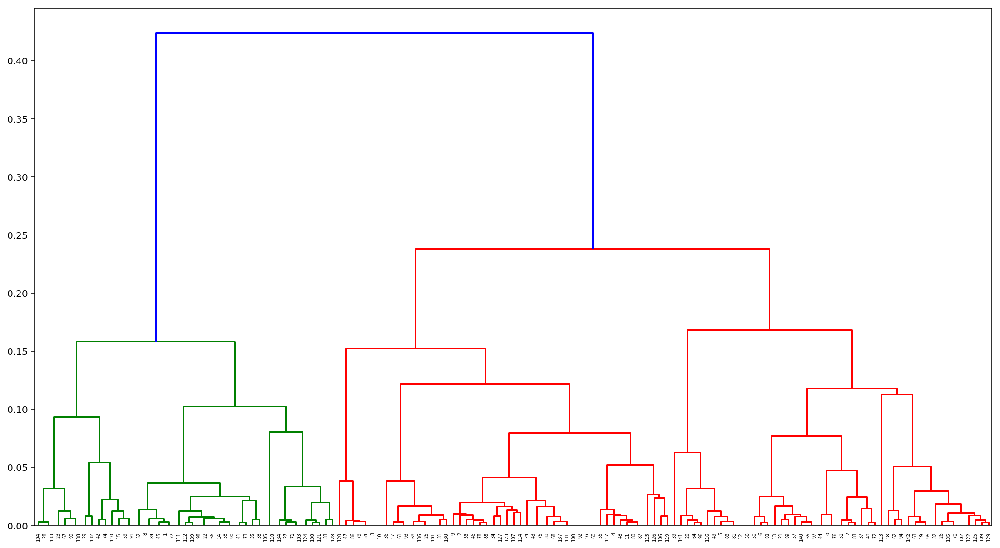

/home/yoshihiko_s/.local/lib/python3.7/site-packages/ipykernel_launcher.py:163: RuntimeWarning:

divide by zero encountered in log10

[D 190924 18:17:29 <ipython-input-276-10cc52b1f857>:190] State prob: -1198.7259553246226 -> -1516.8495767042791
[D 190924 18:17:29 <ipython-input-276-10cc52b1f857>:191] [29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33 24 28  7  2
     18 15 34 11  1  3 18 15 34 11 17  9 15 31  9 25 31  8  4 18 29  6 17 13
     20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33 24 28  7  2 18 15 34 11
     31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33
     24 28  7  2 18 15 34 11  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 17 11 34 15 18  3  1 11 34 15 18  2  7 28 24 33]
[D 190924 18:17:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:31 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33 24 28  7  2
     18 15 34 1

[D 190924 18:17:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1483.7036520233228, Proposed state prob: -1483.7036520233228
[D 190924 18:17:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33 24 28  7  2
     18 36 34 11  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 18 29  6 17 13
     20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33 24 28  7  2 18 36 34 11
     31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33
     24 28  7  2 18 36 34 11  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 11 34 36 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [29  6 17 13 20 37 27 30  6 17 13 20 37 28  7  5 18 15 32 33 24 28  7  2
     18 3

[D 190924 18:17:36 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1437.2385245147743, Proposed state prob: -1437.2385245147743
[D 190924 18:17:36 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 11  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2 18 36 34 11
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 28 38  2 18 36 34 11  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 11 34 36 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [29  6 17 13 20 39 27 30  6 17 13 20 39 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 11  1  3 18 36 34 11 35  9 36 31  9 39 31  8  4 37 29  6 17 13
     20 39 27 30  6 17 13 20 39 28 38  5 18 15 32 33 24 28 38  2 18 36 34 11

[D 190924 18:17:40 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:40 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 28 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 39 34 36 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38 40 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38 40 18 15 32 33 24 28 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38 40 18 15 32 33
     24 28 38  2 18 36 34 39  1 10 21 17 12 34 40  7  7 31 17

[D 190924 18:17:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 28 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 39 34 36 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 28 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17

[D 190924 18:17:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 28 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 39 34 36 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [29  6 17 40 20 25 27 30  6 17 40 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 40
     20 25 27 30  6 17 40 20 25 28 38  5 18 15 32 33 24 28 38  2 18 36 34 39
     31  8  4 37 29  6 17 40 20 25 27 30  6 17 40 20 25 28 38  5 18 15 32 33
     24 28 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17

[D 190924 18:17:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 28 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 39 34 36 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 40 15 32 33 24 28 38  2
     40 36 34 39  1  3 40 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 40 15 32 33 24 28 38  2 40 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 40 15 32 33
     24 28 38  2 40 36 34 39  1 10 21 17 12 34  5  7  7 31 17

[D 190924 18:17:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 40 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 40 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 39 34 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 28 38  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 17 13
     20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33 24 40 38  2 18 36 34 39
     31  8  4 37 29  6 17 13 20 25 27 30  6 17 13 20 25 28 38  5 18 15 32 33
     24 40 38  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 35 11 34 36 18  3  1 39 

[D 190924 18:17:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1391.6209416016823, Proposed state prob: -1391.6209416016823
[D 190924 18:17:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:52 consed:84] #recomputing=0, #warning=1
[D 190924 18:17:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 34 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 34 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 34 39  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 42 12 34 20 35 11 34 36 18  3  1 39 34 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30 

[D 190924 18:17:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:17:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:17:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:17:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:17:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:17:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:17:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:17:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 44 20 25 27 30  6 42 44 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:18:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
    

[D 190924 18:18:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:18:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 44 27 30  6 42 13 20 44 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 44 31  8  4 37 29  6 42 13
    

[D 190924 18:18:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:18:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
    

[D 190924 18:18:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:18:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 38  5 18 15 32 33 24 28 41  2
     18 36 34 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
    

[D 190924 18:18:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1394.8427903512988, Proposed state prob: -1394.8427903512988
[D 190924 18:18:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 44 27 30  6 42 13 20 44 28 41  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:10 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1394.8427903512988, Proposed state prob: -1394.8427903512988
[D 190924 18:18:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1394.8427903512988, Proposed state prob: -1394.8427903512988
[D 190924 18:18:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1394.8427903512988, Proposed state prob: -1387.466324862597
[D 190924 18:18:13 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:18:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     

[D 190924 18:18:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1387.466324862597, Proposed state prob: -1387.466324862597
[D 190924 18:18:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     45 36 44 39  1  3 45 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     2

[D 190924 18:18:17 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1387.466324862597, Proposed state prob: -1387.466324862597
[D 190924 18:18:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     31  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 31 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 45 13 20 25 27 30  6 45 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 31  9 25 31  8  4 37 29  6 45 13
     20 25 27 30  6 45 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
 

[D 190924 18:18:19 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1387.466324862597, Proposed state prob: -1276.1051323587499
[D 190924 18:18:19 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:18:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [46  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 46  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39


[D 190924 18:18:19 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:19 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:21 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 46 39

[D 190924 18:18:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 46 15 32 33 24 28 41  2
     46 36 44 39  1  3 46 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 46 15 32 33 24 40 41  2 46 36 43 39

[D 190924 18:18:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 46 15 32 33 24 28 41  2
     46 36 44 39  1  3 46 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 46 15 32 33 24 40 41  2 46 36 43 39

[D 190924 18:18:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:28 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:30 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1276.1051323587499, Proposed state prob: -1276.1051323587499
[D 190924 18:18:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:30 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 43 39  1 10 21 17 12 43  5  7  7 31 17 45 25 20 10 21
     13 12 43 42 12 43 20 35 11 43 36 18  3  1 39 43 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 44 39  1  3 18 36 43 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 43 39

[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1387.466324862597, Proposed state prob: -1384.2444761129805
[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 36 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 36 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36

[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:18:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 36 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 36 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 36 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 36 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1384.2444761129805
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:34 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 36 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 36 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:35 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1384.2444761129805, Proposed state prob: -1379.592364084369
[D 190924 18:18:35 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:18:35 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     

[D 190924 18:18:35 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:35 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:36 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:36 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 50  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 50
 

[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 50 27 30  6 42 13 20 50 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 50 45  8  4 37 29  6 42 13
     20 50 27 30  6 42 13 20 50 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 50 27 30  6 42 13 20 50 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 50 45  8  4 37 29  6 42 13
     20 50 27 30  6 42 13 20 50 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:41 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:41 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:41 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 50 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 50 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:43 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:43 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:43 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 50 15 32 33 24 28 41  2
     50 36 43 39  1  3 50 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 50 15 32 33 24 40 41  2 50 36 46 39
 

[D 190924 18:18:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 50 25 27 30  6 42 13 50 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     50 25 27 30  6 42 13 50 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:18:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 49  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29 50 42 13 20 25 27 30 50 42 13 20 25 28 47  5 18 15 32 33 24 28 41  2
     18 36 43 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29 50 42 13
     20 25 27 30 50 42 13 20 25 28 49  5 18 15 32 33 24 40 41  2 18 36 46 39
 

[D 190924 18:18:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:49 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 49 27 30  6 42 13 20 49 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 49 27 30  6 42 13 20 49 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
    

[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
    

[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29 49 42 13 20 25 27 30 49 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29 49 42 13
    

[D 190924 18:18:53 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1415.9704649401156
[D 190924 18:18:53 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 49 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39

[D 190924 18:18:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:18:54 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 46 39  1 10 21 17 12 46  5  7  7 45 17 45 25 20 10 21
     13 12 46 42 12 46 20 35 11 46 48 18  3  1 39 46 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 46 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 46 39

[D 190924 18:18:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17

[D 190924 18:18:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29 50 42 13 20 25 27 30 50 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29 50 42 13
     20 25 27 30 50 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29 50 42 13 20 25 27 30 50 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17

[D 190924 18:18:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 50  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 50
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 50  1 10 21 17 12 49  5  7  7 45 17

[D 190924 18:18:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17

[D 190924 18:18:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17

[D 190924 18:18:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 50 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 50  5  7  7 45 17

[D 190924 18:18:58 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17

[D 190924 18:18:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:18:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 46 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17

[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 50 15 32 33 24 28 41  2
     50 3

[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 50 25 27 30  6 42 13 50 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:05 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:05 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 50 25 27 30  6 42 13 50 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:06 consed:84] #recomputing=0, #warning=1
[D 190924 18:19:06 consed:84] #recomputing=0, #warning=1
[D 190924 18:19:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]


[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1389.2862848003733, Proposed state prob: -1389.2862848003733
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 49 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 49 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 49 39  1 10 21 17 12 49  5  7  7 45 17 45 25 20 10 21
     13 12 49 42 12 49 20 35 11 49 48 18  3  1 39 49 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1381.9098193116713, Proposed state prob: -1381.9098193116713
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 50 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 50  5  7  7 45 17 45 25 20 10 21
     13 12 50 42 12 50 20 35 11 50 48 18  3  1 39 50 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 51 15 32 33 24 28 41  2
     51 3

[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1381.9098193116713, Proposed state prob: -1381.9098193116713
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 50 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 50  5  7  7 45 17 45 25 20 10 21
     13 12 50 42 12 50 20 35 11 50 48 18  3  1 39 50 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1381.9098193116713, Proposed state prob: -1381.9098193116713
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 50 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 50  5  7  7 45 17 45 25 20 10 21
     13 12 50 42 12 50 20 35 11 50 48 18  3  1 39 50 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1373.9307481291485, Proposed state prob: -1373.9307481291485
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 50 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 50  5  7  7 45 17 45 25 20 10 21
     13 12 50 42 12 50 20 35 11 50 48 18  3  1 39 50 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 50 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
    

[D 190924 18:19:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1364.3474832680013, Proposed state prob: -1364.3474832680013
[D 190924 18:19:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 52  5  7  7 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 50 36 18  2  7 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39

[D 190924 18:19:09 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:19:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 50 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 54 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 54 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 50 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 54 15 32 33 24 28 41  2
     54 36 49 39  1  3 54 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 54 15 32 33 24 40 41  2 54 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 54 15 32 33
     24 40 41  2 54 36 50 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 50 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 54 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 54 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     54 40 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 50 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 54 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 54 15 32 33 24 40 41  2 54 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 54 15 32 33
     24 40 41  2 54 36 50 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 50 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 51  5 18 15 32 33 24 28 41  2
     18 36 49 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33 24 40 41  2 18 36 50 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28  7  5 18 15 32 33
     24 40 41  2 18 36 50 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 

[D 190924 18:19:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:190] State prob: -1357.1026784207988 -> -1390.1906783226873
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:191] [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13


[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.1906783226873, Proposed state prob: -1390.1906783226873
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1386.968829573071, Proposed state prob: -1386.968829573071
[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 55  9 25 55  8  4 37 29  6 42 13
     2

[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1386.968829573071, Proposed state prob: -1386.968829573071
[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     2

[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17

[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17

[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:19 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17 45 25 20 10 21
     13 12 52 42 12 52 20 35 11 52 48 18  3  1 39 52 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 52 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 52 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 52 39  1 10 21 17 12 52  5 53 53 45 17

[D 190924 18:19:19 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17 45 25 20 10 21
     13 12 56 42 12 56 20 35 11 56 48 18  3  1 39 56 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17

[D 190924 18:19:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17 45 25 20 10 21
     13 12 56 42 12 56 20 35 11 56 48 18  3  1 39 56 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17

[D 190924 18:19:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17 45 25 20 10 21
     13 12 56 42 12 56 20 35 11 56 48 18  3  1 39 56 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17

[D 190924 18:19:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17 45 25 20 10 21
     13 12 56 42 12 56 20 35 11 56 48 18  3  1 39 56 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 57 13 20 25 27 30  6 57 13 20 25 28 54  5 18 15 32 33 24 28 41  2
     18 36 52 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 57 13
     20 25 27 30  6 57 13 20 25 28 55  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 57 13 20 25 27 30  6 57 13 20 25 28 55  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17

[D 190924 18:19:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:190] State prob: -1366.685943281946 -> -1390.1906783226873
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:191] [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17 45 25 20 10 21
     13 12 56 42 12 56 20 35 11 56 48 18  3  1 39 56 36 18  2 53 40 24 33]
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 

[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.1906783226873, Proposed state prob: -1390.1906783226873
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17 45 25 20 10 21
     13 12 56 42 12 56 20 35 11 56 48 18  3  1 39 56 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29 57 42 13 20 25 27 30 57 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 3

[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1386.968829573071, Proposed state prob: -1386.968829573071
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 56 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 56 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 56 39  1 10 21 17 12 56  5 53 53 45 17 45 25 20 10 21
     13 12 56 42 12 56 20 35 11 56 48 18  3  1 39 56 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57 60 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 60 27 30  6 42 13 20 60 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29 60 42 13 20 25 27 30 60 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 60 25 27 30  6 42 13 60 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 60 25 27 30  6 42 13 60 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 56 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 59  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21 17 12 58  5 53 53 45 17 45 25 20 10 21
     13 12 58 42 12 58 20 35 11 58 48 18  3  1 39 58 36 18  2 53 40 24 33]
    Proposed state (Gibbs):
    [29  6 42 13 20 25 27 30  6 42 13 20 25 28 57  5 18 15 32 33 24 28 41  2
     18 36 

[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1366.685943281946, Proposed state prob: -1366.685943281946
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:19:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:19:31 <ipython-input-276-10cc52b1f857>:190] State prob: -1366.685943281946 -> -1390.1906783226873
[D 190924 18:19:31 <ipython-input-276-10cc52b1f857>:191] [29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 28 41  2
     18 36 58 39  1  3 18 48 58 11 35  9 36 45  9 25 45  8  4 37 29  6 42 13
     20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33 24 40 41  2 18 36 58 39
     45  8  4 37 29  6 42 13 20 25 27 30  6 42 13 20 25 28 41  5 18 15 32 33
     24 40 41  2 18 36 58 39  1 10 21

[(16873, 317383, 0, [0.9642857142857143, 0, 9]),
 (16873, 381787, 0, [0.9655172413793104, 0, 4]),
 (16873, 73, 1, [0.875, 19, 0])]

In [279]:
filter_overlaps_by_smc(16873)

[I 190924 18:20:47 log:17] Starting distance matrix calculation 
[D 190924 18:20:48 seq:19] Computing row 4
[D 190924 18:20:48 seq:19] Computing row 0
[D 190924 18:20:48 seq:19] Computing row 8
[D 190924 18:20:48 seq:19] Computing row 12
[D 190924 18:20:48 seq:19] Computing row 16
[D 190924 18:20:48 seq:19] Computing row 20
[D 190924 18:20:48 seq:19] Computing row 24
[D 190924 18:20:48 seq:19] Computing row 36
[D 190924 18:20:48 seq:19] Computing row 28
[D 190924 18:20:48 seq:19] Computing row 32
[D 190924 18:20:48 seq:19] Computing row 40
[D 190924 18:20:48 seq:19] Computing row 44
[D 190924 18:20:48 seq:19] Computing row 48
[D 190924 18:20:48 seq:19] Computing row 52
[D 190924 18:20:48 seq:19] Computing row 60
[D 190924 18:20:48 seq:19] Computing row 56
[D 190924 18:20:48 seq:19] Computing row 64
[D 190924 18:20:48 seq:19] Computing row 68
[D 190924 18:20:48 seq:19] Computing row 137
[D 190924 18:20:48 seq:19] Computing row 129
[D 190924 18:20:48 seq:19] Computing row 125
[D 190924 1

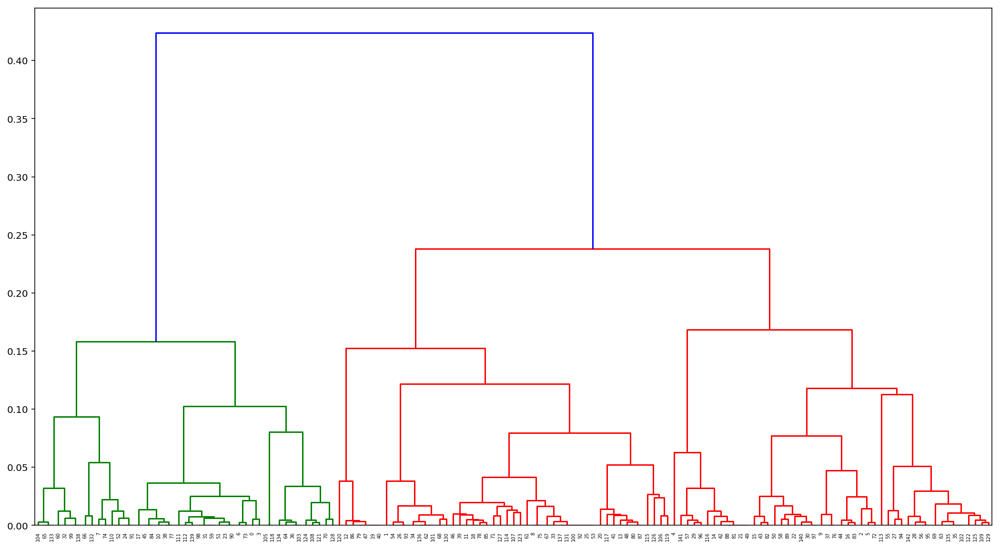

/home/yoshihiko_s/.local/lib/python3.7/site-packages/ipykernel_launcher.py:163: RuntimeWarning:

divide by zero encountered in log10

[D 190924 18:20:59 <ipython-input-276-10cc52b1f857>:190] State prob: -1198.7259553246226 -> -1516.8495767042791
[D 190924 18:20:59 <ipython-input-276-10cc52b1f857>:191] [ 9 15 31  9 25 31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7
      5 18 15 32 33 24 28  7  2 18 15 34 11 29  6 17 13 20 25 27 30  6 17 13
     20 25 28  7  5 18 15 32 33 24 28  7  2 18 15 34 11  1  3 18 15 34 11 17
     31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33
     24 28  7  2 18 15 34 11  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 17 11 34 15 18  3  1 11 34 15 18  2  7 28 24 33]
[D 190924 18:20:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7
      5 18 15 3

[D 190924 18:21:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1516.8495767042791, Proposed state prob: -1516.8495767042791
[D 190924 18:21:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7
      5 18 15 32 33 24 28  7  2 18 15 34 11 29  6 17 13 20 25 27 30  6 17 13
     20 25 28  7  5 18 15 32 33 24 28  7  2 18 15 34 11  1  3 18 15 34 11 17
     31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33
     24 28  7  2 18 15 34 11  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 17 11 34 15 18  3  1 11 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 31  9 25 31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28 35
      5 1

[D 190924 18:21:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1516.8495767042791, Proposed state prob: -1516.8495767042791
[D 190924 18:21:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7
      5 18 15 32 33 24 28  7  2 18 15 34 11 29  6 17 13 20 25 27 30  6 17 13
     20 25 28  7  5 18 15 32 33 24 28  7  2 18 15 34 11  1  3 18 15 34 11 17
     31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7  5 18 15 32 33
     24 28  7  2 18 15 34 11  1 10 21 17 12 34  5  7  7 31 17 31 25 20 10 21
     13 12 34 17 12 34 20 17 11 34 15 18  3  1 11 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 31  9 25 31  8  4 18 29  6 17 13 20 25 27 30  6 17 13 20 25 28  7
      5 1

[D 190924 18:21:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 11 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 11  1  3 18 15 34 11 36
     31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 11  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 11 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 31  9 25 31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 38 33 24 28  7  2 18 15 34 11 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 38 33 24 28  7  2 18 15 34 11  1  3 18 15 34 11 36
     31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 38 33
     24 28  7  2 18 15 34 11  1 10 21 17 12 34  5  7  7 31 35

[D 190924 18:21:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 31  9 25 31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 

[D 190924 18:21:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 39 31  9 25 31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 39 32 33 24 28  7  2 18 39 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 39 32 33 24 28  7  2 18 39 34 38  1  3 18 39 34 11 36
     31  8  4 18 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 39 32 33
     24 28  7  2 18 39 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 39 18  3  1 38 

[D 190924 18:21:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 31  9 25 31  8  4 39 29  6 35 40 20 25 27 30  6 35 40 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 40 20 25 27 30  6 35 40
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 39 29  6 35 40 20 25 27 30  6 35 40 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     40 12 34 17 12 34 20 36 11 34 15 18  3  1 38 

[D 190924 18:21:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 31  9 25 31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 

[D 190924 18:21:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 31  9 25 31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 34 15 18  2  7 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 31  9 40 31  8  4 39 29  6 35 13 20 40 27 30  6 35 13 20 40 37  7
      5 18 15 32 33 24 28  7  2 18 15 34 38 29  6 35 13 20 40 27 30  6 35 13
     20 40 37  7  5 18 15 32 33 24 28  7  2 18 15 34 38  1  3 18 15 34 11 36
     31  8  4 39 29  6 35 13 20 40 27 30  6 35 13 20 40 37  7  5 18 15 32 33
     24 28  7  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 31 40 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 

[D 190924 18:21:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1421.8759934458503, Proposed state prob: -1310.5148009420036
[D 190924 18:21:26 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:21:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 15 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 15 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 15 34 38  1  3 18 15 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 15 34 38  1 10 21 17 12 34  5  7  7 31 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 15 18  3  1 38 34 15 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 15 41  9 25 41  8  4 39 29  6 35 13 42 25 27 30  6 35 13 42 25 37  7
      5 18 15 32 33 24 28 40  2 18 15 34 38 29  6 35 13 42 25 27 30  6 35 13
    

[D 190924 18:21:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:30 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 43 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 43 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 43 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35

[D 190924 18:21:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 

[D 190924 18:21:35 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 

[D 190924 18:21:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 37  7  5 18 15 32 33 24 28 40  2 18 43 42 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 37  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 31 35

[D 190924 18:21:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:44 <ipython-input-276-10cc52b1f857>:190] State prob: -1268.1898150321001 -> -1415.7342455805058
[D 190924 18:21:44 <ipython-input-276-10cc52b1f857>:191] [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 28  7  5 18 15 32 33 24 28 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
[D 190924 18:21:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13


[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1415.7342455805058, Proposed state prob: -1415.7342455805058
[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 28  7  5 18 15 32 33 24 28 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 1

[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1415.7342455805058, Proposed state prob: -1415.7342455805058
[D 190924 18:21:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 28  7  5 18 15 32 33 24 28 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 1

[D 190924 18:21:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:48 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1415.7342455805058, Proposed state prob: -1415.7342455805058
[D 190924 18:21:48 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 28  7  5 18 15 32 33 24 28 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 1

[D 190924 18:21:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1415.7342455805058, Proposed state prob: -1415.7342455805058
[D 190924 18:21:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:49 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 28  7  5 18 15 32 33 24 28 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 28  7
      5 18 15 45 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:21:50 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1401.000515281462, Proposed state prob: -1401.000515281462
[D 190924 18:21:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41 46  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 34 11 36
 

[D 190924 18:21:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1401.000515281462, Proposed state prob: -1401.000515281462
[D 190924 18:21:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29 46 35 13 20 25 27 30 46 35 13 20 25 45  7
      5 18 

[D 190924 18:21:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1401.000515281462, Proposed state prob: -1401.000515281462
[D 190924 18:21:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 34 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 34 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 34 38  1 10 21 17 12 34  5  7  7 41 35 41 25 20 10 21
     13 12 34 17 12 34 20 36 11 34 44 18  3  1 38 34 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 

[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1393.62404979276, Proposed state prob: -1393.62404979276
[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5  7  7 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 

[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1393.62404979276, Proposed state prob: -1393.62404979276
[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5  7  7 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 

[D 190924 18:21:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:21:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1393.62404979276, Proposed state prob: -1393.62404979276
[D 190924 18:21:54 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5  7  7 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 

[D 190924 18:21:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1393.62404979276, Proposed state prob: -1386.7261936347186
[D 190924 18:21:55 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:21:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 47 47 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
 

[D 190924 18:21:56 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1386.7261936347186, Proposed state prob: -1386.7261936347186
[D 190924 18:21:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 47 47 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 48 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 48 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36

[D 190924 18:21:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1386.7261936347186, Proposed state prob: -1386.7261936347186
[D 190924 18:21:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 47 47 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
     48 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7 48 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36

[D 190924 18:21:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 47 47 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 47 47 41 35

[D 190924 18:21:58 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 47 47 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 34 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 47 47 41 35

[D 190924 18:21:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:21:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:02 <ipython-input-276-10cc52b1f857>:190] State prob: -1386.7261936347186 -> -1409.9531280862193
[D 190924 18:22:02 <ipython-input-276-10cc52b1f857>:191] [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 40 40 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
[D 190924 18:22:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 

[D 190924 18:22:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1409.9531280862193, Proposed state prob: -1409.9531280862193
[D 190924 18:22:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 40 40 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29 47 35 13 20 25 27 30 47 35 13 20 25 45  7
      5 1

[D 190924 18:22:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1409.9531280862193, Proposed state prob: -1409.9531280862193
[D 190924 18:22:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 40 40 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 1

[D 190924 18:22:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:05 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1409.9531280862193, Proposed state prob: -1409.9531280862193
[D 190924 18:22:05 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 40 40 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 1

[D 190924 18:22:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1409.9531280862193, Proposed state prob: -1409.9531280862193
[D 190924 18:22:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 40 40 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 1

[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1409.9531280862193, Proposed state prob: -1409.9531280862193
[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 46 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 46 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 46 38  1 10 21 17 12 46  5 40 40 41 35 41 25 20 10 21
     13 12 46 17 12 46 20 36 11 46 44 18  3  1 38 46 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 1

[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 48 41  8  4 39 29  6 35 13 20 48 27 30  6 35 13 20 48 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 48 27 30  6 35 13
    

[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 48 41  8  4 39 29  6 35 13 20 48 27 30  6 35 13 20 48 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 48 27 30  6 35 13
    

[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 48 15 32 33 24 28 40  2 48 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 48 25 27 30  6 35 13 48 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 48 25 27 30  6 35 13
    

[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29 48 35 13 20 25 27 30 48 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29 48 35 13 20 25 27 30 48 35 13
    

[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 48 25 27 30  6 35 13 48 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 48 25 27 30  6 35 13
    

[D 190924 18:22:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 48 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 48 41  8  4 39 29  6 35 13 20 48 27 30  6 35 13 20 48 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 48 27 30  6 35 13
    

[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 48 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1402.5766625975175, Proposed state prob: -1402.5766625975175
[D 190924 18:22:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 46 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45  7
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:20 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1407.7419877606878, Proposed state prob: -1407.7419877606878
[D 190924 18:22:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 40  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 40  2 18 43 47 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 40  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 4

[D 190924 18:22:21 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1380.3809829926536, Proposed state prob: -1380.3809829926536
[D 190924 18:22:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 50  9 25 50  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36

[D 190924 18:22:22 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 50 43 49 38  1  3 50 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35

[D 190924 18:22:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
     50 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7 50 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48 50 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47 50 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 

[D 190924 18:22:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 50
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 50  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 

[D 190924 18:22:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 50 15 32 33 24 28 48  2 50 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 50 15 32 33 24 45 48  2 50 43 49 38  1  3 50 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 50 15 32 33
     24 28 48  2 50 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 50  3  1 38 

[D 190924 18:22:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 48  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 48  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 48  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 

[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1367.4745621902307, Proposed state prob: -1367.4745621902307
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 1

[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1367.4745621902307, Proposed state prob: -1367.4745621902307
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48
      5 1

[D 190924 18:22:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1350.8929965046057, Proposed state prob: -1350.8929965046057
[D 190924 18:22:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1350.8929965046057, Proposed state prob: -1350.8929965046057
[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1350.8929965046057, Proposed state prob: -1350.8929965046057
[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:28 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1350.8929965046057, Proposed state prob: -1350.8929965046057
[D 190924 18:22:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 47 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 47  5 40 40 41 35 41 25 20 10 21
     13 12 47 17 12 47 20 36 11 47 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 52 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 52  5 53 53 41 35

[D 190924 18:22:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 52  5 40 40 41 35

[D 190924 18:22:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 47 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 51 35 13 20 25 45 48
      5 18 15 32 33 24 28 50  2 18 43 47 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45  7  5 18 15 32 33 24 45 50  2 18 43 49 38 53  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 48  5 18 15 32 33
     24 28 50  2 18 43 47 38 53 10 21 17 12 52  5 40 40 41 35

[D 190924 18:22:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:34 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:34 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:34 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 53 

[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:35 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 53 25 27 30  6 35 13 53 25 45 40
      5 18 

[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1373.4933380230327, Proposed state prob: -1373.4933380230327
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1373.4933380230327, Proposed state prob: -1373.4933380230327
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1373.4933380230327, Proposed state prob: -1373.4933380230327
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 54 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1373.4933380230327, Proposed state prob: -1373.4933380230327
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1373.4933380230327, Proposed state prob: -1373.4933380230327
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1373.4933380230327, Proposed state prob: -1373.4933380230327
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 52 38  1  3 18 44 52 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 52  5 40 40 41 35 41 25 20 10 21
     13 12 52 17 12 52 20 36 11 52 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
    

[D 190924 18:22:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 56 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 56  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 56  1 10 21 17 12 55  5 40 40 41 35

[D 190924 18:22:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35

[D 190924 18:22:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 56 41  8  4 39 29  6 35 13 20 56 27 30 53 35 13 20 56 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 56 27 30  6 35 13
     20 56 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 56 27 30  6 35 13 20 56 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35 41 56 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 

[D 190924 18:22:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35

[D 190924 18:22:40 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:40 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 52 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30 53 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 52 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 54 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 52 38  1 10 21 17 12 55  5 40 40 41 35

[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:43 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 56 20 25 27 30  6 35 56 20 25 45 40
      5 18 

[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 56 25 27 30  6 35 13 56 25 45 40
      5 18 

[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:46 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 56 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1390.074903708658, Proposed state prob: -1390.074903708658
[D 190924 18:22:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 55 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 40  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 55 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 55 38  1 10 21 17 12 55  5 40 40 41 35 41 25 20 10 21
     13 12 55 17 12 55 20 36 11 55 44 18  3  1 38 55 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 

[D 190924 18:22:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1374.7193670374331, Proposed state prob: -1374.7193670374331
[D 190924 18:22:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 57 38  1 10 21 17 12 57  5 40 40 41 35 41 25 20 10 21
     13 12 57 17 12 57 20 36 11 57 44 18  3  1 38 57 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36

[D 190924 18:22:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1374.7193670374331, Proposed state prob: -1374.7193670374331
[D 190924 18:22:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 57 38  1 10 21 17 12 57  5 40 40 41 35 41 25 20 10 21
     13 12 57 17 12 57 20 36 11 57 44 18  3  1 38 57 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36

[D 190924 18:22:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1374.7193670374331, Proposed state prob: -1374.7193670374331
[D 190924 18:22:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 57 38  1 10 21 17 12 57  5 40 40 41 35 41 25 20 10 21
     13 12 57 17 12 57 20 36 11 57 44 18  3  1 38 57 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36

[D 190924 18:22:53 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1374.7193670374331, Proposed state prob: -1374.7193670374331
[D 190924 18:22:53 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:22:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36
     41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40  5 18 15 32 33
     24 28 50  2 18 43 57 38  1 10 21 17 12 57  5 40 40 41 35 41 25 20 10 21
     13 12 57 17 12 57 20 36 11 57 44 18  3  1 38 57 43 18  2 40 28 24 33]
    Proposed state (Gibbs):
    [ 9 43 41  9 25 41  8  4 39 29  6 35 13 20 25 27 30  6 35 13 20 25 45 40
      5 18 15 32 33 24 28 50  2 18 43 57 38 29  6 35 13 20 25 27 30  6 35 13
     20 25 45 56  5 18 15 32 33 24 45 50  2 18 43 55 38  1  3 18 44 57 11 36

[(317383, 16873, 0, [0.9642857142857143, 9, 0]),
 (317383, 381787, 0, [1.0, 5, 0]),
 (317383, 73, 1, [0.8888888888888888, 28, 0])]

In [280]:
filter_overlaps_by_smc(317383)

[I 190924 18:27:17 log:17] Starting distance matrix calculation 
[D 190924 18:27:18 seq:19] Computing row 169
[D 190924 18:27:18 seq:19] Computing row 0
[D 190924 18:27:18 seq:19] Computing row 9
[D 190924 18:27:18 seq:19] Computing row 160
[D 190924 18:27:18 seq:19] Computing row 18
[D 190924 18:27:18 seq:19] Computing row 5
[D 190924 18:27:18 seq:19] Computing row 36
[D 190924 18:27:18 seq:19] Computing row 151
[D 190924 18:27:18 seq:19] Computing row 27
[D 190924 18:27:18 seq:19] Computing row 142
[D 190924 18:27:18 seq:19] Computing row 133
[D 190924 18:27:18 seq:19] Computing row 45
[D 190924 18:27:18 seq:19] Computing row 63
[D 190924 18:27:18 seq:19] Computing row 124
[D 190924 18:27:18 seq:19] Computing row 54
[D 190924 18:27:18 seq:19] Computing row 115
[D 190924 18:27:18 seq:19] Computing row 14
[D 190924 18:27:18 seq:19] Computing row 23
[D 190924 18:27:18 seq:19] Computing row 106
[D 190924 18:27:18 seq:19] Computing row 88
[D 190924 18:27:18 seq:19] Computing row 72
[D 190

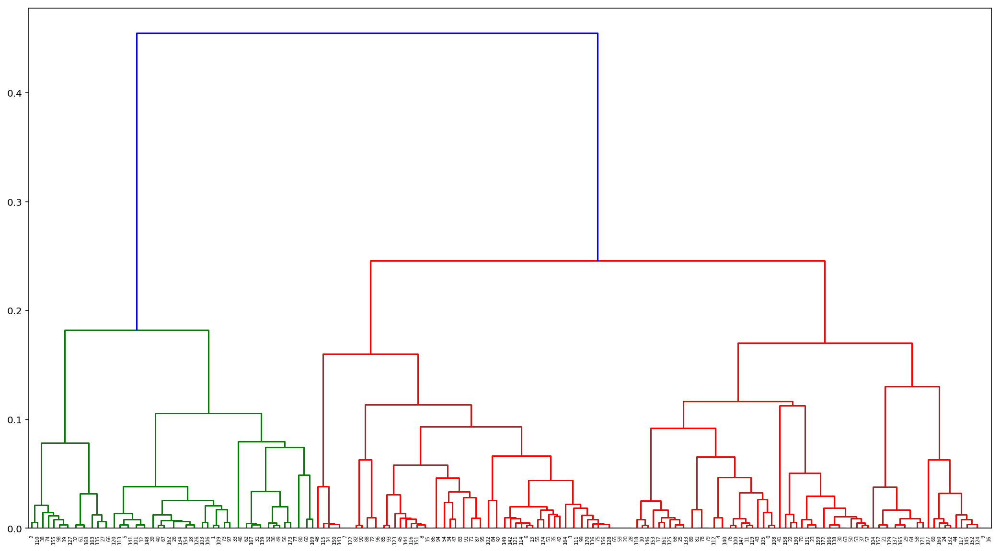

/home/yoshihiko_s/.local/lib/python3.7/site-packages/ipykernel_launcher.py:163: RuntimeWarning:

divide by zero encountered in log10

[D 190924 18:27:33 <ipython-input-276-10cc52b1f857>:190] State prob: -1514.3865894475812 -> -1878.960700198396
[D 190924 18:27:33 <ipython-input-276-10cc52b1f857>:191] [35  8  1 28 33  5 27 14 19 44 30 34  5 27 14 19 44 31  6  2 28 41 37 38
     43 31  6  4 28 41 39 10  3  9 21 27 11 39  2  6  6 35 27 35 44 19  9 21
     14 11 39 27 11 39 19 27 10 39 41 28 13  3 10 39 41 28  4  6 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 41 35  7 44 35  8  1 28 33  5 27 14 19 44 30 34
      5 27 14 19 44 31  6  2 28 41 37 38 43 31  6  4 28 41 39 10 33  5 27 14
     19 44 30 34  5 27 14 19 44 31  6  2 28 41 37 38 43 31  6  4 28 41 39 10
      3 13 28 41 39 10 27]
[D 190924 18:27:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:34 <ipython-input-276-10cc52b1f857>:224] 
    Cu

[D 190924 18:27:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1843.733643026306, Proposed state prob: -1823.020499494863
[D 190924 18:27:38 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:27:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 31  6  2 28 41 37 38
     43 31  6  4 28 47 39 10  3  9 21 45 11 39  2  6  6 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 10 39 47 28  4  6 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 31  6  2 28 41 37 38 43 31  6  4 28 47 39 10 33  5 27 14
     19 44 30 34  5 27 14 19 44 31  6  2 28 41 37 38 43 31  6  4 28 47 39 10
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 4

[D 190924 18:27:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 31  6  2 28 41 37 38
     43 31  6  4 28 47 39 10  3  9 21 45 11 39  2  6  6 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 10 39 47 28  4  6 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 31  6  2 28 41 37 38 43 31  6  4 28 47 39 10 33  5 27 14
     19 44 30 34  5 27 14 19 44 31  6  2 28 41 37 38 43 31  6  4 28 47 39 10
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 31  6  2 28 41 37 38
     43 31  6  4 28 47 39 10  3  9 21 45 11 39  2  6  6 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 10 39 47 28  4  6 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  

[D 190924 18:27:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1808.2867691958195, Proposed state prob: -1808.2867691958195
[D 190924 18:27:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:27:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 10  3  9 21 45 11 39  2  6  6 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 10 39 47 28  4  6 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 48  6  2 28 41 37 38 43 31  6  4 28 47 39 10 33  5 27 14
     19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38 43 48  6  4 28 47 39 10
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:27:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 10  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 10 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 48  6  2 28 41 37 38 43 31  6  4 28 47 39 10 33  5 27 14
     19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38 43 48  6  4 28 47 39 10
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 10  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 10 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  

[D 190924 18:27:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1776.637677616172, Proposed state prob: -1776.637677616172
[D 190924 18:27:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:27:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 48  6  2 28 41 37 38 43 31  6  4 28 47 39 50 33  5 27 14
     19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38 43 48  6  4 28 47 39 50
      3 13 28 47 39 10 45]
    Propos

[D 190924 18:27:53 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:27:53 consed:84] #recomputing=0, #warning=1
[D 190924 18:27:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 48  6  2 28 41 37 38 43 31  6  4 28 47 39 50 33  5 27 14
     19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38 43 48  6  4 28 47 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39

[D 190924 18:27:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:27:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1776.637677616172, Proposed state prob: -1776.637677616172
[D 190924 18:27:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:27:55 consed:84] #recomputing=0, #warning=1
[D 190924 18:27:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 48  6  2 28 41 37 38 43 31  6  4 28 47 39 50 33  5 27 14
     19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38 43 4

[D 190924 18:27:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:27:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 48  6  2 28 41 37 38 43 31  6  4 28 47 39 50 33  5 27 14
     19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38 43 48  6  4 28 47 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1776.637677616172, Proposed state prob: -1776.637677616172
[D 190924 18:28:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33  5 27 14 19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38
     43 31  6  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34  5 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
      5 27 14 19 44 48  6  2 28 41 37 38 43 31  6  4 28 47 39 50 33  5 27 14
     19 44 30 34  5 27 14 19 44 48  6  2 28 41 37 38 43 48  6  4 28 47 39 50
      3 13 28 47 39 10 45]
    Propos

[D 190924 18:28:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1764.1919414558213, Proposed state prob: -1764.1919414558213
[D 190924 18:28:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
     51 27 14 19 44 48  6  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:05 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
     51 27 14 19 44 48  6  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38
     43 31 52  4 28 53 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 53 28 13  3 50 39 53 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1764.1919414558213, Proposed state prob: -1764.1919414558213
[D 190924 18:28:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
     51 27 14 19 44 48  6  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
     51 27 14 19 44 48  6  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 53 14 19 44 30 34 51 53 14 19 44 48  6  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1764.1919414558213, Proposed state prob: -1764.1919414558213
[D 190924 18:28:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 34
     51 27 14 19 44 48  6  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 34 51 27 14 19 44 48  6  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1746.2279984679396, Proposed state prob: -1746.2279984679396
[D 190924 18:28:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 54  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 53
     51 27 14 19 44 48 54  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 54  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 54  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 53
     51 27 14 19 44 48 54  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 54  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 54  2 28 55 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1746.2279984679396, Proposed state prob: -1746.2279984679396
[D 190924 18:28:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 54  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33  5 27 14 19 44 30 53
     51 27 14 19 44 48 54  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 54  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1759.9718815373817, Proposed state prob: -1759.9718815373817
[D 190924 18:28:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:24 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33 51 27 14 19 44 30 53
     51 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 47 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 47 35  7 44 35  8  1 46 33 51 27 14 19 44 30 53
     51 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 47 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 47 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 54 41 37 38
     43 31 52  4 54 47 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 54 13  3 50 39 47 54  4 49 31 43 38 24
     17  6  2 54 34 12 32 32 12 

[D 190924 18:28:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1759.9718815373817, Proposed state prob: -1755.3197695087702
[D 190924 18:28:27 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:28:27 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 54 35  7 44 35  8  1 46 33 51 27 14 19 44 30 53
     51 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19

[D 190924 18:28:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:28 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:28 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1747.5883813773385, Proposed state prob: -1747.5883813773385
[D 190924 18:28:28 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     51 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:30 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     51 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:30 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1747.5883813773385, Proposed state prob: -1747.5883813773385
[D 190924 18:28:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:30 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 51 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     51 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 51 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:31 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 57 44 30 53 56 27 14 57 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 57  9 21
     14 11 39 45 11 39 57 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 5

[D 190924 18:28:32 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:32 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:32 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1740.7794663026332, Proposed state prob: -1740.7794663026332
[D 190924 18:28:32 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:32 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:35 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:35 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 57  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 57 57 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 57 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:35 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1740.7794663026332, Proposed state prob: -1740.7794663026332
[D 190924 18:28:35 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:35 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:36 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:36 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 57 14 19 44 30 53 56 57 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 45 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 45 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1740.7758317403427, Proposed state prob: -1740.7758317403427
[D 190924 18:28:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:38 consed:84] #recomputing=0, #warning=1
[D 190924 18:28:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39

[D 190924 18:28:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1740.7758317403427, Proposed state prob: -1740.7758317403427
[D 190924 18:28:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:40 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:40 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 58 14 19 44 30 53 56 58 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1740.7758317403427, Proposed state prob: -1740.7758317403427
[D 190924 18:28:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:43 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:43 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 55 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 51 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 51 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 45 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1740.7758317403427, Proposed state prob: -1740.7758317403427
[D 190924 18:28:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:49 <ipython-input-276-10cc52b1f857>:190] State prob: -1740.7758317403427 -> -1753.7894957566784
[D 190924 18:28:49 <ipython-input-276-10cc52b1f857>:191] [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 

[D 190924 18:28:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:50 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1753.7894957566784, Proposed state prob: -1753.7894957566784
[D 190924 18:28:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 56 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:50 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 56 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1753.7894957566784, Proposed state prob: -1753.7894957566784
[D 190924 18:28:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 56 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 56 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [59  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 59 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 5

[D 190924 18:28:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1642.4283032528315, Proposed state prob: -1642.4283032528315
[D 190924 18:28:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 56 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 56 27 14 19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 56 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     56 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 56 27 14
     19 44 30 53 56 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:28:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:28:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:28:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:28:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:28:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52 60 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28 60 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:05 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 56 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 60 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 58 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1753.7894957566784, Proposed state prob: -1753.7894957566784
[D 190924 18:29:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1753.7894957566784, Proposed state prob: -1753.7894957566784
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1753.7894957566784, Proposed state prob: -1753.7894957566784
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1753.7894957566784, Proposed state prob: -1753.7894957566784
[D 190924 18:29:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 59 27 14 19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 59 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     59 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 59 27 14
     19 44 30 53 59 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1746.0581076252463, Proposed state prob: -1746.0581076252463
[D 190924 18:29:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 61 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1746.0581076252463, Proposed state prob: -1746.0581076252463
[D 190924 18:29:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:19 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 

[D 190924 18:29:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:20 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1746.0581076252463, Proposed state prob: -1746.0581076252463
[D 190924 18:29:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     61  6  2 28 34 12 32 32 12 

[D 190924 18:29:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:21 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1746.0581076252463, Proposed state prob: -1746.0581076252463
[D 190924 18:29:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 35  7 44 35  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [35  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 61 41 37 38
     43 31 52  4 61 54 39 50  3  9 21 57 11 39  2 49 49 35 27 35 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 61 13  3 50 39 54 61  4 49 31 43 38 24
     17  6  2 61 34 12 32 32 12 

[D 190924 18:29:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:29:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1634.6969151213993, Proposed state prob: -1634.6969151213993
[D 190924 18:29:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [61  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 61 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 61  7 44 61  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Prop

[D 190924 18:29:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:29:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [61  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39  2 49 49 35 27 61 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6  2 28 34 12 32 32 12 32 16 23 25 18 20 24 17 32 16 23 25 18 20 24
     17  6  2 28 34 60 25  7 54 61  7 44 61  8  1 46 33 59 27 14 19 44 30 53
     60 27 14 19 44 48 49  2 28 41 37 38 43 31 52  4 28 54 39 50 33 60 27 14
     19 44 30 53 60 27 14 19 44 48 49  2 28 41 37 38 43 48 52  4 28 54 39 50
      3 13 28 47 39 10 45]
    Proposed state (Gibbs):
    [61  8  1 46 33 60 27 14 19 44 30 53 60 27 14 19 44 48 49 62 28 41 37 38
     43 31 52  4 28 54 39 50  3  9 21 57 11 39 62 49 49 35 27 61 44 19  9 21
     14 11 39 57 11 39 19 45 10 39 47 28 13  3 50 39 54 28  4 49 31 43 38 24
     17  6 62 28 34 12 32 32 12 

[(381787, 73, 1, [0.9, 23, 0]),
 (381787, 332569, 0, [0.14285714285714285, 0, 25]),
 (381787, 317383, 0, [1.0, 0, 5]),
 (381787, 16873, 0, [0.9655172413793104, 4, 0])]

In [282]:
filter_overlaps_by_smc(381787)

[I 190924 18:31:34 log:17] Starting distance matrix calculation 
[D 190924 18:31:35 seq:19] Computing row 0
[D 190924 18:31:35 seq:19] Computing row 12
[D 190924 18:31:35 seq:19] Computing row 8
[D 190924 18:31:35 seq:19] Computing row 16
[D 190924 18:31:35 seq:19] Computing row 20
[D 190924 18:31:35 seq:19] Computing row 4
[D 190924 18:31:35 seq:19] Computing row 44
[D 190924 18:31:35 seq:19] Computing row 28
[D 190924 18:31:35 seq:19] Computing row 32
[D 190924 18:31:35 seq:19] Computing row 36
[D 190924 18:31:35 seq:19] Computing row 40
[D 190924 18:31:35 seq:19] Computing row 52
[D 190924 18:31:35 seq:19] Computing row 48
[D 190924 18:31:35 seq:19] Computing row 24
[D 190924 18:31:35 seq:19] Computing row 60
[D 190924 18:31:35 seq:19] Computing row 56
[D 190924 18:31:35 seq:19] Computing row 64
[D 190924 18:31:35 seq:19] Computing row 68
[D 190924 18:31:35 seq:19] Computing row 72
[D 190924 18:31:35 seq:19] Computing row 119
[D 190924 18:31:35 seq:19] Computing row 115
[D 190924 18

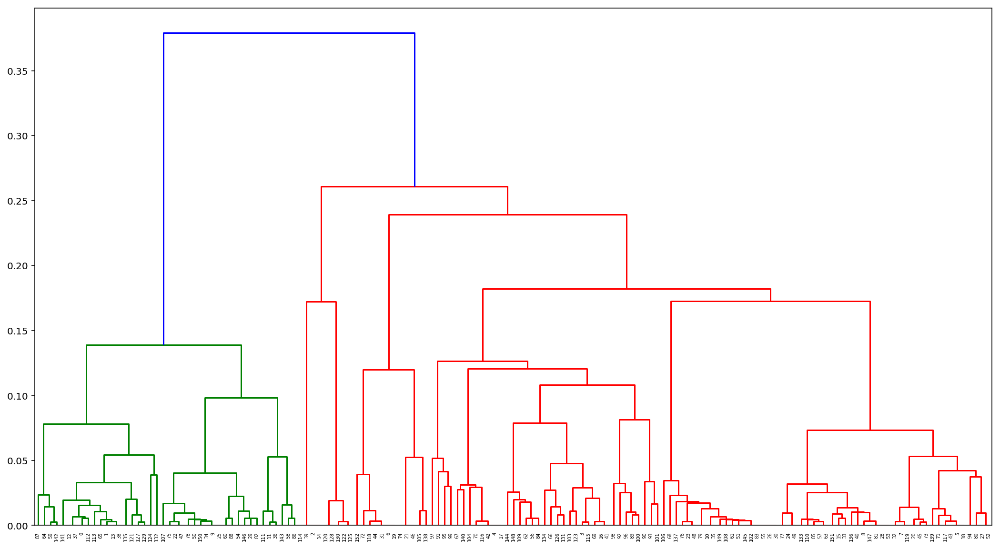

/home/yoshihiko_s/.local/lib/python3.7/site-packages/ipykernel_launcher.py:163: RuntimeWarning:

divide by zero encountered in log10

[D 190924 18:31:49 <ipython-input-276-10cc52b1f857>:190] State prob: -1206.8909290120491 -> -1874.5004454853483
[D 190924 18:31:49 <ipython-input-276-10cc52b1f857>:191] [ 3  3 13 32 25 46 15 45 44  8 39 11  3  3 13 44 33 25 46 15 45 17  8 39
     42  8 39 47 44 10 39 15 45 44  8 39 11  3  3 13 44 33 25 46 15 45 17  8
     39 42  8 39 47 44 10 39 27 43 12  1  9 39 27 43  1  3 29 25 39 33 25 46
     15 45 17  8 39 42  8 39 47 44 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 25 18 39  8 39 27 43 11  3  3 13 32 25 46 15 45
     14  4 14 31 25 14 29  4 14  4 14 29  3 43 29  4 44 39 18 46 25  3  1 12
     27 39 10 44 27 39  8 44 15]
[D 190924 18:31:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:31:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 44  8 39 11  3  3 13 44 33 2

[D 190924 18:31:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:31:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:31:58 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1870.4570441790938, Proposed state prob: -1870.4570441790938
[D 190924 18:31:58 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:31:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11  3  3 13 44 33 25 46 15 45 17  8 39
     42  8 39 47 48 10 39 15 45 44  8 39 11  3  3 13 48 33 25 46 15 45 17  8
     39 42  8 39 47 48 10 39 27 43 12  1  9 39 27 43  1  3 29 25 39 33 25 46
     15 45 17  8 39 42  8 39 47 48 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 25 18 39  8 39 27 43 11  3  3 13 32 25 46 15 45
     14  4 14 31 25 14 29  4 14  4 14 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 48 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11  3  3 13 4

[D 190924 18:32:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1864.2476663339105, Proposed state prob: -1864.2476663339105
[D 190924 18:32:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 45 17  8 39
     42  8 39 47 48 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 45 17  8
     39 42  8 39 47 48 10 39 27 43 12  1  9 39 27 43  1  3 29 25 39 33 25 46
     15 45 17  8 39 42  8 39 47 48 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 25 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 14 31 25 14 29  4 14  4 14 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 48 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 50 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1850.0642696522928, Proposed state prob: -1850.0642696522928
[D 190924 18:32:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 45 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 45 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 25 39 33 25 46
     15 45 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 25 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 14 31 25 14 29  4 14  4 14 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1820.3932265274673, Proposed state prob: -1820.3932265274673
[D 190924 18:32:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 45 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 45 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 25 39 33 25 46
     15 45 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 25 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 25 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 52 11 49  3 13 4

[D 190924 18:32:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:17 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1820.3932265274673, Proposed state prob: -1820.3932265274673
[D 190924 18:32:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 45 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 45 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 25 39 33 25 46
     15 45 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 25 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 25 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:22 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1820.3932265274673, Proposed state prob: -1820.3932265274673
[D 190924 18:32:22 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 45 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 45 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 25 39 33 25 46
     15 45 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 25 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 25 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1790.9732587754133, Proposed state prob: -1768.4326160836804
[D 190924 18:32:29 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:32:30 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49

[D 190924 18:32:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1768.4326160836804, Proposed state prob: -1768.4326160836804
[D 190924 18:32:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1768.4326160836804, Proposed state prob: -1768.4326160836804
[D 190924 18:32:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1768.4326160836804, Proposed state prob: -1768.4326160836804
[D 190924 18:32:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:40 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1768.4326160836804, Proposed state prob: -1768.4326160836804
[D 190924 18:32:40 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 54 11 49  3 13 4

[D 190924 18:32:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1768.4326160836804, Proposed state prob: -1768.4326160836804
[D 190924 18:32:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17  8 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17  8
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17  8 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [54 54 13 32 25 46 15 45 48  8 39 11 49 54 13 4

[D 190924 18:32:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:48 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:48 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1759.5559775862891, Proposed state prob: -1759.5559775862891
[D 190924 18:32:48 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17 54 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17 54
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17 54 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1759.5559775862891, Proposed state prob: -1759.5559775862891
[D 190924 18:32:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17 54 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17 54
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17 54 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 4

[D 190924 18:32:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:32:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1759.5559775862891, Proposed state prob: -1759.5559775862891
[D 190924 18:32:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:32:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 39 11 49  3 13 44 33 25 46 15 53 17 54 39
     42  8 39 47 50 10 39 15 45 44  8 39 11 49  3 13 48 33 25 46 15 53 17 54
     39 42  8 39 47 50 10 39 27 43 12  1  9 39 27 43  1  3 29 52 39 33 25 46
     15 53 17 54 39 42  8 39 47 50 10 39 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 39 31 52 18 39  8 39 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 39 18 46 25  3  1 12
     27 39 10 50 27 39  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1720.1888796913909, Proposed state prob: -1720.1888796913909
[D 190924 18:33:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 55
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     55 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 55 31 52 18 39  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:05 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1720.1888796913909, Proposed state prob: -1720.1888796913909
[D 190924 18:33:05 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 55
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     55 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 45 19
     34 19 34 19 34 37 55 31 52 18 39  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 

[D 190924 18:33:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:21 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 57 45 48  8 55 11 49  3 13 4

[D 190924 18:33:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:25 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:26 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:26 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:26 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:28 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:29 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:29 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:30 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:30 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:30 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:30 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:31 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:31 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:32 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:35 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:35 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:35 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:35 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 57 32 25 46 15 45 48  8 55 11 49  3 57 4

[D 190924 18:33:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:41 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:41 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:41 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1743.7268273143056, Proposed state prob: -1743.7268273143056
[D 190924 18:33:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 27 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1736.6183153265324, Proposed state prob: -1736.6183153265324
[D 190924 18:33:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 55 47 50 10 55 15 45 44  8 55 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 55 47 50 10 55 57 43 12  1  9 55 27 43  1  3 29 52 55 33 25 46
     15 53 17 54 56 42  8 55 47 50 10 55 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 55 31 52 18 55  8 55 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 55 18 46 25  3  1 12
     27 55 10 50 27 55  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 55 11 49  3 13 4

[D 190924 18:33:52 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 18:33:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 58 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 58 47 50 10 58 15 45 44  8 58 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 58 47 50 10 58 27 43 12  1  9 58 27 43  1  3 29 52 58 33 25 46
     15 53 17 54 56 42  8 58 47 50 10 58 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 58 

[D 190924 18:33:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:33:54 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:33:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:33:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:33:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:56 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:33:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:33:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:58 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:33:58 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 58  3 13 4

[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:33:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [58 58 13 32 25 46 15 45 48  8 57 11 49 58 13 4

[D 190924 18:34:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:00 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:00 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:03 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:05 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:05 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:06 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:07 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:07 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:07 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 58 15 45 48  8 57 11 49  3 13 4

[D 190924 18:34:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 18:34:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.4034097893677, Proposed state prob: -1714.4034097893677
[D 190924 18:34:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 18:34:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [ 3  3 13 32 25 46 15 45 48  8 57 11 49  3 13 44 33 25 46 15 53 17 54 56
     42  8 57 47 50 10 57 15 45 44  8 57 11 49  3 13 48 33 25 46 15 53 17 54
     56 42  8 57 47 50 10 57 27 43 12  1  9 57 27 43  1  3 29 52 57 33 25 46
     15 53 17 54 56 42  8 57 47 50 10 57 27 43 12  1  9 34 37 19 34 37 46 19
     34 19 34 19 34 37 57 31 52 18 55  8 57 27 43 11 49  3 13 32 25 46 15 45
     14  4 51 31 52 51 29  4 14  4 51 29  3 43 29  4 48 57 18 46 25  3  1 12
     27 57 10 50 27 57  8 48 15]
    Proposed state (Gibbs):
    [ 3  3 13 32 25 46 15 45 48  8 58 11 49  3 13 4

[D 190924 18:34:15 <ipython-input-276-10cc52b1f857>:125] Found in cache


[(198167, 73, 0, [0.92, 6, 0]),
 (198167, 99318, 0, [1.0, 16, 0]),
 (198167, 315857, 0, [0.875, 0, 23]),
 (198167, 283502, 1, [0.625, 23, 0])]

In [283]:
filter_overlaps_by_smc(198167)

[I 190924 19:23:30 log:17] Starting distance matrix calculation 
[D 190924 19:23:31 seq:19] Computing row 20
[D 190924 19:23:31 seq:19] Computing row 0
[D 190924 19:23:31 seq:19] Computing row 4
[D 190924 19:23:31 seq:19] Computing row 8
[D 190924 19:23:31 seq:19] Computing row 12
[D 190924 19:23:31 seq:19] Computing row 16
[D 190924 19:23:31 seq:19] Computing row 24
[D 190924 19:23:31 seq:19] Computing row 28
[D 190924 19:23:31 seq:19] Computing row 36
[D 190924 19:23:31 seq:19] Computing row 40
[D 190924 19:23:31 seq:19] Computing row 44
[D 190924 19:23:31 seq:19] Computing row 32
[D 190924 19:23:31 seq:19] Computing row 48
[D 190924 19:23:31 seq:19] Computing row 56
[D 190924 19:23:31 seq:19] Computing row 60
[D 190924 19:23:31 seq:19] Computing row 52
[D 190924 19:23:31 seq:19] Computing row 64
[D 190924 19:23:31 seq:19] Computing row 68
[D 190924 19:23:31 seq:19] Computing row 72
[D 190924 19:23:31 seq:19] Computing row 76
[D 190924 19:23:31 seq:19] Computing row 132
[D 190924 19:

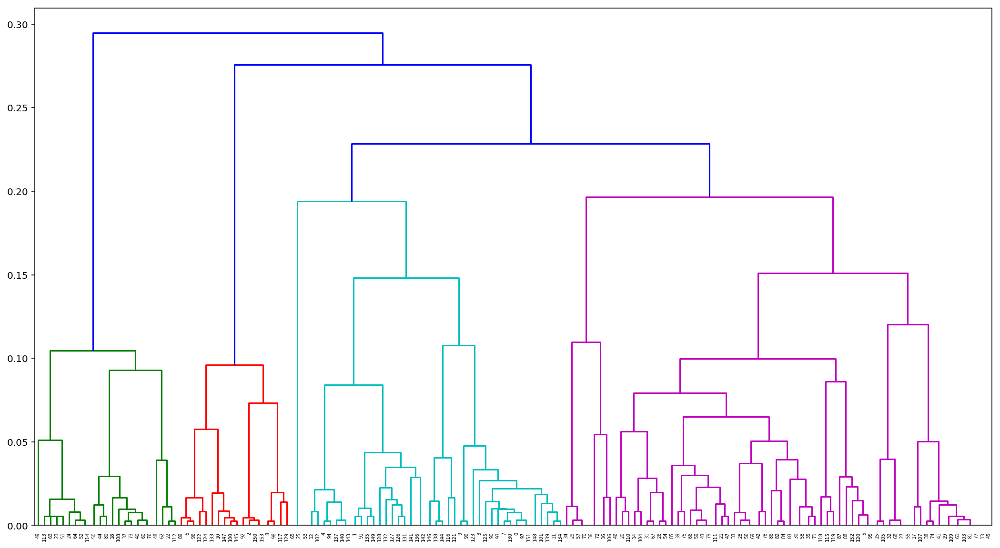

/home/yoshihiko_s/.local/lib/python3.7/site-packages/ipykernel_launcher.py:163: RuntimeWarning:

divide by zero encountered in log10

[D 190924 19:23:46 <ipython-input-276-10cc52b1f857>:190] State prob: -1450.2569704652046 -> -1769.2746352543818
[D 190924 19:23:46 <ipython-input-276-10cc52b1f857>:191] [22 14  9 22 13 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
      1 11 31 47 36 26 40 31 47 36 26 40 27  4 49 32  4 49 37 33  3 49 29 34
      4  1  3  1  1 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27  4 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 13 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1  1 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
[D 190924 19:23:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:23:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 13 43  7 22 10 21  8 23 12 49 30 46 2

[D 190924 19:23:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:23:51 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:23:51 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1718.9643457621833, Proposed state prob: -1718.9643457621833
[D 190924 19:23:51 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:23:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27  4 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27  4 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 3

[D 190924 19:23:53 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:23:53 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1718.9643457621833, Proposed state prob: -1714.6132476360995
[D 190924 19:23:53 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 19:23:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 54  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27

[D 190924 19:23:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:23:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:23:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.6132476360995, Proposed state prob: -1714.6132476360995
[D 190924 19:23:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:23:58 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 3

[D 190924 19:24:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:00 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.6132476360995, Proposed state prob: -1714.6132476360995
[D 190924 19:24:00 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 43 54 22 10 21  8 23 12 49 3

[D 190924 19:24:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1714.6132476360995, Proposed state prob: -1714.6132476360995
[D 190924 19:24:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:04 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1708.4799424356706, Proposed state prob: -1708.4799424356706
[D 190924 19:24:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1708.4799424356706, Proposed state prob: -1708.4799424356706
[D 190924 19:24:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 31 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 31 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 43  7 54 10 21  8 23 12 55 3

[D 190924 19:24:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1685.711115908788, Proposed state prob: -1650.2370928604953
[D 190924 19:24:11 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 19:24:12 consed:84] #recomputing=0, #warning=1
[D 190924 19:24:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 56 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48 57 49

[D 190924 19:24:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1650.2370928604953, Proposed state prob: -1650.2370928604953
[D 190924 19:24:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:13 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 56 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1650.2370928604953, Proposed state prob: -1650.2370928604953
[D 190924 19:24:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 56 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1650.2370928604953, Proposed state prob: -1650.2370928604953
[D 190924 19:24:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 56 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:19 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:19 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:19 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1650.2370928604953, Proposed state prob: -1650.2370928604953
[D 190924 19:24:19 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 56 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:21 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:21 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1650.2370928604953, Proposed state prob: -1650.2370928604953
[D 190924 19:24:21 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:21 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 56 47 36 26 40 31 47 36 26 40 27 53 49 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 49 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:25 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:25 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1636.6218589179039, Proposed state prob: -1636.6218589179039
[D 190924 19:24:25 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:26 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
     51 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4  1  3  1 52 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1 52 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 55 50 43  7 54 10 21  8 23 12 49 3

[D 190924 19:24:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:27 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1636.6218589179039, Proposed state prob: -1636.6218589179039
[D 190924 19:24:27 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:27 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:30 <ipython-input-276-10cc52b1f857>:190] State prob: -1636.6218589179039 -> -1695.1444742556569
[D 190924 19:24:30 <ipython-input-276-10cc52b1f857>:191] [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4  1  3  1  1 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1  1 42 20 10 42 42
     43 20  7 22  7 22 14 15 

[D 190924 19:24:31 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1695.1444742556569, Proposed state prob: -1695.1444742556569
[D 190924 19:24:31 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:32 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4  1  3  1  1 11 56 47 36 26 40 33  4 49  5  1  1 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1  1 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [22 14  9 22 50 43  7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5  1
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33 58 49 29 34
      4  1 58  1  1 11 56 47 36 26 40 

[D 190924 19:24:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:34 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1679.3192014567358, Proposed state prob: -1673.185896256307
[D 190924 19:24:34 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 19:24:35 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 58
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4 58  3 58 58 11 56 47 36 26 40 33  4 49  5 58 58 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 58 58 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [60 14  9 60 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 58
      1 11 56 47 36 26 40 31 47 36 26 40 27 

[D 190924 19:24:36 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:36 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:36 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1673.185896256307, Proposed state prob: -1673.185896256307
[D 190924 19:24:36 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [22 14  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 58
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4 58  3 58 58 11 56 47 36 26 40 33  4 49  5 58 58 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 22 14  9 22 50 43
      7 22 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 58 58 42 20 10 42 42
     43 20  7 22  7 22 14 15 22 10 22 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 22 43  9]
    Proposed state (Gibbs):
    [60 14  9 22 50 43  7 59 10 21  8 23 12 49 30 

[D 190924 19:24:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:39 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:39 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1636.6218589179039, Proposed state prob: -1636.6218589179039
[D 190924 19:24:39 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:39 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 14  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 60 14  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     43 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 43  9]
    Proposed state (Gibbs):
    [60 14  9 22 50 43  7 59 62 21  8 23 12 49 3

[D 190924 19:24:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:41 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1630.3834461562128, Proposed state prob: -1616.8679210516982
[D 190924 19:24:41 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 19:24:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 40 27

[D 190924 19:24:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1616.8679210516982, Proposed state prob: -1616.8679210516982
[D 190924 19:24:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 40 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 40
     27 53 57 32  4 49 37 33  3 49 38 40 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:47 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:48 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:49 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:49 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:49 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:49 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:50 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:53 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:53 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:53 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:53 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:53 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:54 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21 65 23 12 49 3

[D 190924 19:24:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:24:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:24:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:24:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:24:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61
      1 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 61  3 61 58 11 56 47 36 26 40 33  4 49  5 61 61 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 61 58 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 22 50 43  7 59 10 21  8 23 12 49 3

[D 190924 19:25:02 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 19:25:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 65  3 65 65 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 65 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 

[D 190924 19:25:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:05 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:05 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1624.339493171934, Proposed state prob: -1601.5706666450512
[D 190924 19:25:05 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 19:25:05 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30

[D 190924 19:25:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:06 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:06 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:25:06 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:07 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [69 62  9 68 50 43  7 67 10 21  8 23 12 49 3

[D 190924 19:25:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:08 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:08 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:25:08 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:08 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 3

[D 190924 19:25:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:09 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:09 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:25:09 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:09 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 3

[D 190924 19:25:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:10 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:10 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1601.5706666450512, Proposed state prob: -1601.5706666450512
[D 190924 19:25:10 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:10 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 33  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 33  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 3

[D 190924 19:25:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:11 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1595.8779340216154, Proposed state prob: -1595.8779340216154
[D 190924 19:25:11 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:11 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 3

[D 190924 19:25:11 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:12 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:12 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1595.8779340216154, Proposed state prob: -1595.8779340216154
[D 190924 19:25:12 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:12 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 3

[D 190924 19:25:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:13 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:13 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1595.8779340216154, Proposed state prob: -1595.8779340216154
[D 190924 19:25:13 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 3

[D 190924 19:25:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:14 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:14 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1595.8779340216154, Proposed state prob: -1595.8779340216154
[D 190924 19:25:14 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:14 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 10 21 70 23 12 49 3

[D 190924 19:25:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:15 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:15 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1595.8779340216154, Proposed state prob: -1595.8779340216154
[D 190924 19:25:15 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:15 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 10 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 3

[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 3

[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:16 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 23 12 71 3

[D 190924 19:25:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:17 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:17 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:17 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:17 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 3

[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 3

[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:18 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:19 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [71 62  9 68 50 43  7 67 70 21  8 23 12 49 3

[D 190924 19:25:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:20 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:20 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:20 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:20 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 3

[D 190924 19:25:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:22 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:22 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:22 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:22 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 3

[D 190924 19:25:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:23 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:23 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:23 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:23 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 68 50 43  7 67 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     61 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 66 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 66 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 68 50 43  7 67 70 21  8 71 12 49 3

[D 190924 19:25:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:24 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1570.3899475335675, Proposed state prob: -1570.3899475335675
[D 190924 19:25:24 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:24 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:28 <ipython-input-276-10cc52b1f857>:190] State prob: -1570.3899475335675 -> -1628.912562871321
[D 190924 19:25:28 <ipython-input-276-10cc52b1f857>:191] [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 65 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 65 42 20 10 42 42
     63 20  7 60  7 60 14 15 6

[D 190924 19:25:29 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:29 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 65 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 65 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 65 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 

[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1628.912562871321, Proposed state prob: -1628.912562871321
[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 65 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 65 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 

[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1628.912562871321, Proposed state prob: -1628.912562871321
[D 190924 19:25:31 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:33 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 65  3 65 65 11 56 47 36 26 40 33  4 49  5 65 65 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 65 65 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 

[D 190924 19:25:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:34 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:34 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1613.0872900723994, Proposed state prob: -1613.0872900723994
[D 190924 19:25:34 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:34 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 3

[D 190924 19:25:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:37 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:37 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1593.1587740604502, Proposed state prob: -1593.1587740604502
[D 190924 19:25:37 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:37 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:38 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:38 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1593.1587740604502, Proposed state prob: -1593.1587740604502
[D 190924 19:25:38 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:38 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:40 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:40 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1593.1587740604502, Proposed state prob: -1593.1587740604502
[D 190924 19:25:40 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:40 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1593.1587740604502, Proposed state prob: -1593.1587740604502
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1593.1587740604502, Proposed state prob: -1593.1587740604502
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:41 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1593.1587740604502, Proposed state prob: -1593.1587740604502
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1593.1587740604502, Proposed state prob: -1593.1587740604502
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:42 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1516.2759783410029, Proposed state prob: -1516.2759783410029
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 75 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 75 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1516.2759783410029, Proposed state prob: -1516.2759783410029
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:44 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 75 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 75 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:45 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:45 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1516.2759783410029, Proposed state prob: -1516.2759783410029
[D 190924 19:25:45 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:45 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 75 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 75 50 43 76 73 70 21  8 23 12 49 3

[D 190924 19:25:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:46 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:46 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1516.2759783410029, Proposed state prob: -1516.2759783410029
[D 190924 19:25:46 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:46 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 75 50 43  7 73 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     65 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 71 72 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 72 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 75 50 43  7 73 70 21  8 23 12 49 3

[D 190924 19:25:50 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:50 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1628.912562871321, Proposed state prob: -1628.912562871321
[D 190924 19:25:50 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:51 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [72 62  9 72 50 43  7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 5

[D 190924 19:25:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:52 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:52 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1628.912562871321, Proposed state prob: -1628.912562871321
[D 190924 19:25:52 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:52 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 60 70 21  8 72 12 49 30 

[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1628.912562871321, Proposed state prob: -1628.912562871321
[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 60 62  9 60 50 43
      7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 60  7 60 14 15 60 10 60 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 60 63  9]
    Proposed state (Gibbs):
    [60 62  9 60 50 43  7 60 70 21  8 23 12 49 30 

[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1628.912562871321, Proposed state prob: -1622.7792576708919
[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:231] Accepted
[D 190924 19:25:54 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 72 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 72 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 73
     73 11 56 47 36 26 40 31 47 36 26 64 27 

[D 190924 19:25:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:55 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:55 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1600.0104311440089, Proposed state prob: -1600.0104311440089
[D 190924 19:25:55 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:55 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 3

[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1600.0104311440089, Proposed state prob: -1600.0104311440089
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 74 12 49 3

[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1600.0104311440089, Proposed state prob: -1600.0104311440089
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:56 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62 74 73 50 43  7 60 70 21  8 23 12 49 3

[D 190924 19:25:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:57 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:57 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1600.0104311440089, Proposed state prob: -1600.0104311440089
[D 190924 19:25:57 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:57 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 71  3 71 71 11 56 47 36 26 40 33  4 49  5 71 71 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 71 71 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 3

[D 190924 19:25:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:58 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:58 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1584.185158345088, Proposed state prob: -1584.185158345088
[D 190924 19:25:58 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:25:59 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 74 74 11 56 47 36 26 40 33  4 49  5 74 74 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74 74 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 

[D 190924 19:25:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:59 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:25:59 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1584.185158345088, Proposed state prob: -1584.185158345088
[D 190924 19:25:59 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:26:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 74 74 11 56 47 36 26 40 33  4 49  5 74 74 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74 74 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [75 62  9 73 50 43  7 60 70 21  8 23 12 49 30 

[D 190924 19:26:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:00 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:00 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1584.185158345088, Proposed state prob: -1584.185158345088
[D 190924 19:26:00 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:26:00 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 74 74 11 56 47 36 26 40 33  4 49  5 74 74 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74 74 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 75 30 

[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1584.185158345088, Proposed state prob: -1584.185158345088
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 74 74 11 56 47 36 26 40 33  4 49  5 74 74 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74 74 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 

[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1584.185158345088, Proposed state prob: -1584.185158345088
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:26:01 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 74 74 11 56 47 36 26 40 33  4 49  5 74 74 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74 74 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 75 30 

[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1584.185158345088, Proposed state prob: -1584.185158345088
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 74 74 11 56 47 36 26 40 33  4 49  5 74 74 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74 74 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 

[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:125] Found in cache
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:229] Current state prob: -1584.185158345088, Proposed state prob: -1584.185158345088
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:234] Rejected
[D 190924 19:26:02 <ipython-input-276-10cc52b1f857>:224] 
    Current state:
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74
     71 11 56 47 36 26 40 31 47 36 26 64 27 53 57 32  4 49 37 69  3 49 29 34
      4 74  3 74 74 11 56 47 36 26 40 33  4 49  5 74 74 11 33 31 47 36 26 64
     27 53 57 32  4 49 37 69  3 49 38 64 38 33 38 43 43  7 72 62  9 72 50 43
      7 72 70 21  8 23 12 49 30 46 28 48  4 49 29 34  5 74 74 42 20 10 42 42
     63 20  7 72  7 72 14 15 72 10 72 15 15  8 23 14 17 13 19 23 13 23 17 13
     19  8 19  8 23 14  9 72 63  9]
    Proposed state (Gibbs):
    [72 62  9 73 50 43  7 60 70 21  8 23 12 49 30 

[(315857, 99318, 0, [0.6, 26, 0]),
 (315857, 198167, 0, [1.0, 23, 0]),
 (315857, 436034, 0, [1.0, 0, 8]),
 (315857, 341226, 0, [0.3333333333333333, 0, 33])]

In [285]:
filter_overlaps_by_smc(315857)

In [ ]:
filter_overlaps_by_smc(436034)

In [16]:
logzero.loglevel(logging.INFO)
all_filtered_ovlps = []

with NoDaemonPool(20) as pool:
    for ret in pool.map(filter_overlaps_by_smc, list(read_to_candidates.keys())):
        all_filtered_ovlps += ret
logzero.loglevel(logging.DEBUG)

[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17] Starting distance matrix calculation 
[I 190924 21:53:42 log:17

[I 190924 21:56:35 log:17] Starting distance matrix calculation 
[I 190924 21:56:36 log:17] Starting distance matrix calculation 
[I 190924 21:56:37 log:19] Finished distance matrix calculation
[I 190924 21:56:37 log:17] Starting distance matrix calculation 
[I 190924 21:56:38 log:19] Finished distance matrix calculation
[I 190924 21:56:39 log:19] Finished distance matrix calculation
[I 190924 21:56:40 log:19] Finished distance matrix calculation
[I 190924 21:56:42 log:17] Starting distance matrix calculation 
[I 190924 21:56:42 log:19] Finished distance matrix calculation
[I 190924 21:56:43 log:19] Finished distance matrix calculation
[I 190924 21:57:00 log:17] Starting distance matrix calculation 
[I 190924 21:57:00 log:17] Starting distance matrix calculation 
[I 190924 21:57:01 log:19] Finished distance matrix calculation
[I 190924 21:57:07 log:19] Finished distance matrix calculation
[I 190924 21:57:24 log:17] Starting distance matrix calculation 
[I 190924 21:57:25 log:19] Finish

[I 190924 22:03:09 log:17] Starting distance matrix calculation 
[I 190924 22:03:09 log:17] Starting distance matrix calculation 
[I 190924 22:03:10 log:19] Finished distance matrix calculation
[I 190924 22:03:11 log:19] Finished distance matrix calculation
[I 190924 22:03:20 log:17] Starting distance matrix calculation 
[I 190924 22:03:20 log:19] Finished distance matrix calculation
[I 190924 22:03:21 log:17] Starting distance matrix calculation 
[I 190924 22:03:23 log:19] Finished distance matrix calculation
[I 190924 22:03:25 log:17] Starting distance matrix calculation 
[I 190924 22:03:27 log:19] Finished distance matrix calculation
[I 190924 22:03:38 log:17] Starting distance matrix calculation 
[I 190924 22:03:40 log:19] Finished distance matrix calculation
[I 190924 22:03:43 log:17] Starting distance matrix calculation 
[I 190924 22:03:44 log:19] Finished distance matrix calculation
[I 190924 22:03:53 log:17] Starting distance matrix calculation 
[I 190924 22:03:54 log:17] Start

[I 190924 22:12:15 log:17] Starting distance matrix calculation 
[I 190924 22:12:16 log:17] Starting distance matrix calculation 
[I 190924 22:12:16 log:19] Finished distance matrix calculation
[I 190924 22:12:17 log:19] Finished distance matrix calculation
[I 190924 22:12:39 log:17] Starting distance matrix calculation 
[I 190924 22:12:39 log:19] Finished distance matrix calculation
[I 190924 22:12:40 log:17] Starting distance matrix calculation 
[I 190924 22:12:41 log:19] Finished distance matrix calculation
[I 190924 22:13:07 log:17] Starting distance matrix calculation 
[I 190924 22:13:07 log:19] Finished distance matrix calculation
[I 190924 22:13:10 log:17] Starting distance matrix calculation 
[I 190924 22:13:10 log:19] Finished distance matrix calculation
[I 190924 22:13:13 log:17] Starting distance matrix calculation 
[I 190924 22:13:13 log:19] Finished distance matrix calculation
[I 190924 22:13:22 log:17] Starting distance matrix calculation 
[I 190924 22:13:24 log:19] Finis

[I 190924 22:23:22 log:17] Starting distance matrix calculation 
[I 190924 22:23:22 log:19] Finished distance matrix calculation
[I 190924 22:23:23 log:17] Starting distance matrix calculation 
[I 190924 22:23:24 log:19] Finished distance matrix calculation
[I 190924 22:23:25 log:17] Starting distance matrix calculation 
[I 190924 22:23:27 log:19] Finished distance matrix calculation
[I 190924 22:23:35 log:17] Starting distance matrix calculation 
[I 190924 22:23:36 log:19] Finished distance matrix calculation
[I 190924 22:23:37 log:17] Starting distance matrix calculation 
[I 190924 22:23:39 log:19] Finished distance matrix calculation
[I 190924 22:24:07 log:17] Starting distance matrix calculation 
[I 190924 22:24:07 log:19] Finished distance matrix calculation
[I 190924 22:24:09 log:17] Starting distance matrix calculation 
[I 190924 22:24:10 log:19] Finished distance matrix calculation
[I 190924 22:24:19 log:17] Starting distance matrix calculation 
[I 190924 22:24:23 log:19] Finis

[I 190924 22:37:37 log:17] Starting distance matrix calculation 
[I 190924 22:37:39 log:19] Finished distance matrix calculation
[I 190924 22:37:56 log:17] Starting distance matrix calculation 
[I 190924 22:37:57 log:19] Finished distance matrix calculation
[I 190924 22:38:07 log:17] Starting distance matrix calculation 
[I 190924 22:38:08 log:19] Finished distance matrix calculation
[I 190924 22:38:40 log:17] Starting distance matrix calculation 
[I 190924 22:38:41 log:19] Finished distance matrix calculation
[I 190924 22:38:48 log:17] Starting distance matrix calculation 
[I 190924 22:38:49 log:19] Finished distance matrix calculation
[I 190924 22:39:18 log:17] Starting distance matrix calculation 
[I 190924 22:39:19 log:19] Finished distance matrix calculation
[I 190924 22:39:23 log:17] Starting distance matrix calculation 
[I 190924 22:39:30 log:19] Finished distance matrix calculation
[I 190924 22:39:33 log:17] Starting distance matrix calculation 
[I 190924 22:39:35 log:19] Finis

[I 190924 22:49:08 log:19] Finished distance matrix calculation
[I 190924 22:49:08 log:19] Finished distance matrix calculation
[I 190924 22:49:18 log:17] Starting distance matrix calculation 
[I 190924 22:49:18 log:19] Finished distance matrix calculation
[I 190924 22:49:22 log:17] Starting distance matrix calculation 
[I 190924 22:49:24 log:19] Finished distance matrix calculation
[I 190924 22:49:37 log:17] Starting distance matrix calculation 
[I 190924 22:49:39 log:19] Finished distance matrix calculation
[I 190924 22:50:02 log:17] Starting distance matrix calculation 
[I 190924 22:50:03 log:19] Finished distance matrix calculation
[I 190924 22:50:05 log:17] Starting distance matrix calculation 
[I 190924 22:50:05 log:19] Finished distance matrix calculation
[I 190924 22:50:11 log:17] Starting distance matrix calculation 
[I 190924 22:50:11 log:19] Finished distance matrix calculation
[I 190924 22:50:13 log:17] Starting distance matrix calculation 
[I 190924 22:50:14 log:19] Finish

[I 190924 22:59:12 log:17] Starting distance matrix calculation 
[I 190924 22:59:15 log:17] Starting distance matrix calculation 
[I 190924 22:59:20 log:19] Finished distance matrix calculation
[I 190924 22:59:23 log:17] Starting distance matrix calculation 
[I 190924 22:59:24 log:19] Finished distance matrix calculation
[I 190924 22:59:26 log:19] Finished distance matrix calculation
[I 190924 22:59:29 log:17] Starting distance matrix calculation 
[I 190924 22:59:30 log:19] Finished distance matrix calculation
[I 190924 22:59:37 log:17] Starting distance matrix calculation 
[I 190924 22:59:39 log:19] Finished distance matrix calculation
[I 190924 22:59:41 log:17] Starting distance matrix calculation 
[I 190924 22:59:42 log:19] Finished distance matrix calculation
[I 190924 22:59:54 log:17] Starting distance matrix calculation 
[I 190924 22:59:55 log:19] Finished distance matrix calculation
[I 190924 23:00:12 log:17] Starting distance matrix calculation 
[I 190924 23:00:13 log:19] Finis

[I 190924 23:11:04 log:17] Starting distance matrix calculation 
[I 190924 23:11:06 log:19] Finished distance matrix calculation
[I 190924 23:11:15 log:17] Starting distance matrix calculation 
[I 190924 23:11:15 log:19] Finished distance matrix calculation
[I 190924 23:11:23 log:17] Starting distance matrix calculation 
[I 190924 23:11:23 log:19] Finished distance matrix calculation
[I 190924 23:11:30 log:17] Starting distance matrix calculation 
[I 190924 23:11:31 log:19] Finished distance matrix calculation
[I 190924 23:11:41 log:17] Starting distance matrix calculation 
[I 190924 23:11:44 log:19] Finished distance matrix calculation
[I 190924 23:11:48 log:17] Starting distance matrix calculation 
[I 190924 23:11:49 log:19] Finished distance matrix calculation
[I 190924 23:11:56 log:17] Starting distance matrix calculation 
[I 190924 23:11:57 log:19] Finished distance matrix calculation
[I 190924 23:12:01 log:17] Starting distance matrix calculation 
[I 190924 23:12:03 log:19] Finis

[I 190924 23:23:03 log:17] Starting distance matrix calculation 
[I 190924 23:23:06 log:19] Finished distance matrix calculation
[I 190924 23:23:07 log:17] Starting distance matrix calculation 
[I 190924 23:23:08 log:17] Starting distance matrix calculation 
[I 190924 23:23:09 log:19] Finished distance matrix calculation
[I 190924 23:23:09 log:19] Finished distance matrix calculation
[I 190924 23:23:16 log:17] Starting distance matrix calculation 
[I 190924 23:23:18 log:19] Finished distance matrix calculation
[I 190924 23:23:45 log:17] Starting distance matrix calculation 
[I 190924 23:23:46 log:19] Finished distance matrix calculation
[I 190924 23:23:51 log:17] Starting distance matrix calculation 
[I 190924 23:23:55 log:19] Finished distance matrix calculation
[I 190924 23:24:15 log:17] Starting distance matrix calculation 
[I 190924 23:24:20 log:19] Finished distance matrix calculation
[I 190924 23:24:30 log:17] Starting distance matrix calculation 
[I 190924 23:24:34 log:19] Finis

[I 190924 23:32:13 log:17] Starting distance matrix calculation 
[I 190924 23:32:14 log:19] Finished distance matrix calculation
[I 190924 23:32:35 log:17] Starting distance matrix calculation 
[I 190924 23:32:38 log:19] Finished distance matrix calculation
[I 190924 23:32:42 log:17] Starting distance matrix calculation 
[I 190924 23:32:43 log:19] Finished distance matrix calculation
[I 190924 23:32:48 log:17] Starting distance matrix calculation 
[I 190924 23:32:48 log:19] Finished distance matrix calculation
[I 190924 23:33:07 log:17] Starting distance matrix calculation 
[I 190924 23:33:09 log:19] Finished distance matrix calculation
[I 190924 23:33:19 log:17] Starting distance matrix calculation 
[I 190924 23:33:20 log:19] Finished distance matrix calculation
[I 190924 23:33:26 log:17] Starting distance matrix calculation 
[I 190924 23:33:27 log:19] Finished distance matrix calculation
[I 190924 23:33:53 log:17] Starting distance matrix calculation 
[I 190924 23:33:54 log:19] Finis

[I 190924 23:43:24 log:17] Starting distance matrix calculation 
[I 190924 23:43:25 log:19] Finished distance matrix calculation
[I 190924 23:43:42 log:17] Starting distance matrix calculation 
[I 190924 23:43:42 log:17] Starting distance matrix calculation 
[I 190924 23:43:42 log:19] Finished distance matrix calculation
[I 190924 23:43:42 log:17] Starting distance matrix calculation 
[I 190924 23:43:43 log:19] Finished distance matrix calculation
[I 190924 23:43:43 log:19] Finished distance matrix calculation
[I 190924 23:43:56 log:17] Starting distance matrix calculation 
[I 190924 23:43:57 log:19] Finished distance matrix calculation
[I 190924 23:43:59 log:17] Starting distance matrix calculation 
[I 190924 23:44:02 log:19] Finished distance matrix calculation
[I 190924 23:44:46 log:17] Starting distance matrix calculation 
[I 190924 23:44:47 log:19] Finished distance matrix calculation
[I 190924 23:45:05 log:17] Starting distance matrix calculation 
[I 190924 23:45:06 log:19] Finis

[I 190924 23:54:50 log:17] Starting distance matrix calculation 
[I 190924 23:54:51 log:19] Finished distance matrix calculation
[I 190924 23:54:59 log:17] Starting distance matrix calculation 
[I 190924 23:55:01 log:19] Finished distance matrix calculation
[I 190924 23:55:03 log:17] Starting distance matrix calculation 
[I 190924 23:55:04 log:19] Finished distance matrix calculation
[I 190924 23:55:20 log:17] Starting distance matrix calculation 
[I 190924 23:55:20 log:19] Finished distance matrix calculation
[I 190924 23:55:20 log:17] Starting distance matrix calculation 
[I 190924 23:55:22 log:17] Starting distance matrix calculation 
[I 190924 23:55:22 log:19] Finished distance matrix calculation
[I 190924 23:55:22 log:17] Starting distance matrix calculation 
[I 190924 23:55:23 log:19] Finished distance matrix calculation
[I 190924 23:55:24 log:19] Finished distance matrix calculation
[I 190924 23:55:55 log:17] Starting distance matrix calculation 
[I 190924 23:55:55 log:17] Start

[I 190925 00:08:42 log:17] Starting distance matrix calculation 
[I 190925 00:08:42 log:19] Finished distance matrix calculation
[I 190925 00:08:42 log:17] Starting distance matrix calculation 
[I 190925 00:08:44 log:19] Finished distance matrix calculation
[I 190925 00:08:52 log:17] Starting distance matrix calculation 
[I 190925 00:08:53 log:19] Finished distance matrix calculation
[I 190925 00:08:55 log:17] Starting distance matrix calculation 
[I 190925 00:08:56 log:19] Finished distance matrix calculation
[I 190925 00:08:56 log:17] Starting distance matrix calculation 
[I 190925 00:08:56 log:19] Finished distance matrix calculation
[I 190925 00:09:10 log:17] Starting distance matrix calculation 
[I 190925 00:09:10 log:19] Finished distance matrix calculation
[I 190925 00:09:27 log:17] Starting distance matrix calculation 
[I 190925 00:09:29 log:19] Finished distance matrix calculation
[I 190925 00:09:32 log:17] Starting distance matrix calculation 
[I 190925 00:09:32 log:19] Finis

[I 190925 00:18:19 log:17] Starting distance matrix calculation 
[I 190925 00:18:20 log:17] Starting distance matrix calculation 
[I 190925 00:18:20 log:19] Finished distance matrix calculation
[I 190925 00:18:23 log:19] Finished distance matrix calculation
[I 190925 00:18:26 log:17] Starting distance matrix calculation 
[I 190925 00:18:26 log:19] Finished distance matrix calculation
[I 190925 00:18:27 log:17] Starting distance matrix calculation 
[I 190925 00:18:28 log:19] Finished distance matrix calculation
[I 190925 00:18:35 log:17] Starting distance matrix calculation 
[I 190925 00:18:36 log:19] Finished distance matrix calculation
[I 190925 00:18:43 log:17] Starting distance matrix calculation 
[I 190925 00:18:43 log:19] Finished distance matrix calculation
[I 190925 00:18:50 log:17] Starting distance matrix calculation 
[I 190925 00:18:51 log:19] Finished distance matrix calculation
[I 190925 00:18:57 log:17] Starting distance matrix calculation 
[I 190925 00:18:57 log:19] Finis

[I 190925 00:27:46 log:17] Starting distance matrix calculation 
[I 190925 00:27:46 log:19] Finished distance matrix calculation
[I 190925 00:28:04 log:17] Starting distance matrix calculation 
[I 190925 00:28:04 log:19] Finished distance matrix calculation
[I 190925 00:28:10 log:17] Starting distance matrix calculation 
[I 190925 00:28:11 log:17] Starting distance matrix calculation 
[I 190925 00:28:12 log:19] Finished distance matrix calculation
[I 190925 00:28:12 log:17] Starting distance matrix calculation 
[I 190925 00:28:12 log:19] Finished distance matrix calculation
[I 190925 00:28:12 log:19] Finished distance matrix calculation
[I 190925 00:28:31 log:17] Starting distance matrix calculation 
[I 190925 00:28:31 log:19] Finished distance matrix calculation
[I 190925 00:28:33 log:17] Starting distance matrix calculation 
[I 190925 00:28:34 log:19] Finished distance matrix calculation
[I 190925 00:28:36 log:17] Starting distance matrix calculation 
[I 190925 00:28:36 log:19] Finis

[I 190925 00:37:17 log:17] Starting distance matrix calculation 
[I 190925 00:37:17 log:19] Finished distance matrix calculation
[I 190925 00:37:22 log:17] Starting distance matrix calculation 
[I 190925 00:37:23 log:19] Finished distance matrix calculation
[I 190925 00:37:29 log:17] Starting distance matrix calculation 
[I 190925 00:37:29 log:19] Finished distance matrix calculation
[I 190925 00:37:38 log:17] Starting distance matrix calculation 
[I 190925 00:37:38 log:19] Finished distance matrix calculation
[I 190925 00:38:13 log:17] Starting distance matrix calculation 
[I 190925 00:38:14 log:19] Finished distance matrix calculation
[I 190925 00:38:26 log:17] Starting distance matrix calculation 
[I 190925 00:38:27 log:19] Finished distance matrix calculation
[I 190925 00:38:33 log:17] Starting distance matrix calculation 
[I 190925 00:38:33 log:19] Finished distance matrix calculation
[I 190925 00:38:48 log:17] Starting distance matrix calculation 
[I 190925 00:38:49 log:19] Finis

[I 190925 00:51:34 log:17] Starting distance matrix calculation 
[I 190925 00:51:35 log:19] Finished distance matrix calculation
[I 190925 00:51:38 log:17] Starting distance matrix calculation 
[I 190925 00:51:39 log:19] Finished distance matrix calculation
[I 190925 00:51:39 log:17] Starting distance matrix calculation 
[I 190925 00:51:40 log:19] Finished distance matrix calculation
[I 190925 00:51:43 log:17] Starting distance matrix calculation 
[I 190925 00:51:44 log:19] Finished distance matrix calculation
[I 190925 00:51:45 log:17] Starting distance matrix calculation 
[I 190925 00:51:45 log:19] Finished distance matrix calculation
[I 190925 00:52:20 log:17] Starting distance matrix calculation 
[I 190925 00:52:20 log:19] Finished distance matrix calculation
[I 190925 00:52:21 log:17] Starting distance matrix calculation 
[I 190925 00:52:22 log:17] Starting distance matrix calculation 
[I 190925 00:52:22 log:19] Finished distance matrix calculation
[I 190925 00:52:22 log:17] Start

[I 190925 01:01:12 log:17] Starting distance matrix calculation 
[I 190925 01:01:12 log:19] Finished distance matrix calculation
[I 190925 01:01:28 log:17] Starting distance matrix calculation 
[I 190925 01:01:29 log:19] Finished distance matrix calculation
[W 190925 01:01:35 consed:30] Killed a freezed Consed process
[I 190925 01:01:42 log:17] Starting distance matrix calculation 
[I 190925 01:01:43 log:19] Finished distance matrix calculation
[W 190925 01:01:45 consed:30] Killed a freezed Consed process
[I 190925 01:01:46 log:17] Starting distance matrix calculation 
[I 190925 01:01:46 log:19] Finished distance matrix calculation
[W 190925 01:02:03 consed:30] Killed a freezed Consed process
[I 190925 01:02:04 log:17] Starting distance matrix calculation 
[I 190925 01:02:05 log:19] Finished distance matrix calculation
[W 190925 01:02:13 consed:30] Killed a freezed Consed process
[W 190925 01:02:24 consed:30] Killed a freezed Consed process
[I 190925 01:02:25 log:17] Starting distance 

[I 190925 01:10:04 log:17] Starting distance matrix calculation 
[I 190925 01:10:05 log:19] Finished distance matrix calculation
[I 190925 01:10:11 log:17] Starting distance matrix calculation 
[I 190925 01:10:11 log:19] Finished distance matrix calculation
[I 190925 01:10:49 log:17] Starting distance matrix calculation 
[I 190925 01:10:49 log:19] Finished distance matrix calculation
[I 190925 01:10:59 log:17] Starting distance matrix calculation 
[I 190925 01:11:00 log:19] Finished distance matrix calculation
[I 190925 01:11:20 log:17] Starting distance matrix calculation 
[I 190925 01:11:22 log:19] Finished distance matrix calculation
[I 190925 01:11:24 log:17] Starting distance matrix calculation 
[I 190925 01:11:24 log:19] Finished distance matrix calculation
[I 190925 01:11:34 log:17] Starting distance matrix calculation 
[I 190925 01:11:34 log:19] Finished distance matrix calculation
[W 190925 01:11:35 consed:30] Killed a freezed Consed process
[I 190925 01:11:46 log:17] Starting

[W 190925 01:24:46 consed:30] Killed a freezed Consed process
[I 190925 01:25:37 log:17] Starting distance matrix calculation 
[I 190925 01:25:38 log:19] Finished distance matrix calculation
[I 190925 01:25:51 log:17] Starting distance matrix calculation 
[I 190925 01:25:52 log:19] Finished distance matrix calculation
[W 190925 01:26:42 consed:30] Killed a freezed Consed process
[I 190925 01:27:10 log:17] Starting distance matrix calculation 
[I 190925 01:27:11 log:19] Finished distance matrix calculation
[W 190925 01:27:42 consed:30] Killed a freezed Consed process
[W 190925 01:27:53 consed:30] Killed a freezed Consed process
[W 190925 01:28:10 consed:30] Killed a freezed Consed process
[W 190925 01:28:30 consed:30] Killed a freezed Consed process
[W 190925 01:28:51 consed:30] Killed a freezed Consed process
[I 190925 01:28:59 log:17] Starting distance matrix calculation 
[I 190925 01:29:00 log:19] Finished distance matrix calculation
[W 190925 01:29:02 consed:30] Killed a freezed Con

  File "<ipython-input-10-10cc52b1f857>", line 188, in do_gibbs
    self.assignments = self.gibbs_sampling(list(range(self.N)), self.cluster_ids(), self.assignments, n_iter)
Traceback (most recent call last):
  File "<ipython-input-10-10cc52b1f857>", line 188, in do_gibbs
    self.assignments = self.gibbs_sampling(list(range(self.N)), self.cluster_ids(), self.assignments, n_iter)
KeyboardInterrupt
KeyboardInterrupt
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "<ipython-input-15-e7e1e00ea155>", line 65, in filter_overlaps_by_smc
    smc.do_gibbs()
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "<ipython-input-10-10cc52b1f857>", line 180, in gibbs_sampling
    assignments[unit_id] = self.gibbs_sampling_single(unit_id, cluster_ids, assignments)
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessin

  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
KeyboardInterrupt
  File "<ipython-input-10-10cc52b1f857>", line 164, in gibbs_sampling_single
    self.units[unit_id]))
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/queues.py", line 351, in get
    with self._rlock:
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/queues.py", line 351, in get
    with self._rlock:
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "<ipython-input-10-10cc52b1f857>", line 180, in gibbs_sampling
   

  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/connection.py", line 920, in wait
    ready = selector.select(timeout)
    ready = selector.select(timeout)
  File "/home/yoshihiko_s/.local/lib/python3.7/selectors.py", line 415, in select
  File "/home/yoshihiko_s/.local/lib/python3.7/selectors.py", line 415, in select
    fd_event_list = self._selector.poll(timeout)
    fd_event_list = self._selector.poll(timeout)
KeyboardInterrupt: 
KeyboardInterrupt: 
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

Process NoDaemonPoolWorker-8:
Process Process-14:142177:
Traceback (most recent call last):
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/home/yoshihiko_s/.local/lib/pyth

Traceback (most recent call last):
  File "<ipython-input-16-3fc49d598148>", line 5, in <module>
    for ret in pool.map(filter_overlaps_by_smc, list(read_to_candidates.keys())):
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 268, in map
    return self._map_async(func, iterable, mapstar, chunksize).get()
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 651, in get
    self.wait(timeout)
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 648, in wait
    self._event.wait(timeout)
  File "/home/yoshihiko_s/.local/lib/python3.7/threading.py", line 552, in wait
    signaled = self._cond.wait(timeout)
  File "/home/yoshihiko_s/.local/lib/python3.7/threading.py", line 296, in wait
    waiter.acquire()
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yoshihiko_s/.local/lib/python3.7/site-packages/IPython/core/interactiv

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "<ipython-input-16-3fc49d598148>", line 5, in <module>
    for ret in pool.map(filter_overlaps_by_smc, list(read_to_candidates.keys())):
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 268, in map
    return self._map_async(func, iterable, mapstar, chunksize).get()
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 651, in get
    self.wait(timeout)
  File "/home/yoshihiko_s/.local/lib/python3.7/multiprocessing/pool.py", line 648, in wait
    self._event.wait(timeout)
  File "/home/yoshihiko_s/.local/lib/python3.7/threading.py", line 552, in wait
    signaled = self._cond.wait(timeout)
  File "/home/yoshihiko_s/.local/lib/python3.7/threading.py", line 296, in wait
    waiter.acquire()
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/yoshihiko_s/.local/lib/python3.7/site-packages/IPython/core/interactiv

TypeError: can only concatenate str (not "list") to str